# Author Classification on the Spooky Author Dataset

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb

%matplotlib inline
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (12.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'

%load_ext autoreload
%autoreload 2

## Exploratory Data Analysis

### Loading and Reading the Dataset

Import pandas to read the csv files.

In [ ]:
import pandas as pd

spooky_df = pd.read_csv('train.csv')

First, let's check how many instances there are in the dataset.

In [ ]:
print('Train set: ',  spooky_df.shape)

Train set:  (19579, 3)


So there are 19579 rows in the dataset.

Let's see what the dataset looks like.

In [ ]:
spooky_df.head()

,id,text,author
0,id26305,"This process, however, afforded me no means of...",EAP
1,id17569,It never once occurred to me that the fumbling...,HPL
2,id11008,"In his left hand was a gold snuff box, from wh...",EAP
3,id27763,How lovely is spring As we looked from Windsor...,MWS
4,id12958,"Finding nothing else, not even gold, the Super...",HPL


Here, we can see that there are two primary columns: `text` and `author`. The `id` column is for competition purposes and is not a feature. Let's explore our data further.

### Exploring the Data

Checking the details of our dataset is helpful in machine learning—it will be mentioned later as to why is that.

For now, we check how many labels or authors there are.

In [ ]:
spooky_df['author'].unique()

array(['EAP', 'HPL', 'MWS'], dtype=object)

There are three authors: Edgar Allan Poe (EAP), H.P. Lovecraft, and Mary Wollstonecraft Shelley (MWS). All are well-known authors in the horror genre.

We can see how many occurrences each author has in the dataset.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


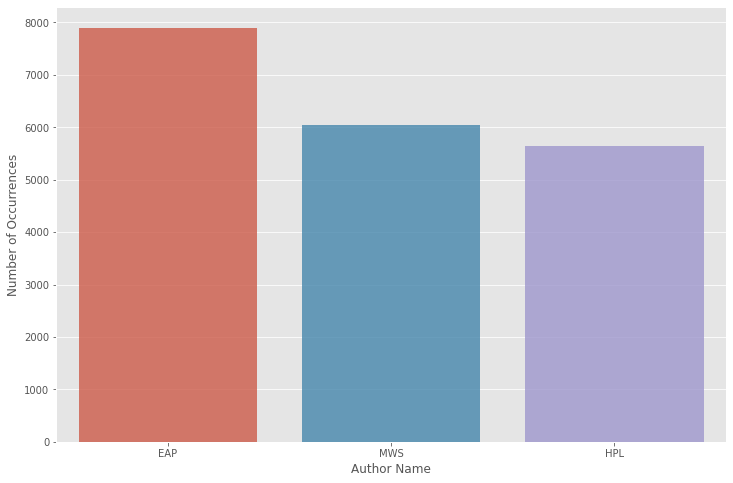

In [ ]:
spooky_authors = spooky_df['author'].value_counts()

sb.barplot(spooky_authors.index, spooky_authors.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Author Name', fontsize=12)
plt.show()

The bar chart seems to show a slight imbalance.

Let's print some texts by each author.

**Edgar Allan Poe**

In [ ]:
for text in spooky_df[spooky_df['author']=='EAP']['text'][:10].values:
    print(text)
    print('—')

This process, however, afforded me no means of ascertaining the dimensions of my dungeon; as I might make its circuit, and return to the point whence I set out, without being aware of the fact; so perfectly uniform seemed the wall.
—
In his left hand was a gold snuff box, from which, as he capered down the hill, cutting all manner of fantastic steps, he took snuff incessantly with an air of the greatest possible self satisfaction.
—
The astronomer, perhaps, at this point, took refuge in the suggestion of non luminosity; and here analogy was suddenly let fall.
—
The surcingle hung in ribands from my body.
—
I knew that you could not say to yourself 'stereotomy' without being brought to think of atomies, and thus of the theories of Epicurus; and since, when we discussed this subject not very long ago, I mentioned to you how singularly, yet with how little notice, the vague guesses of that noble Greek had met with confirmation in the late nebular cosmogony, I felt that you could not avoid

**H.P. Lovecraft**

In [ ]:
for text in spooky_df[spooky_df['author']=='HPL']['text'][:10].values:
    print(text)
    print('—')

It never once occurred to me that the fumbling might be a mere mistake.
—
Finding nothing else, not even gold, the Superintendent abandoned his attempts; but a perplexed look occasionally steals over his countenance as he sits thinking at his desk.
—
Herbert West needed fresh bodies because his life work was the reanimation of the dead.
—
The farm like grounds extended back very deeply up the hill, almost to Wheaton Street.
—
His facial aspect, too, was remarkable for its maturity; for though he shared his mother's and grandfather's chinlessness, his firm and precociously shaped nose united with the expression of his large, dark, almost Latin eyes to give him an air of quasi adulthood and well nigh preternatural intelligence.
—
It was not that the sounds were hideous, for they were not; but that they held vibrations suggesting nothing on this globe of earth, and that at certain intervals they assumed a symphonic quality which I could hardly conceive as produced by one player.
—
Our com

**Mary Wollstone Shelley**

In [ ]:
for text in spooky_df[spooky_df['author']=='MWS']['text'][:10].values:
    print(text)
    print('—')

How lovely is spring As we looked from Windsor Terrace on the sixteen fertile counties spread beneath, speckled by happy cottages and wealthier towns, all looked as in former years, heart cheering and fair.
—
A youth passed in solitude, my best years spent under your gentle and feminine fosterage, has so refined the groundwork of my character that I cannot overcome an intense distaste to the usual brutality exercised on board ship: I have never believed it to be necessary, and when I heard of a mariner equally noted for his kindliness of heart and the respect and obedience paid to him by his crew, I felt myself peculiarly fortunate in being able to secure his services.
—
I confess that neither the structure of languages, nor the code of governments, nor the politics of various states possessed attractions for me.
—
He shall find that I can feel my injuries; he shall learn to dread my revenge" A few days after he arrived.
—
He had escaped me, and I must commence a destructive and almost

Seeing sample writings by each author is helpful—we can see even small things that can make an author's identity. For instance, the authors use different punctuations quite often in each of these 10 samples. H.P. Lovecraft, particularly, likes using commas to vividly describe something or to enumerate a list. Edgar Allan Poe also tends to write in a first-person perspective, while Mary Shelley does so in a third-person perspective—often using pronouns more than names.

Well, those are just observations from a sample of 10 from each writer. We saw from the plot earlier that there are thousands of texts for each writer. Can we successfully classify the texts to their respective author? Unlikely when we do it manually, but machine learning can be a key.

## Preprocessing

Before we start classifying, we must first do some preprocessing so that we have our input features in a format that is expected by the model. Additionally, it can also make our model more accurate by either removing or highlighting certain features.

### Relabeling Classes

Encode labels into numbers instead of strings because this is an expected format by our models.

In [ ]:
from sklearn import preprocessing

In [ ]:
label_enc = preprocessing.LabelEncoder()
label_enc.fit(spooky_df["author"])

LabelEncoder()

In [ ]:
print(dict(zip(label_enc.classes_,label_enc.transform(label_enc.classes_))))

{'EAP': 0, 'HPL': 1, 'MWS': 2}


Above, it can be seen that the previous labels—the authors—are replaced by numbers. Rewrite the DataFrame's `author` column for it to show the numbers instead.

In [ ]:
spooky_df["author"] = label_enc.transform(spooky_df["author"])

spooky_df.head()

,id,text,author
0,id26305,"This process, however, afforded me no means of...",0
1,id17569,It never once occurred to me that the fumbling...,1
2,id11008,"In his left hand was a gold snuff box, from wh...",0
3,id27763,How lovely is spring As we looked from Windsor...,2
4,id12958,"Finding nothing else, not even gold, the Super...",1


Now, we can separate our features (X) from our labels (y).

In [ ]:
X = spooky_df["text"]
y = spooky_df["author"]

### Removing Contractions

Firstly, what are contractions?

Contractions are "shortened" forms of two words. For example,

1.   Won't = Will not
2.   They're = They are
3.   Ain't = ???

Well, you get the point. We will also try removing other words with apostrophe, such as possessive nouns and "shortcuts" (e.g., baggin', dancin'). Let's try separating these contractions. First, let's print some sentences that have these words.

In [ ]:
print(X[319])
print('—')
print(X[336])
print('—')
print(X[363])
print('—')
print(X[492])

Past the churchyard, where there were no houses, I could see over the hill's summit and watch the glimmer of stars on the harbour, though the town was invisible in the dark.
—
He knew things he didn't dare put into that stupid Magnalia or that puerile Wonders of the Invisible World.
—
Trade fallin' off, mills losin' business even the new ones an' the best of our menfolks kilt a privateerin' in the War of or lost with the Elizy brig an' the Ranger snow both of 'em Gilman venters.
—
Then came the frenzied tones again: "Carter, it's terrible monstrous unbelievable" This time my voice did not fail me, and I poured into the transmitter a flood of excited questions.


The first sentence has the word `hill's`. Second, `didn't`. Third, `fallin'`. Lastly, `it's`.

Next we install the `contractions` library, which allows us to edit sentences so that they will not contain a certain set of contractions. For now, it will be commented.

In [ ]:
!pip install contractions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import contractions

X = X.map(lambda x: contractions.fix(x))

Did it work? Let's print the sentences we saw before that had contractions.

In [ ]:
print(X[319])
print('—')
print(X[336])
print('—')
print(X[363])
print('—')
print(X[492])

Past the churchyard, where there were no houses, I could see over the hill's summit and watch the glimmer of stars on the harbour, though the town was invisible in the dark.
—
He knew things he did not dare put into that stupid Magnalia or that puerile Wonders of the Invisible World.
—
Trade fallin' off, mills losin' business even the new ones an' the best of our menfolks kilt a privateerin' in the War of or lost with the Elizy brig an' the Ranger snow both of them Gilman venters.
—
Then came the frenzied tones again: "Carter, it is terrible monstrous unbelievable" This time my voice did not fail me, and I poured into the transmitter a flood of excited questions.


So it worked on standard contractions, but not on possesive nouns and words ending with `n'`. We can include those later when we start vectorizing.

### Data Splitting

Split the dataset into train, validation, and test datasets. Here, we use sklearn's `train_test_split` and stratify it to `y` so that the labels ratio on the train data and validation data are more or less equal, especially considering that our data is not balanced.

In [ ]:
from sklearn.model_selection import train_test_split

This is where the number of instances we got earlier can be useful. While there is no standard ratio between train, validation, and test sets, there are [good practices](https://www.v7labs.com/blog/train-validation-test-set). Let's try getting as close as possible to the recommended splitting.

For now, let's try allotting 20% each to the validation and test sets.

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=31)

print(X.shape)
print(y.shape)
print(X_train_val.shape)
print(y_train_val.shape)
print(X_test.shape)
print(y_test.shape)

(19579,)
(19579,)
(15663,)
(15663,)
(3916,)
(3916,)


Next, let's split our `train_val` dataframe. Since we want 20% of the **original** size, the validation size must equal to 20% of the original dataset's size. We can just do this by splitting the train and test by 60-40, and then splitting the test and val by 50-50, but this is a good simulation as to how it would normally work since one would not be able to access the test labels and would have to validate from a train set's portion.

Let's get the percentage of the `X_test` to our `X_train_val`

In [ ]:
len(X_test.index) / len(X_train_val.index)

0.2500159611824044

Great, now we can split! Again, we stratify to our labels for consistency.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, stratify=y_train_val, random_state=31)

print(X_train.shape)
print(X_val.shape)

(11747,)
(3916,)


### Vectorization

Extract each word from all `text` by calling TfidfVectorizer and fitting it into the X_train. Initially, we wanted to remove the few-occurring words by using `min_df`, but these few words can be what defines an author. `max_df`, which removes the words that occur too often, also did not improve validation performance.

Now, each author has their own writing style. One of the factors that separates one writing style from another is usage of punctuation. Certain authors may use commas excessively and there are also a few who use dashes (and it has three types!). Let's use `token_pattern` to include punctuations since TfidfVectorizer removes punctuations by default. We can also include the possessive nouns and words ending with `n'` that we were not able to fix earlier.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(token_pattern=r"(?u)\b\w\w+\b|!|\?|\,|\—|\–|\-|\;|\.|\'s|\n'|",
                        ngram_range=(1, 3), sublinear_tf=True)

X_train_tfidf = tfidf.fit_transform(X_train)
X_train_tfidf.shape

(11747, 254571)

Do the same for the validation and test datasets, but do not fit in order to keep the model from learning from other datasets.

In [ ]:
X_val_tfidf = tfidf.transform(X_val)
X_train_val_tfidf = tfidf.transform(X_train_val)
X_test_tfidf = tfidf.transform(X_test)

In [ ]:
print(tfidf.get_feature_names_out()[150000:])

['laconic  answers' 'laconic ,' 'laconic , ' ... 'υπνος' 'υπνος .'
 'υπνος . ']


## Functions that will be needed later

We will need a way to know if our model accurate or not. Let's create a function that accepts our model's predictions and the actual labels, so that they can be compared.

In [ ]:
def compute_accuracy(predictions, actual):
    return (np.sum(predictions == actual) / len(actual)) * 100

## Naïve Bayes

### Training the Model

After preprocessing the data, the model can now be trained. A multinomial Naïve Bayes will be used since (1) Naïve Bayes is popularly regarded as a simple model for text classification and (2) there are three classes in this dataset, namely EAP, HPL, and MWS.

In [ ]:
from sklearn.naive_bayes import MultinomialNB
spooky_nb = MultinomialNB()

Fit the model to the *training* data. Remember that the model must learn from the training data, tune hyperparameters with the validation data, and use it on the test data to check model accuracy.

In [ ]:
spooky_nb.fit(X_train_tfidf, y_train)

MultinomialNB()

Get the model's predictions and compute its accuracy.

In [ ]:
predictions = spooky_nb.predict(X_train_tfidf)
print("Training accuracy: ", compute_accuracy(predictions, y_train), "%")

Training accuracy:  89.12062654294714 %


### Hyperparameter Tuning

Here, we test using different parameters for `MultinomialNB()`. This can easily be done using `ParameterGrid()`

In [ ]:
from sklearn.model_selection import ParameterGrid

Get the model's parameters so that we know what values to adjust.

In [ ]:
spooky_nb = MultinomialNB()
spooky_nb.get_params()

{'alpha': 1.0, 'class_prior': None, 'fit_prior': True}

For now, we will play around the `alpha` and `fit_prior` values

In [ ]:
hyperparameters = [{
    'alpha': [1, 3, 5, 10],
    'fit_prior': [True, False]
}]

Now, for every hyperparameter value, we will fit the new model to the train data and then predict it on our validation data. We will keep track of the validation accuracies, so that we know the best hyperparameters to get the best model.

In [ ]:
# best_score = 0
# for g in ParameterGrid(hyperparameters):
#     print(g)

#     spooky_nb.set_params(**g)

#     spooky_nb.fit(X_train_tfidf, y_train)
#     predictions = spooky_nb.predict(X_train_tfidf)
#     train_acc = compute_accuracy(predictions, y_train)

#     predictions = spooky_nb.predict(X_val_tfidf)
#     val_acc = compute_accuracy(predictions, y_val)

#     print(f"Train acc: {train_acc}% \t Val acc: {val_acc}%", end="\n\n")

#     if val_acc > best_score:
#         best_score = val_acc
#         best_grid = g

# print("Best accuracy: ", best_score, "%")
# print("Best grid: ", best_grid)

Now we know the best hyperparameters. We can create a new model based on these values and this time, fit it on the *entire* train dataset.

In [ ]:
spooky_nb = MultinomialNB(alpha=1, fit_prior=False)
spooky_nb.fit(X_train_val_tfidf, y_train_val)

MultinomialNB(alpha=1, fit_prior=False)

Finally, let's try predicting the labels on our entire train dataset.

In [ ]:
predictions = spooky_nb.predict(X_train_val_tfidf)
compute_accuracy(predictions, y_train_val)

91.75764540637171

### Testing the Model

In [ ]:
predictions_nb = spooky_nb.predict(X_test_tfidf)
print('Test accuracy: ', compute_accuracy(predictions_nb, y_test), '%')

Test accuracy:  79.74974463738509 %


So that's the Naïve Bayes model done. Let's try another model namely, SGDClassifier.

## SGDClassifier

So, why SGDClassifier? The model is basically a model with integrated regularization. It can be either a linear support vector machine (SVM) or a logistic regression depending on the hyperparameters, but the primary interest here is how it implement stochastic gradient descent—a regularization method. ([reference](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html))

### Training the Model

Again, we train the new model by fitting it to our train set.

In [ ]:
from sklearn.linear_model import SGDClassifier

spooky_sgd = SGDClassifier()
spooky_sgd.fit(X_train_tfidf, y_train)

SGDClassifier()

In [ ]:
predictions = spooky_sgd.predict(X_train_tfidf)
compute_accuracy(predictions, y_train)

98.79969353877586

Our initial train accuracy actually seems pretty high! Still, let's tune our hyperparameters to alleviate any worries.

### Hyperparameter Tuning

Instead of using Parameter Grid like we did in the Naïve Bayes section, we will be using `RandomizedSearchCV`. Unlike Parameter Grid which tries out all possible combinations, RandomizedSearchCV tries to combine varying hyperparameters *randomly*. Relatively, random searches have been proven to yield better results since Parameter Grid is restricted to the hyperparameters you stated, while RandomizedSearchCV can go beyond that and achieve the actual best results that otherwise cannot be attained.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

Again, we get the hyperparameters of the model by calling `get_params`

In [ ]:
spooky_sgd.get_params()

{'alpha': 0.0001,
 'average': False,
 'class_weight': None,
 'early_stopping': False,
 'epsilon': 0.1,
 'eta0': 0.0,
 'fit_intercept': True,
 'l1_ratio': 0.15,
 'learning_rate': 'optimal',
 'loss': 'hinge',
 'max_iter': 1000,
 'n_iter_no_change': 5,
 'n_jobs': None,
 'penalty': 'l2',
 'power_t': 0.5,
 'random_state': None,
 'shuffle': True,
 'tol': 0.001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

Now, before we go through hyperparameter tuning, there are a few things you need to know.

**TL;DR: we found out that certain hyperparameters caused overfitting and others caused underfitting. These were removed from further hyperparameter tuning to save time**

***

We used ParameterGrid first before using RandomizedSearchCV. As you can see in the Naïve Bayes section, we can see how the model behaves depending on the hyperparameters' values. As such, we were able to see which values caused overfitting or underfitting. We cut them off so that future hyperparameter tuning execution will be much shorter without sacrificing performance.

That having been said, the current hyperparameters to be considered below **were not** our first set of hyperparameters To be exact, this was the first set of hyperparameters we used RandomizedSearchCV on:

```
hyperparameters = [{
    'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
    'penalty': ['l1', 'l2', 'elasticnet'],    
    'alpha': [1e-5, 1e-4, 1e-3, 1e-2, 0.1, 1],
    'max_iter': [int(x) for x in np.linspace(1000, 10000, num = 19)],    
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'eta0': [1, 10, 100],
    'random_state': [42]
}]
```

Let's discuss a few of these values. Firstly, certain hyperparameter values such as:
```
loss='perceptron', 'modified_huber', 'squared_hinge'
alpha<=1e-5
```

Resulted in **overfitting**. Training accuracies were abnormally high—sometimes even reaching 100%. But the validation accuracy was not as stellar.

The perceptron loss function for example tend to overfit when we have a *large* dataset, as compared to the standard that large train sets lead to less overfitting. This is because perceptron is highly sensitive to noise. Checking the dataset, I was not able to clean certain texts—and this led to overfitting. [reference](https://stats.stackexchange.com/questions/95896/perceptron-overfitting)

Really low values of alpha also leads to overfitting. alpha is directly proportional to how much regularization will occur, and so as it approaches zero it would also essentially remove regularization. [reference](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html)

Others, on the other hand:
```
alpha>=1e-2
eta0>=100
```

Resulted in **underfitting**, and barely learned from the training set. This also led to lower test accuracies. Here, we regularize too much with high `alpha` values. When `eta0`, our learning rate, is too high, we are training on less epochs. As a result, we learn less as well from the train data. [reference](https://machinelearningmastery.com/understand-the-dynamics-of-learning-rate-on-deep-learning-neural-networks/)

Lastly, there were hyperparameters such as `max_iter` that resulted in insignificant changes—often changing accuracies by less than 1% and sometimes even less than 0.1%. These were omitted for better execution time.

Now, let's tune.

In [ ]:
hyperparameters = [{
    'loss': ['hinge', 'log'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'alpha': [1e-7, 1e-6, 1e-5, 1e-4, 1e-3],
    'learning_rate': ['optimal', 'constant', 'adaptive'],
    'eta0': [1e-5, 1e-4, 1e-3, 1e-2, 1e-2, 1e-1],
    'verbose': [1, 0],
    'random_state': [31]
}]

Note that we fit on the whole train set, and not the one split into train and validation. This is because RandomizedSearchCV does not require a validation set—it automatically takes the best parameters regardless without much overfitting since does the splitting by itself, compared to if we were to just test it using Parameter Grid—in which case a separate validation set would be required.

**This portion will take a *long* time. It is recommended to run this in a Google Colab notebook, so for now it will be commented.**

In [ ]:
rsr = RandomizedSearchCV(spooky_sgd, hyperparameters, n_iter=200, cv=5, random_state=31)
rsr.fit(X_train_val_tfidf, y_train_val)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 8.98, NNZs: 224084, Bias: -0.328984, T: 12530, Avg. loss: 0.602278
Total training time: 0.12 seconds.
-- Epoch 2
Norm: 8.96, NNZs: 224084, Bias: -0.335912, T: 25060, Avg. loss: 0.588571
Total training time: 0.20 seconds.
-- Epoch 3
Norm: 8.94, NNZs: 224084, Bias: -0.346231, T: 37590, Avg. loss: 0.586664
Total training time: 0.30 seconds.
-- Epoch 4
Norm: 8.94, NNZs: 224084, Bias: -0.358443, T: 50120, Avg. loss: 0.585986
Total training time: 0.39 seconds.
-- Epoch 5
Norm: 8.93, NNZs: 224084, Bias: -0.356745, T: 62650, Avg. loss: 0.585548
Total training time: 0.49 seconds.
-- Epoch 6
Norm: 8.93, NNZs: 224084, Bias: -0.359587, T: 75180, Avg. loss: 0.585301
Total training time: 0.54 seconds.
-- Epoch 7
Norm: 8.92, NNZs: 224084, Bias: -0.360589, T: 87710, Avg. loss: 0.585144
Total training time: 0.58 seconds.
-- Epoch 8
Norm: 8.92, NNZs: 224084, Bias: -0.364112, T: 100240, Avg. loss: 0.584978
Total training time: 0.61 seconds.
Convergence after 8 epochs took 0.61 seconds
--

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.93, NNZs: 222712, Bias: -0.325994, T: 25060, Avg. loss: 0.589484
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 8.92, NNZs: 222712, Bias: -0.339861, T: 37590, Avg. loss: 0.587432
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 8.91, NNZs: 222712, Bias: -0.350104, T: 50120, Avg. loss: 0.586781
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 8.91, NNZs: 222712, Bias: -0.350341, T: 62650, Avg. loss: 0.586286
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 8.90, NNZs: 222712, Bias: -0.355105, T: 75180, Avg. loss: 0.585978
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 8.90, NNZs: 222712, Bias: -0.355595, T: 87710, Avg. loss: 0.585873
Total training time: 0.29 seconds.
-- Epoch 8
Norm: 8.90, NNZs: 222712, Bias: -0.358613, T: 100240, Avg. loss: 0.585674
Total training time: 0.36 seconds.
Convergence after 8 epochs took 0.36 seconds
-- Epoch 1
Norm: 8.53, NNZs: 222712, Bias: -0.680244, T: 12530, Avg. loss: 0.536215
Total training time: 0.08 seconds.
-- Epoch 2
No

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 9.00, NNZs: 224281, Bias: -0.336944, T: 12530, Avg. loss: 0.600966
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 8.99, NNZs: 224281, Bias: -0.337031, T: 25060, Avg. loss: 0.588132
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 8.97, NNZs: 224281, Bias: -0.344605, T: 37590, Avg. loss: 0.586010
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 8.97, NNZs: 224281, Bias: -0.353761, T: 50120, Avg. loss: 0.585415
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 8.96, NNZs: 224281, Bias: -0.358373, T: 62650, Avg. loss: 0.584951
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 8.96, NNZs: 224281, Bias: -0.360920, T: 75180, Avg. loss: 0.584559
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 8.95, NNZs: 224281, Bias: -0.361518, T: 87710, Avg. loss: 0.584556
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 8.95, NNZs: 224281, Bias: -0.363032, T: 100240, Avg. loss: 0.584368
Total training time: 0.35 seconds.
Convergence after 8 epochs took 0.35 seconds
-- Epoch 1
No

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.98, NNZs: 224650, Bias: -0.357400, T: 25062, Avg. loss: 0.587451
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 8.98, NNZs: 224650, Bias: -0.366229, T: 37593, Avg. loss: 0.586180
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 8.97, NNZs: 224650, Bias: -0.365693, T: 50124, Avg. loss: 0.585355
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 8.96, NNZs: 224650, Bias: -0.366554, T: 62655, Avg. loss: 0.585020
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 8.96, NNZs: 224650, Bias: -0.370280, T: 75186, Avg. loss: 0.584650
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 8.96, NNZs: 224650, Bias: -0.371463, T: 87717, Avg. loss: 0.584453
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 8.95, NNZs: 224650, Bias: -0.370752, T: 100248, Avg. loss: 0.584338
Total training time: 0.19 seconds.
Convergence after 8 epochs took 0.19 seconds
-- Epoch 1
Norm: 8.55, NNZs: 224650, Bias: -0.729073, T: 12531, Avg. loss: 0.536306
Total training time: 0.02 seconds.
-- Epoch 2
No

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.93, NNZs: 225004, Bias: -0.360478, T: 37593, Avg. loss: 0.586982
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 8.92, NNZs: 225004, Bias: -0.360156, T: 50124, Avg. loss: 0.586218
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 8.92, NNZs: 225004, Bias: -0.365609, T: 62655, Avg. loss: 0.585772
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 8.91, NNZs: 225004, Bias: -0.369316, T: 75186, Avg. loss: 0.585487
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 8.91, NNZs: 225004, Bias: -0.370480, T: 87717, Avg. loss: 0.585274
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 8.91, NNZs: 225004, Bias: -0.370644, T: 100248, Avg. loss: 0.585189
Total training time: 0.21 seconds.
Convergence after 8 epochs took 0.21 seconds
-- Epoch 1
Norm: 8.52, NNZs: 225004, Bias: -0.707854, T: 12531, Avg. loss: 0.538630
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 8.44, NNZs: 225004, Bias: -0.718688, T: 25062, Avg. loss: 0.526240
Total training time: 0.06 seconds.
-- Epoch 3
No

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 17.82, NNZs: 29604, Bias: -0.166934, T: 25060, Avg. loss: 0.562618
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 22.52, NNZs: 24811, Bias: -0.217621, T: 37590, Avg. loss: 0.529785
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 26.06, NNZs: 22856, Bias: -0.264062, T: 50120, Avg. loss: 0.508740
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 28.77, NNZs: 21570, Bias: -0.269816, T: 62650, Avg. loss: 0.494335
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 30.93, NNZs: 20568, Bias: -0.295537, T: 75180, Avg. loss: 0.483810
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 32.66, NNZs: 19874, Bias: -0.306261, T: 87710, Avg. loss: 0.475880
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 34.08, NNZs: 19425, Bias: -0.342752, T: 100240, Avg. loss: 0.469869
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 35.24, NNZs: 18878, Bias: -0.355843, T: 112770, Avg. loss: 0.464932
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 36.20, NNZs: 18504, Bias: -0.379316, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 11.12, NNZs: 78853, Bias: -0.161520, T: 12530, Avg. loss: 0.628511
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 17.81, NNZs: 29377, Bias: -0.162282, T: 25060, Avg. loss: 0.563399
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 22.53, NNZs: 24722, Bias: -0.215721, T: 37590, Avg. loss: 0.530368
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 26.08, NNZs: 22743, Bias: -0.253473, T: 50120, Avg. loss: 0.509290
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 28.82, NNZs: 21402, Bias: -0.259152, T: 62650, Avg. loss: 0.494633
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 30.99, NNZs: 20471, Bias: -0.298312, T: 75180, Avg. loss: 0.484011
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 32.75, NNZs: 19777, Bias: -0.299983, T: 87710, Avg. loss: 0.476101
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 34.17, NNZs: 19232, Bias: -0.339302, T: 100240, Avg. loss: 0.469853
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 35.36, NNZs: 18829, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 26.17, NNZs: 22679, Bias: -0.256581, T: 50120, Avg. loss: 0.507228
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 28.91, NNZs: 21560, Bias: -0.276476, T: 62650, Avg. loss: 0.492670
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 31.05, NNZs: 20528, Bias: -0.300770, T: 75180, Avg. loss: 0.481951
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 32.81, NNZs: 19863, Bias: -0.305994, T: 87710, Avg. loss: 0.474248
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 34.22, NNZs: 19323, Bias: -0.331459, T: 100240, Avg. loss: 0.467995
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 35.39, NNZs: 18838, Bias: -0.340290, T: 112770, Avg. loss: 0.463160
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 36.35, NNZs: 18432, Bias: -0.347783, T: 125300, Avg. loss: 0.459236
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 37.15, NNZs: 18135, Bias: -0.369611, T: 137830, Avg. loss: 0.456285
Total training time: 0.50 seconds.
-- Epoch 12
Norm: 37.83, NNZs: 17884, Bias: -0.374889

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 22.66, NNZs: 24560, Bias: -0.230814, T: 37593, Avg. loss: 0.528360
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 26.19, NNZs: 22443, Bias: -0.250706, T: 50124, Avg. loss: 0.507086
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 28.93, NNZs: 21271, Bias: -0.264605, T: 62655, Avg. loss: 0.492544
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 31.10, NNZs: 20420, Bias: -0.297772, T: 75186, Avg. loss: 0.481796
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 32.83, NNZs: 19632, Bias: -0.317392, T: 87717, Avg. loss: 0.473771
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 34.25, NNZs: 19071, Bias: -0.324033, T: 100248, Avg. loss: 0.467830
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 35.41, NNZs: 18546, Bias: -0.342327, T: 112779, Avg. loss: 0.462972
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 36.35, NNZs: 18167, Bias: -0.363268, T: 125310, Avg. loss: 0.459085
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 37.15, NNZs: 17867, Bias: -0.387839, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 17.80, NNZs: 29195, Bias: -0.185416, T: 25062, Avg. loss: 0.562922
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 22.48, NNZs: 24660, Bias: -0.222027, T: 37593, Avg. loss: 0.530481
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 25.98, NNZs: 22639, Bias: -0.235853, T: 50124, Avg. loss: 0.509547
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 28.70, NNZs: 21449, Bias: -0.270453, T: 62655, Avg. loss: 0.495205
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 30.86, NNZs: 20524, Bias: -0.300244, T: 75186, Avg. loss: 0.484603
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 32.59, NNZs: 19812, Bias: -0.319040, T: 87717, Avg. loss: 0.476629
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 34.01, NNZs: 19321, Bias: -0.333258, T: 100248, Avg. loss: 0.470736
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 35.17, NNZs: 18861, Bias: -0.355977, T: 112779, Avg. loss: 0.465915
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 36.10, NNZs: 18490, Bias: -0.368465, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.63, NNZs: 202483, Bias: -0.664307, T: 25060, Avg. loss: 0.613098
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 14.63, NNZs: 204265, Bias: -0.698700, T: 37590, Avg. loss: 0.606138
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 14.62, NNZs: 204728, Bias: -0.707095, T: 50120, Avg. loss: 0.601837
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 14.60, NNZs: 204825, Bias: -0.706303, T: 62650, Avg. loss: 0.600781
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 14.59, NNZs: 204890, Bias: -0.710362, T: 75180, Avg. loss: 0.599370
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 14.58, NNZs: 204914, Bias: -0.710328, T: 87710, Avg. loss: 0.598698
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 14.58, NNZs: 204964, Bias: -0.717496, T: 100240, Avg. loss: 0.597785
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 14.57, NNZs: 204964, Bias: -0.718318, T: 112770, Avg. loss: 0.597508
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 14.57, NNZs: 204976, Bias: -0.7

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.73, NNZs: 194351, Bias: -0.654256, T: 12530, Avg. loss: 0.661252
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.58, NNZs: 200864, Bias: -0.651676, T: 25060, Avg. loss: 0.616439
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 14.59, NNZs: 202429, Bias: -0.686898, T: 37590, Avg. loss: 0.608086
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 14.57, NNZs: 202859, Bias: -0.695246, T: 50120, Avg. loss: 0.604340
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 14.55, NNZs: 202938, Bias: -0.696935, T: 62650, Avg. loss: 0.602885
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 14.55, NNZs: 203048, Bias: -0.704029, T: 75180, Avg. loss: 0.601143
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 14.53, NNZs: 203141, Bias: -0.702631, T: 87710, Avg. loss: 0.600792
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 14.54, NNZs: 203151, Bias: -0.710425, T: 100240, Avg. loss: 0.599856
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 14.53, NNZs: 203151, Bias: -0.711

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.68, NNZs: 204668, Bias: -0.707228, T: 87710, Avg. loss: 0.595774
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 14.68, NNZs: 204702, Bias: -0.712125, T: 100240, Avg. loss: 0.595137
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 14.67, NNZs: 204726, Bias: -0.712536, T: 112770, Avg. loss: 0.594723
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 14.67, NNZs: 204726, Bias: -0.715298, T: 125300, Avg. loss: 0.594518
Total training time: 0.22 seconds.
-- Epoch 11
Norm: 14.67, NNZs: 204745, Bias: -0.716934, T: 137830, Avg. loss: 0.594053
Total training time: 0.23 seconds.
Convergence after 11 epochs took 0.23 seconds
-- Epoch 1
Norm: 10.20, NNZs: 167646, Bias: -0.793732, T: 12530, Avg. loss: 0.523125
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.91, NNZs: 180711, Bias: -0.801292, T: 25060, Avg. loss: 0.494454
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 9.85, NNZs: 184237, Bias: -0.813081, T: 37590, Avg. loss: 0.489042
Total training time: 0.07 seconds.
-

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.70, NNZs: 204372, Bias: -0.719931, T: 37593, Avg. loss: 0.603269
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 14.67, NNZs: 204878, Bias: -0.722925, T: 50124, Avg. loss: 0.599921
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 14.65, NNZs: 204981, Bias: -0.718844, T: 62655, Avg. loss: 0.598638
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 14.65, NNZs: 205046, Bias: -0.724014, T: 75186, Avg. loss: 0.596786
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 14.64, NNZs: 205143, Bias: -0.725536, T: 87717, Avg. loss: 0.595991
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 14.64, NNZs: 205204, Bias: -0.725098, T: 100248, Avg. loss: 0.595665
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 14.64, NNZs: 205236, Bias: -0.729123, T: 112779, Avg. loss: 0.595174
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 14.63, NNZs: 205246, Bias: -0.728804, T: 125310, Avg. loss: 0.594678
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 14.63, NNZs: 205257, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.58, NNZs: 202874, Bias: -0.700505, T: 25062, Avg. loss: 0.612674
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 14.56, NNZs: 204228, Bias: -0.711770, T: 37593, Avg. loss: 0.606980
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 14.54, NNZs: 204590, Bias: -0.713109, T: 50124, Avg. loss: 0.603897
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 14.53, NNZs: 204857, Bias: -0.718958, T: 62655, Avg. loss: 0.601628
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 14.53, NNZs: 205055, Bias: -0.722158, T: 75186, Avg. loss: 0.600142
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 14.52, NNZs: 205061, Bias: -0.724241, T: 87717, Avg. loss: 0.599372
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 14.52, NNZs: 205083, Bias: -0.724724, T: 100248, Avg. loss: 0.599024
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 14.52, NNZs: 205083, Bias: -0.728213, T: 112779, Avg. loss: 0.598577
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 14.51, NNZs: 205101, Bias: -0.7

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 154713, Bias: -0.000242, T: 12530, Avg. loss: 0.999900
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 109377, Bias: -0.000484, T: 25060, Avg. loss: 0.999692
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 91429, Bias: -0.000725, T: 37590, Avg. loss: 0.999486
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 84596, Bias: -0.000967, T: 50120, Avg. loss: 0.999280
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 82060, Bias: -0.001209, T: 62650, Avg. loss: 0.999074
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 79828, Bias: -0.001451, T: 75180, Avg. loss: 0.998867
Total training time: 0.27 seconds.
Convergence after 6 epochs took 0.27 seconds
-- Epoch 1
Norm: 0.01, NNZs: 159662, Bias: -0.000532, T: 12530, Avg. loss: 0.999616
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 113046, Bias: -0.001064, T: 25060, Avg. loss: 0.998842
Total training time: 0.11 seconds.
-- Epoc

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 109171, Bias: -0.000484, T: 25060, Avg. loss: 0.999692
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 91160, Bias: -0.000725, T: 37590, Avg. loss: 0.999486
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 84663, Bias: -0.000967, T: 50120, Avg. loss: 0.999280
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 81841, Bias: -0.001209, T: 62650, Avg. loss: 0.999073
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 79749, Bias: -0.001451, T: 75180, Avg. loss: 0.998867
Total training time: 0.26 seconds.
Convergence after 6 epochs took 0.26 seconds
-- Epoch 1
Norm: 0.01, NNZs: 158741, Bias: -0.000532, T: 12530, Avg. loss: 0.999614
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 113086, Bias: -0.001064, T: 25060, Avg. loss: 0.998836
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.02, NNZs: 95539, Bias: -0.001595, T: 37590, Avg. loss: 0.998059
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 91037, Bias: -0.000725, T: 37590, Avg. loss: 0.999484
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 85136, Bias: -0.000967, T: 50120, Avg. loss: 0.999277
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 82083, Bias: -0.001209, T: 62650, Avg. loss: 0.999069
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 80200, Bias: -0.001451, T: 75180, Avg. loss: 0.998862
Total training time: 0.27 seconds.
Convergence after 6 epochs took 0.27 seconds
-- Epoch 1
Norm: 0.01, NNZs: 159190, Bias: -0.000532, T: 12530, Avg. loss: 0.999616
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 113308, Bias: -0.001064, T: 25060, Avg. loss: 0.998842
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.02, NNZs: 95821, Bias: -0.001595, T: 37590, Avg. loss: 0.998070
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.03, NNZs: 89552, Bias: -0.002127, T: 50120, Avg. loss: 0.997297
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 155167, Bias: -0.000242, T: 12531, Avg. loss: 0.999899
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 110064, Bias: -0.000484, T: 25062, Avg. loss: 0.999690
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 91909, Bias: -0.000726, T: 37593, Avg. loss: 0.999482
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 84936, Bias: -0.000968, T: 50124, Avg. loss: 0.999274
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 81966, Bias: -0.001209, T: 62655, Avg. loss: 0.999066
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 80159, Bias: -0.001451, T: 75186, Avg. loss: 0.998858
Total training time: 0.28 seconds.
Convergence after 6 epochs took 0.29 seconds
-- Epoch 1
Norm: 0.01, NNZs: 159798, Bias: -0.000532, T: 12531, Avg. loss: 0.999616
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 113405, Bias: -0.001063, T: 25062, Avg. loss: 0.998841
Total training time: 0.11 seconds.
-- Epoc

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 155364, Bias: -0.000242, T: 12531, Avg. loss: 0.999899
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 109858, Bias: -0.000484, T: 25062, Avg. loss: 0.999691
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 91667, Bias: -0.000726, T: 37593, Avg. loss: 0.999484
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 84930, Bias: -0.000968, T: 50124, Avg. loss: 0.999276
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 81760, Bias: -0.001209, T: 62655, Avg. loss: 0.999069
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 80016, Bias: -0.001451, T: 75186, Avg. loss: 0.998861
Total training time: 0.27 seconds.
Convergence after 6 epochs took 0.28 seconds
-- Epoch 1
Norm: 0.01, NNZs: 159404, Bias: -0.000532, T: 12531, Avg. loss: 0.999618
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 113880, Bias: -0.001063, T: 25062, Avg. loss: 0.998846
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.22, NNZs: 217751, Bias: -0.011506, T: 12530, Avg. loss: 0.690722
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.43, NNZs: 216469, Bias: -0.021935, T: 25060, Avg. loss: 0.686071
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.63, NNZs: 215911, Bias: -0.031381, T: 37590, Avg. loss: 0.681997
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.81, NNZs: 215965, Bias: -0.039993, T: 50120, Avg. loss: 0.678383
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.99, NNZs: 215640, Bias: -0.047770, T: 62650, Avg. loss: 0.675149
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 1.16, NNZs: 215330, Bias: -0.054843, T: 75180, Avg. loss: 0.672235
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 1.33, NNZs: 215320, Bias: -0.061250, T: 87710, Avg. loss: 0.669580
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 1.49, NNZs: 215323, Bias: -0.067112, T: 100240, Avg. loss: 0.667139
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 1.64, NNZs: 215313, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.43, NNZs: 214790, Bias: -0.021918, T: 25060, Avg. loss: 0.686072
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.63, NNZs: 214574, Bias: -0.031346, T: 37590, Avg. loss: 0.682009
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.81, NNZs: 214540, Bias: -0.039925, T: 50120, Avg. loss: 0.678409
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.99, NNZs: 214272, Bias: -0.047682, T: 62650, Avg. loss: 0.675191
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 1.16, NNZs: 213997, Bias: -0.054747, T: 75180, Avg. loss: 0.672292
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 1.33, NNZs: 213941, Bias: -0.061134, T: 87710, Avg. loss: 0.669653
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 1.48, NNZs: 213916, Bias: -0.066965, T: 100240, Avg. loss: 0.667230
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 1.64, NNZs: 213935, Bias: -0.072251, T: 112770, Avg. loss: 0.664984
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 1.79, NNZs: 213948, Bias: -0.077045, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.82, NNZs: 215772, Bias: -0.039943, T: 50120, Avg. loss: 0.678317
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 1.00, NNZs: 215440, Bias: -0.047739, T: 62650, Avg. loss: 0.675069
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 1.17, NNZs: 215368, Bias: -0.054817, T: 75180, Avg. loss: 0.672136
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 1.33, NNZs: 215305, Bias: -0.061229, T: 87710, Avg. loss: 0.669466
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 1.49, NNZs: 215227, Bias: -0.067059, T: 100240, Avg. loss: 0.667012
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 1.65, NNZs: 215304, Bias: -0.072358, T: 112770, Avg. loss: 0.664736
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 1.79, NNZs: 215267, Bias: -0.077150, T: 125300, Avg. loss: 0.662610
Total training time: 0.45 seconds.
-- Epoch 11
Norm: 1.94, NNZs: 215253, Bias: -0.081544, T: 137830, Avg. loss: 0.660608
Total training time: 0.48 seconds.
-- Epoch 12
Norm: 2.08, NNZs: 215257, Bias: -0.085538

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.43, NNZs: 217557, Bias: -0.021954, T: 25062, Avg. loss: 0.686009
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.63, NNZs: 216695, Bias: -0.031419, T: 37593, Avg. loss: 0.681899
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.82, NNZs: 216090, Bias: -0.039987, T: 50124, Avg. loss: 0.678259
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 1.00, NNZs: 216245, Bias: -0.047751, T: 62655, Avg. loss: 0.675008
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 1.17, NNZs: 216130, Bias: -0.054827, T: 75186, Avg. loss: 0.672072
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 1.34, NNZs: 215910, Bias: -0.061248, T: 87717, Avg. loss: 0.669396
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 1.49, NNZs: 215929, Bias: -0.067054, T: 100248, Avg. loss: 0.666940
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 1.65, NNZs: 216004, Bias: -0.072330, T: 112779, Avg. loss: 0.664665
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 1.80, NNZs: 215951, Bias: -0.077140, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.63, NNZs: 216730, Bias: -0.031416, T: 37593, Avg. loss: 0.681937
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.82, NNZs: 216408, Bias: -0.039970, T: 50124, Avg. loss: 0.678312
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 1.00, NNZs: 216504, Bias: -0.047755, T: 62655, Avg. loss: 0.675072
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 1.17, NNZs: 216440, Bias: -0.054842, T: 75186, Avg. loss: 0.672144
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1.33, NNZs: 216145, Bias: -0.061272, T: 87717, Avg. loss: 0.669477
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 1.49, NNZs: 216146, Bias: -0.067100, T: 100248, Avg. loss: 0.667029
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1.65, NNZs: 216118, Bias: -0.072401, T: 112779, Avg. loss: 0.664761
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 1.79, NNZs: 216128, Bias: -0.077204, T: 125310, Avg. loss: 0.662643
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 1.94, NNZs: 216090, Bias: -0.081595, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 926.08, NNZs: 224084, Bias: -2.736640, T: 12530, Avg. loss: 0.790180
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 787.69, NNZs: 224084, Bias: -1.841822, T: 25060, Avg. loss: 0.113652
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 656.72, NNZs: 224084, Bias: -1.921850, T: 37590, Avg. loss: 0.014452
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 563.73, NNZs: 224084, Bias: -1.801562, T: 50120, Avg. loss: 0.007866
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 498.07, NNZs: 224084, Bias: -1.640590, T: 62650, Avg. loss: 0.009445
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 450.68, NNZs: 224084, Bias: -1.587229, T: 75180, Avg. loss: 0.011747
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 415.80, NNZs: 224084, Bias: -1.518760, T: 87710, Avg. loss: 0.013835
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 389.81, NNZs: 224084, Bias: -1.508683, T: 100240, Avg. loss: 0.015824
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 370.23, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 911.28, NNZs: 222712, Bias: -1.825617, T: 12530, Avg. loss: 0.771909
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 777.02, NNZs: 222712, Bias: -1.615791, T: 25060, Avg. loss: 0.113511
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 649.34, NNZs: 222712, Bias: -1.637865, T: 37590, Avg. loss: 0.016322
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 557.76, NNZs: 222712, Bias: -1.561084, T: 50120, Avg. loss: 0.008189
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 493.00, NNZs: 222712, Bias: -1.472883, T: 62650, Avg. loss: 0.009460
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 446.37, NNZs: 222712, Bias: -1.443930, T: 75180, Avg. loss: 0.011814
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 412.14, NNZs: 222712, Bias: -1.388070, T: 87710, Avg. loss: 0.013917
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 386.70, NNZs: 222712, Bias: -1.384074, T: 100240, Avg. loss: 0.015877
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 367.56, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.17 seconds.
-- Epoch 8
Norm: 386.14, NNZs: 224281, Bias: -1.177040, T: 100240, Avg. loss: 0.015783
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 366.98, NNZs: 224281, Bias: -1.169387, T: 112770, Avg. loss: 0.017443
Total training time: 0.24 seconds.
Convergence after 9 epochs took 0.24 seconds
-- Epoch 1
Norm: 802.78, NNZs: 224281, Bias: 1.006166, T: 12530, Avg. loss: 0.550576
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 676.37, NNZs: 224281, Bias: 0.575030, T: 25060, Avg. loss: 0.063592
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 564.50, NNZs: 224281, Bias: 0.460589, T: 37590, Avg. loss: 0.011001
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 486.19, NNZs: 224281, Bias: 0.309202, T: 50120, Avg. loss: 0.007129
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 431.45, NNZs: 224281, Bias: 0.280261, T: 62650, Avg. loss: 0.008637
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 392.32, NNZs: 224281, Bias: 0.206804, T: 75180, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.10 seconds.
-- Epoch 4
Norm: 563.13, NNZs: 224650, Bias: -1.707991, T: 50124, Avg. loss: 0.008002
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 497.43, NNZs: 224650, Bias: -1.574827, T: 62655, Avg. loss: 0.009311
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 449.96, NNZs: 224650, Bias: -1.515537, T: 75186, Avg. loss: 0.011517
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 415.08, NNZs: 224650, Bias: -1.492272, T: 87717, Avg. loss: 0.013716
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 389.11, NNZs: 224650, Bias: -1.438810, T: 100248, Avg. loss: 0.015655
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 369.54, NNZs: 224650, Bias: -1.407747, T: 112779, Avg. loss: 0.017383
Total training time: 0.23 seconds.
Convergence after 9 epochs took 0.23 seconds
-- Epoch 1
Norm: 819.05, NNZs: 224650, Bias: 1.655127, T: 12531, Avg. loss: 0.569322
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 690.17, NNZs: 224650, Bias: 0.948595, T: 25062, Avg. l

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 654.90, NNZs: 225004, Bias: -1.986880, T: 37593, Avg. loss: 0.018020
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 562.26, NNZs: 225004, Bias: -1.847893, T: 50124, Avg. loss: 0.007981
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 496.79, NNZs: 225004, Bias: -1.730844, T: 62655, Avg. loss: 0.009420
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 449.55, NNZs: 225004, Bias: -1.695254, T: 75186, Avg. loss: 0.011703
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 414.85, NNZs: 225004, Bias: -1.647169, T: 87717, Avg. loss: 0.013882
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 389.05, NNZs: 225004, Bias: -1.622199, T: 100248, Avg. loss: 0.015883
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 369.65, NNZs: 225004, Bias: -1.564109, T: 112779, Avg. loss: 0.017641
Total training time: 0.20 seconds.
Convergence after 9 epochs took 0.21 seconds
-- Epoch 1
Norm: 826.56, NNZs: 225004, Bias: 1.522512, T: 12531, Avg. loss: 0.563139
Total training time: 0.02 second

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.56, NNZs: 1006, Bias: -0.809525, T: 25060, Avg. loss: 0.731925
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 10.95, NNZs: 1041, Bias: -0.842568, T: 37590, Avg. loss: 0.731483
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 10.63, NNZs: 1049, Bias: -0.855836, T: 50120, Avg. loss: 0.730131
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 10.42, NNZs: 1060, Bias: -0.852730, T: 62650, Avg. loss: 0.730496
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 10.28, NNZs: 1065, Bias: -0.860467, T: 75180, Avg. loss: 0.730086
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 10.18, NNZs: 1073, Bias: -0.861556, T: 87710, Avg. loss: 0.729906
Total training time: 0.29 seconds.
-- Epoch 8
Norm: 10.12, NNZs: 1083, Bias: -0.871651, T: 100240, Avg. loss: 0.729561
Total training time: 0.33 seconds.
-- Epoch 9
Norm: 10.06, NNZs: 1091, Bias: -0.873581, T: 112770, Avg. loss: 0.729530
Total training time: 0.37 seconds.
Convergence after 9 epochs took 0.37 seconds
-- Epoch 1
Norm: 8.7

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 13.23, NNZs: 4735, Bias: -0.797513, T: 12530, Avg. loss: 0.734903
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 11.40, NNZs: 1023, Bias: -0.804464, T: 25060, Avg. loss: 0.736150
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 10.78, NNZs: 1045, Bias: -0.842264, T: 37590, Avg. loss: 0.734969
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 10.44, NNZs: 1063, Bias: -0.851420, T: 50120, Avg. loss: 0.734117
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 10.22, NNZs: 1081, Bias: -0.854904, T: 62650, Avg. loss: 0.734102
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 10.09, NNZs: 1089, Bias: -0.867764, T: 75180, Avg. loss: 0.733332
Total training time: 0.25 seconds.
Convergence after 6 epochs took 0.25 seconds
-- Epoch 1
Norm: 8.88, NNZs: 3573, Bias: -0.880441, T: 12530, Avg. loss: 0.563521
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 6.87, NNZs: 610, Bias: -0.918086, T: 25060, Avg. loss: 0.563783
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 6.02, NN

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 10.73, NNZs: 1058, Bias: -0.847495, T: 50120, Avg. loss: 0.728963
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 10.52, NNZs: 1069, Bias: -0.855284, T: 62650, Avg. loss: 0.728752
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 10.39, NNZs: 1087, Bias: -0.861008, T: 75180, Avg. loss: 0.727993
Total training time: 0.26 seconds.
Convergence after 6 epochs took 0.26 seconds
-- Epoch 1
Norm: 8.89, NNZs: 3795, Bias: -0.881903, T: 12530, Avg. loss: 0.563060
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 6.84, NNZs: 579, Bias: -0.910220, T: 25060, Avg. loss: 0.564353
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 5.97, NNZs: 596, Bias: -0.927581, T: 37590, Avg. loss: 0.564438
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 5.47, NNZs: 606, Bias: -0.929071, T: 50120, Avg. loss: 0.564650
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 5.15, NNZs: 609, Bias: -0.936366, T: 62650, Avg. loss: 0.564766
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 4.91, NNZs: 61

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.62, NNZs: 1012, Bias: -0.839430, T: 25062, Avg. loss: 0.729420
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 11.02, NNZs: 1057, Bias: -0.865413, T: 37593, Avg. loss: 0.729786
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 10.69, NNZs: 1085, Bias: -0.874595, T: 50124, Avg. loss: 0.729061
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 10.49, NNZs: 1095, Bias: -0.875012, T: 62655, Avg. loss: 0.728814
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 10.36, NNZs: 1110, Bias: -0.882105, T: 75186, Avg. loss: 0.728152
Total training time: 0.25 seconds.
-- Epoch 7
Norm: 10.27, NNZs: 1117, Bias: -0.886832, T: 87717, Avg. loss: 0.727835
Total training time: 0.28 seconds.
Convergence after 7 epochs took 0.28 seconds
-- Epoch 1
Norm: 8.78, NNZs: 3221, Bias: -0.896066, T: 12531, Avg. loss: 0.566665
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 6.75, NNZs: 577, Bias: -0.918753, T: 25062, Avg. loss: 0.564941
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 5.91, NN

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 10.92, NNZs: 995, Bias: -0.852225, T: 37593, Avg. loss: 0.731554
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 10.59, NNZs: 1016, Bias: -0.860137, T: 50124, Avg. loss: 0.731003
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 10.40, NNZs: 1024, Bias: -0.867732, T: 62655, Avg. loss: 0.730027
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 10.27, NNZs: 1034, Bias: -0.876032, T: 75186, Avg. loss: 0.729633
Total training time: 0.24 seconds.
-- Epoch 7
Norm: 10.18, NNZs: 1044, Bias: -0.878194, T: 87717, Avg. loss: 0.729383
Total training time: 0.28 seconds.
Convergence after 7 epochs took 0.28 seconds
-- Epoch 1
Norm: 8.67, NNZs: 3261, Bias: -0.900843, T: 12531, Avg. loss: 0.568764
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 6.64, NNZs: 535, Bias: -0.921608, T: 25062, Avg. loss: 0.565950
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 5.80, NNZs: 547, Bias: -0.938927, T: 37593, Avg. loss: 0.565890
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 5.30, NNZs:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2279.07, NNZs: 224084, Bias: -6.037510, T: 12530, Avg. loss: 1.644457
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2388.19, NNZs: 224084, Bias: -3.304307, T: 25060, Avg. loss: 0.383105
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 2314.27, NNZs: 224084, Bias: -5.500950, T: 37590, Avg. loss: 0.064920
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 2202.24, NNZs: 224084, Bias: -3.939740, T: 50120, Avg. loss: 0.009796
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 2089.56, NNZs: 224084, Bias: -4.133262, T: 62650, Avg. loss: 0.001451
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 1986.43, NNZs: 224084, Bias: -3.884681, T: 75180, Avg. loss: 0.000229
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 1892.99, NNZs: 224084, Bias: -3.885128, T: 87710, Avg. loss: 0.000210
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 1808.03, NNZs: 224084, Bias: -3.792067, T: 100240, Avg. loss: 0.000229
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 1730.4

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2096.68, NNZs: 222712, Bias: -4.094154, T: 62650, Avg. loss: 0.001203
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 1993.21, NNZs: 222712, Bias: -3.902570, T: 75180, Avg. loss: 0.000250
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1899.48, NNZs: 222712, Bias: -3.875222, T: 87710, Avg. loss: 0.000236
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 1814.25, NNZs: 222712, Bias: -3.783106, T: 100240, Avg. loss: 0.000252
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 1736.41, NNZs: 222712, Bias: -3.755331, T: 112770, Avg. loss: 0.000272
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 1665.07, NNZs: 222712, Bias: -3.658165, T: 125300, Avg. loss: 0.000299
Total training time: 0.23 seconds.
Convergence after 10 epochs took 0.23 seconds
-- Epoch 1
Norm: 2002.56, NNZs: 222712, Bias: 0.695507, T: 12530, Avg. loss: 1.136826
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2084.77, NNZs: 222712, Bias: 2.366366, T: 25060, Avg. loss: 0.238848
Total training time: 0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2293.19, NNZs: 224281, Bias: -4.379116, T: 37590, Avg. loss: 0.062261
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 2183.93, NNZs: 224281, Bias: -3.847148, T: 50120, Avg. loss: 0.012430
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 2072.67, NNZs: 224281, Bias: -3.496687, T: 62650, Avg. loss: 0.001591
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 1970.40, NNZs: 224281, Bias: -3.389318, T: 75180, Avg. loss: 0.000287
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 1877.72, NNZs: 224281, Bias: -3.364451, T: 87710, Avg. loss: 0.000211
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 1793.45, NNZs: 224281, Bias: -3.273088, T: 100240, Avg. loss: 0.000226
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 1716.48, NNZs: 224281, Bias: -3.249237, T: 112770, Avg. loss: 0.000249
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 1645.92, NNZs: 224281, Bias: -3.210639, T: 125300, Avg. loss: 0.000273
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 1581.03, NNZs

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2266.40, NNZs: 224650, Bias: -2.292686, T: 12531, Avg. loss: 1.647202
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2395.81, NNZs: 224650, Bias: -3.243167, T: 25062, Avg. loss: 0.386858
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 2331.69, NNZs: 224650, Bias: -3.899506, T: 37593, Avg. loss: 0.079584
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 2217.46, NNZs: 224650, Bias: -3.639535, T: 50124, Avg. loss: 0.009393
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 2103.76, NNZs: 224650, Bias: -3.407859, T: 62655, Avg. loss: 0.001298
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 1999.88, NNZs: 224650, Bias: -3.428231, T: 75186, Avg. loss: 0.000250
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1905.81, NNZs: 224650, Bias: -3.364161, T: 87717, Avg. loss: 0.000211
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 1820.26, NNZs: 224650, Bias: -3.291195, T: 100248, Avg. loss: 0.000227
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 1742.12, NNZs: 22

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1984.57, NNZs: 225004, Bias: -5.395973, T: 75186, Avg. loss: 0.000295
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1891.27, NNZs: 225004, Bias: -5.275683, T: 87717, Avg. loss: 0.000231
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 1806.41, NNZs: 225004, Bias: -5.173456, T: 100248, Avg. loss: 0.000245
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 1728.92, NNZs: 225004, Bias: -5.078919, T: 112779, Avg. loss: 0.000266
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 1657.89, NNZs: 225004, Bias: -4.967021, T: 125310, Avg. loss: 0.000290
Total training time: 0.23 seconds.
-- Epoch 11
Norm: 1592.56, NNZs: 225004, Bias: -4.878301, T: 137841, Avg. loss: 0.000320
Total training time: 0.25 seconds.
Convergence after 11 epochs took 0.25 seconds
-- Epoch 1
Norm: 2049.65, NNZs: 225004, Bias: 3.434988, T: 12531, Avg. loss: 1.148136
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2129.89, NNZs: 225004, Bias: 3.337699, T: 25062, Avg. loss: 0.224243
Total training time:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 32.25, NNZs: 199928, Bias: -0.276000, T: 25060, Avg. loss: 0.486573
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 40.99, NNZs: 199812, Bias: -0.310000, T: 37590, Avg. loss: 0.378518
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 48.02, NNZs: 199757, Bias: -0.325000, T: 50120, Avg. loss: 0.310254
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 54.03, NNZs: 199783, Bias: -0.291000, T: 62650, Avg. loss: 0.260672
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 59.33, NNZs: 199144, Bias: -0.285000, T: 75180, Avg. loss: 0.221312
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 64.03, NNZs: 197643, Bias: -0.280000, T: 87710, Avg. loss: 0.188524
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 68.29, NNZs: 194736, Bias: -0.290000, T: 100240, Avg. loss: 0.161786
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 72.06, NNZs: 191313, Bias: -0.280000, T: 112770, Avg. loss: 0.138962
Total training time: 0.39 seconds.
-- Epoch 10
Norm: 75.51, NNZs: 187562, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.61, NNZs: 195791, Bias: -0.330000, T: 12530, Avg. loss: 0.715253
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 32.46, NNZs: 198662, Bias: -0.274000, T: 25060, Avg. loss: 0.486281
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 41.17, NNZs: 198641, Bias: -0.297000, T: 37590, Avg. loss: 0.376394
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 48.25, NNZs: 198386, Bias: -0.311000, T: 50120, Avg. loss: 0.308334
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.22, NNZs: 198479, Bias: -0.273000, T: 62650, Avg. loss: 0.258104
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 59.47, NNZs: 197783, Bias: -0.286000, T: 75180, Avg. loss: 0.218915
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 64.20, NNZs: 196266, Bias: -0.267000, T: 87710, Avg. loss: 0.187028
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 68.36, NNZs: 193279, Bias: -0.275000, T: 100240, Avg. loss: 0.160588
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 72.18, NNZs: 189963, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 48.19, NNZs: 200167, Bias: -0.323000, T: 50120, Avg. loss: 0.306649
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.13, NNZs: 200146, Bias: -0.291000, T: 62650, Avg. loss: 0.256829
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 59.31, NNZs: 199124, Bias: -0.295000, T: 75180, Avg. loss: 0.217621
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 63.96, NNZs: 197369, Bias: -0.263000, T: 87710, Avg. loss: 0.185960
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 68.10, NNZs: 194098, Bias: -0.272000, T: 100240, Avg. loss: 0.159755
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 71.86, NNZs: 190322, Bias: -0.257000, T: 112770, Avg. loss: 0.137603
Total training time: 0.37 seconds.
-- Epoch 10
Norm: 75.26, NNZs: 187028, Bias: -0.260000, T: 125300, Avg. loss: 0.118836
Total training time: 0.42 seconds.
-- Epoch 11
Norm: 78.39, NNZs: 183970, Bias: -0.248000, T: 137830, Avg. loss: 0.102360
Total training time: 0.45 seconds.
-- Epoch 12
Norm: 81.22, NNZs: 181869, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 41.20, NNZs: 200999, Bias: -0.324000, T: 37593, Avg. loss: 0.374183
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.18, NNZs: 201127, Bias: -0.315000, T: 50124, Avg. loss: 0.306625
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.04, NNZs: 200804, Bias: -0.292000, T: 62655, Avg. loss: 0.258041
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 59.20, NNZs: 199980, Bias: -0.289000, T: 75186, Avg. loss: 0.219798
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 63.80, NNZs: 197789, Bias: -0.285000, T: 87717, Avg. loss: 0.188034
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 68.00, NNZs: 194832, Bias: -0.277000, T: 100248, Avg. loss: 0.161985
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 71.73, NNZs: 191265, Bias: -0.264000, T: 112779, Avg. loss: 0.139590
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 75.14, NNZs: 188272, Bias: -0.260000, T: 125310, Avg. loss: 0.120606
Total training time: 0.41 seconds.
-- Epoch 11
Norm: 78.33, NNZs: 185357, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 32.28, NNZs: 200663, Bias: -0.312000, T: 25062, Avg. loss: 0.487931
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 40.97, NNZs: 201155, Bias: -0.311000, T: 37593, Avg. loss: 0.380198
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 47.98, NNZs: 201105, Bias: -0.303000, T: 50124, Avg. loss: 0.312397
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 53.98, NNZs: 200904, Bias: -0.295000, T: 62655, Avg. loss: 0.262161
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 59.30, NNZs: 200201, Bias: -0.300000, T: 75186, Avg. loss: 0.222579
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 63.95, NNZs: 198221, Bias: -0.309000, T: 87717, Avg. loss: 0.190236
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 68.17, NNZs: 195716, Bias: -0.294000, T: 100248, Avg. loss: 0.163756
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 71.98, NNZs: 192055, Bias: -0.288000, T: 112779, Avg. loss: 0.141094
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 75.38, NNZs: 188513, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 219.37, NNZs: 224084, Bias: -0.966450, T: 12530, Avg. loss: 0.425820
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 175.52, NNZs: 224084, Bias: -0.699735, T: 25060, Avg. loss: 0.133393
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 161.47, NNZs: 224084, Bias: -0.823097, T: 37590, Avg. loss: 0.128210
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 155.28, NNZs: 224084, Bias: -0.835554, T: 50120, Avg. loss: 0.129669
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 151.83, NNZs: 224084, Bias: -0.804921, T: 62650, Avg. loss: 0.130887
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 149.62, NNZs: 224084, Bias: -0.813153, T: 75180, Avg. loss: 0.131304
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 148.11, NNZs: 224084, Bias: -0.784784, T: 87710, Avg. loss: 0.131503
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 147.01, NNZs: 224084, Bias: -0.811595, T: 100240, Avg. loss: 0.131611
Total training time: 0.18 seconds.
Convergence after 8 epochs took

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 175.12, NNZs: 222712, Bias: -0.629078, T: 25060, Avg. loss: 0.133818
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 161.34, NNZs: 222712, Bias: -0.775679, T: 37590, Avg. loss: 0.128120
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 155.21, NNZs: 222712, Bias: -0.814280, T: 50120, Avg. loss: 0.129739
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 151.78, NNZs: 222712, Bias: -0.744629, T: 62650, Avg. loss: 0.130709
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 149.58, NNZs: 222712, Bias: -0.801812, T: 75180, Avg. loss: 0.131124
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 148.12, NNZs: 222712, Bias: -0.761966, T: 87710, Avg. loss: 0.131314
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 147.02, NNZs: 222712, Bias: -0.790632, T: 100240, Avg. loss: 0.131387
Total training time: 0.18 seconds.
Convergence after 8 epochs took 0.18 seconds
-- Epoch 1
Norm: 198.11, NNZs: 222712, Bias: -0.028002, T: 12530, Avg. loss: 0.330834
Total training time: 0.03 second

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 151.48, NNZs: 224281, Bias: -0.740825, T: 62650, Avg. loss: 0.130229
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 149.28, NNZs: 224281, Bias: -0.756556, T: 75180, Avg. loss: 0.130676
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 147.85, NNZs: 224281, Bias: -0.710814, T: 87710, Avg. loss: 0.130681
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 146.74, NNZs: 224281, Bias: -0.736408, T: 100240, Avg. loss: 0.130779
Total training time: 0.21 seconds.
Convergence after 8 epochs took 0.21 seconds
-- Epoch 1
Norm: 198.14, NNZs: 224281, Bias: 0.091578, T: 12530, Avg. loss: 0.329190
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 160.71, NNZs: 224281, Bias: -0.062135, T: 25060, Avg. loss: 0.106019
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 149.12, NNZs: 224281, Bias: -0.176427, T: 37590, Avg. loss: 0.104275
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 143.95, NNZs: 224281, Bias: -0.156027, T: 50120, Avg. loss: 0.106040
Total training time: 0.11 seconds

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Norm: 149.34, NNZs: 224650, Bias: -0.803600, T: 75186, Avg. loss: 0.131248
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 147.80, NNZs: 224650, Bias: -0.811460, T: 87717, Avg. loss: 0.131371
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 146.72, NNZs: 224650, Bias: -0.810360, T: 100248, Avg. loss: 0.131599
Total training time: 0.20 seconds.
Convergence after 8 epochs took 0.20 seconds
-- Epoch 1
Norm: 199.59, NNZs: 224650, Bias: 0.156759, T: 12531, Avg. loss: 0.333056
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 161.57, NNZs: 224650, Bias: -0.050595, T: 25062, Avg. loss: 0.108264
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 149.54, NNZs: 224650, Bias: -0.115722, T: 37593, Avg. loss: 0.105378
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 144.26, NNZs: 224650, Bias: -0.159356, T: 50124, Avg. loss: 0.107464
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 141.35, NNZs: 224650, Bias: -0.186423, T: 62655, Avg. loss: 0.107671
Total training time: 0.13 second

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 149.72, NNZs: 225004, Bias: -0.860053, T: 75186, Avg. loss: 0.131860
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 148.19, NNZs: 225004, Bias: -0.877649, T: 87717, Avg. loss: 0.131967
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 147.12, NNZs: 225004, Bias: -0.875190, T: 100248, Avg. loss: 0.132211
Total training time: 0.20 seconds.
Convergence after 8 epochs took 0.20 seconds
-- Epoch 1
Norm: 200.33, NNZs: 225004, Bias: 0.250557, T: 12531, Avg. loss: 0.331629
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 161.99, NNZs: 225004, Bias: 0.055207, T: 25062, Avg. loss: 0.106656
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 149.88, NNZs: 225004, Bias: -0.131995, T: 37593, Avg. loss: 0.104217
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 144.48, NNZs: 225004, Bias: -0.123672, T: 50124, Avg. loss: 0.106597
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 141.55, NNZs: 225004, Bias: -0.163880, T: 62655, Avg. loss: 0.106982
Total training time: 0.13 seconds.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.02, NNZs: 5251, Bias: -0.000967, T: 50120, Avg. loss: 0.999354
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 5230, Bias: -0.001209, T: 62650, Avg. loss: 0.999169
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 5225, Bias: -0.001451, T: 75180, Avg. loss: 0.998984
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 5144, Bias: -0.001499, T: 87710, Avg. loss: 0.998872
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 5154, Bias: -0.001548, T: 100240, Avg. loss: 0.998835
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 5157, Bias: -0.001596, T: 112770, Avg. loss: 0.998798
Total training time: 0.37 seconds.
-- Epoch 10
Norm: 0.03, NNZs: 5151, Bias: -0.001644, T: 125300, Avg. loss: 0.998761
Total training time: 0.42 seconds.
-- Epoch 11
Norm: 0.03, NNZs: 5156, Bias: -0.001693, T: 137830, Avg. loss: 0.998724
Total training time: 0.45 seconds.
-- Epoch 12
Norm: 0.03, NNZs: 5136, Bias: -0.001702, T: 150360, Avg. 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 5437, Bias: -0.000484, T: 25060, Avg. loss: 0.999723
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 5308, Bias: -0.000725, T: 37590, Avg. loss: 0.999538
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 5298, Bias: -0.000967, T: 50120, Avg. loss: 0.999354
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 5262, Bias: -0.001209, T: 62650, Avg. loss: 0.999169
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 5250, Bias: -0.001451, T: 75180, Avg. loss: 0.998984
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 5207, Bias: -0.001499, T: 87710, Avg. loss: 0.998872
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 5201, Bias: -0.001548, T: 100240, Avg. loss: 0.998835
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 5204, Bias: -0.001596, T: 112770, Avg. loss: 0.998798
Total training time: 0.39 seconds.
-- Epoch 10
Norm: 0.03, NNZs: 5203, Bias: -0.001644, T: 125300, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 5355, Bias: -0.000725, T: 37590, Avg. loss: 0.999537
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 5298, Bias: -0.000967, T: 50120, Avg. loss: 0.999351
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 5264, Bias: -0.001209, T: 62650, Avg. loss: 0.999166
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 5238, Bias: -0.001451, T: 75180, Avg. loss: 0.998980
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 5175, Bias: -0.001499, T: 87710, Avg. loss: 0.998868
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 5187, Bias: -0.001548, T: 100240, Avg. loss: 0.998830
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 5178, Bias: -0.001596, T: 112770, Avg. loss: 0.998793
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.03, NNZs: 5179, Bias: -0.001644, T: 125300, Avg. loss: 0.998756
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 0.03, NNZs: 5174, Bias: -0.001693, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.02, NNZs: 5339, Bias: -0.000968, T: 50124, Avg. loss: 0.999348
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 5309, Bias: -0.001209, T: 62655, Avg. loss: 0.999162
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 5290, Bias: -0.001451, T: 75186, Avg. loss: 0.998975
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 5245, Bias: -0.001500, T: 87717, Avg. loss: 0.998862
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 5242, Bias: -0.001548, T: 100248, Avg. loss: 0.998825
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 5244, Bias: -0.001597, T: 112779, Avg. loss: 0.998788
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 0.03, NNZs: 5239, Bias: -0.001645, T: 125310, Avg. loss: 0.998750
Total training time: 0.42 seconds.
-- Epoch 11
Norm: 0.03, NNZs: 5243, Bias: -0.001693, T: 137841, Avg. loss: 0.998713
Total training time: 0.46 seconds.
-- Epoch 12
Norm: 0.03, NNZs: 5237, Bias: -0.001703, T: 150372, Avg. 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 19801, Bias: -0.000242, T: 12531, Avg. loss: 0.999908
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 5399, Bias: -0.000484, T: 25062, Avg. loss: 0.999722
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 5277, Bias: -0.000726, T: 37593, Avg. loss: 0.999536
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 5225, Bias: -0.000968, T: 50124, Avg. loss: 0.999350
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 5241, Bias: -0.001209, T: 62655, Avg. loss: 0.999164
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 5215, Bias: -0.001451, T: 75186, Avg. loss: 0.998978
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 5152, Bias: -0.001500, T: 87717, Avg. loss: 0.998865
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 5142, Bias: -0.001548, T: 100248, Avg. loss: 0.998828
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 5147, Bias: -0.001597, T: 112779, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 7
Norm: 63.85, NNZs: 203593, Bias: -0.275000, T: 87710, Avg. loss: 0.180869
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 67.99, NNZs: 203760, Bias: -0.279000, T: 100240, Avg. loss: 0.153690
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 71.65, NNZs: 203964, Bias: -0.275000, T: 112770, Avg. loss: 0.130834
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 74.93, NNZs: 204133, Bias: -0.278000, T: 125300, Avg. loss: 0.111591
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 77.91, NNZs: 204254, Bias: -0.270000, T: 137830, Avg. loss: 0.095041
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 80.57, NNZs: 204400, Bias: -0.264000, T: 150360, Avg. loss: 0.080920
Total training time: 0.23 seconds.
-- Epoch 13
Norm: 83.00, NNZs: 204503, Bias: -0.257000, T: 162890, Avg. loss: 0.068965
Total training time: 0.25 seconds.
-- Epoch 14
Norm: 85.17, NNZs: 204661, Bias: -0.252000, T: 175420, Avg. loss: 0.058717
Total training time: 0.26 seconds.
-- Epoch 15
Norm: 87.09, NNZ

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.64, NNZs: 197869, Bias: -0.329000, T: 12530, Avg. loss: 0.714667
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 32.50, NNZs: 201137, Bias: -0.271000, T: 25060, Avg. loss: 0.483600
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 41.20, NNZs: 201537, Bias: -0.296000, T: 37590, Avg. loss: 0.372041
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 48.29, NNZs: 201685, Bias: -0.306000, T: 50120, Avg. loss: 0.302725
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 54.18, NNZs: 201818, Bias: -0.269000, T: 62650, Avg. loss: 0.251497
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 59.36, NNZs: 202003, Bias: -0.272000, T: 75180, Avg. loss: 0.211684
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 63.95, NNZs: 202262, Bias: -0.259000, T: 87710, Avg. loss: 0.179425
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 68.07, NNZs: 202373, Bias: -0.263000, T: 100240, Avg. loss: 0.152724
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 71.72, NNZs: 202528, Bias: -0.264

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 63.73, NNZs: 203472, Bias: -0.258000, T: 87710, Avg. loss: 0.178446
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 67.78, NNZs: 203600, Bias: -0.261000, T: 100240, Avg. loss: 0.151926
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 71.40, NNZs: 203744, Bias: -0.248000, T: 112770, Avg. loss: 0.129621
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 74.64, NNZs: 204063, Bias: -0.248000, T: 125300, Avg. loss: 0.110871
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 77.54, NNZs: 204186, Bias: -0.243000, T: 137830, Avg. loss: 0.094556
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 80.21, NNZs: 204344, Bias: -0.243000, T: 150360, Avg. loss: 0.080949
Total training time: 0.24 seconds.
-- Epoch 13
Norm: 82.57, NNZs: 204571, Bias: -0.237000, T: 162890, Avg. loss: 0.068928
Total training time: 0.25 seconds.
-- Epoch 14
Norm: 84.74, NNZs: 204859, Bias: -0.235000, T: 175420, Avg. loss: 0.058818
Total training time: 0.27 seconds.
-- Epoch 15
Norm: 86.65, NNZs: 204935, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 32.52, NNZs: 203139, Bias: -0.303000, T: 25062, Avg. loss: 0.479430
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 41.21, NNZs: 203422, Bias: -0.321000, T: 37593, Avg. loss: 0.369885
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 48.15, NNZs: 203669, Bias: -0.309000, T: 50124, Avg. loss: 0.301058
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 53.96, NNZs: 203859, Bias: -0.282000, T: 62655, Avg. loss: 0.251609
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 59.06, NNZs: 204152, Bias: -0.278000, T: 75186, Avg. loss: 0.212731
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 63.57, NNZs: 204417, Bias: -0.275000, T: 87717, Avg. loss: 0.180549
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 67.65, NNZs: 204557, Bias: -0.267000, T: 100248, Avg. loss: 0.154105
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 71.25, NNZs: 204710, Bias: -0.258000, T: 112779, Avg. loss: 0.131750
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 74.48, NNZs: 204824, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.68, NNZs: 199736, Bias: -0.318000, T: 12531, Avg. loss: 0.712804
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 32.31, NNZs: 203197, Bias: -0.312000, T: 25062, Avg. loss: 0.485222
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 40.99, NNZs: 203706, Bias: -0.307000, T: 37593, Avg. loss: 0.375869
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 47.97, NNZs: 203971, Bias: -0.300000, T: 50124, Avg. loss: 0.306729
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 53.94, NNZs: 204094, Bias: -0.292000, T: 62655, Avg. loss: 0.255631
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 59.17, NNZs: 204294, Bias: -0.293000, T: 75186, Avg. loss: 0.215304
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 63.71, NNZs: 204496, Bias: -0.298000, T: 87717, Avg. loss: 0.182541
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 67.79, NNZs: 204637, Bias: -0.279000, T: 100248, Avg. loss: 0.155830
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 71.46, NNZs: 204791, Bias: -0.274

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.43, NNZs: 154468, Bias: -0.237700, T: 12530, Avg. loss: 0.900449
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 5.93, NNZs: 101954, Bias: -0.292800, T: 25060, Avg. loss: 0.778869
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 7.21, NNZs: 82099, Bias: -0.311900, T: 37590, Avg. loss: 0.751011
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 8.63, NNZs: 74259, Bias: -0.331300, T: 50120, Avg. loss: 0.726839
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 9.98, NNZs: 70823, Bias: -0.332900, T: 62650, Avg. loss: 0.704308
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 11.42, NNZs: 68188, Bias: -0.340800, T: 75180, Avg. loss: 0.682861
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 12.82, NNZs: 66780, Bias: -0.339800, T: 87710, Avg. loss: 0.661972
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 14.27, NNZs: 65898, Bias: -0.348400, T: 100240, Avg. loss: 0.642053
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 15.65, NNZs: 65015, Bias: -0.347900, T: 1127

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.18, NNZs: 81728, Bias: -0.311700, T: 37590, Avg. loss: 0.752031
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 8.57, NNZs: 74396, Bias: -0.328800, T: 50120, Avg. loss: 0.728167
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 9.92, NNZs: 70498, Bias: -0.332600, T: 62650, Avg. loss: 0.705824
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 11.36, NNZs: 67874, Bias: -0.343200, T: 75180, Avg. loss: 0.684581
Total training time: 0.40 seconds.
-- Epoch 7
Norm: 12.75, NNZs: 66333, Bias: -0.341600, T: 87710, Avg. loss: 0.664147
Total training time: 0.47 seconds.
-- Epoch 8
Norm: 14.18, NNZs: 65257, Bias: -0.348400, T: 100240, Avg. loss: 0.644369
Total training time: 0.53 seconds.
-- Epoch 9
Norm: 15.56, NNZs: 64443, Bias: -0.347100, T: 112770, Avg. loss: 0.625233
Total training time: 0.65 seconds.
-- Epoch 10
Norm: 16.92, NNZs: 63687, Bias: -0.350300, T: 125300, Avg. loss: 0.607084
Total training time: 0.71 seconds.
-- Epoch 11
Norm: 18.21, NNZs: 62901, Bias: -0.346000, T: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.22, NNZs: 81523, Bias: -0.309400, T: 37590, Avg. loss: 0.750201
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 8.63, NNZs: 74718, Bias: -0.326800, T: 50120, Avg. loss: 0.725895
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 10.05, NNZs: 70669, Bias: -0.335500, T: 62650, Avg. loss: 0.702956
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 11.48, NNZs: 68306, Bias: -0.341000, T: 75180, Avg. loss: 0.681085
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 12.90, NNZs: 66584, Bias: -0.340800, T: 87710, Avg. loss: 0.660065
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 14.33, NNZs: 65580, Bias: -0.343400, T: 100240, Avg. loss: 0.639748
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 15.73, NNZs: 64751, Bias: -0.343700, T: 112770, Avg. loss: 0.620149
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 17.09, NNZs: 64121, Bias: -0.345700, T: 125300, Avg. loss: 0.601742
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 18.40, NNZs: 63256, Bias: -0.347200, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   12.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.27, NNZs: 82355, Bias: -0.313300, T: 37593, Avg. loss: 0.750134
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 8.63, NNZs: 74321, Bias: -0.324800, T: 50124, Avg. loss: 0.725673
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 10.03, NNZs: 70733, Bias: -0.330400, T: 62655, Avg. loss: 0.702820
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 11.48, NNZs: 68440, Bias: -0.339800, T: 75186, Avg. loss: 0.680964
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 12.92, NNZs: 66612, Bias: -0.343200, T: 87717, Avg. loss: 0.659895
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 14.33, NNZs: 65711, Bias: -0.341200, T: 100248, Avg. loss: 0.639657
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 15.74, NNZs: 64816, Bias: -0.343400, T: 112779, Avg. loss: 0.620112
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 17.11, NNZs: 63941, Bias: -0.343900, T: 125310, Avg. loss: 0.601450
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 18.42, NNZs: 63290, Bias: -0.343800, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   12.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.22, NNZs: 82041, Bias: -0.311300, T: 37593, Avg. loss: 0.750925
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 8.55, NNZs: 74165, Bias: -0.320100, T: 50124, Avg. loss: 0.726854
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 9.98, NNZs: 70362, Bias: -0.331300, T: 62655, Avg. loss: 0.704463
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 11.41, NNZs: 68102, Bias: -0.338600, T: 75186, Avg. loss: 0.682974
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 12.82, NNZs: 66390, Bias: -0.341000, T: 87717, Avg. loss: 0.662330
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 14.23, NNZs: 65424, Bias: -0.343200, T: 100248, Avg. loss: 0.642467
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 15.62, NNZs: 64438, Bias: -0.345600, T: 112779, Avg. loss: 0.623435
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 16.95, NNZs: 63780, Bias: -0.342400, T: 125310, Avg. loss: 0.605328
Total training time: 0.43 seconds.
-- Epoch 11
Norm: 18.24, NNZs: 63035, Bias: -0.344900, T: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   12.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 614.30, NNZs: 44319, Bias: -0.876200, T: 25060, Avg. loss: 0.126103
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 625.76, NNZs: 32544, Bias: -1.016793, T: 37590, Avg. loss: 0.075759
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 633.70, NNZs: 27321, Bias: -0.896415, T: 50120, Avg. loss: 0.057200
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 639.68, NNZs: 24582, Bias: -0.871002, T: 62650, Avg. loss: 0.047474
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 644.43, NNZs: 23038, Bias: -0.897120, T: 75180, Avg. loss: 0.040897
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 648.44, NNZs: 21938, Bias: -0.804698, T: 87710, Avg. loss: 0.036738
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 651.94, NNZs: 21268, Bias: -0.817738, T: 100240, Avg. loss: 0.032715
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 655.00, NNZs: 20741, Bias: -0.837320, T: 112770, Avg. loss: 0.031042
Total training time: 0.39 seconds.
-- Epoch 10
Norm: 657.78, NNZs: 20451, Bias: -0.8

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 588.70, NNZs: 68042, Bias: -1.009025, T: 12530, Avg. loss: 0.625408
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 611.15, NNZs: 43292, Bias: -0.718697, T: 25060, Avg. loss: 0.130772
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 622.41, NNZs: 32218, Bias: -0.831236, T: 37590, Avg. loss: 0.080303
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 630.36, NNZs: 27498, Bias: -0.791335, T: 50120, Avg. loss: 0.061488
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 636.28, NNZs: 24597, Bias: -0.635258, T: 62650, Avg. loss: 0.049924
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 641.05, NNZs: 22935, Bias: -0.636656, T: 75180, Avg. loss: 0.042669
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 645.10, NNZs: 21978, Bias: -0.604898, T: 87710, Avg. loss: 0.038451
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 648.52, NNZs: 20906, Bias: -0.624089, T: 100240, Avg. loss: 0.034097
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 651.61, NNZs: 20475, Bias: -0.614

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 585.47, NNZs: 67434, Bias: -1.133071, T: 12530, Avg. loss: 0.623542
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 608.03, NNZs: 43063, Bias: -0.924772, T: 25060, Avg. loss: 0.125676
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 619.81, NNZs: 32286, Bias: -0.960272, T: 37590, Avg. loss: 0.077529
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 627.56, NNZs: 27389, Bias: -0.930232, T: 50120, Avg. loss: 0.058373
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 633.49, NNZs: 24505, Bias: -0.888918, T: 62650, Avg. loss: 0.048476
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 638.37, NNZs: 22793, Bias: -0.853077, T: 75180, Avg. loss: 0.043169
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 642.46, NNZs: 21898, Bias: -0.801928, T: 87710, Avg. loss: 0.037724
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 645.99, NNZs: 21045, Bias: -0.770592, T: 100240, Avg. loss: 0.034616
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 649.12, NNZs: 20627, Bias: -0.779

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 584.03, NNZs: 66577, Bias: -1.201973, T: 12531, Avg. loss: 0.635956
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 609.09, NNZs: 43190, Bias: -1.001186, T: 25062, Avg. loss: 0.133150
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 620.49, NNZs: 32143, Bias: -1.017027, T: 37593, Avg. loss: 0.076079
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 628.11, NNZs: 27028, Bias: -1.046313, T: 50124, Avg. loss: 0.058938
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 634.39, NNZs: 24763, Bias: -0.943638, T: 62655, Avg. loss: 0.051218
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 639.37, NNZs: 22967, Bias: -0.930085, T: 75186, Avg. loss: 0.041537
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 643.35, NNZs: 22045, Bias: -0.893643, T: 87717, Avg. loss: 0.037033
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 647.03, NNZs: 21397, Bias: -0.873299, T: 100248, Avg. loss: 0.034432
Total training time: 0.33 seconds.
-- Epoch 9
Norm: 650.14, NNZs: 20724, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 634.38, NNZs: 27483, Bias: -1.058221, T: 50124, Avg. loss: 0.059359
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 640.22, NNZs: 24873, Bias: -0.968833, T: 62655, Avg. loss: 0.048691
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 644.94, NNZs: 23231, Bias: -0.947602, T: 75186, Avg. loss: 0.041397
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 649.05, NNZs: 22193, Bias: -0.914673, T: 87717, Avg. loss: 0.037787
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 652.38, NNZs: 21610, Bias: -0.866275, T: 100248, Avg. loss: 0.032967
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 655.39, NNZs: 20920, Bias: -0.892560, T: 112779, Avg. loss: 0.030727
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 658.09, NNZs: 20502, Bias: -0.836120, T: 125310, Avg. loss: 0.028456
Total training time: 0.44 seconds.
-- Epoch 11
Norm: 660.50, NNZs: 20174, Bias: -0.864195, T: 137841, Avg. loss: 0.027215
Total training time: 0.48 seconds.
-- Epoch 12
Norm: 662.74, NNZs: 19888, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.08, NNZs: 223371, Bias: -0.285000, T: 25060, Avg. loss: 0.772650
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 7.56, NNZs: 223377, Bias: -0.298900, T: 37590, Avg. loss: 0.738620
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 9.22, NNZs: 223361, Bias: -0.313600, T: 50120, Avg. loss: 0.708193
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 10.83, NNZs: 223377, Bias: -0.308800, T: 62650, Avg. loss: 0.679277
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 12.55, NNZs: 223377, Bias: -0.310800, T: 75180, Avg. loss: 0.651251
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 14.27, NNZs: 223367, Bias: -0.305500, T: 87710, Avg. loss: 0.623619
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 16.03, NNZs: 223384, Bias: -0.307900, T: 100240, Avg. loss: 0.596972
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 17.70, NNZs: 223399, Bias: -0.304200, T: 112770, Avg. loss: 0.571407
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 19.34, NNZs: 223396, Bias: -0.3055

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.53, NNZs: 222205, Bias: -0.299200, T: 37590, Avg. loss: 0.739635
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 9.15, NNZs: 222199, Bias: -0.311100, T: 50120, Avg. loss: 0.709536
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 10.78, NNZs: 222205, Bias: -0.309100, T: 62650, Avg. loss: 0.680850
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 12.50, NNZs: 222217, Bias: -0.313500, T: 75180, Avg. loss: 0.653120
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 14.20, NNZs: 222233, Bias: -0.306900, T: 87710, Avg. loss: 0.625966
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 15.95, NNZs: 222251, Bias: -0.308300, T: 100240, Avg. loss: 0.599446
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 17.63, NNZs: 222247, Bias: -0.303000, T: 112770, Avg. loss: 0.573870
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 19.28, NNZs: 222243, Bias: -0.302700, T: 125300, Avg. loss: 0.549926
Total training time: 0.50 seconds.
-- Epoch 11
Norm: 20.83, NNZs: 222248, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.50, NNZs: 223553, Bias: -0.236900, T: 12530, Avg. loss: 0.897819
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 6.08, NNZs: 223545, Bias: -0.283700, T: 25060, Avg. loss: 0.772083
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 7.56, NNZs: 223541, Bias: -0.296200, T: 37590, Avg. loss: 0.737803
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 223537, Bias: -0.307900, T: 50120, Avg. loss: 0.707198
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 10.90, NNZs: 223547, Bias: -0.312000, T: 62650, Avg. loss: 0.677842
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 12.62, NNZs: 223554, Bias: -0.311700, T: 75180, Avg. loss: 0.649411
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 14.34, NNZs: 223547, Bias: -0.305500, T: 87710, Avg. loss: 0.621619
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 16.09, NNZs: 223548, Bias: -0.304900, T: 100240, Avg. loss: 0.594582
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 17.78, NNZs: 223549, Bias: -0.299900,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.60, NNZs: 223953, Bias: -0.299800, T: 37593, Avg. loss: 0.737842
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 223941, Bias: -0.305900, T: 50124, Avg. loss: 0.707077
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 10.87, NNZs: 223928, Bias: -0.306700, T: 62655, Avg. loss: 0.677844
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 12.62, NNZs: 223943, Bias: -0.310300, T: 75186, Avg. loss: 0.649437
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 14.36, NNZs: 223947, Bias: -0.308200, T: 87717, Avg. loss: 0.621623
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 16.08, NNZs: 223946, Bias: -0.302100, T: 100248, Avg. loss: 0.594569
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 17.79, NNZs: 224013, Bias: -0.298700, T: 112779, Avg. loss: 0.568637
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 19.44, NNZs: 224022, Bias: -0.295600, T: 125310, Avg. loss: 0.544383
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 20.99, NNZs: 224005, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.48, NNZs: 224358, Bias: -0.235900, T: 12531, Avg. loss: 0.897926
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 6.12, NNZs: 224334, Bias: -0.287000, T: 25062, Avg. loss: 0.772206
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 7.56, NNZs: 224352, Bias: -0.298500, T: 37593, Avg. loss: 0.738564
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 9.14, NNZs: 224347, Bias: -0.302200, T: 50124, Avg. loss: 0.708263
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 10.82, NNZs: 224355, Bias: -0.307400, T: 62655, Avg. loss: 0.679521
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 12.55, NNZs: 224354, Bias: -0.309400, T: 75186, Avg. loss: 0.651496
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 14.26, NNZs: 224354, Bias: -0.306400, T: 87717, Avg. loss: 0.624238
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 15.98, NNZs: 224354, Bias: -0.303500, T: 100248, Avg. loss: 0.597682
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 17.67, NNZs: 224347, Bias:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2421.24, NNZs: 134164, Bias: -3.466058, T: 25060, Avg. loss: 0.382947
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 2362.60, NNZs: 134722, Bias: -5.729789, T: 37590, Avg. loss: 0.064316
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2266.34, NNZs: 134182, Bias: -4.081854, T: 50120, Avg. loss: 0.010158
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2166.86, NNZs: 133256, Bias: -3.929091, T: 62650, Avg. loss: 0.001453
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2075.63, NNZs: 132564, Bias: -3.917153, T: 75180, Avg. loss: 0.000271
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 1992.37, NNZs: 131802, Bias: -3.916463, T: 87710, Avg. loss: 0.000223
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 1916.12, NNZs: 131112, Bias: -3.856655, T: 100240, Avg. loss: 0.000232
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 1845.98, NNZs: 130618, Bias: -3.845147, T: 112770, Avg. loss: 0.000244
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 1781.28, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2272.34, NNZs: 130578, Bias: -4.394733, T: 12530, Avg. loss: 1.593589
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 2413.82, NNZs: 134496, Bias: -3.526743, T: 25060, Avg. loss: 0.371486
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 2357.76, NNZs: 135145, Bias: -4.584171, T: 37590, Avg. loss: 0.060380
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 2263.11, NNZs: 134712, Bias: -4.048778, T: 50120, Avg. loss: 0.011927
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2164.37, NNZs: 133870, Bias: -4.040082, T: 62650, Avg. loss: 0.001338
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2073.19, NNZs: 132890, Bias: -4.040032, T: 75180, Avg. loss: 0.000220
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 1990.01, NNZs: 132207, Bias: -3.949826, T: 87710, Avg. loss: 0.000195
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 1913.82, NNZs: 131662, Bias: -3.888132, T: 100240, Avg. loss: 0.000205
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 1843.7

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2255.52, NNZs: 131511, Bias: -1.803429, T: 12530, Avg. loss: 1.597546
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 2392.20, NNZs: 135258, Bias: -3.133248, T: 25060, Avg. loss: 0.374756
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 2342.99, NNZs: 135394, Bias: -4.231867, T: 37590, Avg. loss: 0.063964
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 2244.59, NNZs: 134813, Bias: -3.393981, T: 50120, Avg. loss: 0.008285
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2145.86, NNZs: 133999, Bias: -3.479237, T: 62650, Avg. loss: 0.000816
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2055.48, NNZs: 133253, Bias: -3.435077, T: 75180, Avg. loss: 0.000225
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1973.02, NNZs: 132300, Bias: -3.390544, T: 87710, Avg. loss: 0.000209
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 1897.50, NNZs: 131518, Bias: -3.309121, T: 100240, Avg. loss: 0.000221
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 1828.05, NNZs: 13

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2278.20, NNZs: 133193, Bias: -2.305337, T: 12531, Avg. loss: 1.648904
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 2422.73, NNZs: 136677, Bias: -2.818700, T: 25062, Avg. loss: 0.383037
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 2373.85, NNZs: 137013, Bias: -3.718923, T: 37593, Avg. loss: 0.073228
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2275.52, NNZs: 135817, Bias: -3.764397, T: 50124, Avg. loss: 0.008406
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2176.29, NNZs: 134420, Bias: -3.104977, T: 62655, Avg. loss: 0.001289
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2084.58, NNZs: 133601, Bias: -3.264076, T: 75186, Avg. loss: 0.000225
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2000.92, NNZs: 132798, Bias: -3.216519, T: 87717, Avg. loss: 0.000187
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 1924.28, NNZs: 131959, Bias: -3.168563, T: 100248, Avg. loss: 0.000198
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1853.81, NNZs: 13

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2357.70, NNZs: 136337, Bias: -6.737694, T: 37593, Avg. loss: 0.075037
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 2264.24, NNZs: 135933, Bias: -5.200984, T: 50124, Avg. loss: 0.011945
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2165.43, NNZs: 134956, Bias: -5.048771, T: 62655, Avg. loss: 0.001425
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2074.19, NNZs: 133928, Bias: -5.197378, T: 75186, Avg. loss: 0.000249
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1990.97, NNZs: 133064, Bias: -5.136077, T: 87717, Avg. loss: 0.000200
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 1914.75, NNZs: 132635, Bias: -5.048862, T: 100248, Avg. loss: 0.000209
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 1844.65, NNZs: 132222, Bias: -4.972086, T: 112779, Avg. loss: 0.000223
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 1779.97, NNZs: 131853, Bias: -4.909466, T: 125310, Avg. loss: 0.000239
Total training time: 0.52 seconds.
-- Epoch 11
Norm: 1720.10, NNZs

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.22, NNZs: 224084, Bias: -0.011506, T: 12530, Avg. loss: 0.690720
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 0.43, NNZs: 224084, Bias: -0.021943, T: 25060, Avg. loss: 0.686078
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 0.62, NNZs: 224084, Bias: -0.031411, T: 37590, Avg. loss: 0.682037
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 0.80, NNZs: 224084, Bias: -0.040065, T: 50120, Avg. loss: 0.678487
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 0.97, NNZs: 224084, Bias: -0.047909, T: 62650, Avg. loss: 0.675330
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 1.13, NNZs: 224084, Bias: -0.055077, T: 75180, Avg. loss: 0.672512
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1.28, NNZs: 224084, Bias: -0.061609, T: 87710, Avg. loss: 0.669965
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 1.43, NNZs: 224084, Bias: -0.067627, T: 100240, Avg. loss: 0.667647
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 1.56, NNZs: 224084, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.80, NNZs: 222712, Bias: -0.039999, T: 50120, Avg. loss: 0.678512
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 0.97, NNZs: 222712, Bias: -0.047822, T: 62650, Avg. loss: 0.675371
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 1.13, NNZs: 222712, Bias: -0.054983, T: 75180, Avg. loss: 0.672569
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 1.28, NNZs: 222712, Bias: -0.061496, T: 87710, Avg. loss: 0.670035
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 1.42, NNZs: 222712, Bias: -0.067485, T: 100240, Avg. loss: 0.667733
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 1.56, NNZs: 222712, Bias: -0.072961, T: 112770, Avg. loss: 0.665614
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 1.69, NNZs: 222712, Bias: -0.077979, T: 125300, Avg. loss: 0.663654
Total training time: 0.25 seconds.
-- Epoch 11
Norm: 1.82, NNZs: 222712, Bias: -0.082603, T: 137830, Avg. loss: 0.661831
Total training time: 0.27 seconds.
-- Epoch 12
Norm: 1.94, NNZs: 222712, Bias: -0.086863

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.22, NNZs: 224281, Bias: -0.011516, T: 12530, Avg. loss: 0.690707
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.43, NNZs: 224281, Bias: -0.021950, T: 25060, Avg. loss: 0.686041
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 0.62, NNZs: 224281, Bias: -0.031400, T: 37590, Avg. loss: 0.681984
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 0.80, NNZs: 224281, Bias: -0.040016, T: 50120, Avg. loss: 0.678421
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 0.97, NNZs: 224281, Bias: -0.047878, T: 62650, Avg. loss: 0.675254
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 1.13, NNZs: 224281, Bias: -0.055051, T: 75180, Avg. loss: 0.672417
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1.29, NNZs: 224281, Bias: -0.061588, T: 87710, Avg. loss: 0.669855
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 1.43, NNZs: 224281, Bias: -0.067576, T: 100240, Avg. loss: 0.667523
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 1.57, NNZs: 224281, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.80, NNZs: 224650, Bias: -0.040059, T: 50124, Avg. loss: 0.678363
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 0.97, NNZs: 224650, Bias: -0.047891, T: 62655, Avg. loss: 0.675192
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 1.14, NNZs: 224650, Bias: -0.055062, T: 75186, Avg. loss: 0.672355
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1.29, NNZs: 224650, Bias: -0.061608, T: 87717, Avg. loss: 0.669789
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 1.43, NNZs: 224650, Bias: -0.067571, T: 100248, Avg. loss: 0.667451
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 1.57, NNZs: 224650, Bias: -0.073038, T: 112779, Avg. loss: 0.665307
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 1.71, NNZs: 224650, Bias: -0.078071, T: 125310, Avg. loss: 0.663324
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 1.83, NNZs: 224650, Bias: -0.082709, T: 137841, Avg. loss: 0.661472
Total training time: 0.26 seconds.
-- Epoch 12
Norm: 1.96, NNZs: 224650, Bias: -0.087006

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.80, NNZs: 225004, Bias: -0.040042, T: 50124, Avg. loss: 0.678414
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 0.97, NNZs: 225004, Bias: -0.047894, T: 62655, Avg. loss: 0.675257
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 1.13, NNZs: 225004, Bias: -0.055076, T: 75186, Avg. loss: 0.672427
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1.29, NNZs: 225004, Bias: -0.061631, T: 87717, Avg. loss: 0.669868
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 1.43, NNZs: 225004, Bias: -0.067616, T: 100248, Avg. loss: 0.667539
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 1.57, NNZs: 225004, Bias: -0.073108, T: 112779, Avg. loss: 0.665403
Total training time: 0.22 seconds.
-- Epoch 10
Norm: 1.70, NNZs: 225004, Bias: -0.078134, T: 125310, Avg. loss: 0.663421
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 1.83, NNZs: 225004, Bias: -0.082780, T: 137841, Avg. loss: 0.661580
Total training time: 0.26 seconds.
-- Epoch 12
Norm: 1.95, NNZs: 225004, Bias: -0.087082

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 10.52, NNZs: 223434, Bias: -0.319600, T: 62650, Avg. loss: 0.682942
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 12.12, NNZs: 223440, Bias: -0.324300, T: 75180, Avg. loss: 0.656633
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 13.68, NNZs: 223440, Bias: -0.321700, T: 87710, Avg. loss: 0.631023
Total training time: 0.22 seconds.
-- Epoch 8
Norm: 15.27, NNZs: 223440, Bias: -0.326600, T: 100240, Avg. loss: 0.606516
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 16.80, NNZs: 223464, Bias: -0.324500, T: 112770, Avg. loss: 0.582902
Total training time: 0.27 seconds.
-- Epoch 10
Norm: 18.27, NNZs: 223464, Bias: -0.327900, T: 125300, Avg. loss: 0.561055
Total training time: 0.30 seconds.
-- Epoch 11
Norm: 19.65, NNZs: 223464, Bias: -0.322500, T: 137830, Avg. loss: 0.540893
Total training time: 0.32 seconds.
-- Epoch 12
Norm: 20.95, NNZs: 223464, Bias: -0.322400, T: 150360, Avg. loss: 0.522439
Total training time: 0.37 seconds.
-- Epoch 13
Norm: 22.16, NNZs: 223464, Bias

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.95, NNZs: 222259, Bias: -0.318800, T: 50120, Avg. loss: 0.711804
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 10.47, NNZs: 222261, Bias: -0.319900, T: 62650, Avg. loss: 0.684502
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 12.07, NNZs: 222267, Bias: -0.326600, T: 75180, Avg. loss: 0.658458
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 13.61, NNZs: 222298, Bias: -0.322800, T: 87710, Avg. loss: 0.633289
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 15.20, NNZs: 222299, Bias: -0.326600, T: 100240, Avg. loss: 0.608942
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 16.72, NNZs: 222299, Bias: -0.323200, T: 112770, Avg. loss: 0.585419
Total training time: 0.22 seconds.
-- Epoch 10
Norm: 18.20, NNZs: 222299, Bias: -0.325000, T: 125300, Avg. loss: 0.563402
Total training time: 0.23 seconds.
-- Epoch 11
Norm: 19.59, NNZs: 222299, Bias: -0.318000, T: 137830, Avg. loss: 0.542951
Total training time: 0.25 seconds.
-- Epoch 12
Norm: 20.90, NNZs: 222299, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.03, NNZs: 223600, Bias: -0.286500, T: 25060, Avg. loss: 0.772612
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 7.44, NNZs: 223600, Bias: -0.301600, T: 37590, Avg. loss: 0.739015
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 9.01, NNZs: 223600, Bias: -0.316000, T: 50120, Avg. loss: 0.709495
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 10.59, NNZs: 223603, Bias: -0.322400, T: 62650, Avg. loss: 0.681561
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 12.18, NNZs: 223609, Bias: -0.324800, T: 75180, Avg. loss: 0.654840
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 13.75, NNZs: 223609, Bias: -0.321700, T: 87710, Avg. loss: 0.629092
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 15.33, NNZs: 223609, Bias: -0.322700, T: 100240, Avg. loss: 0.604251
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 16.86, NNZs: 223609, Bias: -0.320100, T: 112770, Avg. loss: 0.580396
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 18.34, NNZs: 223609, Bias: -0.3197

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.06, NNZs: 224049, Bias: -0.288400, T: 25062, Avg. loss: 0.772020
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.49, NNZs: 224049, Bias: -0.305300, T: 37593, Avg. loss: 0.739031
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 9.00, NNZs: 224049, Bias: -0.313800, T: 50124, Avg. loss: 0.709355
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 10.56, NNZs: 224049, Bias: -0.317100, T: 62655, Avg. loss: 0.681556
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 12.18, NNZs: 224050, Bias: -0.323400, T: 75186, Avg. loss: 0.654868
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 13.77, NNZs: 224050, Bias: -0.324400, T: 87717, Avg. loss: 0.629054
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 15.34, NNZs: 224050, Bias: -0.320600, T: 100248, Avg. loss: 0.604167
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 16.88, NNZs: 224082, Bias: -0.319400, T: 112779, Avg. loss: 0.580304
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 18.36, NNZs: 224082, Bias: -0.3178

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.45, NNZs: 224377, Bias: -0.236000, T: 12531, Avg. loss: 0.898217
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.06, NNZs: 224377, Bias: -0.289900, T: 25062, Avg. loss: 0.772730
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.45, NNZs: 224386, Bias: -0.304100, T: 37593, Avg. loss: 0.739756
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 8.93, NNZs: 224386, Bias: -0.310200, T: 50124, Avg. loss: 0.710530
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 10.51, NNZs: 224386, Bias: -0.317800, T: 62655, Avg. loss: 0.683175
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 12.11, NNZs: 224388, Bias: -0.322500, T: 75186, Avg. loss: 0.656864
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 13.68, NNZs: 224388, Bias: -0.322100, T: 87717, Avg. loss: 0.631540
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 15.24, NNZs: 224388, Bias: -0.321300, T: 100248, Avg. loss: 0.607121
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 16.76, NNZs: 224388, Bias:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 173022, Bias: -0.000484, T: 25060, Avg. loss: 0.999689
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 158860, Bias: -0.000725, T: 37590, Avg. loss: 0.999481
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 150389, Bias: -0.000967, T: 50120, Avg. loss: 0.999272
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145725, Bias: -0.001209, T: 62650, Avg. loss: 0.999063
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142238, Bias: -0.001451, T: 75180, Avg. loss: 0.998855
Total training time: 0.27 seconds.
Convergence after 6 epochs took 0.27 seconds
-- Epoch 1
Norm: 0.01, NNZs: 194790, Bias: -0.000532, T: 12530, Avg. loss: 0.999615
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 175263, Bias: -0.001064, T: 25060, Avg. loss: 0.998838
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.02, NNZs: 162133, Bias: -0.001595, T: 37590, Avg. loss: 0.998062
Total training time: 0.15 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 190127, Bias: -0.000242, T: 12530, Avg. loss: 0.999899
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 172355, Bias: -0.000484, T: 25060, Avg. loss: 0.999689
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 157974, Bias: -0.000725, T: 37590, Avg. loss: 0.999480
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 150561, Bias: -0.000967, T: 50120, Avg. loss: 0.999272
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145403, Bias: -0.001209, T: 62650, Avg. loss: 0.999063
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142038, Bias: -0.001451, T: 75180, Avg. loss: 0.998854
Total training time: 0.28 seconds.
Convergence after 6 epochs took 0.28 seconds
-- Epoch 1
Norm: 0.01, NNZs: 193159, Bias: -0.000532, T: 12530, Avg. loss: 0.999613
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 175573, Bias: -0.001064, T: 25060, Avg. loss: 0.998832
Total training time: 0.10 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 172958, Bias: -0.000484, T: 25060, Avg. loss: 0.999688
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 158319, Bias: -0.000725, T: 37590, Avg. loss: 0.999478
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 151292, Bias: -0.000967, T: 50120, Avg. loss: 0.999269
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145320, Bias: -0.001209, T: 62650, Avg. loss: 0.999059
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142343, Bias: -0.001451, T: 75180, Avg. loss: 0.998849
Total training time: 0.28 seconds.
Convergence after 6 epochs took 0.28 seconds
-- Epoch 1
Norm: 0.01, NNZs: 194046, Bias: -0.000532, T: 12530, Avg. loss: 0.999615
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 176830, Bias: -0.001064, T: 25060, Avg. loss: 0.998838
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.02, NNZs: 162628, Bias: -0.001595, T: 37590, Avg. loss: 0.998062
Total training time: 0.16 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 191067, Bias: -0.000242, T: 12531, Avg. loss: 0.999898
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 173051, Bias: -0.000484, T: 25062, Avg. loss: 0.999687
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 159214, Bias: -0.000726, T: 37593, Avg. loss: 0.999476
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 150966, Bias: -0.000968, T: 50124, Avg. loss: 0.999266
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 144791, Bias: -0.001209, T: 62655, Avg. loss: 0.999055
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142324, Bias: -0.001451, T: 75186, Avg. loss: 0.998845
Total training time: 0.28 seconds.
Convergence after 6 epochs took 0.28 seconds
-- Epoch 1
Norm: 0.01, NNZs: 194238, Bias: -0.000532, T: 12531, Avg. loss: 0.999615
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 175282, Bias: -0.001063, T: 25062, Avg. loss: 0.998837
Total training time: 0.13 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 191263, Bias: -0.000242, T: 12531, Avg. loss: 0.999899
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 172730, Bias: -0.000484, T: 25062, Avg. loss: 0.999688
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 159838, Bias: -0.000726, T: 37593, Avg. loss: 0.999478
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 151546, Bias: -0.000968, T: 50124, Avg. loss: 0.999268
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145663, Bias: -0.001209, T: 62655, Avg. loss: 0.999059
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142414, Bias: -0.001451, T: 75186, Avg. loss: 0.998849
Total training time: 0.28 seconds.
Convergence after 6 epochs took 0.28 seconds
-- Epoch 1
Norm: 0.01, NNZs: 194099, Bias: -0.000532, T: 12531, Avg. loss: 0.999617
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 176073, Bias: -0.001063, T: 25062, Avg. loss: 0.998842
Total training time: 0.13 seconds.
-- Epoch 3
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 7.30, NNZs: 224084, Bias: -0.205582, T: 12530, Avg. loss: 0.635783
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.67, NNZs: 224084, Bias: -0.249860, T: 25060, Avg. loss: 0.599355
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 8.94, NNZs: 224084, Bias: -0.312157, T: 37590, Avg. loss: 0.592259
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 9.02, NNZs: 224084, Bias: -0.353155, T: 50120, Avg. loss: 0.590891
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 9.02, NNZs: 224084, Bias: -0.355091, T: 62650, Avg. loss: 0.590614
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 9.02, NNZs: 224084, Bias: -0.369838, T: 75180, Avg. loss: 0.590514
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 9.05, NNZs: 224084, Bias: -0.369261, T: 87710, Avg. loss: 0.590540
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 9.03, NNZs: 224084, Bias: -0.392504, T: 100240, Avg. loss: 0.590373
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 9.03, NNZs: 224084, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.93, NNZs: 222712, Bias: -0.312961, T: 37590, Avg. loss: 0.592852
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 9.02, NNZs: 222712, Bias: -0.346119, T: 50120, Avg. loss: 0.591801
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 9.02, NNZs: 222712, Bias: -0.346847, T: 62650, Avg. loss: 0.591247
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 9.00, NNZs: 222712, Bias: -0.373127, T: 75180, Avg. loss: 0.591150
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 9.06, NNZs: 222712, Bias: -0.366138, T: 87710, Avg. loss: 0.591459
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 9.01, NNZs: 222712, Bias: -0.391598, T: 100240, Avg. loss: 0.591066
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 9.03, NNZs: 222712, Bias: -0.386249, T: 112770, Avg. loss: 0.591250
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 8.98, NNZs: 222712, Bias: -0.383651, T: 125300, Avg. loss: 0.585924
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 8.96, NNZs: 222712, Bias: -0.382971, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.32, NNZs: 224281, Bias: -0.212878, T: 12530, Avg. loss: 0.635432
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.73, NNZs: 224281, Bias: -0.251915, T: 25060, Avg. loss: 0.598870
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 8.97, NNZs: 224281, Bias: -0.311219, T: 37590, Avg. loss: 0.591427
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 9.06, NNZs: 224281, Bias: -0.349195, T: 50120, Avg. loss: 0.590402
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 9.06, NNZs: 224281, Bias: -0.365240, T: 62650, Avg. loss: 0.589915
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 8.99, NNZs: 224281, Bias: -0.375886, T: 75180, Avg. loss: 0.589585
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 9.09, NNZs: 224281, Bias: -0.373685, T: 87710, Avg. loss: 0.590404
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 9.07, NNZs: 224281, Bias: -0.383072, T: 100240, Avg. loss: 0.589819
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 9.09, NNZs: 224281, Bias: -0.381848, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 9.07, NNZs: 224650, Bias: -0.380277, T: 87717, Avg. loss: 0.589731
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 9.07, NNZs: 224650, Bias: -0.377820, T: 100248, Avg. loss: 0.589887
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 9.05, NNZs: 224650, Bias: -0.384117, T: 112779, Avg. loss: 0.589685
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 9.01, NNZs: 224650, Bias: -0.384310, T: 125310, Avg. loss: 0.584887
Total training time: 0.25 seconds.
-- Epoch 11
Norm: 8.99, NNZs: 224650, Bias: -0.385437, T: 137841, Avg. loss: 0.584996
Total training time: 0.27 seconds.
-- Epoch 12
Norm: 8.97, NNZs: 224650, Bias: -0.389489, T: 150372, Avg. loss: 0.584941
Total training time: 0.29 seconds.
-- Epoch 13
Norm: 8.96, NNZs: 224650, Bias: -0.385004, T: 162903, Avg. loss: 0.585106
Total training time: 0.30 seconds.
-- Epoch 14
Norm: 8.95, NNZs: 224650, Bias: -0.385466, T: 175434, Avg. loss: 0.585105
Total training time: 0.32 seconds.
-- Epoch 15
Norm: 8.95, NNZs: 224650, Bias: -0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 9.03, NNZs: 225004, Bias: -0.333093, T: 50124, Avg. loss: 0.591231
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 9.02, NNZs: 225004, Bias: -0.357335, T: 62655, Avg. loss: 0.590742
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 9.04, NNZs: 225004, Bias: -0.377066, T: 75186, Avg. loss: 0.590661
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 9.02, NNZs: 225004, Bias: -0.382564, T: 87717, Avg. loss: 0.590559
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 9.05, NNZs: 225004, Bias: -0.384153, T: 100248, Avg. loss: 0.590875
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 9.02, NNZs: 225004, Bias: -0.392864, T: 112779, Avg. loss: 0.590593
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 8.98, NNZs: 225004, Bias: -0.386373, T: 125310, Avg. loss: 0.585471
Total training time: 0.26 seconds.
-- Epoch 11
Norm: 8.95, NNZs: 225004, Bias: -0.387670, T: 137841, Avg. loss: 0.585638
Total training time: 0.27 seconds.
-- Epoch 12
Norm: 8.93, NNZs: 225004, Bias: -0.391865

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.68, NNZs: 198794, Bias: -0.335000, T: 12530, Avg. loss: 0.713057
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 32.32, NNZs: 202249, Bias: -0.277000, T: 25060, Avg. loss: 0.483736
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 41.03, NNZs: 202546, Bias: -0.307000, T: 37590, Avg. loss: 0.373943
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 48.12, NNZs: 202796, Bias: -0.317000, T: 50120, Avg. loss: 0.304360
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 54.10, NNZs: 203050, Bias: -0.284000, T: 62650, Avg. loss: 0.253591
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 59.37, NNZs: 203289, Bias: -0.276000, T: 75180, Avg. loss: 0.213489
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 64.00, NNZs: 203537, Bias: -0.270000, T: 87710, Avg. loss: 0.180122
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 68.20, NNZs: 203707, Bias: -0.273000, T: 100240, Avg. loss: 0.153018
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 71.90, NNZs: 203949, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 41.25, NNZs: 201403, Bias: -0.293000, T: 37590, Avg. loss: 0.371799
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 48.35, NNZs: 201584, Bias: -0.304000, T: 50120, Avg. loss: 0.302388
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 54.28, NNZs: 201701, Bias: -0.268000, T: 62650, Avg. loss: 0.251084
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 59.50, NNZs: 201891, Bias: -0.272000, T: 75180, Avg. loss: 0.211282
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 64.14, NNZs: 202142, Bias: -0.261000, T: 87710, Avg. loss: 0.178846
Total training time: 0.29 seconds.
-- Epoch 8
Norm: 68.26, NNZs: 202267, Bias: -0.264000, T: 100240, Avg. loss: 0.151951
Total training time: 0.33 seconds.
-- Epoch 9
Norm: 71.97, NNZs: 202434, Bias: -0.258000, T: 112770, Avg. loss: 0.129317
Total training time: 0.37 seconds.
-- Epoch 10
Norm: 75.25, NNZs: 202567, Bias: -0.263000, T: 125300, Avg. loss: 0.109880
Total training time: 0.41 seconds.
-- Epoch 11
Norm: 78.24, NNZs: 202713, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.89, NNZs: 199385, Bias: -0.340000, T: 12530, Avg. loss: 0.711165
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 32.55, NNZs: 202511, Bias: -0.270000, T: 25060, Avg. loss: 0.479429
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 41.27, NNZs: 202835, Bias: -0.299000, T: 37590, Avg. loss: 0.369717
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.26, NNZs: 203023, Bias: -0.318000, T: 50120, Avg. loss: 0.300811
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.19, NNZs: 203199, Bias: -0.286000, T: 62650, Avg. loss: 0.250031
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 59.31, NNZs: 203364, Bias: -0.286000, T: 75180, Avg. loss: 0.210087
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 63.87, NNZs: 203569, Bias: -0.257000, T: 87710, Avg. loss: 0.177897
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 67.93, NNZs: 203702, Bias: -0.261000, T: 100240, Avg. loss: 0.151246
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 71.61, NNZs: 203848, Bias: -0.249

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.84, NNZs: 199494, Bias: -0.315000, T: 12531, Avg. loss: 0.710846
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 32.55, NNZs: 203080, Bias: -0.303000, T: 25062, Avg. loss: 0.479358
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 41.26, NNZs: 203341, Bias: -0.322000, T: 37593, Avg. loss: 0.369734
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 48.23, NNZs: 203567, Bias: -0.310000, T: 50124, Avg. loss: 0.300721
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 54.03, NNZs: 203747, Bias: -0.280000, T: 62655, Avg. loss: 0.251311
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 59.17, NNZs: 204076, Bias: -0.281000, T: 75186, Avg. loss: 0.212255
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 63.74, NNZs: 204357, Bias: -0.274000, T: 87717, Avg. loss: 0.179869
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 67.88, NNZs: 204555, Bias: -0.266000, T: 100248, Avg. loss: 0.153448
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 71.54, NNZs: 204619, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.69, NNZs: 199709, Bias: -0.318000, T: 12531, Avg. loss: 0.712782
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 32.34, NNZs: 203142, Bias: -0.310000, T: 25062, Avg. loss: 0.485127
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 41.05, NNZs: 203624, Bias: -0.305000, T: 37593, Avg. loss: 0.375606
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 48.05, NNZs: 203894, Bias: -0.299000, T: 50124, Avg. loss: 0.306418
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 54.07, NNZs: 204026, Bias: -0.289000, T: 62655, Avg. loss: 0.255173
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 59.31, NNZs: 204221, Bias: -0.292000, T: 75186, Avg. loss: 0.214786
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 63.88, NNZs: 204325, Bias: -0.299000, T: 87717, Avg. loss: 0.181925
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 68.02, NNZs: 204509, Bias: -0.282000, T: 100248, Avg. loss: 0.155085
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 71.73, NNZs: 204663, Bias: -0.273

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.02, NNZs: 217717, Bias: -0.001203, T: 12530, Avg. loss: 0.692894
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.05, NNZs: 216519, Bias: -0.002394, T: 25060, Avg. loss: 0.692369
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 215953, Bias: -0.003574, T: 37590, Avg. loss: 0.691852
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 216045, Bias: -0.004742, T: 50120, Avg. loss: 0.691342
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 215962, Bias: -0.005898, T: 62650, Avg. loss: 0.690839
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.13, NNZs: 215848, Bias: -0.007044, T: 75180, Avg. loss: 0.690343
Total training time: 0.30 seconds.
Convergence after 6 epochs took 0.30 seconds
-- Epoch 1
Norm: 0.04, NNZs: 218596, Bias: -0.002646, T: 12530, Avg. loss: 0.692188
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 217836, Bias: -0.005265, T: 25060, Avg. loss: 0.690270
Total training time: 0.10 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.02, NNZs: 216529, Bias: -0.001203, T: 12530, Avg. loss: 0.692894
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.05, NNZs: 214831, Bias: -0.002394, T: 25060, Avg. loss: 0.692368
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 214398, Bias: -0.003573, T: 37590, Avg. loss: 0.691851
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 214610, Bias: -0.004741, T: 50120, Avg. loss: 0.691341
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 214461, Bias: -0.005897, T: 62650, Avg. loss: 0.690838
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.13, NNZs: 214544, Bias: -0.007042, T: 75180, Avg. loss: 0.690342
Total training time: 0.31 seconds.
Convergence after 6 epochs took 0.31 seconds
-- Epoch 1
Norm: 0.04, NNZs: 217050, Bias: -0.002646, T: 12530, Avg. loss: 0.692183
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 216299, Bias: -0.005265, T: 25060, Avg. loss: 0.690255
Total training time: 0.13 seconds.
-- Epoch 3
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.07, NNZs: 215798, Bias: -0.003573, T: 37590, Avg. loss: 0.691846
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 215822, Bias: -0.004741, T: 50120, Avg. loss: 0.691333
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 215726, Bias: -0.005898, T: 62650, Avg. loss: 0.690828
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.13, NNZs: 215823, Bias: -0.007043, T: 75180, Avg. loss: 0.690330
Total training time: 0.29 seconds.
Convergence after 6 epochs took 0.29 seconds
-- Epoch 1
Norm: 0.04, NNZs: 218832, Bias: -0.002646, T: 12530, Avg. loss: 0.692188
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 218020, Bias: -0.005265, T: 25060, Avg. loss: 0.690271
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 217172, Bias: -0.007859, T: 37590, Avg. loss: 0.688390
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 216729, Bias: -0.010427, T: 50120, Avg. loss: 0.686544
Total training time: 0.19 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 216161, Bias: -0.004744, T: 50124, Avg. loss: 0.691326
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 216499, Bias: -0.005900, T: 62655, Avg. loss: 0.690819
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 216184, Bias: -0.007046, T: 75186, Avg. loss: 0.690319
Total training time: 0.33 seconds.
Convergence after 6 epochs took 0.34 seconds
-- Epoch 1
Norm: 0.04, NNZs: 219089, Bias: -0.002646, T: 12531, Avg. loss: 0.692187
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 218364, Bias: -0.005264, T: 25062, Avg. loss: 0.690268
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 217765, Bias: -0.007858, T: 37593, Avg. loss: 0.688385
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 217370, Bias: -0.010425, T: 50124, Avg. loss: 0.686536
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.20, NNZs: 217094, Bias: -0.012967, T: 62655, Avg. loss: 0.684722
To

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.02, NNZs: 218815, Bias: -0.001203, T: 12531, Avg. loss: 0.692892
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.05, NNZs: 217654, Bias: -0.002395, T: 25062, Avg. loss: 0.692365
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 216976, Bias: -0.003575, T: 37593, Avg. loss: 0.691845
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 216432, Bias: -0.004743, T: 50124, Avg. loss: 0.691332
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 216689, Bias: -0.005900, T: 62655, Avg. loss: 0.690827
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.13, NNZs: 216378, Bias: -0.007046, T: 75186, Avg. loss: 0.690329
Total training time: 0.32 seconds.
Convergence after 6 epochs took 0.32 seconds
-- Epoch 1
Norm: 0.04, NNZs: 219263, Bias: -0.002645, T: 12531, Avg. loss: 0.692192
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 218476, Bias: -0.005264, T: 25062, Avg. loss: 0.690281
Total training time: 0.12 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 7.96, NNZs: 2885, Bias: -0.322440, T: 12530, Avg. loss: 0.636307
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 7.28, NNZs: 448, Bias: -0.330561, T: 25060, Avg. loss: 0.634412
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 7.04, NNZs: 452, Bias: -0.339595, T: 37590, Avg. loss: 0.633748
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 6.93, NNZs: 455, Bias: -0.352340, T: 50120, Avg. loss: 0.633659
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 6.85, NNZs: 456, Bias: -0.351374, T: 62650, Avg. loss: 0.633469
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 6.80, NNZs: 459, Bias: -0.354139, T: 75180, Avg. loss: 0.633410
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 6.76, NNZs: 460, Bias: -0.355103, T: 87710, Avg. loss: 0.633332
Total training time: 0.36 seconds.
Convergence after 7 epochs took 0.36 seconds
-- Epoch 1
Norm: 7.30, NNZs: 2839, Bias: -0.688621, T: 12530, Avg. loss: 0.569295
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 6.60, NN

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.90, NNZs: 3100, Bias: -0.326040, T: 12530, Avg. loss: 0.636787
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 7.20, NNZs: 445, Bias: -0.325766, T: 25060, Avg. loss: 0.635786
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 6.96, NNZs: 449, Bias: -0.339202, T: 37590, Avg. loss: 0.635011
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 6.84, NNZs: 451, Bias: -0.349895, T: 50120, Avg. loss: 0.634936
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 6.77, NNZs: 455, Bias: -0.350556, T: 62650, Avg. loss: 0.634720
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 6.72, NNZs: 460, Bias: -0.355147, T: 75180, Avg. loss: 0.634588
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 6.68, NNZs: 461, Bias: -0.355785, T: 87710, Avg. loss: 0.634599
Total training time: 0.36 seconds.
Convergence after 7 epochs took 0.36 seconds
-- Epoch 1
Norm: 7.33, NNZs: 2735, Bias: -0.685846, T: 12530, Avg. loss: 0.568858
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 6.66, NNZs: 400, Bi

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.06, NNZs: 449, Bias: -0.341979, T: 37590, Avg. loss: 0.633484
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 6.94, NNZs: 450, Bias: -0.351383, T: 50120, Avg. loss: 0.633458
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 6.87, NNZs: 452, Bias: -0.356429, T: 62650, Avg. loss: 0.633271
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 6.82, NNZs: 456, Bias: -0.359132, T: 75180, Avg. loss: 0.633015
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 6.79, NNZs: 456, Bias: -0.359906, T: 87710, Avg. loss: 0.633130
Total training time: 0.32 seconds.
Convergence after 7 epochs took 0.32 seconds
-- Epoch 1
Norm: 7.37, NNZs: 2764, Bias: -0.690763, T: 12530, Avg. loss: 0.568872
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 6.68, NNZs: 417, Bias: -0.715786, T: 25060, Avg. loss: 0.568497
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 6.46, NNZs: 427, Bias: -0.736544, T: 37590, Avg. loss: 0.568044
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 6.32, NNZs: 429, Bia

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.31, NNZs: 420, Bias: -0.353340, T: 25062, Avg. loss: 0.633827
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 7.06, NNZs: 431, Bias: -0.360501, T: 37593, Avg. loss: 0.633781
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 6.94, NNZs: 440, Bias: -0.360501, T: 50124, Avg. loss: 0.633455
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 6.86, NNZs: 442, Bias: -0.361497, T: 62655, Avg. loss: 0.633400
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 6.82, NNZs: 444, Bias: -0.365025, T: 75186, Avg. loss: 0.633238
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 6.78, NNZs: 444, Bias: -0.366495, T: 87717, Avg. loss: 0.633112
Total training time: 0.39 seconds.
Convergence after 7 epochs took 0.39 seconds
-- Epoch 1
Norm: 7.39, NNZs: 2639, Bias: -0.734585, T: 12531, Avg. loss: 0.569598
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 6.64, NNZs: 384, Bias: -0.729813, T: 25062, Avg. loss: 0.568541
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 6.43, NNZs: 397, Bia

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 7.95, NNZs: 2914, Bias: -0.337129, T: 12531, Avg. loss: 0.636538
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 7.28, NNZs: 417, Bias: -0.347792, T: 25062, Avg. loss: 0.634278
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 7.03, NNZs: 423, Bias: -0.350349, T: 37593, Avg. loss: 0.633942
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 6.91, NNZs: 430, Bias: -0.350991, T: 50124, Avg. loss: 0.633678
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 6.83, NNZs: 433, Bias: -0.356545, T: 62655, Avg. loss: 0.633518
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 6.79, NNZs: 438, Bias: -0.360539, T: 75186, Avg. loss: 0.633403
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 6.75, NNZs: 442, Bias: -0.361857, T: 87717, Avg. loss: 0.633293
Total training time: 0.36 seconds.
Convergence after 7 epochs took 0.36 seconds
-- Epoch 1
Norm: 7.28, NNZs: 2619, Bias: -0.706382, T: 12531, Avg. loss: 0.572003
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 6.54, NN

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1107.47, NNZs: 116810, Bias: -2.854328, T: 12530, Avg. loss: 0.811732
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 1156.57, NNZs: 109242, Bias: -2.347861, T: 25060, Avg. loss: 0.112062
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 1161.82, NNZs: 102660, Bias: -2.396904, T: 37590, Avg. loss: 0.009607
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1163.87, NNZs: 97451, Bias: -2.350109, T: 50120, Avg. loss: 0.003701
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 1165.62, NNZs: 92956, Bias: -2.328241, T: 62650, Avg. loss: 0.003582
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1167.23, NNZs: 89627, Bias: -2.320662, T: 75180, Avg. loss: 0.003765
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1168.72, NNZs: 86632, Bias: -2.339043, T: 87710, Avg. loss: 0.003960
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 1170.13, NNZs: 83414, Bias: -2.328724, T: 100240, Avg. loss: 0.004202
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 1171.47, NN

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1090.35, NNZs: 117461, Bias: -1.852470, T: 12530, Avg. loss: 0.792042
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 1141.37, NNZs: 109194, Bias: -1.823058, T: 25060, Avg. loss: 0.114304
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 1147.43, NNZs: 102620, Bias: -2.079168, T: 37590, Avg. loss: 0.011849
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 1149.63, NNZs: 97124, Bias: -1.986261, T: 50120, Avg. loss: 0.003979
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 1151.42, NNZs: 92783, Bias: -2.011918, T: 62650, Avg. loss: 0.003625
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1153.07, NNZs: 89017, Bias: -2.003580, T: 75180, Avg. loss: 0.003847
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1154.61, NNZs: 85774, Bias: -2.003924, T: 87710, Avg. loss: 0.004042
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 1156.07, NNZs: 83480, Bias: -1.985144, T: 100240, Avg. loss: 0.004288
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1157.46, NNZs: 80787, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1146.81, NNZs: 96436, Bias: -1.294427, T: 50120, Avg. loss: 0.003996
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 1148.61, NNZs: 91871, Bias: -1.325424, T: 62650, Avg. loss: 0.003664
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1150.25, NNZs: 88208, Bias: -1.358609, T: 75180, Avg. loss: 0.003847
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 1151.80, NNZs: 85512, Bias: -1.376768, T: 87710, Avg. loss: 0.004073
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 1153.26, NNZs: 82912, Bias: -1.407710, T: 100240, Avg. loss: 0.004305
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 1154.65, NNZs: 80369, Bias: -1.432358, T: 112770, Avg. loss: 0.004545
Total training time: 0.41 seconds.
Convergence after 9 epochs took 0.41 seconds
-- Epoch 1
Norm: 961.20, NNZs: 109371, Bias: 1.158381, T: 12530, Avg. loss: 0.564111
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 999.03, NNZs: 97871, Bias: 1.041975, T: 25060, Avg. loss: 0.059768
Total training time: 0.12 seconds.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1093.38, NNZs: 118448, Bias: -1.595653, T: 12531, Avg. loss: 0.822520
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 1147.12, NNZs: 109858, Bias: -1.853807, T: 25062, Avg. loss: 0.111100
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1153.08, NNZs: 103485, Bias: -2.263780, T: 37593, Avg. loss: 0.012203
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1155.22, NNZs: 97236, Bias: -2.079839, T: 50124, Avg. loss: 0.003931
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 1156.98, NNZs: 93484, Bias: -1.992763, T: 62655, Avg. loss: 0.003532
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 1158.57, NNZs: 90126, Bias: -2.023035, T: 75186, Avg. loss: 0.003730
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 1160.07, NNZs: 87336, Bias: -2.037736, T: 87717, Avg. loss: 0.003968
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 1161.51, NNZs: 84447, Bias: -2.010467, T: 100248, Avg. loss: 0.004216
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 1162.86, NNZs: 81810, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1155.85, NNZs: 103246, Bias: -2.601382, T: 37593, Avg. loss: 0.013315
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 1158.00, NNZs: 97907, Bias: -2.452041, T: 50124, Avg. loss: 0.003873
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 1159.79, NNZs: 93406, Bias: -2.411219, T: 62655, Avg. loss: 0.003612
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 1161.42, NNZs: 89532, Bias: -2.450753, T: 75186, Avg. loss: 0.003836
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 1162.96, NNZs: 86580, Bias: -2.443506, T: 87717, Avg. loss: 0.004061
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 1164.41, NNZs: 84077, Bias: -2.452728, T: 100248, Avg. loss: 0.004298
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 1165.80, NNZs: 81933, Bias: -2.403324, T: 112779, Avg. loss: 0.004551
Total training time: 0.49 seconds.
Convergence after 9 epochs took 0.49 seconds
-- Epoch 1
Norm: 991.45, NNZs: 110838, Bias: 1.718059, T: 12531, Avg. loss: 0.577470
Total training time: 0.06 secon

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 40.32, NNZs: 203641, Bias: -0.375000, T: 50120, Avg. loss: 0.352257
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 43.73, NNZs: 203850, Bias: -0.357000, T: 62650, Avg. loss: 0.315003
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 46.40, NNZs: 204184, Bias: -0.360000, T: 75180, Avg. loss: 0.287442
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 48.58, NNZs: 204525, Bias: -0.343000, T: 87710, Avg. loss: 0.265921
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 50.40, NNZs: 204617, Bias: -0.358000, T: 100240, Avg. loss: 0.249481
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 51.89, NNZs: 204776, Bias: -0.353000, T: 112770, Avg. loss: 0.235867
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 53.33, NNZs: 204833, Bias: -0.380000, T: 125300, Avg. loss: 0.225105
Total training time: 0.23 seconds.
-- Epoch 11
Norm: 54.39, NNZs: 204903, Bias: -0.358000, T: 137830, Avg. loss: 0.215273
Total training time: 0.25 seconds.
-- Epoch 12
Norm: 55.34, NNZs: 205017, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 50.63, NNZs: 203300, Bias: -0.357000, T: 100240, Avg. loss: 0.246842
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 52.16, NNZs: 203439, Bias: -0.354000, T: 112770, Avg. loss: 0.233782
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 53.38, NNZs: 203524, Bias: -0.361000, T: 125300, Avg. loss: 0.222727
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 54.46, NNZs: 203566, Bias: -0.348000, T: 137830, Avg. loss: 0.213957
Total training time: 0.25 seconds.
-- Epoch 12
Norm: 55.42, NNZs: 203663, Bias: -0.358000, T: 150360, Avg. loss: 0.206230
Total training time: 0.26 seconds.
-- Epoch 13
Norm: 56.23, NNZs: 203712, Bias: -0.357000, T: 162890, Avg. loss: 0.200099
Total training time: 0.28 seconds.
-- Epoch 14
Norm: 56.87, NNZs: 203801, Bias: -0.358000, T: 175420, Avg. loss: 0.194365
Total training time: 0.29 seconds.
-- Epoch 15
Norm: 57.52, NNZs: 203895, Bias: -0.350000, T: 187950, Avg. loss: 0.190262
Total training time: 0.31 seconds.
-- Epoch 16
Norm: 58.05, NNZs: 203934

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 8
Norm: 50.47, NNZs: 204610, Bias: -0.353000, T: 100240, Avg. loss: 0.245342
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 52.01, NNZs: 204840, Bias: -0.357000, T: 112770, Avg. loss: 0.232307
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 53.31, NNZs: 204996, Bias: -0.354000, T: 125300, Avg. loss: 0.221511
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 54.36, NNZs: 205098, Bias: -0.352000, T: 137830, Avg. loss: 0.212039
Total training time: 0.23 seconds.
-- Epoch 12
Norm: 55.31, NNZs: 205211, Bias: -0.348000, T: 150360, Avg. loss: 0.204813
Total training time: 0.25 seconds.
-- Epoch 13
Norm: 56.12, NNZs: 205310, Bias: -0.355000, T: 162890, Avg. loss: 0.198825
Total training time: 0.26 seconds.
-- Epoch 14
Norm: 56.72, NNZs: 205351, Bias: -0.356000, T: 175420, Avg. loss: 0.192889
Total training time: 0.28 seconds.
-- Epoch 15
Norm: 57.37, NNZs: 205436, Bias: -0.344000, T: 187950, Avg. loss: 0.188745
Total training time: 0.29 seconds.
-- Epoch 16
Norm: 57.83, N

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 46.41, NNZs: 205349, Bias: -0.357000, T: 75186, Avg. loss: 0.284455
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 48.50, NNZs: 205554, Bias: -0.360000, T: 87717, Avg. loss: 0.263297
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 50.28, NNZs: 205703, Bias: -0.357000, T: 100248, Avg. loss: 0.247568
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 51.74, NNZs: 205851, Bias: -0.361000, T: 112779, Avg. loss: 0.234286
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 53.08, NNZs: 205954, Bias: -0.354000, T: 125310, Avg. loss: 0.223764
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 54.09, NNZs: 206067, Bias: -0.372000, T: 137841, Avg. loss: 0.213993
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 55.04, NNZs: 206143, Bias: -0.362000, T: 150372, Avg. loss: 0.207128
Total training time: 0.24 seconds.
-- Epoch 13
Norm: 55.84, NNZs: 206213, Bias: -0.369000, T: 162903, Avg. loss: 0.200782
Total training time: 0.25 seconds.
-- Epoch 14
Norm: 56.56, NNZs: 206366, Bi

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 10
Norm: 53.21, NNZs: 205638, Bias: -0.371000, T: 125310, Avg. loss: 0.225951
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 54.36, NNZs: 205820, Bias: -0.388000, T: 137841, Avg. loss: 0.217186
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 55.33, NNZs: 205893, Bias: -0.372000, T: 150372, Avg. loss: 0.209097
Total training time: 0.25 seconds.
-- Epoch 13
Norm: 56.11, NNZs: 206007, Bias: -0.380000, T: 162903, Avg. loss: 0.202775
Total training time: 0.27 seconds.
-- Epoch 14
Norm: 56.89, NNZs: 206109, Bias: -0.391000, T: 175434, Avg. loss: 0.197660
Total training time: 0.30 seconds.
-- Epoch 15
Norm: 57.47, NNZs: 206192, Bias: -0.371000, T: 187965, Avg. loss: 0.192837
Total training time: 0.33 seconds.
-- Epoch 16
Norm: 57.99, NNZs: 206218, Bias: -0.393000, T: 200496, Avg. loss: 0.188675
Total training time: 0.36 seconds.
-- Epoch 17
Norm: 58.49, NNZs: 206359, Bias: -0.389000, T: 213027, Avg. loss: 0.185362
Total training time: 0.38 seconds.
-- Epoch 18
Norm: 58.85,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 196.34, NNZs: 117394, Bias: -0.760821, T: 25060, Avg. loss: 0.141295
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 181.71, NNZs: 110939, Bias: -0.923533, T: 37590, Avg. loss: 0.144299
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 174.50, NNZs: 107833, Bias: -0.940063, T: 50120, Avg. loss: 0.146519
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 170.14, NNZs: 106290, Bias: -0.907403, T: 62650, Avg. loss: 0.147636
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 167.18, NNZs: 104661, Bias: -0.928382, T: 75180, Avg. loss: 0.147876
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 165.06, NNZs: 104382, Bias: -0.900825, T: 87710, Avg. loss: 0.147926
Total training time: 0.36 seconds.
Convergence after 7 epochs took 0.36 seconds
-- Epoch 1
Norm: 214.94, NNZs: 135455, Bias: 0.157600, T: 12530, Avg. loss: 0.327762
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 179.95, NNZs: 108073, Bias: 0.056830, T: 25060, Avg. loss: 0.114884
Total training time: 0.12 seconds.


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 236.86, NNZs: 140997, Bias: -0.847884, T: 12530, Avg. loss: 0.418934
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 195.78, NNZs: 117267, Bias: -0.676022, T: 25060, Avg. loss: 0.141875
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 181.43, NNZs: 111422, Bias: -0.848186, T: 37590, Avg. loss: 0.144214
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 174.29, NNZs: 108052, Bias: -0.899524, T: 50120, Avg. loss: 0.146601
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 169.98, NNZs: 106285, Bias: -0.821864, T: 62650, Avg. loss: 0.147406
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 167.04, NNZs: 105131, Bias: -0.897447, T: 75180, Avg. loss: 0.147656
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 164.98, NNZs: 104419, Bias: -0.855444, T: 87710, Avg. loss: 0.147669
Total training time: 0.36 seconds.
Convergence after 7 epochs took 0.36 seconds
-- Epoch 1
Norm: 214.69, NNZs: 133987, Bias: 0.013218, T: 12530, Avg. loss: 0.330989
Total training time: 0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 235.93, NNZs: 141989, Bias: -0.725620, T: 12530, Avg. loss: 0.418072
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 195.25, NNZs: 117471, Bias: -0.660771, T: 25060, Avg. loss: 0.140894
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 180.95, NNZs: 111022, Bias: -0.793249, T: 37590, Avg. loss: 0.143999
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 173.89, NNZs: 108229, Bias: -0.849984, T: 50120, Avg. loss: 0.146180
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 169.63, NNZs: 106237, Bias: -0.815592, T: 62650, Avg. loss: 0.146960
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 166.69, NNZs: 105158, Bias: -0.848755, T: 75180, Avg. loss: 0.147198
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 164.67, NNZs: 104569, Bias: -0.806142, T: 87710, Avg. loss: 0.146984
Total training time: 0.39 seconds.
Convergence after 7 epochs took 0.39 seconds
-- Epoch 1
Norm: 214.67, NNZs: 134568, Bias: 0.138801, T: 12530, Avg. loss: 0.329531
Total training time: 0.07 seconds.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 195.76, NNZs: 118563, Bias: -0.853197, T: 25062, Avg. loss: 0.143121
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 181.30, NNZs: 112214, Bias: -0.885312, T: 37593, Avg. loss: 0.143854
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 174.01, NNZs: 108664, Bias: -0.907180, T: 50124, Avg. loss: 0.146664
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 169.70, NNZs: 106526, Bias: -0.872029, T: 62655, Avg. loss: 0.147614
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 166.80, NNZs: 105285, Bias: -0.904743, T: 75186, Avg. loss: 0.147763
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 164.67, NNZs: 104752, Bias: -0.918110, T: 87717, Avg. loss: 0.147752
Total training time: 0.41 seconds.
Convergence after 7 epochs took 0.41 seconds
-- Epoch 1
Norm: 216.48, NNZs: 135281, Bias: 0.201802, T: 12531, Avg. loss: 0.333672
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 180.67, NNZs: 109009, Bias: 0.023776, T: 25062, Avg. loss: 0.116449
Total training time: 0.13 seconds.


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 181.64, NNZs: 111923, Bias: -0.879476, T: 37593, Avg. loss: 0.145085
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 174.43, NNZs: 108180, Bias: -0.922804, T: 50124, Avg. loss: 0.147670
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 170.10, NNZs: 106771, Bias: -0.928924, T: 62655, Avg. loss: 0.148449
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 167.21, NNZs: 105726, Bias: -0.955349, T: 75186, Avg. loss: 0.148524
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 165.07, NNZs: 104894, Bias: -0.985553, T: 87717, Avg. loss: 0.148466
Total training time: 0.39 seconds.
Convergence after 7 epochs took 0.40 seconds
-- Epoch 1
Norm: 217.36, NNZs: 136257, Bias: 0.300718, T: 12531, Avg. loss: 0.332101
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 181.22, NNZs: 110147, Bias: 0.138592, T: 25062, Avg. loss: 0.115187
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 168.71, NNZs: 103239, Bias: -0.045977, T: 37593, Avg. loss: 0.119039
Total training time: 0.18 seconds.


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 132.69, NNZs: 150946, Bias: -0.465259, T: 87710, Avg. loss: 0.014541
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 127.64, NNZs: 154221, Bias: -0.496035, T: 100240, Avg. loss: 0.013704
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 124.03, NNZs: 156423, Bias: -0.443763, T: 112770, Avg. loss: 0.011876
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 120.78, NNZs: 157865, Bias: -0.460307, T: 125300, Avg. loss: 0.010448
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 118.23, NNZs: 159541, Bias: -0.437960, T: 137830, Avg. loss: 0.009839
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 115.72, NNZs: 161249, Bias: -0.418042, T: 150360, Avg. loss: 0.007930
Total training time: 0.24 seconds.
-- Epoch 13
Norm: 113.89, NNZs: 162085, Bias: -0.442631, T: 162890, Avg. loss: 0.008213
Total training time: 0.25 seconds.
-- Epoch 14
Norm: 112.39, NNZs: 163711, Bias: -0.412870, T: 175420, Avg. loss: 0.007537
Total training time: 0.27 seconds.
-- Epoch 15
Norm: 111.30, NNZs:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 2
Norm: 231.94, NNZs: 122839, Bias: -0.605571, T: 25060, Avg. loss: 0.112579
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 188.96, NNZs: 131486, Bias: -0.629411, T: 37590, Avg. loss: 0.043808
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 164.40, NNZs: 137822, Bias: -0.524738, T: 50120, Avg. loss: 0.026784
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 149.63, NNZs: 142721, Bias: -0.489082, T: 62650, Avg. loss: 0.019916
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 139.71, NNZs: 146739, Bias: -0.493618, T: 75180, Avg. loss: 0.016908
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 132.74, NNZs: 149612, Bias: -0.449134, T: 87710, Avg. loss: 0.014723
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 128.23, NNZs: 152607, Bias: -0.477429, T: 100240, Avg. loss: 0.013506
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 124.04, NNZs: 155188, Bias: -0.439919, T: 112770, Avg. loss: 0.011137
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 120.90, NNZs

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 189.16, NNZs: 131042, Bias: -0.756244, T: 37590, Avg. loss: 0.043798
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 164.80, NNZs: 137426, Bias: -0.608058, T: 50120, Avg. loss: 0.025389
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 149.42, NNZs: 142523, Bias: -0.650483, T: 62650, Avg. loss: 0.021256
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 139.20, NNZs: 145899, Bias: -0.485903, T: 75180, Avg. loss: 0.016832
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 132.81, NNZs: 149594, Bias: -0.433638, T: 87710, Avg. loss: 0.014616
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 127.46, NNZs: 152132, Bias: -0.495637, T: 100240, Avg. loss: 0.012929
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 123.76, NNZs: 154888, Bias: -0.451096, T: 112770, Avg. loss: 0.011428
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 120.36, NNZs: 156846, Bias: -0.466764, T: 125300, Avg. loss: 0.010306
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 117.76, NNZs: 158555,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 316.25, NNZs: 103218, Bias: -0.965058, T: 12531, Avg. loss: 0.613038
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 231.18, NNZs: 122509, Bias: -0.878542, T: 25062, Avg. loss: 0.114820
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 189.44, NNZs: 132670, Bias: -0.744888, T: 37593, Avg. loss: 0.045137
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 165.16, NNZs: 139680, Bias: -0.742055, T: 50124, Avg. loss: 0.028505
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 150.22, NNZs: 144261, Bias: -0.563599, T: 62655, Avg. loss: 0.019975
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 140.39, NNZs: 148126, Bias: -0.610180, T: 75186, Avg. loss: 0.017586
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 133.04, NNZs: 150928, Bias: -0.550299, T: 87717, Avg. loss: 0.014660
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 127.92, NNZs: 153564, Bias: -0.508843, T: 100248, Avg. loss: 0.013143
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 124.35, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 121.21, NNZs: 157957, Bias: -0.491686, T: 125310, Avg. loss: 0.010586
Total training time: 0.17 seconds.
-- Epoch 11
Norm: 118.67, NNZs: 159513, Bias: -0.506537, T: 137841, Avg. loss: 0.009539
Total training time: 0.20 seconds.
-- Epoch 12
Norm: 116.37, NNZs: 161017, Bias: -0.466261, T: 150372, Avg. loss: 0.008870
Total training time: 0.22 seconds.
-- Epoch 13
Norm: 114.60, NNZs: 162373, Bias: -0.478362, T: 162903, Avg. loss: 0.008279
Total training time: 0.24 seconds.
-- Epoch 14
Norm: 112.84, NNZs: 163165, Bias: -0.472546, T: 175434, Avg. loss: 0.007455
Total training time: 0.26 seconds.
-- Epoch 15
Norm: 111.21, NNZs: 164168, Bias: -0.456115, T: 187965, Avg. loss: 0.006587
Total training time: 0.27 seconds.
-- Epoch 16
Norm: 110.07, NNZs: 165063, Bias: -0.465545, T: 200496, Avg. loss: 0.006498
Total training time: 0.28 seconds.
Convergence after 16 epochs took 0.28 seconds
-- Epoch 1
Norm: 292.20, NNZs: 96804, Bias: 0.527674, T: 12531, Avg. loss: 0.456744
Total training time: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.75, NNZs: 224084, Bias: -0.130102, T: 62650, Avg. loss: 0.613161
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 7.88, NNZs: 224084, Bias: -0.133410, T: 75180, Avg. loss: 0.601939
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 8.97, NNZs: 224084, Bias: -0.135368, T: 87710, Avg. loss: 0.591468
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 10.04, NNZs: 224084, Bias: -0.140023, T: 100240, Avg. loss: 0.581699
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 11.07, NNZs: 224084, Bias: -0.142474, T: 112770, Avg. loss: 0.572529
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 12.07, NNZs: 224084, Bias: -0.146030, T: 125300, Avg. loss: 0.563918
Total training time: 0.26 seconds.
-- Epoch 11
Norm: 13.05, NNZs: 224084, Bias: -0.147972, T: 137830, Avg. loss: 0.555797
Total training time: 0.27 seconds.
-- Epoch 12
Norm: 14.00, NNZs: 224084, Bias: -0.150573, T: 150360, Avg. loss: 0.548126
Total training time: 0.30 seconds.
-- Epoch 13
Norm: 14.92, NNZs: 224084, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.94, NNZs: 222712, Bias: -0.134354, T: 87710, Avg. loss: 0.592206
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 10.00, NNZs: 222712, Bias: -0.138403, T: 100240, Avg. loss: 0.582473
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 11.03, NNZs: 222712, Bias: -0.140618, T: 112770, Avg. loss: 0.573333
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 12.03, NNZs: 222712, Bias: -0.142740, T: 125300, Avg. loss: 0.564737
Total training time: 0.27 seconds.
-- Epoch 11
Norm: 13.01, NNZs: 222712, Bias: -0.145112, T: 137830, Avg. loss: 0.556633
Total training time: 0.28 seconds.
-- Epoch 12
Norm: 13.96, NNZs: 222712, Bias: -0.147336, T: 150360, Avg. loss: 0.548965
Total training time: 0.30 seconds.
-- Epoch 13
Norm: 14.88, NNZs: 222712, Bias: -0.150627, T: 162890, Avg. loss: 0.541701
Total training time: 0.32 seconds.
-- Epoch 14
Norm: 15.78, NNZs: 222712, Bias: -0.153911, T: 175420, Avg. loss: 0.534799
Total training time: 0.33 seconds.
-- Epoch 15
Norm: 16.66, NNZs: 222712, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.81, NNZs: 224281, Bias: -0.077349, T: 12530, Avg. loss: 0.675700
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 224281, Bias: -0.106429, T: 25060, Avg. loss: 0.653299
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 224281, Bias: -0.117615, T: 37590, Avg. loss: 0.638161
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 5.61, NNZs: 224281, Bias: -0.124922, T: 50120, Avg. loss: 0.624892
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 6.78, NNZs: 224281, Bias: -0.130160, T: 62650, Avg. loss: 0.612684
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 7.91, NNZs: 224281, Bias: -0.133884, T: 75180, Avg. loss: 0.601376
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 9.01, NNZs: 224281, Bias: -0.135922, T: 87710, Avg. loss: 0.590842
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 10.07, NNZs: 224281, Bias: -0.138729, T: 100240, Avg. loss: 0.580999
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 11.11, NNZs: 224281, Bias: -0.141145, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.80, NNZs: 224650, Bias: -0.076218, T: 12531, Avg. loss: 0.675777
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.18, NNZs: 224650, Bias: -0.107261, T: 25062, Avg. loss: 0.653215
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 4.42, NNZs: 224650, Bias: -0.120241, T: 37593, Avg. loss: 0.638086
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 5.61, NNZs: 224650, Bias: -0.125656, T: 50124, Avg. loss: 0.624838
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 6.78, NNZs: 224650, Bias: -0.128861, T: 62655, Avg. loss: 0.612661
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 7.91, NNZs: 224650, Bias: -0.133305, T: 75186, Avg. loss: 0.601347
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 9.01, NNZs: 224650, Bias: -0.136438, T: 87717, Avg. loss: 0.590811
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 10.08, NNZs: 224650, Bias: -0.137551, T: 100248, Avg. loss: 0.580966
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 11.11, NNZs: 224650, Bias: -0.139626, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.17, NNZs: 225004, Bias: -0.107638, T: 25062, Avg. loss: 0.653376
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 225004, Bias: -0.119586, T: 37593, Avg. loss: 0.638343
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 5.59, NNZs: 225004, Bias: -0.124332, T: 50124, Avg. loss: 0.625199
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 6.75, NNZs: 225004, Bias: -0.129291, T: 62655, Avg. loss: 0.613143
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 7.88, NNZs: 225004, Bias: -0.133902, T: 75186, Avg. loss: 0.601945
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 8.97, NNZs: 225004, Bias: -0.136990, T: 87717, Avg. loss: 0.591537
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 225004, Bias: -0.138891, T: 100248, Avg. loss: 0.581817
Total training time: 0.24 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 225004, Bias: -0.141540, T: 112779, Avg. loss: 0.572702
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 12.06, NNZs: 225004, Bias: -0.143231,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2363.46, NNZs: 117735, Bias: -6.705085, T: 12530, Avg. loss: 1.658441
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 2599.89, NNZs: 121131, Bias: -4.363570, T: 25060, Avg. loss: 0.380958
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 2655.50, NNZs: 121047, Bias: -5.373524, T: 37590, Avg. loss: 0.064537
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 2663.42, NNZs: 119960, Bias: -4.970762, T: 50120, Avg. loss: 0.006255
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2664.10, NNZs: 118801, Bias: -4.602683, T: 62650, Avg. loss: 0.000531
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2664.25, NNZs: 117575, Bias: -4.601335, T: 75180, Avg. loss: 0.000145
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2664.38, NNZs: 116554, Bias: -4.595840, T: 87710, Avg. loss: 0.000116
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 2664.49, NNZs: 115749, Bias: -4.594646, T: 100240, Avg. loss: 0.000107
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 2664.5

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2583.50, NNZs: 121906, Bias: -3.462333, T: 25060, Avg. loss: 0.371282
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 2635.63, NNZs: 121996, Bias: -4.999660, T: 37590, Avg. loss: 0.057187
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 2645.50, NNZs: 121317, Bias: -5.226076, T: 50120, Avg. loss: 0.010390
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2646.14, NNZs: 120045, Bias: -4.696908, T: 62650, Avg. loss: 0.000534
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2646.28, NNZs: 118765, Bias: -4.852021, T: 75180, Avg. loss: 0.000162
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2646.43, NNZs: 117676, Bias: -4.845020, T: 87710, Avg. loss: 0.000133
Total training time: 0.40 seconds.
-- Epoch 8
Norm: 2646.55, NNZs: 116338, Bias: -4.850396, T: 100240, Avg. loss: 0.000124
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 2646.66, NNZs: 115307, Bias: -4.861331, T: 112770, Avg. loss: 0.000118
Total training time: 0.49 seconds.
-- Epoch 10
Norm: 2646.77, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2328.89, NNZs: 118631, Bias: -1.328748, T: 12530, Avg. loss: 1.615291
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 2570.27, NNZs: 121596, Bias: -3.271455, T: 25060, Avg. loss: 0.375831
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 2633.08, NNZs: 121770, Bias: -3.187551, T: 37590, Avg. loss: 0.069723
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 2642.18, NNZs: 120545, Bias: -2.804280, T: 50120, Avg. loss: 0.007499
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2642.70, NNZs: 119516, Bias: -3.437504, T: 62650, Avg. loss: 0.000569
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2642.86, NNZs: 118107, Bias: -3.377752, T: 75180, Avg. loss: 0.000139
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 2642.99, NNZs: 116874, Bias: -3.366637, T: 87710, Avg. loss: 0.000117
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 2643.10, NNZs: 115880, Bias: -3.366271, T: 100240, Avg. loss: 0.000109
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 2643.20, NNZs: 11

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2342.55, NNZs: 119150, Bias: -2.246697, T: 12531, Avg. loss: 1.657080
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 2586.93, NNZs: 121782, Bias: -4.039022, T: 25062, Avg. loss: 0.372850
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 2646.28, NNZs: 122120, Bias: -4.806877, T: 37593, Avg. loss: 0.069540
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 2658.16, NNZs: 121446, Bias: -3.903969, T: 50124, Avg. loss: 0.010244
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2659.59, NNZs: 120054, Bias: -3.461579, T: 62655, Avg. loss: 0.001115
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2659.74, NNZs: 118742, Bias: -3.516653, T: 75186, Avg. loss: 0.000149
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 2659.85, NNZs: 117277, Bias: -3.576812, T: 87717, Avg. loss: 0.000114
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 2659.96, NNZs: 116205, Bias: -3.581215, T: 100248, Avg. loss: 0.000105
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 2660.06, NNZs: 11

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2591.97, NNZs: 122389, Bias: -5.515884, T: 25062, Avg. loss: 0.359539
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 2649.80, NNZs: 122564, Bias: -6.946482, T: 37593, Avg. loss: 0.068942
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 2662.27, NNZs: 121607, Bias: -5.890437, T: 50124, Avg. loss: 0.009605
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2663.34, NNZs: 120411, Bias: -5.305358, T: 62655, Avg. loss: 0.001095
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2663.44, NNZs: 119317, Bias: -5.659037, T: 75186, Avg. loss: 0.000175
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 2663.56, NNZs: 118045, Bias: -5.650503, T: 87717, Avg. loss: 0.000113
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 2663.66, NNZs: 116753, Bias: -5.651198, T: 100248, Avg. loss: 0.000103
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 2663.76, NNZs: 115631, Bias: -5.657860, T: 112779, Avg. loss: 0.000098
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 2663.85, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.42, NNZs: 12026, Bias: -0.024180, T: 12530, Avg. loss: 0.991207
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.81, NNZs: 2874, Bias: -0.048360, T: 25060, Avg. loss: 0.973620
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 1.21, NNZs: 2869, Bias: -0.072540, T: 37590, Avg. loss: 0.956163
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.60, NNZs: 2840, Bias: -0.096720, T: 50120, Avg. loss: 0.938876
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 1.98, NNZs: 2839, Bias: -0.120900, T: 62650, Avg. loss: 0.921635
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 2.37, NNZs: 2842, Bias: -0.145080, T: 75180, Avg. loss: 0.904591
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 2.74, NNZs: 2842, Bias: -0.169260, T: 87710, Avg. loss: 0.887654
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 3.12, NNZs: 2834, Bias: -0.193440, T: 100240, Avg. loss: 0.870899
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 3.48, NNZs: 2831, Bias: -0.217570, T: 112770,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.60, NNZs: 2890, Bias: -0.096720, T: 50120, Avg. loss: 0.938856
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 1.98, NNZs: 2878, Bias: -0.120900, T: 62650, Avg. loss: 0.921633
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 2.37, NNZs: 2863, Bias: -0.145080, T: 75180, Avg. loss: 0.904598
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 2.74, NNZs: 2871, Bias: -0.169260, T: 87710, Avg. loss: 0.887647
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 3.12, NNZs: 2865, Bias: -0.193440, T: 100240, Avg. loss: 0.870882
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 3.49, NNZs: 2859, Bias: -0.217580, T: 112770, Avg. loss: 0.854206
Total training time: 0.37 seconds.
-- Epoch 10
Norm: 3.84, NNZs: 2855, Bias: -0.241300, T: 125300, Avg. loss: 0.837945
Total training time: 0.41 seconds.
-- Epoch 11
Norm: 4.15, NNZs: 2838, Bias: -0.262920, T: 137830, Avg. loss: 0.823671
Total training time: 0.46 seconds.
-- Epoch 12
Norm: 4.40, NNZs: 2798, Bias: -0.280920, T: 150360, Avg. 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.21, NNZs: 2906, Bias: -0.072540, T: 37590, Avg. loss: 0.955984
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.60, NNZs: 2909, Bias: -0.096720, T: 50120, Avg. loss: 0.938612
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 1.99, NNZs: 2900, Bias: -0.120900, T: 62650, Avg. loss: 0.921371
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.37, NNZs: 2894, Bias: -0.145080, T: 75180, Avg. loss: 0.904241
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 2.75, NNZs: 2889, Bias: -0.169260, T: 87710, Avg. loss: 0.887251
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 3.12, NNZs: 2888, Bias: -0.193440, T: 100240, Avg. loss: 0.870391
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 3.49, NNZs: 2889, Bias: -0.217560, T: 112770, Avg. loss: 0.853684
Total training time: 0.39 seconds.
-- Epoch 10
Norm: 3.85, NNZs: 2882, Bias: -0.241210, T: 125300, Avg. loss: 0.837365
Total training time: 0.43 seconds.
-- Epoch 11
Norm: 4.16, NNZs: 2865, Bias: -0.262890, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.42, NNZs: 11899, Bias: -0.024190, T: 12531, Avg. loss: 0.991122
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.82, NNZs: 2936, Bias: -0.048380, T: 25062, Avg. loss: 0.973411
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 1.21, NNZs: 2877, Bias: -0.072570, T: 37593, Avg. loss: 0.955812
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 1.61, NNZs: 2857, Bias: -0.096760, T: 50124, Avg. loss: 0.938321
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 1.99, NNZs: 2844, Bias: -0.120950, T: 62655, Avg. loss: 0.920974
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.38, NNZs: 2852, Bias: -0.145140, T: 75186, Avg. loss: 0.903805
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 2.76, NNZs: 2853, Bias: -0.169330, T: 87717, Avg. loss: 0.886724
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.13, NNZs: 2842, Bias: -0.193520, T: 100248, Avg. loss: 0.869749
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 3.50, NNZs: 2836, Bias: -0.217680, T: 112779, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.42, NNZs: 12017, Bias: -0.024190, T: 12531, Avg. loss: 0.991147
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 0.82, NNZs: 2893, Bias: -0.048380, T: 25062, Avg. loss: 0.973458
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 1.21, NNZs: 2862, Bias: -0.072570, T: 37593, Avg. loss: 0.955875
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 1.60, NNZs: 2851, Bias: -0.096760, T: 50124, Avg. loss: 0.938408
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 1.99, NNZs: 2848, Bias: -0.120950, T: 62655, Avg. loss: 0.921125
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.38, NNZs: 2833, Bias: -0.145140, T: 75186, Avg. loss: 0.903984
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2.75, NNZs: 2827, Bias: -0.169330, T: 87717, Avg. loss: 0.886928
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 3.13, NNZs: 2828, Bias: -0.193520, T: 100248, Avg. loss: 0.870003
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 3.50, NNZs: 2820, Bias: -0.217670, T: 112779, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.46, NNZs: 224048, Bias: -0.024180, T: 12530, Avg. loss: 0.989777
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 224043, Bias: -0.048360, T: 25060, Avg. loss: 0.968322
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224039, Bias: -0.072540, T: 37590, Avg. loss: 0.946867
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 224036, Bias: -0.096720, T: 50120, Avg. loss: 0.925411
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 224038, Bias: -0.120900, T: 62650, Avg. loss: 0.903956
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 224037, Bias: -0.145080, T: 75180, Avg. loss: 0.882501
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 224036, Bias: -0.169260, T: 87710, Avg. loss: 0.861046
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 224036, Bias: -0.193390, T: 100240, Avg. loss: 0.839616
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 224037, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   21.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.38, NNZs: 222691, Bias: -0.072540, T: 37590, Avg. loss: 0.946826
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 222688, Bias: -0.096720, T: 50120, Avg. loss: 0.925354
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 222689, Bias: -0.120900, T: 62650, Avg. loss: 0.903883
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 222688, Bias: -0.145080, T: 75180, Avg. loss: 0.882411
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 222688, Bias: -0.169260, T: 87710, Avg. loss: 0.860940
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 222688, Bias: -0.193360, T: 100240, Avg. loss: 0.839513
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 222688, Bias: -0.216470, T: 112770, Avg. loss: 0.818859
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 4.48, NNZs: 222685, Bias: -0.236230, T: 125300, Avg. loss: 0.801652
Total training time: 0.43 seconds.
-- Epoch 11
Norm: 4.76, NNZs: 222678, Bias: -0.250540, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   23.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 224263, Bias: -0.024180, T: 12530, Avg. loss: 0.989728
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 224258, Bias: -0.048360, T: 25060, Avg. loss: 0.968174
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224256, Bias: -0.072540, T: 37590, Avg. loss: 0.946620
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224257, Bias: -0.096720, T: 50120, Avg. loss: 0.925066
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 224256, Bias: -0.120900, T: 62650, Avg. loss: 0.903512
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 224257, Bias: -0.145080, T: 75180, Avg. loss: 0.881959
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 224256, Bias: -0.169260, T: 87710, Avg. loss: 0.860405
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 3.68, NNZs: 224257, Bias: -0.193340, T: 100240, Avg. loss: 0.838905
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 224252, Bias: -0.216410, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   22.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 224621, Bias: -0.024190, T: 12531, Avg. loss: 0.989686
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 224621, Bias: -0.048380, T: 25062, Avg. loss: 0.968049
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224619, Bias: -0.072570, T: 37593, Avg. loss: 0.946412
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224618, Bias: -0.096760, T: 50124, Avg. loss: 0.924774
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2.31, NNZs: 224618, Bias: -0.120950, T: 62655, Avg. loss: 0.903137
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 2.77, NNZs: 224618, Bias: -0.145140, T: 75186, Avg. loss: 0.881500
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 3.23, NNZs: 224618, Bias: -0.169330, T: 87717, Avg. loss: 0.859863
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 3.69, NNZs: 224619, Bias: -0.193430, T: 100248, Avg. loss: 0.838273
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 4.12, NNZs: 224615, Bias: -0.216480, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   24.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 224977, Bias: -0.048380, T: 25062, Avg. loss: 0.968158
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224974, Bias: -0.072570, T: 37593, Avg. loss: 0.946594
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224974, Bias: -0.096760, T: 50124, Avg. loss: 0.925029
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 224975, Bias: -0.120950, T: 62655, Avg. loss: 0.903465
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 224975, Bias: -0.145140, T: 75186, Avg. loss: 0.881901
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 224974, Bias: -0.169330, T: 87717, Avg. loss: 0.860336
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 3.68, NNZs: 224975, Bias: -0.193410, T: 100248, Avg. loss: 0.838827
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 4.12, NNZs: 224974, Bias: -0.216560, T: 112779, Avg. loss: 0.818100
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 4.49, NNZs: 224974, Bias: -0.236180, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   25.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 224084, Bias: -0.076656, T: 12530, Avg. loss: 0.675853
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 3.15, NNZs: 224084, Bias: -0.106318, T: 25060, Avg. loss: 0.653583
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 4.38, NNZs: 224084, Bias: -0.118553, T: 37590, Avg. loss: 0.638531
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 5.58, NNZs: 224084, Bias: -0.127683, T: 50120, Avg. loss: 0.625362
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 6.73, NNZs: 224084, Bias: -0.130364, T: 62650, Avg. loss: 0.613300
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 7.85, NNZs: 224084, Bias: -0.133751, T: 75180, Avg. loss: 0.602136
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 8.94, NNZs: 224084, Bias: -0.135788, T: 87710, Avg. loss: 0.591727
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 10.00, NNZs: 224084, Bias: -0.140522, T: 100240, Avg. loss: 0.582025
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 11.02, NNZs: 224084, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 8.90, NNZs: 222712, Bias: -0.134776, T: 87710, Avg. loss: 0.592464
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 9.96, NNZs: 222712, Bias: -0.138903, T: 100240, Avg. loss: 0.582797
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 10.98, NNZs: 222712, Bias: -0.141193, T: 112770, Avg. loss: 0.573728
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 11.97, NNZs: 222712, Bias: -0.143388, T: 125300, Avg. loss: 0.565205
Total training time: 0.26 seconds.
-- Epoch 11
Norm: 12.93, NNZs: 222712, Bias: -0.145831, T: 137830, Avg. loss: 0.557178
Total training time: 0.28 seconds.
-- Epoch 12
Norm: 13.87, NNZs: 222712, Bias: -0.148124, T: 150360, Avg. loss: 0.549589
Total training time: 0.30 seconds.
-- Epoch 13
Norm: 14.78, NNZs: 222712, Bias: -0.151483, T: 162890, Avg. loss: 0.542405
Total training time: 0.31 seconds.
-- Epoch 14
Norm: 15.67, NNZs: 222712, Bias: -0.154834, T: 175420, Avg. loss: 0.535584
Total training time: 0.34 seconds.
-- Epoch 15
Norm: 16.53, NNZs: 222712, Bi

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.76, NNZs: 224281, Bias: -0.130423, T: 62650, Avg. loss: 0.612825
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 7.88, NNZs: 224281, Bias: -0.134227, T: 75180, Avg. loss: 0.601573
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 8.97, NNZs: 224281, Bias: -0.136344, T: 87710, Avg. loss: 0.591104
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 224281, Bias: -0.139228, T: 100240, Avg. loss: 0.581327
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 224281, Bias: -0.141718, T: 112770, Avg. loss: 0.572167
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 12.05, NNZs: 224281, Bias: -0.143076, T: 125300, Avg. loss: 0.563563
Total training time: 0.27 seconds.
-- Epoch 11
Norm: 13.02, NNZs: 224281, Bias: -0.146936, T: 137830, Avg. loss: 0.555484
Total training time: 0.29 seconds.
-- Epoch 12
Norm: 13.96, NNZs: 224281, Bias: -0.149578, T: 150360, Avg. loss: 0.547839
Total training time: 0.30 seconds.
-- Epoch 13
Norm: 14.87, NNZs: 224281, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.80, NNZs: 224650, Bias: -0.076228, T: 12531, Avg. loss: 0.675781
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 224650, Bias: -0.107309, T: 25062, Avg. loss: 0.653237
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 4.42, NNZs: 224650, Bias: -0.120351, T: 37593, Avg. loss: 0.638137
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 224650, Bias: -0.125840, T: 50124, Avg. loss: 0.624930
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 6.76, NNZs: 224650, Bias: -0.129125, T: 62655, Avg. loss: 0.612803
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 7.89, NNZs: 224650, Bias: -0.133649, T: 75186, Avg. loss: 0.601546
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 8.98, NNZs: 224650, Bias: -0.136860, T: 87717, Avg. loss: 0.591072
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 224650, Bias: -0.138051, T: 100248, Avg. loss: 0.581294
Total training time: 0.24 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 224650, Bias: -0.140202, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.58, NNZs: 225004, Bias: -0.124516, T: 50124, Avg. loss: 0.625290
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 6.73, NNZs: 225004, Bias: -0.129554, T: 62655, Avg. loss: 0.613283
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 7.85, NNZs: 225004, Bias: -0.134246, T: 75186, Avg. loss: 0.602142
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 8.94, NNZs: 225004, Bias: -0.137412, T: 87717, Avg. loss: 0.591795
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 9.99, NNZs: 225004, Bias: -0.139390, T: 100248, Avg. loss: 0.582141
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 11.01, NNZs: 225004, Bias: -0.142116, T: 112779, Avg. loss: 0.573096
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 11.99, NNZs: 225004, Bias: -0.143880, T: 125310, Avg. loss: 0.564607
Total training time: 0.25 seconds.
-- Epoch 11
Norm: 12.95, NNZs: 225004, Bias: -0.147191, T: 137841, Avg. loss: 0.556619
Total training time: 0.26 seconds.
-- Epoch 12
Norm: 13.89, NNZs: 225004, Bias: -0.15

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1170.22, NNZs: 89508, Bias: -1.995157, T: 12530, Avg. loss: 1.181596
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 1064.09, NNZs: 102392, Bias: -2.321146, T: 25060, Avg. loss: 0.223065
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 938.31, NNZs: 106919, Bias: -2.651134, T: 37590, Avg. loss: 0.047475
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 832.84, NNZs: 109189, Bias: -2.496933, T: 50120, Avg. loss: 0.017026
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 748.45, NNZs: 110225, Bias: -1.933534, T: 62650, Avg. loss: 0.007576
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 678.27, NNZs: 110642, Bias: -1.935957, T: 75180, Avg. loss: 0.003668
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 622.17, NNZs: 110980, Bias: -2.198308, T: 87710, Avg. loss: 0.002878
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 574.94, NNZs: 111117, Bias: -1.793203, T: 100240, Avg. loss: 0.001590
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 534.77, NNZs:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1066.23, NNZs: 103189, Bias: -2.259662, T: 25060, Avg. loss: 0.230081
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 940.82, NNZs: 107241, Bias: -2.423656, T: 37590, Avg. loss: 0.051015
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 835.16, NNZs: 109199, Bias: -2.263612, T: 50120, Avg. loss: 0.016074
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 750.84, NNZs: 110077, Bias: -2.244729, T: 62650, Avg. loss: 0.008138
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 680.99, NNZs: 110675, Bias: -2.229276, T: 75180, Avg. loss: 0.003020
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 624.76, NNZs: 111381, Bias: -1.958062, T: 87710, Avg. loss: 0.002128
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 577.62, NNZs: 111727, Bias: -1.875357, T: 100240, Avg. loss: 0.002163
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 537.15, NNZs: 112034, Bias: -1.658850, T: 112770, Avg. loss: 0.000950
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 502.76, NNZs: 112392, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1051.64, NNZs: 101157, Bias: -1.867348, T: 25060, Avg. loss: 0.231353
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 924.39, NNZs: 105278, Bias: -1.521640, T: 37590, Avg. loss: 0.049920
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 821.69, NNZs: 107278, Bias: -1.281550, T: 50120, Avg. loss: 0.015072
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 739.44, NNZs: 108683, Bias: -1.398679, T: 62650, Avg. loss: 0.008698
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 672.74, NNZs: 109776, Bias: -1.301871, T: 75180, Avg. loss: 0.004576
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 616.81, NNZs: 110267, Bias: -1.393360, T: 87710, Avg. loss: 0.002886
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 569.96, NNZs: 110414, Bias: -1.309854, T: 100240, Avg. loss: 0.001487
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 530.15, NNZs: 110621, Bias: -1.239132, T: 112770, Avg. loss: 0.001005
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 496.35, NNZs: 110883, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 835.51, NNZs: 110506, Bias: -1.931590, T: 50124, Avg. loss: 0.016404
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 749.14, NNZs: 111474, Bias: -1.809637, T: 62655, Avg. loss: 0.006712
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 680.19, NNZs: 112056, Bias: -1.525266, T: 75186, Avg. loss: 0.003445
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 622.17, NNZs: 112254, Bias: -1.537472, T: 87717, Avg. loss: 0.001351
Total training time: 0.29 seconds.
-- Epoch 8
Norm: 574.56, NNZs: 112552, Bias: -1.546820, T: 100248, Avg. loss: 0.001236
Total training time: 0.33 seconds.
-- Epoch 9
Norm: 534.59, NNZs: 112824, Bias: -1.405375, T: 112779, Avg. loss: 0.000950
Total training time: 0.36 seconds.
-- Epoch 10
Norm: 500.55, NNZs: 112853, Bias: -1.341412, T: 125310, Avg. loss: 0.001249
Total training time: 0.40 seconds.
-- Epoch 11
Norm: 470.90, NNZs: 113010, Bias: -1.344639, T: 137841, Avg. loss: 0.000736
Total training time: 0.44 seconds.
-- Epoch 12
Norm: 445.39, NNZs: 11323

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1069.97, NNZs: 103695, Bias: -2.837032, T: 25062, Avg. loss: 0.242648
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 948.12, NNZs: 108528, Bias: -2.319111, T: 37593, Avg. loss: 0.056820
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 839.21, NNZs: 110323, Bias: -2.450208, T: 50124, Avg. loss: 0.015924
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 751.99, NNZs: 111135, Bias: -2.106324, T: 62655, Avg. loss: 0.006302
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 682.86, NNZs: 111955, Bias: -2.025719, T: 75186, Avg. loss: 0.003266
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 626.96, NNZs: 112459, Bias: -1.939282, T: 87717, Avg. loss: 0.002983
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 579.19, NNZs: 112903, Bias: -1.944629, T: 100248, Avg. loss: 0.002063
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 538.84, NNZs: 113188, Bias: -1.797250, T: 112779, Avg. loss: 0.001128
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 503.99, NNZs: 113264, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2421.24, NNZs: 134164, Bias: -3.466058, T: 25060, Avg. loss: 0.382947
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 2362.60, NNZs: 134722, Bias: -5.729789, T: 37590, Avg. loss: 0.064316
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2266.34, NNZs: 134182, Bias: -4.081854, T: 50120, Avg. loss: 0.010158
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2166.86, NNZs: 133256, Bias: -3.929091, T: 62650, Avg. loss: 0.001453
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2075.63, NNZs: 132564, Bias: -3.917153, T: 75180, Avg. loss: 0.000271
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1992.37, NNZs: 131802, Bias: -3.916463, T: 87710, Avg. loss: 0.000223
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 1916.12, NNZs: 131112, Bias: -3.856655, T: 100240, Avg. loss: 0.000232
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1845.98, NNZs: 130618, Bias: -3.845147, T: 112770, Avg. loss: 0.000244
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 1781.28, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2272.34, NNZs: 130578, Bias: -4.394733, T: 12530, Avg. loss: 1.593589
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 2413.82, NNZs: 134496, Bias: -3.526743, T: 25060, Avg. loss: 0.371486
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 2357.76, NNZs: 135145, Bias: -4.584171, T: 37590, Avg. loss: 0.060380
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 2263.11, NNZs: 134712, Bias: -4.048778, T: 50120, Avg. loss: 0.011927
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2164.37, NNZs: 133870, Bias: -4.040082, T: 62650, Avg. loss: 0.001338
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2073.19, NNZs: 132890, Bias: -4.040032, T: 75180, Avg. loss: 0.000220
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1990.01, NNZs: 132207, Bias: -3.949826, T: 87710, Avg. loss: 0.000195
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 1913.82, NNZs: 131662, Bias: -3.888132, T: 100240, Avg. loss: 0.000205
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1843.7

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2342.99, NNZs: 135394, Bias: -4.231867, T: 37590, Avg. loss: 0.063964
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 2244.59, NNZs: 134813, Bias: -3.393981, T: 50120, Avg. loss: 0.008285
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2145.86, NNZs: 133999, Bias: -3.479237, T: 62650, Avg. loss: 0.000816
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2055.48, NNZs: 133253, Bias: -3.435077, T: 75180, Avg. loss: 0.000225
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1973.02, NNZs: 132300, Bias: -3.390544, T: 87710, Avg. loss: 0.000209
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 1897.50, NNZs: 131518, Bias: -3.309121, T: 100240, Avg. loss: 0.000221
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1828.05, NNZs: 131139, Bias: -3.277748, T: 112770, Avg. loss: 0.000237
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 1763.97, NNZs: 130772, Bias: -3.248557, T: 125300, Avg. loss: 0.000257
Total training time: 0.47 seconds.
Convergence after 10 epochs too

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2373.85, NNZs: 137013, Bias: -3.718923, T: 37593, Avg. loss: 0.073228
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 2275.52, NNZs: 135817, Bias: -3.764397, T: 50124, Avg. loss: 0.008406
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2176.29, NNZs: 134420, Bias: -3.104977, T: 62655, Avg. loss: 0.001289
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2084.58, NNZs: 133601, Bias: -3.264076, T: 75186, Avg. loss: 0.000225
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 2000.92, NNZs: 132798, Bias: -3.216519, T: 87717, Avg. loss: 0.000187
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 1924.28, NNZs: 131959, Bias: -3.168563, T: 100248, Avg. loss: 0.000198
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 1853.81, NNZs: 131392, Bias: -3.132267, T: 112779, Avg. loss: 0.000212
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 1788.78, NNZs: 130958, Bias: -3.091809, T: 125310, Avg. loss: 0.000229
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 1728.58, NNZs

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2408.57, NNZs: 135168, Bias: -5.469182, T: 25062, Avg. loss: 0.356417
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 2357.70, NNZs: 136337, Bias: -6.737694, T: 37593, Avg. loss: 0.075037
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 2264.24, NNZs: 135933, Bias: -5.200984, T: 50124, Avg. loss: 0.011945
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2165.43, NNZs: 134956, Bias: -5.048771, T: 62655, Avg. loss: 0.001425
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2074.19, NNZs: 133928, Bias: -5.197378, T: 75186, Avg. loss: 0.000249
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 1990.97, NNZs: 133064, Bias: -5.136077, T: 87717, Avg. loss: 0.000200
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 1914.75, NNZs: 132635, Bias: -5.048862, T: 100248, Avg. loss: 0.000209
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 1844.65, NNZs: 132222, Bias: -4.972086, T: 112779, Avg. loss: 0.000223
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 1779.97, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.63, NNZs: 1463, Bias: -0.115254, T: 25060, Avg. loss: 0.663975
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 3.52, NNZs: 1368, Bias: -0.132426, T: 37590, Avg. loss: 0.655522
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 4.39, NNZs: 1309, Bias: -0.145389, T: 50120, Avg. loss: 0.648663
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 5.20, NNZs: 1273, Bias: -0.150973, T: 62650, Avg. loss: 0.642482
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 5.98, NNZs: 1229, Bias: -0.155273, T: 75180, Avg. loss: 0.637006
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 6.74, NNZs: 1199, Bias: -0.157188, T: 87710, Avg. loss: 0.631921
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 7.49, NNZs: 1171, Bias: -0.161435, T: 100240, Avg. loss: 0.627168
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 8.21, NNZs: 1154, Bias: -0.163546, T: 112770, Avg. loss: 0.622708
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 8.92, NNZs: 1150, Bias: -0.166724, T: 125300, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.59, NNZs: 8343, Bias: -0.080666, T: 12530, Avg. loss: 0.679054
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 2.61, NNZs: 1500, Bias: -0.114116, T: 25060, Avg. loss: 0.664243
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 3.49, NNZs: 1408, Bias: -0.131430, T: 37590, Avg. loss: 0.656027
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 4.34, NNZs: 1337, Bias: -0.143546, T: 50120, Avg. loss: 0.649330
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 5.14, NNZs: 1307, Bias: -0.149275, T: 62650, Avg. loss: 0.643336
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 5.93, NNZs: 1292, Bias: -0.154988, T: 75180, Avg. loss: 0.637930
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 6.68, NNZs: 1259, Bias: -0.157212, T: 87710, Avg. loss: 0.632897
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 7.42, NNZs: 1234, Bias: -0.161464, T: 100240, Avg. loss: 0.628206
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 8.14, NNZs: 1211, Bias: -0.164075, T: 112770, Avg. loss: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.60, NNZs: 8295, Bias: -0.080729, T: 12530, Avg. loss: 0.678949
Total training time: 0.12 seconds.
-- Epoch 2
Norm: 2.64, NNZs: 1463, Bias: -0.115516, T: 25060, Avg. loss: 0.663800
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 3.54, NNZs: 1380, Bias: -0.131865, T: 37590, Avg. loss: 0.655309
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 4.39, NNZs: 1344, Bias: -0.142927, T: 50120, Avg. loss: 0.648428
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 5.22, NNZs: 1305, Bias: -0.150358, T: 62650, Avg. loss: 0.642303
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 6.01, NNZs: 1276, Bias: -0.154903, T: 75180, Avg. loss: 0.636722
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 6.77, NNZs: 1255, Bias: -0.157309, T: 87710, Avg. loss: 0.631587
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 7.52, NNZs: 1243, Bias: -0.160112, T: 100240, Avg. loss: 0.626765
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 8.25, NNZs: 1232, Bias: -0.162511, T: 112770, Avg. loss: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.59, NNZs: 8109, Bias: -0.079605, T: 12531, Avg. loss: 0.678987
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 2.65, NNZs: 1495, Bias: -0.116266, T: 25062, Avg. loss: 0.663722
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 3.56, NNZs: 1410, Bias: -0.134376, T: 37593, Avg. loss: 0.655233
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 4.40, NNZs: 1341, Bias: -0.144116, T: 50124, Avg. loss: 0.648308
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 5.22, NNZs: 1296, Bias: -0.150295, T: 62655, Avg. loss: 0.642149
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 6.02, NNZs: 1274, Bias: -0.155569, T: 75186, Avg. loss: 0.636575
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 6.79, NNZs: 1254, Bias: -0.158373, T: 87717, Avg. loss: 0.631455
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 7.53, NNZs: 1240, Bias: -0.159114, T: 100248, Avg. loss: 0.626677
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 8.26, NNZs: 1222, Bias: -0.160962, T: 112779, Avg. loss: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.59, NNZs: 8173, Bias: -0.080184, T: 12531, Avg. loss: 0.678934
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 2.65, NNZs: 1431, Bias: -0.116478, T: 25062, Avg. loss: 0.663701
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 3.55, NNZs: 1344, Bias: -0.133515, T: 37593, Avg. loss: 0.655210
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 4.39, NNZs: 1274, Bias: -0.142374, T: 50124, Avg. loss: 0.648315
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 5.21, NNZs: 1250, Bias: -0.149238, T: 62655, Avg. loss: 0.642290
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 6.01, NNZs: 1215, Bias: -0.154952, T: 75186, Avg. loss: 0.636773
Total training time: 0.37 seconds.
-- Epoch 7
Norm: 6.77, NNZs: 1207, Bias: -0.158819, T: 87717, Avg. loss: 0.631610
Total training time: 0.40 seconds.
-- Epoch 8
Norm: 7.52, NNZs: 1195, Bias: -0.161187, T: 100248, Avg. loss: 0.626842
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 8.24, NNZs: 1182, Bias: -0.163902, T: 112779, Avg. loss: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.25, NNZs: 223905, Bias: -0.239200, T: 12530, Avg. loss: 0.901252
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 5.54, NNZs: 223905, Bias: -0.313400, T: 25060, Avg. loss: 0.777796
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 6.48, NNZs: 223905, Bias: -0.350600, T: 37590, Avg. loss: 0.749827
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 7.44, NNZs: 223907, Bias: -0.388300, T: 50120, Avg. loss: 0.728409
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 8.21, NNZs: 223907, Bias: -0.407900, T: 62650, Avg. loss: 0.710878
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 8.98, NNZs: 223907, Bias: -0.433100, T: 75180, Avg. loss: 0.695937
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 9.63, NNZs: 223907, Bias: -0.449600, T: 87710, Avg. loss: 0.683156
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 10.26, NNZs: 223907, Bias: -0.473000, T: 100240, Avg. loss: 0.672111
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 10.79, NNZs: 223907, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Total training time: 0.05 seconds.
-- Epoch 3
Norm: 6.46, NNZs: 222501, Bias: -0.350700, T: 37590, Avg. loss: 0.750708
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 7.39, NNZs: 222501, Bias: -0.385300, T: 50120, Avg. loss: 0.729537
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 8.18, NNZs: 222503, Bias: -0.407100, T: 62650, Avg. loss: 0.712078
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 8.95, NNZs: 222503, Bias: -0.434300, T: 75180, Avg. loss: 0.697209
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 9.59, NNZs: 222503, Bias: -0.449600, T: 87710, Avg. loss: 0.684749
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 10.21, NNZs: 222503, Bias: -0.472800, T: 100240, Avg. loss: 0.673790
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 10.73, NNZs: 222504, Bias: -0.488400, T: 112770, Avg. loss: 0.664408
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 11.20, NNZs: 222504, Bias: -0.504600, T: 125300, Avg. loss: 0.656264
Total training time: 0.27 seconds.
-- Epo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.55, NNZs: 223880, Bias: -0.312400, T: 25060, Avg. loss: 0.777273
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 6.49, NNZs: 223880, Bias: -0.348900, T: 37590, Avg. loss: 0.749141
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 7.43, NNZs: 223880, Bias: -0.382900, T: 50120, Avg. loss: 0.727704
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 8.27, NNZs: 223883, Bias: -0.409800, T: 62650, Avg. loss: 0.709773
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 9.02, NNZs: 223883, Bias: -0.432600, T: 75180, Avg. loss: 0.694457
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 9.68, NNZs: 223883, Bias: -0.449600, T: 87710, Avg. loss: 0.681752
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 10.30, NNZs: 223883, Bias: -0.469300, T: 100240, Avg. loss: 0.670589
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 10.83, NNZs: 223883, Bias: -0.485000, T: 112770, Avg. loss: 0.660868
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 11.31, NNZs: 223883, Bias: -0.500000,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.26, NNZs: 224206, Bias: -0.238400, T: 12531, Avg. loss: 0.900470
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 5.59, NNZs: 224206, Bias: -0.314000, T: 25062, Avg. loss: 0.776693
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 6.54, NNZs: 224206, Bias: -0.352800, T: 37593, Avg. loss: 0.748991
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 7.43, NNZs: 224206, Bias: -0.382300, T: 50124, Avg. loss: 0.727474
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 8.25, NNZs: 224206, Bias: -0.405300, T: 62655, Avg. loss: 0.709749
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 9.03, NNZs: 224206, Bias: -0.430900, T: 75186, Avg. loss: 0.694512
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 9.70, NNZs: 224206, Bias: -0.451200, T: 87717, Avg. loss: 0.681547
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 10.30, NNZs: 224206, Bias: -0.467200, T: 100248, Avg. loss: 0.670593
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 10.84, NNZs: 224206, Bias: -0.485400, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.25, NNZs: 224580, Bias: -0.238500, T: 12531, Avg. loss: 0.900790
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 5.58, NNZs: 224580, Bias: -0.315300, T: 25062, Avg. loss: 0.777368
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 6.49, NNZs: 224580, Bias: -0.350900, T: 37593, Avg. loss: 0.749745
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 7.37, NNZs: 224580, Bias: -0.378100, T: 50124, Avg. loss: 0.728572
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 8.21, NNZs: 224580, Bias: -0.406000, T: 62655, Avg. loss: 0.711022
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 8.97, NNZs: 224580, Bias: -0.430100, T: 75186, Avg. loss: 0.695992
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 9.63, NNZs: 224580, Bias: -0.448900, T: 87717, Avg. loss: 0.683299
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 10.23, NNZs: 224580, Bias: -0.467000, T: 100248, Avg. loss: 0.672473
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 10.77, NNZs: 224580, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 5419, Bias: -0.000121, T: 12530, Avg. loss: 0.693127
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 908, Bias: -0.000242, T: 25060, Avg. loss: 0.693087
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 904, Bias: -0.000362, T: 37590, Avg. loss: 0.693047
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 903, Bias: -0.000483, T: 50120, Avg. loss: 0.693007
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 906, Bias: -0.000603, T: 62650, Avg. loss: 0.692966
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 903, Bias: -0.000724, T: 75180, Avg. loss: 0.692926
Total training time: 0.27 seconds.
Convergence after 6 epochs took 0.28 seconds
-- Epoch 1
Norm: 0.00, NNZs: 5865, Bias: -0.000266, T: 12530, Avg. loss: 0.693060
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 1520, Bias: -0.000531, T: 25060, Avg. loss: 0.692886
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.01, N

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 5501, Bias: -0.000121, T: 12530, Avg. loss: 0.693127
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 945, Bias: -0.000242, T: 25060, Avg. loss: 0.693087
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 943, Bias: -0.000362, T: 37590, Avg. loss: 0.693047
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 941, Bias: -0.000483, T: 50120, Avg. loss: 0.693007
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 939, Bias: -0.000603, T: 62650, Avg. loss: 0.692966
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 940, Bias: -0.000724, T: 75180, Avg. loss: 0.692927
Total training time: 0.33 seconds.
Convergence after 6 epochs took 0.33 seconds
-- Epoch 1
Norm: 0.00, NNZs: 5678, Bias: -0.000266, T: 12530, Avg. loss: 0.693060
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 1537, Bias: -0.000531, T: 25060, Avg. loss: 0.692884
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 1533, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 947, Bias: -0.000242, T: 25060, Avg. loss: 0.693087
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 943, Bias: -0.000362, T: 37590, Avg. loss: 0.693046
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 943, Bias: -0.000483, T: 50120, Avg. loss: 0.693006
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 940, Bias: -0.000603, T: 62650, Avg. loss: 0.692966
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 940, Bias: -0.000724, T: 75180, Avg. loss: 0.692926
Total training time: 0.30 seconds.
Convergence after 6 epochs took 0.30 seconds
-- Epoch 1
Norm: 0.00, NNZs: 5814, Bias: -0.000266, T: 12530, Avg. loss: 0.693060
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 1493, Bias: -0.000531, T: 25060, Avg. loss: 0.692886
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 1490, Bias: -0.000797, T: 37590, Avg. loss: 0.692712
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 1485, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 954, Bias: -0.000362, T: 37593, Avg. loss: 0.693046
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 953, Bias: -0.000483, T: 50124, Avg. loss: 0.693005
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 953, Bias: -0.000603, T: 62655, Avg. loss: 0.692965
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 953, Bias: -0.000724, T: 75186, Avg. loss: 0.692925
Total training time: 0.29 seconds.
Convergence after 6 epochs took 0.30 seconds
-- Epoch 1
Norm: 0.00, NNZs: 5676, Bias: -0.000266, T: 12531, Avg. loss: 0.693060
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 1535, Bias: -0.000531, T: 25062, Avg. loss: 0.692885
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 1528, Bias: -0.000796, T: 37593, Avg. loss: 0.692712
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 1528, Bias: -0.001061, T: 50124, Avg. loss: 0.692538
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 1522,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 5071, Bias: -0.000121, T: 12531, Avg. loss: 0.693127
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 924, Bias: -0.000242, T: 25062, Avg. loss: 0.693086
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 923, Bias: -0.000362, T: 37593, Avg. loss: 0.693046
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 923, Bias: -0.000483, T: 50124, Avg. loss: 0.693005
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 923, Bias: -0.000603, T: 62655, Avg. loss: 0.692965
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 923, Bias: -0.000724, T: 75186, Avg. loss: 0.692925
Total training time: 0.34 seconds.
Convergence after 6 epochs took 0.34 seconds
-- Epoch 1
Norm: 0.00, NNZs: 5596, Bias: -0.000266, T: 12531, Avg. loss: 0.693060
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 1493, Bias: -0.000531, T: 25062, Avg. loss: 0.692887
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 1484, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 223794, Bias: -0.000242, T: 12530, Avg. loss: 0.999898
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 223717, Bias: -0.000484, T: 25060, Avg. loss: 0.999683
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 223706, Bias: -0.000725, T: 37590, Avg. loss: 0.999469
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 223683, Bias: -0.000967, T: 50120, Avg. loss: 0.999254
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 223691, Bias: -0.001209, T: 62650, Avg. loss: 0.999040
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 223664, Bias: -0.001451, T: 75180, Avg. loss: 0.998825
Total training time: 0.32 seconds.
Convergence after 6 epochs took 0.33 seconds
-- Epoch 1
Norm: 0.01, NNZs: 223787, Bias: -0.000532, T: 12530, Avg. loss: 0.999613
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 223720, Bias: -0.001064, T: 25060, Avg. loss: 0.998830
Total training time: 0.12 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 222283, Bias: -0.000725, T: 37590, Avg. loss: 0.999468
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 222261, Bias: -0.000967, T: 50120, Avg. loss: 0.999254
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 222278, Bias: -0.001209, T: 62650, Avg. loss: 0.999039
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 222259, Bias: -0.001451, T: 75180, Avg. loss: 0.998825
Total training time: 0.33 seconds.
Convergence after 6 epochs took 0.33 seconds
-- Epoch 1
Norm: 0.01, NNZs: 222421, Bias: -0.000532, T: 12530, Avg. loss: 0.999611
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 222360, Bias: -0.001064, T: 25060, Avg. loss: 0.998824
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 222336, Bias: -0.001595, T: 37590, Avg. loss: 0.998036
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.03, NNZs: 222324, Bias: -0.002127, T: 50120, Avg. loss: 0.997249
Total training time: 0.21 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 223910, Bias: -0.000484, T: 25060, Avg. loss: 0.999682
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 223878, Bias: -0.000725, T: 37590, Avg. loss: 0.999466
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 223866, Bias: -0.000967, T: 50120, Avg. loss: 0.999251
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 223869, Bias: -0.001209, T: 62650, Avg. loss: 0.999035
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 223852, Bias: -0.001451, T: 75180, Avg. loss: 0.998820
Total training time: 0.31 seconds.
Convergence after 6 epochs took 0.31 seconds
-- Epoch 1
Norm: 0.01, NNZs: 223974, Bias: -0.000532, T: 12530, Avg. loss: 0.999613
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 223934, Bias: -0.001064, T: 25060, Avg. loss: 0.998830
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 223911, Bias: -0.001595, T: 37590, Avg. loss: 0.998047
Total training time: 0.18 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 224205, Bias: -0.000726, T: 37593, Avg. loss: 0.999464
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 224192, Bias: -0.000968, T: 50124, Avg. loss: 0.999248
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 224195, Bias: -0.001209, T: 62655, Avg. loss: 0.999032
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 224193, Bias: -0.001451, T: 75186, Avg. loss: 0.998815
Total training time: 0.30 seconds.
Convergence after 6 epochs took 0.30 seconds
-- Epoch 1
Norm: 0.01, NNZs: 224385, Bias: -0.000532, T: 12531, Avg. loss: 0.999613
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 224313, Bias: -0.001063, T: 25062, Avg. loss: 0.998829
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 224285, Bias: -0.001595, T: 37593, Avg. loss: 0.998045
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.03, NNZs: 224289, Bias: -0.002127, T: 50124, Avg. loss: 0.997261
Total training time: 0.20 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 224613, Bias: -0.000726, T: 37593, Avg. loss: 0.999466
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 224599, Bias: -0.000968, T: 50124, Avg. loss: 0.999251
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 224621, Bias: -0.001209, T: 62655, Avg. loss: 0.999035
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 224590, Bias: -0.001451, T: 75186, Avg. loss: 0.998819
Total training time: 0.32 seconds.
Convergence after 6 epochs took 0.32 seconds
-- Epoch 1
Norm: 0.01, NNZs: 224733, Bias: -0.000532, T: 12531, Avg. loss: 0.999615
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 224691, Bias: -0.001063, T: 25062, Avg. loss: 0.998834
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 224659, Bias: -0.001595, T: 37593, Avg. loss: 0.998054
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.03, NNZs: 224649, Bias: -0.002127, T: 50124, Avg. loss: 0.997273
Total training time: 0.20 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.33, NNZs: 1374, Bias: -0.024180, T: 12530, Avg. loss: 0.993853
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.64, NNZs: 151, Bias: -0.048360, T: 25060, Avg. loss: 0.981602
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.95, NNZs: 150, Bias: -0.072540, T: 37590, Avg. loss: 0.969297
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 1.25, NNZs: 150, Bias: -0.096720, T: 50120, Avg. loss: 0.957113
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 1.56, NNZs: 150, Bias: -0.120900, T: 62650, Avg. loss: 0.944734
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 1.87, NNZs: 150, Bias: -0.145080, T: 75180, Avg. loss: 0.932505
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 2.18, NNZs: 150, Bias: -0.169260, T: 87710, Avg. loss: 0.920195
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 2.49, NNZs: 150, Bias: -0.193440, T: 100240, Avg. loss: 0.908000
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 2.80, NNZs: 150, Bias: -0.217620, T: 112770, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.33, NNZs: 1440, Bias: -0.024180, T: 12530, Avg. loss: 0.993896
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.64, NNZs: 154, Bias: -0.048360, T: 25060, Avg. loss: 0.981636
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.94, NNZs: 151, Bias: -0.072540, T: 37590, Avg. loss: 0.969398
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.25, NNZs: 152, Bias: -0.096720, T: 50120, Avg. loss: 0.957252
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 1.56, NNZs: 151, Bias: -0.120900, T: 62650, Avg. loss: 0.944955
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 1.87, NNZs: 151, Bias: -0.145080, T: 75180, Avg. loss: 0.932792
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 2.17, NNZs: 151, Bias: -0.169260, T: 87710, Avg. loss: 0.920531
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 2.48, NNZs: 151, Bias: -0.193440, T: 100240, Avg. loss: 0.908352
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 2.79, NNZs: 151, Bias: -0.217620, T: 112770, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.95, NNZs: 149, Bias: -0.072540, T: 37590, Avg. loss: 0.969220
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.26, NNZs: 149, Bias: -0.096720, T: 50120, Avg. loss: 0.956991
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 1.57, NNZs: 149, Bias: -0.120900, T: 62650, Avg. loss: 0.944728
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 1.87, NNZs: 149, Bias: -0.145080, T: 75180, Avg. loss: 0.932430
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 2.18, NNZs: 149, Bias: -0.169260, T: 87710, Avg. loss: 0.920136
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 2.49, NNZs: 149, Bias: -0.193440, T: 100240, Avg. loss: 0.907836
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 2.80, NNZs: 149, Bias: -0.217620, T: 112770, Avg. loss: 0.895531
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 3.11, NNZs: 149, Bias: -0.241800, T: 125300, Avg. loss: 0.883155
Total training time: 0.44 seconds.
-- Epoch 11
Norm: 3.42, NNZs: 149, Bias: -0.265980, T: 137830, Avg. loss: 0.870

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.64, NNZs: 144, Bias: -0.048380, T: 25062, Avg. loss: 0.981514
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.95, NNZs: 143, Bias: -0.072570, T: 37593, Avg. loss: 0.969138
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1.26, NNZs: 143, Bias: -0.096760, T: 50124, Avg. loss: 0.956740
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 1.57, NNZs: 143, Bias: -0.120950, T: 62655, Avg. loss: 0.944365
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 1.88, NNZs: 143, Bias: -0.145140, T: 75186, Avg. loss: 0.932074
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 2.19, NNZs: 144, Bias: -0.169330, T: 87717, Avg. loss: 0.919709
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 2.50, NNZs: 143, Bias: -0.193520, T: 100248, Avg. loss: 0.907288
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 2.81, NNZs: 143, Bias: -0.217710, T: 112779, Avg. loss: 0.894920
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 3.12, NNZs: 143, Bias: -0.241900, T: 125310, Avg. loss: 0.88258

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.95, NNZs: 137, Bias: -0.072570, T: 37593, Avg. loss: 0.969006
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.26, NNZs: 137, Bias: -0.096760, T: 50124, Avg. loss: 0.956575
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 1.58, NNZs: 137, Bias: -0.120950, T: 62655, Avg. loss: 0.944215
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 1.89, NNZs: 137, Bias: -0.145140, T: 75186, Avg. loss: 0.931883
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 2.20, NNZs: 137, Bias: -0.169330, T: 87717, Avg. loss: 0.919460
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 2.51, NNZs: 137, Bias: -0.193520, T: 100248, Avg. loss: 0.907045
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 2.82, NNZs: 137, Bias: -0.217710, T: 112779, Avg. loss: 0.894649
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 3.13, NNZs: 137, Bias: -0.241900, T: 125310, Avg. loss: 0.882177
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 3.44, NNZs: 137, Bias: -0.266090, T: 137841, Avg. loss: 0.869

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 343.79, NNZs: 99039, Bias: -1.114623, T: 12530, Avg. loss: 0.612721
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 259.55, NNZs: 113882, Bias: -0.770482, T: 25060, Avg. loss: 0.106437
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 217.74, NNZs: 116703, Bias: -0.791758, T: 37590, Avg. loss: 0.043319
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 194.74, NNZs: 111807, Bias: -0.622294, T: 50120, Avg. loss: 0.031301
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 181.16, NNZs: 107163, Bias: -0.643722, T: 62650, Avg. loss: 0.027317
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 171.56, NNZs: 103158, Bias: -0.605317, T: 75180, Avg. loss: 0.022407
Total training time: 0.23 seconds.
-- Epoch 7
Norm: 164.71, NNZs: 99563, Bias: -0.551054, T: 87710, Avg. loss: 0.018946
Total training time: 0.27 seconds.
-- Epoch 8
Norm: 159.44, NNZs: 98377, Bias: -0.543909, T: 100240, Avg. loss: 0.017158
Total training time: 0.31 seconds.
-- Epoch 9
Norm: 154.70, NNZs: 968

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 343.63, NNZs: 99324, Bias: -1.092428, T: 12530, Avg. loss: 0.605259
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 259.53, NNZs: 114016, Bias: -0.646130, T: 25060, Avg. loss: 0.106678
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 217.69, NNZs: 116613, Bias: -0.702514, T: 37590, Avg. loss: 0.043590
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 195.29, NNZs: 112547, Bias: -0.606823, T: 50120, Avg. loss: 0.031400
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 180.85, NNZs: 107541, Bias: -0.589352, T: 62650, Avg. loss: 0.024415
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 171.56, NNZs: 103210, Bias: -0.549413, T: 75180, Avg. loss: 0.022573
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 164.50, NNZs: 99420, Bias: -0.538981, T: 87710, Avg. loss: 0.019097
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 158.80, NNZs: 97777, Bias: -0.529343, T: 100240, Avg. loss: 0.016389
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 154.41, NNZs: 96943, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 217.53, NNZs: 116784, Bias: -0.732469, T: 37590, Avg. loss: 0.045563
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 194.46, NNZs: 112503, Bias: -0.632833, T: 50120, Avg. loss: 0.031774
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 180.67, NNZs: 107743, Bias: -0.597668, T: 62650, Avg. loss: 0.026456
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 170.61, NNZs: 103326, Bias: -0.567299, T: 75180, Avg. loss: 0.021680
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 164.35, NNZs: 100637, Bias: -0.509616, T: 87710, Avg. loss: 0.019478
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 158.94, NNZs: 98607, Bias: -0.531461, T: 100240, Avg. loss: 0.016603
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 154.21, NNZs: 97226, Bias: -0.512662, T: 112770, Avg. loss: 0.013566
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 150.56, NNZs: 96736, Bias: -0.536321, T: 125300, Avg. loss: 0.012780
Total training time: 0.43 seconds.
-- Epoch 11
Norm: 147.80, NNZs: 96268, Bia

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 3
Norm: 217.23, NNZs: 116618, Bias: -0.737606, T: 37593, Avg. loss: 0.043161
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 194.52, NNZs: 112868, Bias: -0.669283, T: 50124, Avg. loss: 0.032211
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 181.30, NNZs: 107902, Bias: -0.633534, T: 62655, Avg. loss: 0.026682
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 171.38, NNZs: 104120, Bias: -0.569661, T: 75186, Avg. loss: 0.022858
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 164.08, NNZs: 99399, Bias: -0.593776, T: 87717, Avg. loss: 0.018773
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 158.90, NNZs: 97980, Bias: -0.585694, T: 100248, Avg. loss: 0.017398
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 154.83, NNZs: 97267, Bias: -0.568952, T: 112779, Avg. loss: 0.015346
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 151.27, NNZs: 96662, Bias: -0.568254, T: 125310, Avg. loss: 0.013101
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 147.83, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 343.00, NNZs: 99574, Bias: -0.871662, T: 12531, Avg. loss: 0.612369
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 259.21, NNZs: 113671, Bias: -0.877022, T: 25062, Avg. loss: 0.106178
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 218.36, NNZs: 117238, Bias: -0.811768, T: 37593, Avg. loss: 0.046045
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 195.48, NNZs: 112278, Bias: -0.729870, T: 50124, Avg. loss: 0.032006
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 181.74, NNZs: 107386, Bias: -0.636357, T: 62655, Avg. loss: 0.026563
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 171.51, NNZs: 103230, Bias: -0.638085, T: 75186, Avg. loss: 0.021542
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 165.28, NNZs: 100858, Bias: -0.613307, T: 87717, Avg. loss: 0.020115
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 159.60, NNZs: 98989, Bias: -0.603059, T: 100248, Avg. loss: 0.017301
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 154.76, NNZs: 97

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.43, NNZs: 19686, Bias: -0.024180, T: 12530, Avg. loss: 0.990828
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.85, NNZs: 5408, Bias: -0.048360, T: 25060, Avg. loss: 0.972347
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1.26, NNZs: 5314, Bias: -0.072540, T: 37590, Avg. loss: 0.953865
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5251, Bias: -0.096720, T: 50120, Avg. loss: 0.935395
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2.09, NNZs: 5230, Bias: -0.120900, T: 62650, Avg. loss: 0.916877
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.51, NNZs: 5225, Bias: -0.145080, T: 75180, Avg. loss: 0.898389
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2.93, NNZs: 5206, Bias: -0.169260, T: 87710, Avg. loss: 0.879897
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 3.34, NNZs: 5205, Bias: -0.193440, T: 100240, Avg. loss: 0.861422
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 3.75, NNZs: 5183, Bias: -0.217470, T: 112770,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.26, NNZs: 5308, Bias: -0.072540, T: 37590, Avg. loss: 0.953848
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5298, Bias: -0.096720, T: 50120, Avg. loss: 0.935368
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2.09, NNZs: 5262, Bias: -0.120900, T: 62650, Avg. loss: 0.916859
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2.51, NNZs: 5250, Bias: -0.145080, T: 75180, Avg. loss: 0.898372
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 2.93, NNZs: 5263, Bias: -0.169260, T: 87710, Avg. loss: 0.879869
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 3.34, NNZs: 5245, Bias: -0.193440, T: 100240, Avg. loss: 0.861387
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 3.75, NNZs: 5235, Bias: -0.217430, T: 112770, Avg. loss: 0.842984
Total training time: 0.37 seconds.
-- Epoch 10
Norm: 4.13, NNZs: 5214, Bias: -0.239820, T: 125300, Avg. loss: 0.825856
Total training time: 0.42 seconds.
-- Epoch 11
Norm: 4.45, NNZs: 5118, Bias: -0.258550, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.26, NNZs: 5355, Bias: -0.072540, T: 37590, Avg. loss: 0.953669
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5298, Bias: -0.096720, T: 50120, Avg. loss: 0.935110
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2.10, NNZs: 5264, Bias: -0.120900, T: 62650, Avg. loss: 0.916553
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 5238, Bias: -0.145080, T: 75180, Avg. loss: 0.897980
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2.93, NNZs: 5250, Bias: -0.169260, T: 87710, Avg. loss: 0.879416
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 3.35, NNZs: 5230, Bias: -0.193430, T: 100240, Avg. loss: 0.860850
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 3.76, NNZs: 5221, Bias: -0.217420, T: 112770, Avg. loss: 0.842412
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 4.15, NNZs: 5187, Bias: -0.239870, T: 125300, Avg. loss: 0.825182
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 4.46, NNZs: 5095, Bias: -0.258600, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.85, NNZs: 5475, Bias: -0.048380, T: 25062, Avg. loss: 0.972111
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1.27, NNZs: 5357, Bias: -0.072570, T: 37593, Avg. loss: 0.953478
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1.69, NNZs: 5339, Bias: -0.096760, T: 50124, Avg. loss: 0.934816
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2.11, NNZs: 5309, Bias: -0.120950, T: 62655, Avg. loss: 0.916159
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 5290, Bias: -0.145140, T: 75186, Avg. loss: 0.897519
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 5280, Bias: -0.169330, T: 87717, Avg. loss: 0.878863
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.36, NNZs: 5274, Bias: -0.193520, T: 100248, Avg. loss: 0.860194
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 3.78, NNZs: 5258, Bias: -0.217520, T: 112779, Avg. loss: 0.841655
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 4.16, NNZs: 5238, Bias: -0.240040, T: 125310, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.27, NNZs: 5277, Bias: -0.072570, T: 37593, Avg. loss: 0.953584
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5225, Bias: -0.096760, T: 50124, Avg. loss: 0.934962
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.10, NNZs: 5241, Bias: -0.120950, T: 62655, Avg. loss: 0.916367
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 5215, Bias: -0.145140, T: 75186, Avg. loss: 0.897773
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 5177, Bias: -0.169330, T: 87717, Avg. loss: 0.879162
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 3.36, NNZs: 5172, Bias: -0.193520, T: 100248, Avg. loss: 0.860547
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 3.77, NNZs: 5166, Bias: -0.217500, T: 112779, Avg. loss: 0.842059
Total training time: 0.39 seconds.
-- Epoch 10
Norm: 4.15, NNZs: 5145, Bias: -0.240010, T: 125310, Avg. loss: 0.824802
Total training time: 0.44 seconds.
-- Epoch 11
Norm: 4.47, NNZs: 5074, Bias: -0.258850, T: 137841, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.68, NNZs: 5251, Bias: -0.096720, T: 50120, Avg. loss: 0.935395
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 2.09, NNZs: 5230, Bias: -0.120900, T: 62650, Avg. loss: 0.916877
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 2.51, NNZs: 5225, Bias: -0.145080, T: 75180, Avg. loss: 0.898389
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 2.93, NNZs: 5206, Bias: -0.169260, T: 87710, Avg. loss: 0.879897
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.34, NNZs: 5205, Bias: -0.193440, T: 100240, Avg. loss: 0.861422
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 3.75, NNZs: 5183, Bias: -0.217470, T: 112770, Avg. loss: 0.842999
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 4.14, NNZs: 5168, Bias: -0.240020, T: 125300, Avg. loss: 0.825724
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 4.45, NNZs: 5091, Bias: -0.258890, T: 137830, Avg. loss: 0.812380
Total training time: 0.50 seconds.
-- Epoch 12
Norm: 4.69, NNZs: 5003, Bias: -0.273280, T: 150360, Avg. 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.26, NNZs: 5308, Bias: -0.072540, T: 37590, Avg. loss: 0.953848
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5298, Bias: -0.096720, T: 50120, Avg. loss: 0.935368
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2.09, NNZs: 5262, Bias: -0.120900, T: 62650, Avg. loss: 0.916859
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.51, NNZs: 5250, Bias: -0.145080, T: 75180, Avg. loss: 0.898372
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 2.93, NNZs: 5263, Bias: -0.169260, T: 87710, Avg. loss: 0.879869
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.34, NNZs: 5245, Bias: -0.193440, T: 100240, Avg. loss: 0.861387
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 3.75, NNZs: 5235, Bias: -0.217430, T: 112770, Avg. loss: 0.842984
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 4.13, NNZs: 5214, Bias: -0.239820, T: 125300, Avg. loss: 0.825856
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 4.45, NNZs: 5118, Bias: -0.258550, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.43, NNZs: 20049, Bias: -0.024180, T: 12530, Avg. loss: 0.990788
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.85, NNZs: 5412, Bias: -0.048360, T: 25060, Avg. loss: 0.972238
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 1.26, NNZs: 5355, Bias: -0.072540, T: 37590, Avg. loss: 0.953669
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5298, Bias: -0.096720, T: 50120, Avg. loss: 0.935110
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.10, NNZs: 5264, Bias: -0.120900, T: 62650, Avg. loss: 0.916553
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 5238, Bias: -0.145080, T: 75180, Avg. loss: 0.897980
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2.93, NNZs: 5250, Bias: -0.169260, T: 87710, Avg. loss: 0.879416
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 3.35, NNZs: 5230, Bias: -0.193430, T: 100240, Avg. loss: 0.860850
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 3.76, NNZs: 5221, Bias: -0.217420, T: 112770, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.85, NNZs: 5475, Bias: -0.048380, T: 25062, Avg. loss: 0.972111
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1.27, NNZs: 5357, Bias: -0.072570, T: 37593, Avg. loss: 0.953478
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 1.69, NNZs: 5339, Bias: -0.096760, T: 50124, Avg. loss: 0.934816
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2.11, NNZs: 5309, Bias: -0.120950, T: 62655, Avg. loss: 0.916159
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 5290, Bias: -0.145140, T: 75186, Avg. loss: 0.897519
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 5280, Bias: -0.169330, T: 87717, Avg. loss: 0.878863
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 3.36, NNZs: 5274, Bias: -0.193520, T: 100248, Avg. loss: 0.860194
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 3.78, NNZs: 5258, Bias: -0.217520, T: 112779, Avg. loss: 0.841655
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 4.16, NNZs: 5238, Bias: -0.240040, T: 125310, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.85, NNZs: 5399, Bias: -0.048380, T: 25062, Avg. loss: 0.972181
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 1.27, NNZs: 5277, Bias: -0.072570, T: 37593, Avg. loss: 0.953584
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 1.68, NNZs: 5225, Bias: -0.096760, T: 50124, Avg. loss: 0.934962
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2.10, NNZs: 5241, Bias: -0.120950, T: 62655, Avg. loss: 0.916367
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 5215, Bias: -0.145140, T: 75186, Avg. loss: 0.897773
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 2.94, NNZs: 5177, Bias: -0.169330, T: 87717, Avg. loss: 0.879162
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 3.36, NNZs: 5172, Bias: -0.193520, T: 100248, Avg. loss: 0.860547
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 3.77, NNZs: 5166, Bias: -0.217500, T: 112779, Avg. loss: 0.842059
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 4.15, NNZs: 5145, Bias: -0.240010, T: 125310, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 12.20, NNZs: 224023, Bias: -0.146770, T: 12530, Avg. loss: 0.621032
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 20.97, NNZs: 224013, Bias: -0.149088, T: 25060, Avg. loss: 0.532127
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 28.10, NNZs: 224023, Bias: -0.192240, T: 37590, Avg. loss: 0.479090
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 34.24, NNZs: 224009, Bias: -0.234322, T: 50120, Avg. loss: 0.441264
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 39.67, NNZs: 223986, Bias: -0.233942, T: 62650, Avg. loss: 0.411942
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 44.62, NNZs: 223994, Bias: -0.254412, T: 75180, Avg. loss: 0.387827
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 49.19, NNZs: 223996, Bias: -0.261608, T: 87710, Avg. loss: 0.367279
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 53.46, NNZs: 224019, Bias: -0.291233, T: 100240, Avg. loss: 0.349578
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 57.48, NNZs: 223969, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 20.94, NNZs: 222625, Bias: -0.144497, T: 25060, Avg. loss: 0.532916
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 28.10, NNZs: 222636, Bias: -0.188873, T: 37590, Avg. loss: 0.479717
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 34.25, NNZs: 222629, Bias: -0.222879, T: 50120, Avg. loss: 0.441819
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 39.71, NNZs: 222620, Bias: -0.223941, T: 62650, Avg. loss: 0.412232
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 44.68, NNZs: 222610, Bias: -0.255996, T: 75180, Avg. loss: 0.388013
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 49.27, NNZs: 222603, Bias: -0.255335, T: 87710, Avg. loss: 0.367412
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 53.55, NNZs: 222591, Bias: -0.284811, T: 100240, Avg. loss: 0.349541
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 57.59, NNZs: 222634, Bias: -0.289003, T: 112770, Avg. loss: 0.333689
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 61.41, NNZs: 222596, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 21.06, NNZs: 224197, Bias: -0.151034, T: 25060, Avg. loss: 0.530954
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 28.19, NNZs: 224196, Bias: -0.187371, T: 37590, Avg. loss: 0.477603
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 34.33, NNZs: 224208, Bias: -0.225658, T: 50120, Avg. loss: 0.439857
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 39.78, NNZs: 224213, Bias: -0.239262, T: 62650, Avg. loss: 0.410376
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 44.73, NNZs: 224183, Bias: -0.257753, T: 75180, Avg. loss: 0.386206
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 49.31, NNZs: 224187, Bias: -0.259505, T: 87710, Avg. loss: 0.365691
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 53.58, NNZs: 224198, Bias: -0.279897, T: 100240, Avg. loss: 0.347893
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 57.60, NNZs: 224194, Bias: -0.284862, T: 112770, Avg. loss: 0.332084
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 61.40, NNZs: 224168, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 28.22, NNZs: 224580, Bias: -0.205541, T: 37593, Avg. loss: 0.477641
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 34.34, NNZs: 224568, Bias: -0.217861, T: 50124, Avg. loss: 0.439731
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 39.79, NNZs: 224580, Bias: -0.228951, T: 62655, Avg. loss: 0.410293
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 44.75, NNZs: 224549, Bias: -0.256287, T: 75186, Avg. loss: 0.386158
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 49.31, NNZs: 224562, Bias: -0.271594, T: 87717, Avg. loss: 0.365685
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 53.57, NNZs: 224553, Bias: -0.275403, T: 100248, Avg. loss: 0.348017
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 57.58, NNZs: 224569, Bias: -0.289694, T: 112779, Avg. loss: 0.332359
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 61.37, NNZs: 224549, Bias: -0.307643, T: 125310, Avg. loss: 0.318349
Total training time: 0.50 seconds.
-- Epoch 11
Norm: 64.98, NNZs: 224530, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 12.18, NNZs: 224968, Bias: -0.145277, T: 12531, Avg. loss: 0.621085
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 20.93, NNZs: 224920, Bias: -0.168276, T: 25062, Avg. loss: 0.532680
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 28.04, NNZs: 224904, Bias: -0.198012, T: 37593, Avg. loss: 0.479947
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 34.14, NNZs: 224940, Bias: -0.205328, T: 50124, Avg. loss: 0.442243
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 39.58, NNZs: 224950, Bias: -0.235757, T: 62655, Avg. loss: 0.413028
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 44.53, NNZs: 224929, Bias: -0.259538, T: 75186, Avg. loss: 0.388890
Total training time: 0.38 seconds.
-- Epoch 7
Norm: 49.09, NNZs: 224911, Bias: -0.274471, T: 87717, Avg. loss: 0.368421
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 53.37, NNZs: 224908, Bias: -0.285324, T: 100248, Avg. loss: 0.350679
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 57.39, NNZs: 224901, Bias: -0.304

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 415.02, NNZs: 56456, Bias: -1.171667, T: 12530, Avg. loss: 0.436009
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 441.11, NNZs: 24725, Bias: -1.045593, T: 25060, Avg. loss: 0.172375
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 456.55, NNZs: 19351, Bias: -1.230397, T: 37590, Avg. loss: 0.183245
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 467.18, NNZs: 16947, Bias: -1.265909, T: 50120, Avg. loss: 0.182585
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 475.17, NNZs: 15613, Bias: -1.213775, T: 62650, Avg. loss: 0.180887
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 481.53, NNZs: 14860, Bias: -1.258472, T: 75180, Avg. loss: 0.179556
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 486.80, NNZs: 14316, Bias: -1.230302, T: 87710, Avg. loss: 0.178634
Total training time: 0.34 seconds.
Convergence after 7 epochs took 0.34 seconds
-- Epoch 1
Norm: 372.19, NNZs: 47506, Bias: 0.532573, T: 12530, Avg. loss: 0.332738
Total training time: 0.08 secon

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 438.18, NNZs: 24329, Bias: -0.929567, T: 25060, Avg. loss: 0.174081
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 453.73, NNZs: 19099, Bias: -1.062756, T: 37590, Avg. loss: 0.183595
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 464.40, NNZs: 16752, Bias: -1.122783, T: 50120, Avg. loss: 0.182404
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 472.44, NNZs: 15652, Bias: -1.007657, T: 62650, Avg. loss: 0.180560
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 478.81, NNZs: 14821, Bias: -1.122256, T: 75180, Avg. loss: 0.179316
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 484.12, NNZs: 14204, Bias: -1.068409, T: 87710, Avg. loss: 0.178213
Total training time: 0.41 seconds.
Convergence after 7 epochs took 0.41 seconds
-- Epoch 1
Norm: 372.11, NNZs: 47327, Bias: 0.350303, T: 12530, Avg. loss: 0.335558
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 397.65, NNZs: 19824, Bias: 0.469135, T: 25060, Avg. loss: 0.144254
Total training time: 0.11 seconds.
-- Epoch

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 462.16, NNZs: 16786, Bias: -1.019452, T: 50120, Avg. loss: 0.182625
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 470.22, NNZs: 15560, Bias: -0.943603, T: 62650, Avg. loss: 0.181049
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 476.58, NNZs: 14743, Bias: -0.983108, T: 75180, Avg. loss: 0.179744
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 481.90, NNZs: 14185, Bias: -0.953926, T: 87710, Avg. loss: 0.178516
Total training time: 0.37 seconds.
Convergence after 7 epochs took 0.37 seconds
-- Epoch 1
Norm: 371.16, NNZs: 47627, Bias: 0.492964, T: 12530, Avg. loss: 0.335052
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 396.73, NNZs: 19833, Bias: 0.616316, T: 25060, Avg. loss: 0.142221
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 411.81, NNZs: 15240, Bias: 0.621755, T: 37590, Avg. loss: 0.150025
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 422.01, NNZs: 13365, Bias: 0.780516, T: 50120, Avg. loss: 0.148838
Total training time: 0.22 seconds.
-- Epoch 5

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 410.34, NNZs: 54724, Bias: -1.044665, T: 12531, Avg. loss: 0.435116
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 437.17, NNZs: 24158, Bias: -1.057511, T: 25062, Avg. loss: 0.176592
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 452.82, NNZs: 18856, Bias: -1.187856, T: 37593, Avg. loss: 0.183769
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 463.43, NNZs: 16733, Bias: -1.182620, T: 50124, Avg. loss: 0.182657
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 471.45, NNZs: 15542, Bias: -1.167296, T: 62655, Avg. loss: 0.181282
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 477.82, NNZs: 14806, Bias: -1.188762, T: 75186, Avg. loss: 0.179753
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 483.09, NNZs: 14300, Bias: -1.204031, T: 87717, Avg. loss: 0.178704
Total training time: 0.38 seconds.
Convergence after 7 epochs took 0.38 seconds
-- Epoch 1
Norm: 376.00, NNZs: 48516, Bias: 0.608197, T: 12531, Avg. loss: 0.340386
Total training time: 0.05 secon

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 437.81, NNZs: 24106, Bias: -1.047269, T: 25062, Avg. loss: 0.176617
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 453.52, NNZs: 18900, Bias: -1.149488, T: 37593, Avg. loss: 0.184094
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 464.22, NNZs: 16664, Bias: -1.145884, T: 50124, Avg. loss: 0.182628
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 472.25, NNZs: 15472, Bias: -1.153732, T: 62655, Avg. loss: 0.181649
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 478.66, NNZs: 14697, Bias: -1.185128, T: 75186, Avg. loss: 0.180084
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 483.95, NNZs: 14113, Bias: -1.226366, T: 87717, Avg. loss: 0.178863
Total training time: 0.41 seconds.
Convergence after 7 epochs took 0.41 seconds
-- Epoch 1
Norm: 379.03, NNZs: 49793, Bias: 0.722856, T: 12531, Avg. loss: 0.337433
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 404.18, NNZs: 19976, Bias: 0.849427, T: 25062, Avg. loss: 0.142547
Total training time: 0.11 seconds.
-- Epoch

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2388.30, NNZs: 108503, Bias: -4.738623, T: 75180, Avg. loss: 0.014877
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 2290.15, NNZs: 109357, Bias: -5.148025, T: 87710, Avg. loss: 0.007662
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 2196.54, NNZs: 109752, Bias: -5.513154, T: 100240, Avg. loss: 0.003406
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 2107.52, NNZs: 109950, Bias: -5.520154, T: 112770, Avg. loss: 0.001591
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 2025.18, NNZs: 110150, Bias: -5.185243, T: 125300, Avg. loss: 0.000980
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 1947.60, NNZs: 110251, Bias: -5.503528, T: 137830, Avg. loss: 0.000729
Total training time: 0.23 seconds.
-- Epoch 12
Norm: 1877.11, NNZs: 110366, Bias: -5.179366, T: 150360, Avg. loss: 0.001028
Total training time: 0.25 seconds.
-- Epoch 13
Norm: 1811.83, NNZs: 110576, Bias: -4.880978, T: 162890, Avg. loss: 0.000866
Total training time: 0.26 seconds.
-- Epoch 14
Norm: 1748.52

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2520.01, NNZs: 85468, Bias: -4.871423, T: 12530, Avg. loss: 2.015368
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2715.95, NNZs: 100015, Bias: -4.323898, T: 25060, Avg. loss: 0.545566
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2674.81, NNZs: 104428, Bias: -5.777837, T: 37590, Avg. loss: 0.138047
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 2597.99, NNZs: 106984, Bias: -6.228889, T: 50120, Avg. loss: 0.055854
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 2494.71, NNZs: 108081, Bias: -5.801660, T: 62650, Avg. loss: 0.021970
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 2386.60, NNZs: 108838, Bias: -6.212601, T: 75180, Avg. loss: 0.007401
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 2285.14, NNZs: 109130, Bias: -5.430353, T: 87710, Avg. loss: 0.004544
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 2192.75, NNZs: 109582, Bias: -5.432066, T: 100240, Avg. loss: 0.003730
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 2104.23, NNZs: 109

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2379.22, NNZs: 108100, Bias: -3.524065, T: 75180, Avg. loss: 0.011171
Total training time: 0.13 seconds.
-- Epoch 7
Norm: 2278.33, NNZs: 108626, Bias: -4.314076, T: 87710, Avg. loss: 0.005384
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 2181.28, NNZs: 108873, Bias: -3.945264, T: 100240, Avg. loss: 0.002267
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 2092.14, NNZs: 109110, Bias: -4.305713, T: 112770, Avg. loss: 0.000809
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 2009.22, NNZs: 109215, Bias: -3.961602, T: 125300, Avg. loss: 0.001320
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 1929.81, NNZs: 109229, Bias: -3.635890, T: 137830, Avg. loss: 0.000002
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 1856.13, NNZs: 109229, Bias: -3.635890, T: 150360, Avg. loss: 0.000000
Total training time: 0.23 seconds.
-- Epoch 13
Norm: 1789.19, NNZs: 109256, Bias: -3.340645, T: 162890, Avg. loss: 0.000159
Total training time: 0.26 seconds.
-- Epoch 14
Norm: 1726.86

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2536.99, NNZs: 86838, Bias: -3.865379, T: 12531, Avg. loss: 2.087940
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2722.41, NNZs: 100404, Bias: -5.853570, T: 25062, Avg. loss: 0.559661
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 2676.55, NNZs: 104944, Bias: -4.899783, T: 37593, Avg. loss: 0.124740
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 2587.82, NNZs: 106964, Bias: -4.893812, T: 50124, Avg. loss: 0.043061
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 2484.64, NNZs: 108096, Bias: -4.023684, T: 62655, Avg. loss: 0.019495
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 2376.25, NNZs: 108739, Bias: -4.424075, T: 75186, Avg. loss: 0.008249
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 2273.99, NNZs: 109043, Bias: -4.415268, T: 87717, Avg. loss: 0.003682
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 2181.14, NNZs: 109526, Bias: -3.680918, T: 100248, Avg. loss: 0.003084
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 2094.13, NNZs: 109

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2685.17, NNZs: 106498, Bias: -5.498271, T: 37593, Avg. loss: 0.151949
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 2589.54, NNZs: 108046, Bias: -5.067917, T: 50124, Avg. loss: 0.045305
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 2486.99, NNZs: 109326, Bias: -4.671148, T: 62655, Avg. loss: 0.017346
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 2386.34, NNZs: 110196, Bias: -5.102508, T: 75186, Avg. loss: 0.010520
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 2283.87, NNZs: 110605, Bias: -5.120026, T: 87717, Avg. loss: 0.005446
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 2191.43, NNZs: 110823, Bias: -5.487797, T: 100248, Avg. loss: 0.005341
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 2104.21, NNZs: 111117, Bias: -4.421656, T: 112779, Avg. loss: 0.002377
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 2023.40, NNZs: 111379, Bias: -4.764555, T: 125310, Avg. loss: 0.001891
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 1947.14, NNZs

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.18, NNZs: 223829, Bias: -0.009672, T: 50120, Avg. loss: 0.992543
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 223823, Bias: -0.012090, T: 62650, Avg. loss: 0.990398
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 223824, Bias: -0.014508, T: 75180, Avg. loss: 0.988253
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 223823, Bias: -0.016926, T: 87710, Avg. loss: 0.986108
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 223824, Bias: -0.019344, T: 100240, Avg. loss: 0.983963
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 223823, Bias: -0.021762, T: 112770, Avg. loss: 0.981818
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 223824, Bias: -0.024180, T: 125300, Avg. loss: 0.979673
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 0.50, NNZs: 223822, Bias: -0.026598, T: 137830, Avg. loss: 0.977528
Total training time: 0.50 seconds.
-- Epoch 12
Norm: 0.55, NNZs: 223821, Bias: -0.029016

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.05, NNZs: 222526, Bias: -0.002418, T: 12530, Avg. loss: 0.998977
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 222460, Bias: -0.004836, T: 25060, Avg. loss: 0.996830
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 222447, Bias: -0.007254, T: 37590, Avg. loss: 0.994684
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 222449, Bias: -0.009672, T: 50120, Avg. loss: 0.992537
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 222439, Bias: -0.012090, T: 62650, Avg. loss: 0.990390
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 222436, Bias: -0.014508, T: 75180, Avg. loss: 0.988244
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 222430, Bias: -0.016926, T: 87710, Avg. loss: 0.986097
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 222433, Bias: -0.019344, T: 100240, Avg. loss: 0.983950
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 222425, Bias: -0.021762, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 224027, Bias: -0.007254, T: 37590, Avg. loss: 0.994663
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224033, Bias: -0.009672, T: 50120, Avg. loss: 0.992508
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224014, Bias: -0.012090, T: 62650, Avg. loss: 0.990353
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224013, Bias: -0.014508, T: 75180, Avg. loss: 0.988198
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224012, Bias: -0.016926, T: 87710, Avg. loss: 0.986044
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224010, Bias: -0.019344, T: 100240, Avg. loss: 0.983889
Total training time: 0.46 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224008, Bias: -0.021762, T: 112770, Avg. loss: 0.981734
Total training time: 0.50 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224009, Bias: -0.024180, T: 125300, Avg. loss: 0.979579
Total training time: 0.53 seconds.
-- Epoch 11
Norm: 0.51, NNZs: 224009, Bias: -0.026598, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.05, NNZs: 224423, Bias: -0.002419, T: 12531, Avg. loss: 0.998969
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 224398, Bias: -0.004838, T: 25062, Avg. loss: 0.996805
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 224386, Bias: -0.007257, T: 37593, Avg. loss: 0.994642
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224367, Bias: -0.009676, T: 50124, Avg. loss: 0.992479
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224365, Bias: -0.012095, T: 62655, Avg. loss: 0.990316
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224362, Bias: -0.014514, T: 75186, Avg. loss: 0.988153
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224365, Bias: -0.016933, T: 87717, Avg. loss: 0.985989
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224363, Bias: -0.019352, T: 100248, Avg. loss: 0.983826
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224361, Bias: -0.021771, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.09, NNZs: 224796, Bias: -0.004838, T: 25062, Avg. loss: 0.996816
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 224783, Bias: -0.007257, T: 37593, Avg. loss: 0.994660
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224774, Bias: -0.009676, T: 50124, Avg. loss: 0.992504
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224765, Bias: -0.012095, T: 62655, Avg. loss: 0.990349
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224761, Bias: -0.014514, T: 75186, Avg. loss: 0.988193
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224761, Bias: -0.016933, T: 87717, Avg. loss: 0.986037
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224760, Bias: -0.019352, T: 100248, Avg. loss: 0.983881
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224758, Bias: -0.021771, T: 112779, Avg. loss: 0.981725
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224759, Bias: -0.024190, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 224084, Bias: -0.007254, T: 37590, Avg. loss: 0.994687
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224084, Bias: -0.009672, T: 50120, Avg. loss: 0.992541
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224084, Bias: -0.012090, T: 62650, Avg. loss: 0.990395
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224084, Bias: -0.014508, T: 75180, Avg. loss: 0.988250
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224084, Bias: -0.016926, T: 87710, Avg. loss: 0.986104
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224084, Bias: -0.019344, T: 100240, Avg. loss: 0.983959
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224084, Bias: -0.021762, T: 112770, Avg. loss: 0.981814
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224084, Bias: -0.024180, T: 125300, Avg. loss: 0.979668
Total training time: 0.26 seconds.
-- Epoch 11
Norm: 0.50, NNZs: 224084, Bias: -0.026598, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.05, NNZs: 222712, Bias: -0.002418, T: 12530, Avg. loss: 0.998977
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 222712, Bias: -0.004836, T: 25060, Avg. loss: 0.996830
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 222712, Bias: -0.007254, T: 37590, Avg. loss: 0.994682
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 222712, Bias: -0.009672, T: 50120, Avg. loss: 0.992535
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 222712, Bias: -0.012090, T: 62650, Avg. loss: 0.990388
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 222712, Bias: -0.014508, T: 75180, Avg. loss: 0.988241
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 222712, Bias: -0.016926, T: 87710, Avg. loss: 0.986094
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 222712, Bias: -0.019344, T: 100240, Avg. loss: 0.983947
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 222712, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.09, NNZs: 224281, Bias: -0.004836, T: 25060, Avg. loss: 0.996817
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 224281, Bias: -0.007254, T: 37590, Avg. loss: 0.994662
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224281, Bias: -0.009672, T: 50120, Avg. loss: 0.992506
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224281, Bias: -0.012090, T: 62650, Avg. loss: 0.990351
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224281, Bias: -0.014508, T: 75180, Avg. loss: 0.988196
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224281, Bias: -0.016926, T: 87710, Avg. loss: 0.986040
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224281, Bias: -0.019344, T: 100240, Avg. loss: 0.983885
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224281, Bias: -0.021762, T: 112770, Avg. loss: 0.981730
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224281, Bias: -0.024180, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.14 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224650, Bias: -0.016933, T: 87717, Avg. loss: 0.985986
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224650, Bias: -0.019352, T: 100248, Avg. loss: 0.983823
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224650, Bias: -0.021771, T: 112779, Avg. loss: 0.981659
Total training time: 0.22 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224650, Bias: -0.024190, T: 125310, Avg. loss: 0.979495
Total training time: 0.25 seconds.
-- Epoch 11
Norm: 0.51, NNZs: 224650, Bias: -0.026609, T: 137841, Avg. loss: 0.977332
Total training time: 0.27 seconds.
-- Epoch 12
Norm: 0.55, NNZs: 224650, Bias: -0.029028, T: 150372, Avg. loss: 0.975168
Total training time: 0.30 seconds.
-- Epoch 13
Norm: 0.60, NNZs: 224650, Bias: -0.031447, T: 162903, Avg. loss: 0.973005
Total training time: 0.32 seconds.
-- Epoch 14
Norm: 0.65, NNZs: 224650, Bias: -0.033866, T: 175434, Avg. loss: 0.970841
Total training time: 0.33 seconds.


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.28, NNZs: 225004, Bias: -0.014514, T: 75186, Avg. loss: 0.988190
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 225004, Bias: -0.016933, T: 87717, Avg. loss: 0.986034
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 225004, Bias: -0.019352, T: 100248, Avg. loss: 0.983877
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 225004, Bias: -0.021771, T: 112779, Avg. loss: 0.981721
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 225004, Bias: -0.024190, T: 125310, Avg. loss: 0.979564
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 0.51, NNZs: 225004, Bias: -0.026609, T: 137841, Avg. loss: 0.977408
Total training time: 0.26 seconds.
-- Epoch 12
Norm: 0.55, NNZs: 225004, Bias: -0.029028, T: 150372, Avg. loss: 0.975252
Total training time: 0.29 seconds.
-- Epoch 13
Norm: 0.60, NNZs: 225004, Bias: -0.031447, T: 162903, Avg. loss: 0.973096
Total training time: 0.30 seconds.
-- Epoch 14
Norm: 0.64, NNZs: 225004, Bias: -0.03

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1471.86, NNZs: 99868, Bias: -2.421011, T: 37590, Avg. loss: 0.033865
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1477.91, NNZs: 100216, Bias: -2.678049, T: 50120, Avg. loss: 0.008097
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 1479.69, NNZs: 99796, Bias: -2.772846, T: 62650, Avg. loss: 0.001486
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 1480.54, NNZs: 99079, Bias: -2.474906, T: 75180, Avg. loss: 0.000516
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1480.95, NNZs: 98209, Bias: -2.653956, T: 87710, Avg. loss: 0.000317
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 1481.05, NNZs: 97388, Bias: -2.655081, T: 100240, Avg. loss: 0.000039
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 1481.19, NNZs: 96684, Bias: -2.656089, T: 112770, Avg. loss: 0.000068
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 1481.30, NNZs: 95758, Bias: -2.719493, T: 125300, Avg. loss: 0.000108
Total training time: 0.47 seconds.
Convergence after 10 epochs took 0.47 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1352.02, NNZs: 86539, Bias: -2.631803, T: 12530, Avg. loss: 1.184834
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 1437.18, NNZs: 96610, Bias: -1.840295, T: 25060, Avg. loss: 0.224523
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1455.35, NNZs: 98276, Bias: -2.374770, T: 37590, Avg. loss: 0.034737
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1461.43, NNZs: 98426, Bias: -2.751359, T: 50120, Avg. loss: 0.007108
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 1463.42, NNZs: 98078, Bias: -2.612789, T: 62650, Avg. loss: 0.001994
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1464.10, NNZs: 97396, Bias: -2.503221, T: 75180, Avg. loss: 0.000454
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 1464.30, NNZs: 96589, Bias: -2.580449, T: 87710, Avg. loss: 0.000119
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 1464.50, NNZs: 95566, Bias: -2.491060, T: 100240, Avg. loss: 0.000176
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 1464.73, NNZs: 94768, Bia

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1457.39, NNZs: 98563, Bias: -2.027726, T: 37590, Avg. loss: 0.041367
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 1462.53, NNZs: 98693, Bias: -2.170491, T: 50120, Avg. loss: 0.006174
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 1464.69, NNZs: 98309, Bias: -2.177256, T: 62650, Avg. loss: 0.001827
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 1465.21, NNZs: 97565, Bias: -2.183797, T: 75180, Avg. loss: 0.000416
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1465.66, NNZs: 96483, Bias: -2.190230, T: 87710, Avg. loss: 0.000124
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 1465.88, NNZs: 95510, Bias: -2.271416, T: 100240, Avg. loss: 0.000206
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 1466.23, NNZs: 94607, Bias: -2.266983, T: 112770, Avg. loss: 0.000283
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 1466.37, NNZs: 93616, Bias: -2.198094, T: 125300, Avg. loss: 0.000201
Total training time: 0.52 seconds.
-- Epoch 11
Norm: 1466.50, NNZs: 92865,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1442.57, NNZs: 98575, Bias: -2.785356, T: 25062, Avg. loss: 0.237567
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 1461.21, NNZs: 100379, Bias: -2.807711, T: 37593, Avg. loss: 0.038514
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 1466.87, NNZs: 100715, Bias: -2.812634, T: 50124, Avg. loss: 0.006254
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 1468.98, NNZs: 100437, Bias: -2.803098, T: 62655, Avg. loss: 0.002113
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1469.82, NNZs: 99731, Bias: -2.799051, T: 75186, Avg. loss: 0.000703
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 1470.25, NNZs: 98681, Bias: -2.800254, T: 87717, Avg. loss: 0.000287
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 1470.67, NNZs: 97686, Bias: -2.794710, T: 100248, Avg. loss: 0.000345
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1470.88, NNZs: 96764, Bias: -2.792620, T: 112779, Avg. loss: 0.000176
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 1471.10, NNZs: 95806

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1451.93, NNZs: 99415, Bias: -3.067228, T: 25062, Avg. loss: 0.232920
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1470.95, NNZs: 101267, Bias: -2.876329, T: 37593, Avg. loss: 0.035547
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 1475.83, NNZs: 101179, Bias: -2.998617, T: 50124, Avg. loss: 0.007708
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 1477.04, NNZs: 100635, Bias: -2.997499, T: 62655, Avg. loss: 0.001274
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 1477.98, NNZs: 99906, Bias: -3.093710, T: 75186, Avg. loss: 0.000644
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1478.39, NNZs: 99104, Bias: -2.919460, T: 87717, Avg. loss: 0.000294
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 1478.60, NNZs: 98375, Bias: -2.927017, T: 100248, Avg. loss: 0.000122
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 1478.65, NNZs: 97332, Bias: -2.997648, T: 112779, Avg. loss: 0.000060
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 1478.87, NNZs: 96312

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.07, NNZs: 224084, Bias: -0.003574, T: 37590, Avg. loss: 0.691844
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 224084, Bias: -0.004742, T: 50120, Avg. loss: 0.691331
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 224084, Bias: -0.005898, T: 62650, Avg. loss: 0.690826
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 0.13, NNZs: 224084, Bias: -0.007044, T: 75180, Avg. loss: 0.690328
Total training time: 0.17 seconds.
Convergence after 6 epochs took 0.17 seconds
-- Epoch 1
Norm: 0.04, NNZs: 224084, Bias: -0.002646, T: 12530, Avg. loss: 0.692187
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 224084, Bias: -0.005265, T: 25060, Avg. loss: 0.690266
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 224084, Bias: -0.007859, T: 37590, Avg. loss: 0.688382
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 224084, Bias: -0.010427, T: 50120, Avg. loss: 0.686535
Total training time: 0.17 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.02, NNZs: 222712, Bias: -0.001203, T: 12530, Avg. loss: 0.692893
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.05, NNZs: 222712, Bias: -0.002394, T: 25060, Avg. loss: 0.692364
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 222712, Bias: -0.003573, T: 37590, Avg. loss: 0.691843
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 222712, Bias: -0.004741, T: 50120, Avg. loss: 0.691330
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 222712, Bias: -0.005897, T: 62650, Avg. loss: 0.690825
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 0.13, NNZs: 222712, Bias: -0.007042, T: 75180, Avg. loss: 0.690327
Total training time: 0.17 seconds.
Convergence after 6 epochs took 0.18 seconds
-- Epoch 1
Norm: 0.04, NNZs: 222712, Bias: -0.002646, T: 12530, Avg. loss: 0.692182
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 222712, Bias: -0.005265, T: 25060, Avg. loss: 0.690251
Total training time: 0.11 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.13, NNZs: 224281, Bias: -0.007043, T: 75180, Avg. loss: 0.690315
Total training time: 0.16 seconds.
Convergence after 6 epochs took 0.16 seconds
-- Epoch 1
Norm: 0.04, NNZs: 224281, Bias: -0.002646, T: 12530, Avg. loss: 0.692187
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 224281, Bias: -0.005265, T: 25060, Avg. loss: 0.690267
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 224281, Bias: -0.007859, T: 37590, Avg. loss: 0.688384
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 224281, Bias: -0.010427, T: 50120, Avg. loss: 0.686538
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.20, NNZs: 224281, Bias: -0.012970, T: 62650, Avg. loss: 0.684727
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 0.24, NNZs: 224281, Bias: -0.015488, T: 75180, Avg. loss: 0.682951
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 0.28, NNZs: 224281, Bias: -0.017981, T: 87710, Avg. loss: 0.681210
Total training time: 0.22 seconds.
-- Epoch 8
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.05, NNZs: 224650, Bias: -0.002395, T: 25062, Avg. loss: 0.692358
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 224650, Bias: -0.003575, T: 37593, Avg. loss: 0.691833
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 224650, Bias: -0.004744, T: 50124, Avg. loss: 0.691316
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 224650, Bias: -0.005900, T: 62655, Avg. loss: 0.690806
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 224650, Bias: -0.007046, T: 75186, Avg. loss: 0.690304
Total training time: 0.17 seconds.
Convergence after 6 epochs took 0.17 seconds
-- Epoch 1
Norm: 0.04, NNZs: 224650, Bias: -0.002646, T: 12531, Avg. loss: 0.692186
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 224650, Bias: -0.005264, T: 25062, Avg. loss: 0.690264
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 224650, Bias: -0.007858, T: 37593, Avg. loss: 0.688378
Total training time: 0.14 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.04, NNZs: 225004, Bias: -0.002645, T: 12531, Avg. loss: 0.692190
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 225004, Bias: -0.005264, T: 25062, Avg. loss: 0.690277
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 225004, Bias: -0.007858, T: 37593, Avg. loss: 0.688400
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 225004, Bias: -0.010425, T: 50124, Avg. loss: 0.686560
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 0.20, NNZs: 225004, Bias: -0.012968, T: 62655, Avg. loss: 0.684755
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 0.24, NNZs: 225004, Bias: -0.015485, T: 75186, Avg. loss: 0.682985
Total training time: 0.23 seconds.
-- Epoch 7
Norm: 0.28, NNZs: 225004, Bias: -0.017978, T: 87717, Avg. loss: 0.681249
Total training time: 0.26 seconds.
-- Epoch 8
Norm: 0.32, NNZs: 225004, Bias: -0.020446, T: 100248, Avg. loss: 0.679547
Total training time: 0.28 seconds.
-- Epoch 9
Norm: 0.36, NNZs: 225004, Bias: -0.022890, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 191662, Bias: -0.000242, T: 12530, Avg. loss: 0.999899
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 173022, Bias: -0.000484, T: 25060, Avg. loss: 0.999689
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 158860, Bias: -0.000725, T: 37590, Avg. loss: 0.999481
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 150389, Bias: -0.000967, T: 50120, Avg. loss: 0.999272
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145725, Bias: -0.001209, T: 62650, Avg. loss: 0.999063
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142238, Bias: -0.001451, T: 75180, Avg. loss: 0.998855
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 128628, Bias: -0.001499, T: 87710, Avg. loss: 0.998727
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 128781, Bias: -0.001548, T: 100240, Avg. loss: 0.998686
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 128564, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 190127, Bias: -0.000242, T: 12530, Avg. loss: 0.999899
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 172355, Bias: -0.000484, T: 25060, Avg. loss: 0.999689
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 157974, Bias: -0.000725, T: 37590, Avg. loss: 0.999480
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 150561, Bias: -0.000967, T: 50120, Avg. loss: 0.999272
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145403, Bias: -0.001209, T: 62650, Avg. loss: 0.999063
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142038, Bias: -0.001451, T: 75180, Avg. loss: 0.998854
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 128527, Bias: -0.001499, T: 87710, Avg. loss: 0.998726
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 128407, Bias: -0.001548, T: 100240, Avg. loss: 0.998685
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 128202, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 190642, Bias: -0.000242, T: 12530, Avg. loss: 0.999899
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 172958, Bias: -0.000484, T: 25060, Avg. loss: 0.999688
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 158319, Bias: -0.000725, T: 37590, Avg. loss: 0.999478
Total training time: 0.24 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 151292, Bias: -0.000967, T: 50120, Avg. loss: 0.999269
Total training time: 0.30 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145320, Bias: -0.001209, T: 62650, Avg. loss: 0.999059
Total training time: 0.36 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142343, Bias: -0.001451, T: 75180, Avg. loss: 0.998849
Total training time: 0.42 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 128278, Bias: -0.001499, T: 87710, Avg. loss: 0.998721
Total training time: 0.47 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 128105, Bias: -0.001548, T: 100240, Avg. loss: 0.998680
Total training time: 0.55 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 127842, Bias: -0.001596, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 159214, Bias: -0.000726, T: 37593, Avg. loss: 0.999476
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 150966, Bias: -0.000968, T: 50124, Avg. loss: 0.999266
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 144791, Bias: -0.001209, T: 62655, Avg. loss: 0.999055
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142324, Bias: -0.001451, T: 75186, Avg. loss: 0.998845
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 128791, Bias: -0.001500, T: 87717, Avg. loss: 0.998716
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 128783, Bias: -0.001548, T: 100248, Avg. loss: 0.998674
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 128682, Bias: -0.001597, T: 112779, Avg. loss: 0.998632
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 0.03, NNZs: 128559, Bias: -0.001645, T: 125310, Avg. loss: 0.998590
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 0.03, NNZs: 128401, Bias: -0.001693, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 191263, Bias: -0.000242, T: 12531, Avg. loss: 0.999899
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 172730, Bias: -0.000484, T: 25062, Avg. loss: 0.999688
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 159838, Bias: -0.000726, T: 37593, Avg. loss: 0.999478
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 151546, Bias: -0.000968, T: 50124, Avg. loss: 0.999268
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 145663, Bias: -0.001209, T: 62655, Avg. loss: 0.999059
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 142414, Bias: -0.001451, T: 75186, Avg. loss: 0.998849
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 0.03, NNZs: 129038, Bias: -0.001500, T: 87717, Avg. loss: 0.998720
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 0.03, NNZs: 128965, Bias: -0.001548, T: 100248, Avg. loss: 0.998679
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 0.03, NNZs: 128947, Bias: -0.001597, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 69.88, NNZs: 149435, Bias: -0.582317, T: 12530, Avg. loss: 0.476496
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.36, NNZs: 171449, Bias: -0.386864, T: 25060, Avg. loss: 0.254389
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 61.93, NNZs: 177486, Bias: -0.454116, T: 37590, Avg. loss: 0.216421
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 61.62, NNZs: 180024, Bias: -0.434202, T: 50120, Avg. loss: 0.196776
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 61.31, NNZs: 181674, Bias: -0.406645, T: 62650, Avg. loss: 0.185770
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 61.23, NNZs: 182260, Bias: -0.406139, T: 75180, Avg. loss: 0.177973
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 61.19, NNZs: 182636, Bias: -0.392960, T: 87710, Avg. loss: 0.172182
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 61.20, NNZs: 183048, Bias: -0.405510, T: 100240, Avg. loss: 0.168125
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 61.15, NNZs: 183352, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 70.33, NNZs: 149307, Bias: -0.503344, T: 12530, Avg. loss: 0.470698
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.38, NNZs: 170356, Bias: -0.351686, T: 25060, Avg. loss: 0.250992
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 61.92, NNZs: 176711, Bias: -0.415420, T: 37590, Avg. loss: 0.215684
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 61.44, NNZs: 179599, Bias: -0.413211, T: 50120, Avg. loss: 0.197236
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 61.17, NNZs: 180693, Bias: -0.363183, T: 62650, Avg. loss: 0.185403
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 61.11, NNZs: 181303, Bias: -0.397095, T: 75180, Avg. loss: 0.178014
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 61.08, NNZs: 181825, Bias: -0.366565, T: 87710, Avg. loss: 0.171738
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 61.08, NNZs: 182266, Bias: -0.384329, T: 100240, Avg. loss: 0.167513
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 61.08, NNZs: 182578, Bias: -0.379

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 70.06, NNZs: 149050, Bias: -0.532785, T: 12530, Avg. loss: 0.468254
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 63.24, NNZs: 170502, Bias: -0.352057, T: 25060, Avg. loss: 0.250314
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 61.88, NNZs: 177020, Bias: -0.398290, T: 37590, Avg. loss: 0.214774
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 61.35, NNZs: 179374, Bias: -0.400859, T: 50120, Avg. loss: 0.195419
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 61.13, NNZs: 180787, Bias: -0.380641, T: 62650, Avg. loss: 0.183846
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 61.00, NNZs: 181532, Bias: -0.387431, T: 75180, Avg. loss: 0.176168
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 60.98, NNZs: 182140, Bias: -0.356829, T: 87710, Avg. loss: 0.170606
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 60.90, NNZs: 182327, Bias: -0.368659, T: 100240, Avg. loss: 0.166279
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 60.92, NNZs: 182606, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 69.22, NNZs: 149089, Bias: -0.508139, T: 12531, Avg. loss: 0.474543
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 63.41, NNZs: 171322, Bias: -0.479017, T: 25062, Avg. loss: 0.253346
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 61.54, NNZs: 177131, Bias: -0.424384, T: 37593, Avg. loss: 0.214142
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 61.06, NNZs: 179864, Bias: -0.426323, T: 50124, Avg. loss: 0.197186
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 60.86, NNZs: 181451, Bias: -0.413224, T: 62655, Avg. loss: 0.185978
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 60.83, NNZs: 182151, Bias: -0.407202, T: 75186, Avg. loss: 0.178630
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 60.71, NNZs: 182519, Bias: -0.404970, T: 87717, Avg. loss: 0.172804
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 60.70, NNZs: 182835, Bias: -0.397403, T: 100248, Avg. loss: 0.169040
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 60.71, NNZs: 183087, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 69.53, NNZs: 149907, Bias: -0.548757, T: 12531, Avg. loss: 0.475645
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.34, NNZs: 171564, Bias: -0.493716, T: 25062, Avg. loss: 0.255925
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 61.86, NNZs: 177588, Bias: -0.443420, T: 37593, Avg. loss: 0.217916
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 61.39, NNZs: 180508, Bias: -0.439395, T: 50124, Avg. loss: 0.199555
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 61.15, NNZs: 181892, Bias: -0.444051, T: 62655, Avg. loss: 0.187985
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 61.10, NNZs: 182577, Bias: -0.445110, T: 75186, Avg. loss: 0.180040
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 60.98, NNZs: 183226, Bias: -0.445615, T: 87717, Avg. loss: 0.174177
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 61.07, NNZs: 183486, Bias: -0.425186, T: 100248, Avg. loss: 0.170549
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 61.03, NNZs: 183692, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.38, NNZs: 1816, Bias: -0.022133, T: 25060, Avg. loss: 0.687423
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.55, NNZs: 1767, Bias: -0.031805, T: 37590, Avg. loss: 0.684213
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.70, NNZs: 1728, Bias: -0.040709, T: 50120, Avg. loss: 0.681414
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.85, NNZs: 1705, Bias: -0.048832, T: 62650, Avg. loss: 0.678933
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1.00, NNZs: 1680, Bias: -0.056298, T: 75180, Avg. loss: 0.676754
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1.13, NNZs: 1659, Bias: -0.063136, T: 87710, Avg. loss: 0.674804
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 1.26, NNZs: 1641, Bias: -0.069457, T: 100240, Avg. loss: 0.673054
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 1.39, NNZs: 1617, Bias: -0.075254, T: 112770, Avg. loss: 0.671454
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 1.51, NNZs: 1596, Bias: -0.080608, T: 125300, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.38, NNZs: 1798, Bias: -0.022116, T: 25060, Avg. loss: 0.687427
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.54, NNZs: 1732, Bias: -0.031771, T: 37590, Avg. loss: 0.684233
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.70, NNZs: 1706, Bias: -0.040641, T: 50120, Avg. loss: 0.681451
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.85, NNZs: 1708, Bias: -0.048744, T: 62650, Avg. loss: 0.678995
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.99, NNZs: 1677, Bias: -0.056201, T: 75180, Avg. loss: 0.676834
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1.13, NNZs: 1659, Bias: -0.063021, T: 87710, Avg. loss: 0.674901
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 1.26, NNZs: 1631, Bias: -0.069313, T: 100240, Avg. loss: 0.673172
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 1.38, NNZs: 1621, Bias: -0.075087, T: 112770, Avg. loss: 0.671595
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 1.50, NNZs: 1603, Bias: -0.080390, T: 125300, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.55, NNZs: 1777, Bias: -0.031799, T: 37590, Avg. loss: 0.684179
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.71, NNZs: 1741, Bias: -0.040669, T: 50120, Avg. loss: 0.681368
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.86, NNZs: 1719, Bias: -0.048814, T: 62650, Avg. loss: 0.678891
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1.00, NNZs: 1690, Bias: -0.056289, T: 75180, Avg. loss: 0.676691
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 1.14, NNZs: 1667, Bias: -0.063137, T: 87710, Avg. loss: 0.674732
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 1.27, NNZs: 1647, Bias: -0.069434, T: 100240, Avg. loss: 0.672969
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1.39, NNZs: 1629, Bias: -0.075223, T: 112770, Avg. loss: 0.671369
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 1.51, NNZs: 1614, Bias: -0.080528, T: 125300, Avg. loss: 0.669900
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 1.63, NNZs: 1586, Bias: -0.085448, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.38, NNZs: 1792, Bias: -0.022153, T: 25062, Avg. loss: 0.687378
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.55, NNZs: 1751, Bias: -0.031844, T: 37593, Avg. loss: 0.684140
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.71, NNZs: 1716, Bias: -0.040708, T: 50124, Avg. loss: 0.681308
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.86, NNZs: 1699, Bias: -0.048825, T: 62655, Avg. loss: 0.678823
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 1.00, NNZs: 1681, Bias: -0.056298, T: 75186, Avg. loss: 0.676627
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 1.14, NNZs: 1653, Bias: -0.063154, T: 87717, Avg. loss: 0.674657
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 1.27, NNZs: 1637, Bias: -0.069429, T: 100248, Avg. loss: 0.672886
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 1.39, NNZs: 1612, Bias: -0.075200, T: 112779, Avg. loss: 0.671283
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 1.52, NNZs: 1598, Bias: -0.080524, T: 125310, Avg. loss

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.20, NNZs: 8416, Bias: -0.011564, T: 12531, Avg. loss: 0.691105
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.38, NNZs: 1771, Bias: -0.022162, T: 25062, Avg. loss: 0.687381
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.55, NNZs: 1738, Bias: -0.031844, T: 37593, Avg. loss: 0.684141
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.71, NNZs: 1685, Bias: -0.040696, T: 50124, Avg. loss: 0.681309
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.86, NNZs: 1653, Bias: -0.048834, T: 62655, Avg. loss: 0.678826
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 1.00, NNZs: 1639, Bias: -0.056318, T: 75186, Avg. loss: 0.676625
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 1.14, NNZs: 1608, Bias: -0.063180, T: 87717, Avg. loss: 0.674654
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 1.27, NNZs: 1587, Bias: -0.069471, T: 100248, Avg. loss: 0.672882
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 1.40, NNZs: 1558, Bias: -0.075260, T: 112779, Avg. loss: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 224039, Bias: -0.007254, T: 37590, Avg. loss: 0.994687
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224036, Bias: -0.009672, T: 50120, Avg. loss: 0.992541
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224038, Bias: -0.012090, T: 62650, Avg. loss: 0.990396
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224037, Bias: -0.014508, T: 75180, Avg. loss: 0.988250
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224036, Bias: -0.016926, T: 87710, Avg. loss: 0.986105
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224036, Bias: -0.019344, T: 100240, Avg. loss: 0.983959
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224037, Bias: -0.021762, T: 112770, Avg. loss: 0.981814
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224036, Bias: -0.024180, T: 125300, Avg. loss: 0.979668
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 0.50, NNZs: 224036, Bias: -0.026598, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 222691, Bias: -0.007254, T: 37590, Avg. loss: 0.994683
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 222688, Bias: -0.009672, T: 50120, Avg. loss: 0.992535
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 222689, Bias: -0.012090, T: 62650, Avg. loss: 0.990388
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 222688, Bias: -0.014508, T: 75180, Avg. loss: 0.988241
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 222688, Bias: -0.016926, T: 87710, Avg. loss: 0.986094
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 222688, Bias: -0.019344, T: 100240, Avg. loss: 0.983947
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 222689, Bias: -0.021762, T: 112770, Avg. loss: 0.981800
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 222688, Bias: -0.024180, T: 125300, Avg. loss: 0.979652
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 0.50, NNZs: 222688, Bias: -0.026598, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.09, NNZs: 224258, Bias: -0.004836, T: 25060, Avg. loss: 0.996817
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 224256, Bias: -0.007254, T: 37590, Avg. loss: 0.994662
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224257, Bias: -0.009672, T: 50120, Avg. loss: 0.992507
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224256, Bias: -0.012090, T: 62650, Avg. loss: 0.990351
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224257, Bias: -0.014508, T: 75180, Avg. loss: 0.988196
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224256, Bias: -0.016926, T: 87710, Avg. loss: 0.986040
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224256, Bias: -0.019344, T: 100240, Avg. loss: 0.983885
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224256, Bias: -0.021762, T: 112770, Avg. loss: 0.981730
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224256, Bias: -0.024180, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.05, NNZs: 224621, Bias: -0.002419, T: 12531, Avg. loss: 0.998969
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 224621, Bias: -0.004838, T: 25062, Avg. loss: 0.996805
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 224619, Bias: -0.007257, T: 37593, Avg. loss: 0.994641
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224618, Bias: -0.009676, T: 50124, Avg. loss: 0.992477
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224618, Bias: -0.012095, T: 62655, Avg. loss: 0.990314
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224618, Bias: -0.014514, T: 75186, Avg. loss: 0.988150
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224618, Bias: -0.016933, T: 87717, Avg. loss: 0.985986
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224619, Bias: -0.019352, T: 100248, Avg. loss: 0.983823
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224617, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.09, NNZs: 224977, Bias: -0.004838, T: 25062, Avg. loss: 0.996816
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 224974, Bias: -0.007257, T: 37593, Avg. loss: 0.994659
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 224974, Bias: -0.009676, T: 50124, Avg. loss: 0.992503
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 224975, Bias: -0.012095, T: 62655, Avg. loss: 0.990346
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 224975, Bias: -0.014514, T: 75186, Avg. loss: 0.988190
Total training time: 0.37 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 224974, Bias: -0.016933, T: 87717, Avg. loss: 0.986034
Total training time: 0.42 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 224975, Bias: -0.019352, T: 100248, Avg. loss: 0.983877
Total training time: 0.46 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 224973, Bias: -0.021771, T: 112779, Avg. loss: 0.981721
Total training time: 0.49 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 224973, Bias: -0.024190, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 10.17, NNZs: 10556, Bias: -0.612000, T: 12530, Avg. loss: 0.785796
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 11.32, NNZs: 1357, Bias: -0.720000, T: 25060, Avg. loss: 0.741627
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 11.76, NNZs: 1304, Bias: -0.831000, T: 37590, Avg. loss: 0.733431
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 11.68, NNZs: 1302, Bias: -0.867000, T: 50120, Avg. loss: 0.728915
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 11.84, NNZs: 1246, Bias: -0.893000, T: 62650, Avg. loss: 0.731891
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 11.79, NNZs: 1245, Bias: -0.919000, T: 75180, Avg. loss: 0.729291
Total training time: 0.23 seconds.
-- Epoch 7
Norm: 11.78, NNZs: 1242, Bias: -0.900000, T: 87710, Avg. loss: 0.730751
Total training time: 0.28 seconds.
-- Epoch 8
Norm: 11.71, NNZs: 1247, Bias: -0.931000, T: 100240, Avg. loss: 0.728444
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 11.75, NNZs: 1253, Bias: -0.924000, T

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 10.04, NNZs: 10824, Bias: -0.617000, T: 12530, Avg. loss: 0.786147
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 11.24, NNZs: 1355, Bias: -0.725000, T: 25060, Avg. loss: 0.745263
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 11.62, NNZs: 1336, Bias: -0.837000, T: 37590, Avg. loss: 0.735846
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 11.59, NNZs: 1332, Bias: -0.873000, T: 50120, Avg. loss: 0.733653
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 11.68, NNZs: 1311, Bias: -0.887000, T: 62650, Avg. loss: 0.735232
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 11.56, NNZs: 1288, Bias: -0.923000, T: 75180, Avg. loss: 0.732048
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 11.61, NNZs: 1290, Bias: -0.910000, T: 87710, Avg. loss: 0.735178
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 11.56, NNZs: 1285, Bias: -0.941000, T: 100240, Avg. loss: 0.732393
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 11.59, NNZs: 1276, Bias: -0.938000, T: 112770, A

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 10.21, NNZs: 10748, Bias: -0.616000, T: 12530, Avg. loss: 0.783952
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 11.43, NNZs: 1360, Bias: -0.725000, T: 25060, Avg. loss: 0.740548
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 11.84, NNZs: 1361, Bias: -0.824000, T: 37590, Avg. loss: 0.731590
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 11.88, NNZs: 1345, Bias: -0.869000, T: 50120, Avg. loss: 0.728829
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 11.87, NNZs: 1312, Bias: -0.897000, T: 62650, Avg. loss: 0.728620
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 11.68, NNZs: 1299, Bias: -0.922000, T: 75180, Avg. loss: 0.726367
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 11.75, NNZs: 1297, Bias: -0.908000, T: 87710, Avg. loss: 0.730620
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 11.81, NNZs: 1291, Bias: -0.925000, T: 100240, Avg. loss: 0.728538
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 11.84, NNZs: 1289, Bias: -0.928000, T

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.75, NNZs: 1334, Bias: -0.826000, T: 37593, Avg. loss: 0.731442
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 11.85, NNZs: 1319, Bias: -0.882000, T: 50124, Avg. loss: 0.728911
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 11.87, NNZs: 1302, Bias: -0.882000, T: 62655, Avg. loss: 0.728969
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 11.81, NNZs: 1283, Bias: -0.901000, T: 75186, Avg. loss: 0.727026
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 11.77, NNZs: 1295, Bias: -0.917000, T: 87717, Avg. loss: 0.727128
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 11.79, NNZs: 1282, Bias: -0.929000, T: 100248, Avg. loss: 0.728710
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 11.85, NNZs: 1267, Bias: -0.939000, T: 112779, Avg. loss: 0.727978
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 11.76, NNZs: 1290, Bias: -0.940000, T: 125310, Avg. loss: 0.727766
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 11.71, NNZs: 1285, Bias: -0.936000, T: 137841

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 10.11, NNZs: 10448, Bias: -0.601000, T: 12531, Avg. loss: 0.784670
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 11.31, NNZs: 1333, Bias: -0.748000, T: 25062, Avg. loss: 0.740269
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 11.70, NNZs: 1286, Bias: -0.819000, T: 37593, Avg. loss: 0.733272
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 11.85, NNZs: 1276, Bias: -0.868000, T: 50124, Avg. loss: 0.731465
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 11.75, NNZs: 1255, Bias: -0.885000, T: 62655, Avg. loss: 0.728411
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 11.72, NNZs: 1261, Bias: -0.907000, T: 75186, Avg. loss: 0.728859
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 11.72, NNZs: 1241, Bias: -0.925000, T: 87717, Avg. loss: 0.728827
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 11.75, NNZs: 1254, Bias: -0.936000, T: 100248, Avg. loss: 0.729826
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 11.78, NNZs: 1241, Bias: -0.936000, T

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 18.28, NNZs: 133951, Bias: -0.366000, T: 12530, Avg. loss: 0.725962
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 28.78, NNZs: 85638, Bias: -0.341000, T: 25060, Avg. loss: 0.542033
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 35.03, NNZs: 67510, Bias: -0.405000, T: 37590, Avg. loss: 0.467414
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 39.46, NNZs: 59491, Bias: -0.431000, T: 50120, Avg. loss: 0.426267
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 42.79, NNZs: 55514, Bias: -0.433000, T: 62650, Avg. loss: 0.399151
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 45.47, NNZs: 52789, Bias: -0.451000, T: 75180, Avg. loss: 0.380170
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 47.65, NNZs: 51074, Bias: -0.440000, T: 87710, Avg. loss: 0.365443
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 49.39, NNZs: 49657, Bias: -0.468000, T: 100240, Avg. loss: 0.353950
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 50.85, NNZs: 48371, Bias: -0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 28.90, NNZs: 85396, Bias: -0.329000, T: 25060, Avg. loss: 0.542473
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 35.29, NNZs: 67089, Bias: -0.397000, T: 37590, Avg. loss: 0.465344
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 39.69, NNZs: 59203, Bias: -0.422000, T: 50120, Avg. loss: 0.423796
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 43.07, NNZs: 55096, Bias: -0.410000, T: 62650, Avg. loss: 0.396375
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 45.67, NNZs: 52227, Bias: -0.455000, T: 75180, Avg. loss: 0.377131
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 47.83, NNZs: 50435, Bias: -0.445000, T: 87710, Avg. loss: 0.362816
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 49.62, NNZs: 48869, Bias: -0.472000, T: 100240, Avg. loss: 0.350984
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 51.08, NNZs: 47715, Bias: -0.486000, T: 112770, Avg. loss: 0.342218
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 52.37, NNZs: 46933, Bias: -0.500000, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 18.46, NNZs: 133763, Bias: -0.375000, T: 12530, Avg. loss: 0.723720
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 28.88, NNZs: 85158, Bias: -0.330000, T: 25060, Avg. loss: 0.537981
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 35.19, NNZs: 66611, Bias: -0.395000, T: 37590, Avg. loss: 0.463182
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 39.61, NNZs: 59367, Bias: -0.438000, T: 50120, Avg. loss: 0.422033
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 42.96, NNZs: 55358, Bias: -0.439000, T: 62650, Avg. loss: 0.395163
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 45.58, NNZs: 52466, Bias: -0.459000, T: 75180, Avg. loss: 0.375857
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 47.77, NNZs: 50729, Bias: -0.445000, T: 87710, Avg. loss: 0.361278
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 49.56, NNZs: 49124, Bias: -0.461000, T: 100240, Avg. loss: 0.349292
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 51.05, NNZs: 48175, Bias: -0.482000, T: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 28.96, NNZs: 85980, Bias: -0.364000, T: 25062, Avg. loss: 0.537024
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 35.14, NNZs: 67128, Bias: -0.408000, T: 37593, Avg. loss: 0.462832
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 39.56, NNZs: 59035, Bias: -0.431000, T: 50124, Avg. loss: 0.422009
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 42.89, NNZs: 55033, Bias: -0.423000, T: 62655, Avg. loss: 0.395349
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 45.51, NNZs: 52033, Bias: -0.444000, T: 75186, Avg. loss: 0.376411
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 47.60, NNZs: 50161, Bias: -0.462000, T: 87717, Avg. loss: 0.361336
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 49.36, NNZs: 48908, Bias: -0.467000, T: 100248, Avg. loss: 0.351296
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 50.83, NNZs: 47629, Bias: -0.476000, T: 112779, Avg. loss: 0.342199
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 52.01, NNZs: 46639, Bias: -0.478000, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 28.69, NNZs: 86146, Bias: -0.369000, T: 25062, Avg. loss: 0.543086
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 34.96, NNZs: 67146, Bias: -0.401000, T: 37593, Avg. loss: 0.468918
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 39.36, NNZs: 59199, Bias: -0.416000, T: 50124, Avg. loss: 0.428183
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 42.63, NNZs: 54909, Bias: -0.430000, T: 62655, Avg. loss: 0.401685
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 45.33, NNZs: 52180, Bias: -0.456000, T: 75186, Avg. loss: 0.382251
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 47.50, NNZs: 50470, Bias: -0.475000, T: 87717, Avg. loss: 0.367138
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 49.36, NNZs: 49148, Bias: -0.476000, T: 100248, Avg. loss: 0.356134
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 50.85, NNZs: 48029, Bias: -0.497000, T: 112779, Avg. loss: 0.346505
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 52.06, NNZs: 47019, Bias: -0.500000, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 11.16, NNZs: 78582, Bias: -0.157509, T: 12530, Avg. loss: 0.627992
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 17.82, NNZs: 29604, Bias: -0.166934, T: 25060, Avg. loss: 0.562618
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 22.52, NNZs: 24811, Bias: -0.217621, T: 37590, Avg. loss: 0.529785
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 26.06, NNZs: 22856, Bias: -0.264062, T: 50120, Avg. loss: 0.508740
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 28.77, NNZs: 21570, Bias: -0.269816, T: 62650, Avg. loss: 0.494335
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 30.93, NNZs: 20568, Bias: -0.295537, T: 75180, Avg. loss: 0.483810
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 32.66, NNZs: 19874, Bias: -0.306261, T: 87710, Avg. loss: 0.475880
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 34.08, NNZs: 19425, Bias: -0.342752, T: 100240, Avg. loss: 0.469869
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 35.24, NNZs: 18878, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.07 seconds.
-- Epoch 2
Norm: 17.81, NNZs: 29377, Bias: -0.162282, T: 25060, Avg. loss: 0.563399
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 22.53, NNZs: 24722, Bias: -0.215721, T: 37590, Avg. loss: 0.530368
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 26.08, NNZs: 22743, Bias: -0.253473, T: 50120, Avg. loss: 0.509290
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 28.82, NNZs: 21402, Bias: -0.259152, T: 62650, Avg. loss: 0.494633
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 30.99, NNZs: 20471, Bias: -0.298312, T: 75180, Avg. loss: 0.484011
Total training time: 0.38 seconds.
-- Epoch 7
Norm: 32.75, NNZs: 19777, Bias: -0.299983, T: 87710, Avg. loss: 0.476101
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 34.17, NNZs: 19232, Bias: -0.339302, T: 100240, Avg. loss: 0.469853
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 35.36, NNZs: 18829, Bias: -0.345352, T: 112770, Avg. loss: 0.464999
Total training time: 0.49 seconds.
-- Epoch 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 11.23, NNZs: 79049, Bias: -0.164964, T: 12530, Avg. loss: 0.627466
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 17.93, NNZs: 29311, Bias: -0.169151, T: 25060, Avg. loss: 0.561491
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 22.63, NNZs: 24621, Bias: -0.213791, T: 37590, Avg. loss: 0.528246
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 26.17, NNZs: 22679, Bias: -0.256581, T: 50120, Avg. loss: 0.507228
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 28.91, NNZs: 21560, Bias: -0.276476, T: 62650, Avg. loss: 0.492670
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 31.05, NNZs: 20528, Bias: -0.300770, T: 75180, Avg. loss: 0.481951
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 32.81, NNZs: 19863, Bias: -0.305994, T: 87710, Avg. loss: 0.474248
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 34.22, NNZs: 19323, Bias: -0.331459, T: 100240, Avg. loss: 0.467995
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 35.39, NNZs: 18838, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 11.19, NNZs: 78388, Bias: -0.151390, T: 12531, Avg. loss: 0.627532
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 17.91, NNZs: 29354, Bias: -0.176840, T: 25062, Avg. loss: 0.561249
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 22.66, NNZs: 24560, Bias: -0.230814, T: 37593, Avg. loss: 0.528360
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 26.19, NNZs: 22443, Bias: -0.250706, T: 50124, Avg. loss: 0.507086
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 28.93, NNZs: 21271, Bias: -0.264605, T: 62655, Avg. loss: 0.492544
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 31.10, NNZs: 20420, Bias: -0.297772, T: 75186, Avg. loss: 0.481796
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 32.83, NNZs: 19632, Bias: -0.317392, T: 87717, Avg. loss: 0.473771
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 34.25, NNZs: 19071, Bias: -0.324033, T: 100248, Avg. loss: 0.467830
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 35.41, NNZs: 18546, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.14, NNZs: 77869, Bias: -0.155841, T: 12531, Avg. loss: 0.627943
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 17.80, NNZs: 29195, Bias: -0.185416, T: 25062, Avg. loss: 0.562922
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 22.48, NNZs: 24660, Bias: -0.222027, T: 37593, Avg. loss: 0.530481
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 25.98, NNZs: 22639, Bias: -0.235853, T: 50124, Avg. loss: 0.509547
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 28.70, NNZs: 21449, Bias: -0.270453, T: 62655, Avg. loss: 0.495205
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 30.86, NNZs: 20524, Bias: -0.300244, T: 75186, Avg. loss: 0.484603
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 32.59, NNZs: 19812, Bias: -0.319040, T: 87717, Avg. loss: 0.476629
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 34.01, NNZs: 19321, Bias: -0.333258, T: 100248, Avg. loss: 0.470736
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 35.17, NNZs: 18861, Bias: -0.355977, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 12.13, NNZs: 224084, Bias: -0.147485, T: 12530, Avg. loss: 0.621208
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 20.73, NNZs: 224084, Bias: -0.150519, T: 25060, Avg. loss: 0.533101
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 27.63, NNZs: 224084, Bias: -0.194292, T: 37590, Avg. loss: 0.481019
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 33.50, NNZs: 224084, Bias: -0.236630, T: 50120, Avg. loss: 0.444213
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 38.61, NNZs: 224084, Bias: -0.236811, T: 62650, Avg. loss: 0.415939
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 43.20, NNZs: 224084, Bias: -0.257620, T: 75180, Avg. loss: 0.392891
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 47.38, NNZs: 224084, Bias: -0.265140, T: 87710, Avg. loss: 0.373434
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 51.22, NNZs: 224084, Bias: -0.295159, T: 100240, Avg. loss: 0.356834
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 54.79, NNZs: 224084, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 12.09, NNZs: 222712, Bias: -0.150883, T: 12530, Avg. loss: 0.621762
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 20.71, NNZs: 222712, Bias: -0.145927, T: 25060, Avg. loss: 0.533895
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 27.64, NNZs: 222712, Bias: -0.191006, T: 37590, Avg. loss: 0.481654
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 33.51, NNZs: 222712, Bias: -0.225268, T: 50120, Avg. loss: 0.444781
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 38.65, NNZs: 222712, Bias: -0.226816, T: 62650, Avg. loss: 0.416250
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 43.26, NNZs: 222712, Bias: -0.259199, T: 75180, Avg. loss: 0.393101
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 47.45, NNZs: 222712, Bias: -0.258870, T: 87710, Avg. loss: 0.373601
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 51.31, NNZs: 222712, Bias: -0.288855, T: 100240, Avg. loss: 0.356829
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 54.90, NNZs: 222712, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 38.72, NNZs: 224281, Bias: -0.242243, T: 62650, Avg. loss: 0.414391
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 43.31, NNZs: 224281, Bias: -0.261050, T: 75180, Avg. loss: 0.391276
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 47.49, NNZs: 224281, Bias: -0.263222, T: 87710, Avg. loss: 0.371871
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 51.34, NNZs: 224281, Bias: -0.283848, T: 100240, Avg. loss: 0.355161
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 54.90, NNZs: 224281, Bias: -0.289329, T: 112770, Avg. loss: 0.340467
Total training time: 0.26 seconds.
-- Epoch 10
Norm: 58.23, NNZs: 224281, Bias: -0.295493, T: 125300, Avg. loss: 0.327543
Total training time: 0.29 seconds.
-- Epoch 11
Norm: 61.35, NNZs: 224281, Bias: -0.311347, T: 137830, Avg. loss: 0.315973
Total training time: 0.31 seconds.
-- Epoch 12
Norm: 64.29, NNZs: 224281, Bias: -0.318712, T: 150360, Avg. loss: 0.305486
Total training time: 0.33 seconds.
-- Epoch 13
Norm: 67.07, NNZs: 224281, Bias

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 20.81, NNZs: 224650, Bias: -0.160976, T: 25062, Avg. loss: 0.531805
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 27.75, NNZs: 224650, Bias: -0.207533, T: 37593, Avg. loss: 0.479593
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 33.60, NNZs: 224650, Bias: -0.220511, T: 50124, Avg. loss: 0.442696
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 38.73, NNZs: 224650, Bias: -0.231802, T: 62655, Avg. loss: 0.414308
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 43.32, NNZs: 224650, Bias: -0.259512, T: 75186, Avg. loss: 0.391234
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 47.49, NNZs: 224650, Bias: -0.274991, T: 87717, Avg. loss: 0.371837
Total training time: 0.24 seconds.
-- Epoch 8
Norm: 51.33, NNZs: 224650, Bias: -0.279201, T: 100248, Avg. loss: 0.355272
Total training time: 0.27 seconds.
-- Epoch 9
Norm: 54.89, NNZs: 224650, Bias: -0.293815, T: 112779, Avg. loss: 0.340710
Total training time: 0.30 seconds.
-- Epoch 10
Norm: 58.20, NNZs: 224650, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 33.40, NNZs: 225004, Bias: -0.207862, T: 50124, Avg. loss: 0.445184
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 38.52, NNZs: 225004, Bias: -0.238487, T: 62655, Avg. loss: 0.417008
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 43.11, NNZs: 225004, Bias: -0.262705, T: 75186, Avg. loss: 0.393939
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 47.29, NNZs: 225004, Bias: -0.277884, T: 87717, Avg. loss: 0.374551
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 51.13, NNZs: 225004, Bias: -0.289031, T: 100248, Avg. loss: 0.357924
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 54.70, NNZs: 225004, Bias: -0.308818, T: 112779, Avg. loss: 0.343296
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 58.02, NNZs: 225004, Bias: -0.319172, T: 125310, Avg. loss: 0.330275
Total training time: 0.28 seconds.
-- Epoch 11
Norm: 61.14, NNZs: 225004, Bias: -0.336714, T: 137841, Avg. loss: 0.318680
Total training time: 0.30 seconds.
-- Epoch 12
Norm: 64.08, NNZs: 225004, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1139.60, NNZs: 90344, Bias: -3.048819, T: 12530, Avg. loss: 1.157791
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1010.33, NNZs: 103384, Bias: -2.207150, T: 25060, Avg. loss: 0.245311
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 875.74, NNZs: 108594, Bias: -2.534035, T: 37590, Avg. loss: 0.059261
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 763.47, NNZs: 111137, Bias: -2.234267, T: 50120, Avg. loss: 0.019775
Total training time: 0.07 seconds.
-- Epoch 5
Norm: 675.11, NNZs: 113075, Bias: -1.898939, T: 62650, Avg. loss: 0.008856
Total training time: 0.09 seconds.
-- Epoch 6
Norm: 603.76, NNZs: 114273, Bias: -1.818725, T: 75180, Avg. loss: 0.004115
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 547.69, NNZs: 115338, Bias: -1.576221, T: 87710, Avg. loss: 0.003632
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 501.12, NNZs: 116248, Bias: -1.745304, T: 100240, Avg. loss: 0.002458
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 461.92, NNZs:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.10 seconds.
-- Epoch 6
Norm: 604.15, NNZs: 114298, Bias: -1.573885, T: 75180, Avg. loss: 0.004387
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 546.15, NNZs: 115308, Bias: -1.479653, T: 87710, Avg. loss: 0.003114
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 500.44, NNZs: 116170, Bias: -1.392917, T: 100240, Avg. loss: 0.002600
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 462.16, NNZs: 117026, Bias: -1.462809, T: 112770, Avg. loss: 0.002224
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 430.47, NNZs: 117891, Bias: -1.395794, T: 125300, Avg. loss: 0.001926
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 402.31, NNZs: 118662, Bias: -1.331541, T: 137830, Avg. loss: 0.001336
Total training time: 0.23 seconds.
-- Epoch 12
Norm: 377.65, NNZs: 119188, Bias: -1.328451, T: 150360, Avg. loss: 0.001354
Total training time: 0.24 seconds.
Convergence after 12 epochs took 0.24 seconds
-- Epoch 1
Norm: 1029.14, NNZs: 79347, Bias: 0.370540, T: 12530

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 499.36, NNZs: 114560, Bias: -1.360695, T: 100240, Avg. loss: 0.002801
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 461.26, NNZs: 115378, Bias: -1.366899, T: 112770, Avg. loss: 0.002332
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 429.42, NNZs: 116322, Bias: -1.298489, T: 125300, Avg. loss: 0.001850
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 402.35, NNZs: 117207, Bias: -1.296631, T: 137830, Avg. loss: 0.001829
Total training time: 0.22 seconds.
Convergence after 11 epochs took 0.22 seconds
-- Epoch 1
Norm: 1027.79, NNZs: 80298, Bias: 1.348936, T: 12530, Avg. loss: 0.829600
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 909.03, NNZs: 93622, Bias: 1.138054, T: 25060, Avg. loss: 0.152517
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 783.27, NNZs: 98402, Bias: 1.097627, T: 37590, Avg. loss: 0.036102
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 680.43, NNZs: 100529, Bias: 0.685426, T: 50120, Avg. loss: 0.011157
Total training time: 0.13 second

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 766.11, NNZs: 112635, Bias: -1.932203, T: 50124, Avg. loss: 0.020594
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 678.00, NNZs: 114638, Bias: -1.585156, T: 62655, Avg. loss: 0.007418
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 608.92, NNZs: 115943, Bias: -1.768181, T: 75186, Avg. loss: 0.005979
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 551.45, NNZs: 116851, Bias: -1.495223, T: 87717, Avg. loss: 0.003503
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 503.37, NNZs: 117528, Bias: -1.497360, T: 100248, Avg. loss: 0.001775
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 463.43, NNZs: 118072, Bias: -1.290273, T: 112779, Avg. loss: 0.001454
Total training time: 0.17 seconds.
-- Epoch 10
Norm: 428.97, NNZs: 118460, Bias: -1.486892, T: 125310, Avg. loss: 0.001132
Total training time: 0.19 seconds.
-- Epoch 11
Norm: 401.45, NNZs: 119361, Bias: -1.172773, T: 137841, Avg. loss: 0.001481
Total training time: 0.20 seconds.
-- Epoch 12
Norm: 378.17, NNZs: 12001

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1138.73, NNZs: 90749, Bias: -1.878950, T: 12531, Avg. loss: 1.158793
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1018.37, NNZs: 105203, Bias: -2.329941, T: 25062, Avg. loss: 0.253984
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 882.46, NNZs: 110829, Bias: -2.316910, T: 37593, Avg. loss: 0.058457
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 769.70, NNZs: 113377, Bias: -2.447745, T: 50124, Avg. loss: 0.020883
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 680.69, NNZs: 115012, Bias: -2.228330, T: 62655, Avg. loss: 0.009852
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 610.37, NNZs: 116149, Bias: -2.229784, T: 75186, Avg. loss: 0.005395
Total training time: 0.11 seconds.
-- Epoch 7
Norm: 552.41, NNZs: 116900, Bias: -2.236443, T: 87717, Avg. loss: 0.002822
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 505.16, NNZs: 117693, Bias: -2.162092, T: 100248, Avg. loss: 0.001930
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 468.50, NNZs: 118932, Bi

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2421.24, NNZs: 134164, Bias: -3.466058, T: 25060, Avg. loss: 0.382947
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 2362.60, NNZs: 134722, Bias: -5.729789, T: 37590, Avg. loss: 0.064316
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 2266.34, NNZs: 134182, Bias: -4.081854, T: 50120, Avg. loss: 0.010158
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2166.86, NNZs: 133256, Bias: -3.929091, T: 62650, Avg. loss: 0.001453
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 2075.63, NNZs: 132564, Bias: -3.917153, T: 75180, Avg. loss: 0.000271
Total training time: 0.37 seconds.
-- Epoch 7
Norm: 1992.37, NNZs: 131802, Bias: -3.916463, T: 87710, Avg. loss: 0.000223
Total training time: 0.42 seconds.
-- Epoch 8
Norm: 1916.12, NNZs: 131112, Bias: -3.856655, T: 100240, Avg. loss: 0.000232
Total training time: 0.46 seconds.
-- Epoch 9
Norm: 1845.98, NNZs: 130618, Bias: -3.845147, T: 112770, Avg. loss: 0.000244
Total training time: 0.50 seconds.
-- Epoch 10
Norm: 1781.28, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2272.34, NNZs: 130578, Bias: -4.394733, T: 12530, Avg. loss: 1.593589
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 2413.82, NNZs: 134496, Bias: -3.526743, T: 25060, Avg. loss: 0.371486
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 2357.76, NNZs: 135145, Bias: -4.584171, T: 37590, Avg. loss: 0.060380
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2263.11, NNZs: 134712, Bias: -4.048778, T: 50120, Avg. loss: 0.011927
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2164.37, NNZs: 133870, Bias: -4.040082, T: 62650, Avg. loss: 0.001338
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 2073.19, NNZs: 132890, Bias: -4.040032, T: 75180, Avg. loss: 0.000220
Total training time: 0.37 seconds.
-- Epoch 7
Norm: 1990.01, NNZs: 132207, Bias: -3.949826, T: 87710, Avg. loss: 0.000195
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 1913.82, NNZs: 131662, Bias: -3.888132, T: 100240, Avg. loss: 0.000205
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 1843.74, NNZs: 13

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2255.52, NNZs: 131511, Bias: -1.803429, T: 12530, Avg. loss: 1.597546
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 2392.20, NNZs: 135258, Bias: -3.133248, T: 25060, Avg. loss: 0.374756
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 2342.99, NNZs: 135394, Bias: -4.231867, T: 37590, Avg. loss: 0.063964
Total training time: 0.23 seconds.
-- Epoch 4
Norm: 2244.59, NNZs: 134813, Bias: -3.393981, T: 50120, Avg. loss: 0.008285
Total training time: 0.29 seconds.
-- Epoch 5
Norm: 2145.86, NNZs: 133999, Bias: -3.479237, T: 62650, Avg. loss: 0.000816
Total training time: 0.35 seconds.
-- Epoch 6
Norm: 2055.48, NNZs: 133253, Bias: -3.435077, T: 75180, Avg. loss: 0.000225
Total training time: 0.41 seconds.
-- Epoch 7
Norm: 1973.02, NNZs: 132300, Bias: -3.390544, T: 87710, Avg. loss: 0.000209
Total training time: 0.44 seconds.
-- Epoch 8
Norm: 1897.50, NNZs: 131518, Bias: -3.309121, T: 100240, Avg. loss: 0.000221
Total training time: 0.48 seconds.
-- Epoch 9
Norm: 1828.05, NNZs: 13

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2278.20, NNZs: 133193, Bias: -2.305337, T: 12531, Avg. loss: 1.648904
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 2422.73, NNZs: 136677, Bias: -2.818700, T: 25062, Avg. loss: 0.383037
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 2373.85, NNZs: 137013, Bias: -3.718923, T: 37593, Avg. loss: 0.073228
Total training time: 0.22 seconds.
-- Epoch 4
Norm: 2275.52, NNZs: 135817, Bias: -3.764397, T: 50124, Avg. loss: 0.008406
Total training time: 0.30 seconds.
-- Epoch 5
Norm: 2176.29, NNZs: 134420, Bias: -3.104977, T: 62655, Avg. loss: 0.001289
Total training time: 0.38 seconds.
-- Epoch 6
Norm: 2084.58, NNZs: 133601, Bias: -3.264076, T: 75186, Avg. loss: 0.000225
Total training time: 0.42 seconds.
-- Epoch 7
Norm: 2000.92, NNZs: 132798, Bias: -3.216519, T: 87717, Avg. loss: 0.000187
Total training time: 0.46 seconds.
-- Epoch 8
Norm: 1924.28, NNZs: 131959, Bias: -3.168563, T: 100248, Avg. loss: 0.000198
Total training time: 0.50 seconds.
-- Epoch 9
Norm: 1853.81, NNZs: 13

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 4
Norm: 2264.24, NNZs: 135933, Bias: -5.200984, T: 50124, Avg. loss: 0.011945
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2165.43, NNZs: 134956, Bias: -5.048771, T: 62655, Avg. loss: 0.001425
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2074.19, NNZs: 133928, Bias: -5.197378, T: 75186, Avg. loss: 0.000249
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 1990.97, NNZs: 133064, Bias: -5.136077, T: 87717, Avg. loss: 0.000200
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 1914.75, NNZs: 132635, Bias: -5.048862, T: 100248, Avg. loss: 0.000209
Total training time: 0.47 seconds.
-- Epoch 9
Norm: 1844.65, NNZs: 132222, Bias: -4.972086, T: 112779, Avg. loss: 0.000223
Total training time: 0.51 seconds.
-- Epoch 10
Norm: 1779.97, NNZs: 131853, Bias: -4.909466, T: 125310, Avg. loss: 0.000239
Total training time: 0.55 seconds.
-- Epoch 11
Norm: 1720.10, NNZs: 131503, Bias: -4.827330, T: 137841, Avg. loss: 0.000260
Total training time: 0.58 seconds.
Convergence after 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.67, NNZs: 198484, Bias: -0.335000, T: 12530, Avg. loss: 0.713206
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 32.27, NNZs: 201642, Bias: -0.276000, T: 25060, Avg. loss: 0.484265
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 40.98, NNZs: 201879, Bias: -0.310000, T: 37590, Avg. loss: 0.374975
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 48.02, NNZs: 202160, Bias: -0.318000, T: 50120, Avg. loss: 0.305567
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 53.97, NNZs: 202387, Bias: -0.287000, T: 62650, Avg. loss: 0.255122
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 59.21, NNZs: 202650, Bias: -0.279000, T: 75180, Avg. loss: 0.215137
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 63.85, NNZs: 202878, Bias: -0.274000, T: 87710, Avg. loss: 0.182042
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 68.03, NNZs: 203009, Bias: -0.277000, T: 100240, Avg. loss: 0.154935
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 71.70, NNZs: 203181, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.63, NNZs: 197550, Bias: -0.329000, T: 12530, Avg. loss: 0.714755
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 32.50, NNZs: 200688, Bias: -0.271000, T: 25060, Avg. loss: 0.483997
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 41.18, NNZs: 201045, Bias: -0.294000, T: 37590, Avg. loss: 0.372710
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.26, NNZs: 201180, Bias: -0.304000, T: 50120, Avg. loss: 0.303609
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.15, NNZs: 201305, Bias: -0.266000, T: 62650, Avg. loss: 0.252555
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 59.36, NNZs: 201492, Bias: -0.276000, T: 75180, Avg. loss: 0.212828
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 63.98, NNZs: 201646, Bias: -0.263000, T: 87710, Avg. loss: 0.180561
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 68.08, NNZs: 201824, Bias: -0.265000, T: 100240, Avg. loss: 0.153895
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 71.78, NNZs: 201912, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.87, NNZs: 199031, Bias: -0.339000, T: 12530, Avg. loss: 0.711269
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 32.52, NNZs: 202050, Bias: -0.271000, T: 25060, Avg. loss: 0.480037
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 41.21, NNZs: 202355, Bias: -0.302000, T: 37590, Avg. loss: 0.370584
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.17, NNZs: 202492, Bias: -0.318000, T: 50120, Avg. loss: 0.301980
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.09, NNZs: 202686, Bias: -0.286000, T: 62650, Avg. loss: 0.251372
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 59.20, NNZs: 202815, Bias: -0.288000, T: 75180, Avg. loss: 0.211618
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 63.75, NNZs: 202954, Bias: -0.256000, T: 87710, Avg. loss: 0.179534
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 67.79, NNZs: 203031, Bias: -0.261000, T: 100240, Avg. loss: 0.153164
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 71.46, NNZs: 203171, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 41.20, NNZs: 203015, Bias: -0.322000, T: 37593, Avg. loss: 0.370555
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 48.14, NNZs: 203283, Bias: -0.310000, T: 50124, Avg. loss: 0.301971
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 53.95, NNZs: 203446, Bias: -0.284000, T: 62655, Avg. loss: 0.252664
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 59.04, NNZs: 203681, Bias: -0.278000, T: 75186, Avg. loss: 0.213862
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 63.59, NNZs: 203834, Bias: -0.276000, T: 87717, Avg. loss: 0.181657
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 67.70, NNZs: 204050, Bias: -0.268000, T: 100248, Avg. loss: 0.155319
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 71.33, NNZs: 204168, Bias: -0.257000, T: 112779, Avg. loss: 0.132946
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 74.60, NNZs: 204204, Bias: -0.246000, T: 125310, Avg. loss: 0.113779
Total training time: 0.45 seconds.
-- Epoch 11
Norm: 77.62, NNZs: 204301, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.67, NNZs: 199410, Bias: -0.318000, T: 12531, Avg. loss: 0.712900
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 32.32, NNZs: 202831, Bias: -0.311000, T: 25062, Avg. loss: 0.485645
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 41.00, NNZs: 203332, Bias: -0.308000, T: 37593, Avg. loss: 0.376436
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 47.98, NNZs: 203530, Bias: -0.298000, T: 50124, Avg. loss: 0.307511
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 53.97, NNZs: 203612, Bias: -0.292000, T: 62655, Avg. loss: 0.256510
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 59.19, NNZs: 203786, Bias: -0.293000, T: 75186, Avg. loss: 0.216346
Total training time: 0.38 seconds.
-- Epoch 7
Norm: 63.75, NNZs: 203889, Bias: -0.300000, T: 87717, Avg. loss: 0.183672
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 67.84, NNZs: 204051, Bias: -0.285000, T: 100248, Avg. loss: 0.157022
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 71.52, NNZs: 204155, Bias: -0.280

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 3
Norm: 217.74, NNZs: 116703, Bias: -0.791758, T: 37590, Avg. loss: 0.043319
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 194.74, NNZs: 111807, Bias: -0.622294, T: 50120, Avg. loss: 0.031301
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 181.16, NNZs: 107163, Bias: -0.643722, T: 62650, Avg. loss: 0.027317
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 171.56, NNZs: 103158, Bias: -0.605317, T: 75180, Avg. loss: 0.022407
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 164.71, NNZs: 99563, Bias: -0.551054, T: 87710, Avg. loss: 0.018946
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 159.44, NNZs: 98377, Bias: -0.543909, T: 100240, Avg. loss: 0.017158
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 154.70, NNZs: 96877, Bias: -0.554956, T: 112770, Avg. loss: 0.014503
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 151.21, NNZs: 95676, Bias: -0.546500, T: 125300, Avg. loss: 0.013249
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 148.20, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 343.63, NNZs: 99324, Bias: -1.092428, T: 12530, Avg. loss: 0.605259
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 259.53, NNZs: 114016, Bias: -0.646130, T: 25060, Avg. loss: 0.106678
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 217.69, NNZs: 116613, Bias: -0.702514, T: 37590, Avg. loss: 0.043590
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 195.29, NNZs: 112547, Bias: -0.606823, T: 50120, Avg. loss: 0.031400
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 180.85, NNZs: 107541, Bias: -0.589352, T: 62650, Avg. loss: 0.024415
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 171.56, NNZs: 103210, Bias: -0.549413, T: 75180, Avg. loss: 0.022573
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 164.50, NNZs: 99420, Bias: -0.538981, T: 87710, Avg. loss: 0.019097
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 158.80, NNZs: 97777, Bias: -0.529343, T: 100240, Avg. loss: 0.016389
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 154.41, NNZs: 96943, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 341.07, NNZs: 98077, Bias: -0.897296, T: 12530, Avg. loss: 0.595696
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 259.34, NNZs: 113454, Bias: -0.777423, T: 25060, Avg. loss: 0.107757
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 217.53, NNZs: 116784, Bias: -0.732469, T: 37590, Avg. loss: 0.045563
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 194.46, NNZs: 112503, Bias: -0.632833, T: 50120, Avg. loss: 0.031774
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 180.67, NNZs: 107743, Bias: -0.597668, T: 62650, Avg. loss: 0.026456
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 170.61, NNZs: 103326, Bias: -0.567299, T: 75180, Avg. loss: 0.021680
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 164.35, NNZs: 100637, Bias: -0.509616, T: 87710, Avg. loss: 0.019478
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 158.94, NNZs: 98607, Bias: -0.531461, T: 100240, Avg. loss: 0.016603
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 154.21, NNZs: 97226, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 217.23, NNZs: 116618, Bias: -0.737606, T: 37593, Avg. loss: 0.043161
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 194.52, NNZs: 112868, Bias: -0.669283, T: 50124, Avg. loss: 0.032211
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 181.30, NNZs: 107902, Bias: -0.633534, T: 62655, Avg. loss: 0.026682
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 171.38, NNZs: 104120, Bias: -0.569661, T: 75186, Avg. loss: 0.022858
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 164.08, NNZs: 99399, Bias: -0.593776, T: 87717, Avg. loss: 0.018773
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 158.90, NNZs: 97980, Bias: -0.585694, T: 100248, Avg. loss: 0.017398
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 154.83, NNZs: 97267, Bias: -0.568952, T: 112779, Avg. loss: 0.015346
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 151.27, NNZs: 96662, Bias: -0.568254, T: 125310, Avg. loss: 0.013101
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 147.83, NNZs: 95987, Bias

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 195.48, NNZs: 112278, Bias: -0.729870, T: 50124, Avg. loss: 0.032006
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 181.74, NNZs: 107386, Bias: -0.636357, T: 62655, Avg. loss: 0.026563
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 171.51, NNZs: 103230, Bias: -0.638085, T: 75186, Avg. loss: 0.021542
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 165.28, NNZs: 100858, Bias: -0.613307, T: 87717, Avg. loss: 0.020115
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 159.60, NNZs: 98989, Bias: -0.603059, T: 100248, Avg. loss: 0.017301
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 154.76, NNZs: 97286, Bias: -0.584025, T: 112779, Avg. loss: 0.014189
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 151.50, NNZs: 96833, Bias: -0.561241, T: 125310, Avg. loss: 0.013799
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 148.63, NNZs: 96943, Bias: -0.596771, T: 137841, Avg. loss: 0.012272
Total training time: 0.52 seconds.
-- Epoch 12
Norm: 146.14, NNZs: 96674, Bi

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.68, NNZs: 198613, Bias: -0.335000, T: 12530, Avg. loss: 0.713108
Total training time: 0.13 seconds.
-- Epoch 2
Norm: 32.32, NNZs: 202037, Bias: -0.276000, T: 25060, Avg. loss: 0.483937
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 41.05, NNZs: 202379, Bias: -0.307000, T: 37590, Avg. loss: 0.374279
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 48.12, NNZs: 202594, Bias: -0.317000, T: 50120, Avg. loss: 0.304798
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 54.12, NNZs: 202836, Bias: -0.286000, T: 62650, Avg. loss: 0.254077
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 59.38, NNZs: 203073, Bias: -0.277000, T: 75180, Avg. loss: 0.214014
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 64.03, NNZs: 203213, Bias: -0.270000, T: 87710, Avg. loss: 0.180864
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 68.23, NNZs: 203415, Bias: -0.275000, T: 100240, Avg. loss: 0.153663
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 71.96, NNZs: 203599, Bias: -0.274

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.65, NNZs: 197674, Bias: -0.329000, T: 12530, Avg. loss: 0.714686
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 32.53, NNZs: 200916, Bias: -0.271000, T: 25060, Avg. loss: 0.483667
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 41.26, NNZs: 201294, Bias: -0.297000, T: 37590, Avg. loss: 0.372141
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.35, NNZs: 201443, Bias: -0.306000, T: 50120, Avg. loss: 0.302855
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 54.29, NNZs: 201539, Bias: -0.269000, T: 62650, Avg. loss: 0.251595
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 59.52, NNZs: 201736, Bias: -0.273000, T: 75180, Avg. loss: 0.211774
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 64.19, NNZs: 201933, Bias: -0.260000, T: 87710, Avg. loss: 0.179372
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 68.33, NNZs: 202003, Bias: -0.267000, T: 100240, Avg. loss: 0.152633
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 72.06, NNZs: 202223, Bias: -0.264

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 41.26, NNZs: 202475, Bias: -0.301000, T: 37590, Avg. loss: 0.370091
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 48.25, NNZs: 202635, Bias: -0.316000, T: 50120, Avg. loss: 0.301141
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 54.20, NNZs: 202815, Bias: -0.287000, T: 62650, Avg. loss: 0.250496
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 59.31, NNZs: 202936, Bias: -0.288000, T: 75180, Avg. loss: 0.210641
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 63.91, NNZs: 203097, Bias: -0.254000, T: 87710, Avg. loss: 0.178431
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 68.00, NNZs: 203216, Bias: -0.258000, T: 100240, Avg. loss: 0.151993
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 71.69, NNZs: 203340, Bias: -0.246000, T: 112770, Avg. loss: 0.129658
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 74.98, NNZs: 203574, Bias: -0.244000, T: 125300, Avg. loss: 0.110705
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 77.95, NNZs: 203799, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.84, NNZs: 199318, Bias: -0.315000, T: 12531, Avg. loss: 0.710896
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 32.54, NNZs: 202910, Bias: -0.303000, T: 25062, Avg. loss: 0.479591
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 41.26, NNZs: 203166, Bias: -0.321000, T: 37593, Avg. loss: 0.370059
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.23, NNZs: 203395, Bias: -0.309000, T: 50124, Avg. loss: 0.301147
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 54.07, NNZs: 203529, Bias: -0.282000, T: 62655, Avg. loss: 0.251823
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 59.22, NNZs: 203838, Bias: -0.279000, T: 75186, Avg. loss: 0.212803
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 63.76, NNZs: 204046, Bias: -0.277000, T: 87717, Avg. loss: 0.180514
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 67.89, NNZs: 204208, Bias: -0.266000, T: 100248, Avg. loss: 0.154142
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 71.57, NNZs: 204299, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 19.69, NNZs: 199524, Bias: -0.318000, T: 12531, Avg. loss: 0.712832
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 32.33, NNZs: 202969, Bias: -0.311000, T: 25062, Avg. loss: 0.485346
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 41.05, NNZs: 203445, Bias: -0.306000, T: 37593, Avg. loss: 0.375959
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 48.05, NNZs: 203672, Bias: -0.298000, T: 50124, Avg. loss: 0.306882
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 54.06, NNZs: 203775, Bias: -0.291000, T: 62655, Avg. loss: 0.255746
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 59.33, NNZs: 204024, Bias: -0.292000, T: 75186, Avg. loss: 0.215458
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 63.90, NNZs: 204098, Bias: -0.299000, T: 87717, Avg. loss: 0.182574
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 68.03, NNZs: 204258, Bias: -0.282000, T: 100248, Avg. loss: 0.155800
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 71.76, NNZs: 204370, Bias: -0.276

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.05, NNZs: 154709, Bias: -0.002418, T: 12530, Avg. loss: 0.998997
Total training time: 0.12 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 109377, Bias: -0.004836, T: 25060, Avg. loss: 0.996924
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 0.13, NNZs: 91427, Bias: -0.007254, T: 37590, Avg. loss: 0.994864
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 84593, Bias: -0.009672, T: 50120, Avg. loss: 0.992802
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 0.22, NNZs: 82060, Bias: -0.012090, T: 62650, Avg. loss: 0.990738
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 79822, Bias: -0.014508, T: 75180, Avg. loss: 0.988676
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 0.31, NNZs: 78692, Bias: -0.016926, T: 87710, Avg. loss: 0.986613
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.36, NNZs: 78015, Bias: -0.019344, T: 100240, Avg. loss: 0.984551
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 0.40, NNZs: 77330, Bias: -0.021762, T: 112770, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.09, NNZs: 109170, Bias: -0.004836, T: 25060, Avg. loss: 0.996922
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.13, NNZs: 91159, Bias: -0.007254, T: 37590, Avg. loss: 0.994859
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 84662, Bias: -0.009672, T: 50120, Avg. loss: 0.992796
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.22, NNZs: 81837, Bias: -0.012090, T: 62650, Avg. loss: 0.990731
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 79748, Bias: -0.014508, T: 75180, Avg. loss: 0.988668
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 0.31, NNZs: 78545, Bias: -0.016926, T: 87710, Avg. loss: 0.986603
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.36, NNZs: 77841, Bias: -0.019344, T: 100240, Avg. loss: 0.984539
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 0.40, NNZs: 77240, Bias: -0.021762, T: 112770, Avg. loss: 0.982475
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.45, NNZs: 76737, Bias: -0.024180, T: 125300,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   11.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.05, NNZs: 153233, Bias: -0.002418, T: 12530, Avg. loss: 0.998992
Total training time: 0.12 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 109312, Bias: -0.004836, T: 25060, Avg. loss: 0.996910
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 91030, Bias: -0.007254, T: 37590, Avg. loss: 0.994839
Total training time: 0.22 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 85136, Bias: -0.009672, T: 50120, Avg. loss: 0.992768
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 82075, Bias: -0.012090, T: 62650, Avg. loss: 0.990696
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 80200, Bias: -0.014508, T: 75180, Avg. loss: 0.988624
Total training time: 0.37 seconds.
-- Epoch 7
Norm: 0.31, NNZs: 78923, Bias: -0.016926, T: 87710, Avg. loss: 0.986552
Total training time: 0.40 seconds.
-- Epoch 8
Norm: 0.36, NNZs: 78241, Bias: -0.019344, T: 100240, Avg. loss: 0.984480
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 0.40, NNZs: 77645, Bias: -0.021762, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.09, NNZs: 110064, Bias: -0.004838, T: 25062, Avg. loss: 0.996897
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 91908, Bias: -0.007257, T: 37593, Avg. loss: 0.994819
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 84936, Bias: -0.009676, T: 50124, Avg. loss: 0.992739
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 81965, Bias: -0.012095, T: 62655, Avg. loss: 0.990658
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 80158, Bias: -0.014514, T: 75186, Avg. loss: 0.988578
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 78750, Bias: -0.016933, T: 87717, Avg. loss: 0.986498
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.36, NNZs: 78169, Bias: -0.019352, T: 100248, Avg. loss: 0.984417
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 77552, Bias: -0.021771, T: 112779, Avg. loss: 0.982337
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.45, NNZs: 76838, Bias: -0.024190, T: 125310,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 91663, Bias: -0.007257, T: 37593, Avg. loss: 0.994836
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 84930, Bias: -0.009676, T: 50124, Avg. loss: 0.992763
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 81760, Bias: -0.012095, T: 62655, Avg. loss: 0.990690
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 80015, Bias: -0.014514, T: 75186, Avg. loss: 0.988616
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 0.31, NNZs: 78807, Bias: -0.016933, T: 87717, Avg. loss: 0.986543
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 0.36, NNZs: 78149, Bias: -0.019352, T: 100248, Avg. loss: 0.984469
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 0.40, NNZs: 77565, Bias: -0.021771, T: 112779, Avg. loss: 0.982396
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 0.45, NNZs: 76954, Bias: -0.024190, T: 125310, Avg. loss: 0.980323
Total training time: 0.44 seconds.
-- Epoch 11
Norm: 0.49, NNZs: 76539, Bias: -0.026609, T: 137841

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.53, NNZs: 224084, Bias: -0.256380, T: 137830, Avg. loss: 0.795434
Total training time: 0.18 seconds.
-- Epoch 12
Norm: 4.74, NNZs: 224084, Bias: -0.269550, T: 150360, Avg. loss: 0.787193
Total training time: 0.20 seconds.
-- Epoch 13
Norm: 4.89, NNZs: 224084, Bias: -0.279500, T: 162890, Avg. loss: 0.781758
Total training time: 0.21 seconds.
-- Epoch 14
Norm: 5.01, NNZs: 224084, Bias: -0.286980, T: 175420, Avg. loss: 0.777712
Total training time: 0.23 seconds.
-- Epoch 15
Norm: 5.12, NNZs: 224084, Bias: -0.292940, T: 187950, Avg. loss: 0.774279
Total training time: 0.25 seconds.
-- Epoch 16
Norm: 5.21, NNZs: 224084, Bias: -0.298380, T: 200480, Avg. loss: 0.771176
Total training time: 0.27 seconds.
-- Epoch 17
Norm: 5.31, NNZs: 224084, Bias: -0.303130, T: 213010, Avg. loss: 0.768190
Total training time: 0.29 seconds.
-- Epoch 18
Norm: 5.40, NNZs: 224084, Bias: -0.307630, T: 225540, Avg. loss: 0.765337
Total training time: 0.30 seconds.
-- Epoch 19
Norm: 5.48, NNZs: 224084, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.65, NNZs: 222712, Bias: -0.145080, T: 75180, Avg. loss: 0.885537
Total training time: 0.13 seconds.
-- Epoch 7
Norm: 3.08, NNZs: 222712, Bias: -0.169260, T: 87710, Avg. loss: 0.865269
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 3.49, NNZs: 222712, Bias: -0.193410, T: 100240, Avg. loss: 0.845239
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 3.90, NNZs: 222712, Bias: -0.217170, T: 112770, Avg. loss: 0.825667
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 4.25, NNZs: 222712, Bias: -0.238720, T: 125300, Avg. loss: 0.808308
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 4.52, NNZs: 222712, Bias: -0.255860, T: 137830, Avg. loss: 0.795657
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 4.72, NNZs: 222712, Bias: -0.268670, T: 150360, Avg. loss: 0.787651
Total training time: 0.23 seconds.
-- Epoch 13
Norm: 4.88, NNZs: 222712, Bias: -0.278380, T: 162890, Avg. loss: 0.782395
Total training time: 0.25 seconds.
-- Epoch 14
Norm: 5.00, NNZs: 222712, Bias: -0.28

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.35, NNZs: 224281, Bias: -0.072540, T: 37590, Avg. loss: 0.947273
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 1.79, NNZs: 224281, Bias: -0.096720, T: 50120, Avg. loss: 0.926350
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 2.23, NNZs: 224281, Bias: -0.120900, T: 62650, Avg. loss: 0.905626
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 2.66, NNZs: 224281, Bias: -0.145080, T: 75180, Avg. loss: 0.885095
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 3.08, NNZs: 224281, Bias: -0.169260, T: 87710, Avg. loss: 0.864760
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 3.50, NNZs: 224281, Bias: -0.193410, T: 100240, Avg. loss: 0.844638
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 3.90, NNZs: 224281, Bias: -0.217150, T: 112770, Avg. loss: 0.825006
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 4.26, NNZs: 224281, Bias: -0.238620, T: 125300, Avg. loss: 0.807582
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 4.54, NNZs: 224281, Bias: -0.256010, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.23, NNZs: 224650, Bias: -0.120950, T: 62655, Avg. loss: 0.905250
Total training time: 0.11 seconds.
-- Epoch 6
Norm: 2.67, NNZs: 224650, Bias: -0.145140, T: 75186, Avg. loss: 0.884659
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 3.09, NNZs: 224650, Bias: -0.169330, T: 87717, Avg. loss: 0.864246
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 3.51, NNZs: 224650, Bias: -0.193500, T: 100248, Avg. loss: 0.844027
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 3.91, NNZs: 224650, Bias: -0.217150, T: 112779, Avg. loss: 0.824369
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 4.27, NNZs: 224650, Bias: -0.238600, T: 125310, Avg. loss: 0.807024
Total training time: 0.22 seconds.
-- Epoch 11
Norm: 4.55, NNZs: 224650, Bias: -0.255990, T: 137841, Avg. loss: 0.794319
Total training time: 0.24 seconds.
-- Epoch 12
Norm: 4.75, NNZs: 224650, Bias: -0.269180, T: 150372, Avg. loss: 0.786182
Total training time: 0.25 seconds.
-- Epoch 13
Norm: 4.91, NNZs: 224650, Bias: -0.2787

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.35, NNZs: 225004, Bias: -0.072570, T: 37593, Avg. loss: 0.947252
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 1.80, NNZs: 225004, Bias: -0.096760, T: 50124, Avg. loss: 0.926304
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 2.23, NNZs: 225004, Bias: -0.120950, T: 62655, Avg. loss: 0.905574
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 2.66, NNZs: 225004, Bias: -0.145140, T: 75186, Avg. loss: 0.885049
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 3.08, NNZs: 225004, Bias: -0.169330, T: 87717, Avg. loss: 0.864700
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 3.50, NNZs: 225004, Bias: -0.193490, T: 100248, Avg. loss: 0.844562
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 3.90, NNZs: 225004, Bias: -0.217130, T: 112779, Avg. loss: 0.824990
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 4.26, NNZs: 225004, Bias: -0.238700, T: 125310, Avg. loss: 0.807552
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 4.54, NNZs: 225004, Bias: -0.256270, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.46, NNZs: 222031, Bias: -0.024180, T: 12530, Avg. loss: 0.989790
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 221581, Bias: -0.048360, T: 25060, Avg. loss: 0.968383
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 221437, Bias: -0.072540, T: 37590, Avg. loss: 0.946987
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 221419, Bias: -0.096720, T: 50120, Avg. loss: 0.925591
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 221388, Bias: -0.120900, T: 62650, Avg. loss: 0.904195
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 221374, Bias: -0.145080, T: 75180, Avg. loss: 0.882799
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 221356, Bias: -0.169260, T: 87710, Avg. loss: 0.861403
Total training time: 0.24 seconds.
-- Epoch 8
Norm: 3.66, NNZs: 221333, Bias: -0.193390, T: 100240, Avg. loss: 0.840033
Total training time: 0.28 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 221327, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   21.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 220161, Bias: -0.048360, T: 25060, Avg. loss: 0.968358
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 219972, Bias: -0.072540, T: 37590, Avg. loss: 0.946946
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 219950, Bias: -0.096720, T: 50120, Avg. loss: 0.925534
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 219903, Bias: -0.120900, T: 62650, Avg. loss: 0.904121
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 219894, Bias: -0.145080, T: 75180, Avg. loss: 0.882709
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 219860, Bias: -0.169260, T: 87710, Avg. loss: 0.861297
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 3.66, NNZs: 219836, Bias: -0.193360, T: 100240, Avg. loss: 0.839929
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 219799, Bias: -0.216500, T: 112770, Avg. loss: 0.819322
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 4.47, NNZs: 219822, Bias: -0.236270, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   24.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 221816, Bias: -0.048360, T: 25060, Avg. loss: 0.968235
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 221648, Bias: -0.072540, T: 37590, Avg. loss: 0.946741
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 221600, Bias: -0.096720, T: 50120, Avg. loss: 0.925246
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 221570, Bias: -0.120900, T: 62650, Avg. loss: 0.903752
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 221533, Bias: -0.145080, T: 75180, Avg. loss: 0.882258
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 221526, Bias: -0.169260, T: 87710, Avg. loss: 0.860764
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 221499, Bias: -0.193350, T: 100240, Avg. loss: 0.839321
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 221462, Bias: -0.216420, T: 112770, Avg. loss: 0.818625
Total training time: 0.46 seconds.
-- Epoch 10

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   25.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.84, NNZs: 221902, Bias: -0.096760, T: 50124, Avg. loss: 0.924955
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 221868, Bias: -0.120950, T: 62655, Avg. loss: 0.903377
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 221849, Bias: -0.145140, T: 75186, Avg. loss: 0.881800
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 221823, Bias: -0.169330, T: 87717, Avg. loss: 0.860222
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.68, NNZs: 221819, Bias: -0.193430, T: 100248, Avg. loss: 0.838691
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 4.12, NNZs: 221828, Bias: -0.216500, T: 112779, Avg. loss: 0.817940
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 4.49, NNZs: 221834, Bias: -0.236060, T: 125310, Avg. loss: 0.800828
Total training time: 0.50 seconds.
-- Epoch 11
Norm: 4.78, NNZs: 221896, Bias: -0.250870, T: 137841, Avg. loss: 0.789298
Total training time: 0.53 seconds.
-- Epoch 12
Norm: 5.00, NNZs: 221927, Bias: -0.261080

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   21.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.38, NNZs: 222285, Bias: -0.072570, T: 37593, Avg. loss: 0.946714
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 222226, Bias: -0.096760, T: 50124, Avg. loss: 0.925209
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 222176, Bias: -0.120950, T: 62655, Avg. loss: 0.903704
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 222132, Bias: -0.145140, T: 75186, Avg. loss: 0.882199
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 222106, Bias: -0.169330, T: 87717, Avg. loss: 0.860694
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 222112, Bias: -0.193410, T: 100248, Avg. loss: 0.839243
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 222107, Bias: -0.216580, T: 112779, Avg. loss: 0.818554
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 4.48, NNZs: 222107, Bias: -0.236220, T: 125310, Avg. loss: 0.801307
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 4.78, NNZs: 222106, Bias: -0.251270, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   22.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 72.39, NNZs: 16, Bias: -0.999365, T: 62650, Avg. loss: 0.764787
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 72.51, NNZs: 15, Bias: -0.999928, T: 75180, Avg. loss: 0.763620
Total training time: 0.22 seconds.
-- Epoch 7
Norm: 72.61, NNZs: 17, Bias: -0.999204, T: 87710, Avg. loss: 0.762777
Total training time: 0.26 seconds.
-- Epoch 8
Norm: 72.69, NNZs: 14, Bias: -0.999863, T: 100240, Avg. loss: 0.762106
Total training time: 0.31 seconds.
-- Epoch 9
Norm: 72.76, NNZs: 14, Bias: -0.999846, T: 112770, Avg. loss: 0.761560
Total training time: 0.35 seconds.
-- Epoch 10
Norm: 72.83, NNZs: 14, Bias: -1.000237, T: 125300, Avg. loss: 0.760996
Total training time: 0.39 seconds.
-- Epoch 11
Norm: 72.89, NNZs: 15, Bias: -0.999691, T: 137830, Avg. loss: 0.760556
Total training time: 0.43 seconds.
Convergence after 11 epochs took 0.43 seconds
-- Epoch 1
Norm: 60.78, NNZs: 629, Bias: -0.989260, T: 12530, Avg. loss: 0.576318
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 61.01, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 72.27, NNZs: 21, Bias: -0.990650, T: 25060, Avg. loss: 0.768031
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 72.55, NNZs: 16, Bias: -0.999753, T: 37590, Avg. loss: 0.768193
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 72.74, NNZs: 15, Bias: -0.999867, T: 50120, Avg. loss: 0.766771
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 72.89, NNZs: 15, Bias: -0.999468, T: 62650, Avg. loss: 0.765833
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 73.00, NNZs: 14, Bias: -1.000012, T: 75180, Avg. loss: 0.764852
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 73.09, NNZs: 16, Bias: -0.999392, T: 87710, Avg. loss: 0.764240
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 73.18, NNZs: 15, Bias: -1.000030, T: 100240, Avg. loss: 0.763728
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 73.25, NNZs: 14, Bias: -0.999728, T: 112770, Avg. loss: 0.763326
Total training time: 0.39 seconds.
Convergence after 9 epochs took 0.39 seconds
-- Epoch 1
Norm: 60.75, NNZs: 562, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 70.08, NNZs: 22, Bias: -0.983950, T: 25060, Avg. loss: 0.761119
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 70.41, NNZs: 21, Bias: -0.999254, T: 37590, Avg. loss: 0.760493
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 70.64, NNZs: 16, Bias: -0.999935, T: 50120, Avg. loss: 0.758969
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 70.80, NNZs: 16, Bias: -1.000154, T: 62650, Avg. loss: 0.757883
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 70.94, NNZs: 15, Bias: -1.000060, T: 75180, Avg. loss: 0.756789
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 71.05, NNZs: 19, Bias: -0.999312, T: 87710, Avg. loss: 0.756085
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 71.15, NNZs: 16, Bias: -0.999661, T: 100240, Avg. loss: 0.755510
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 71.23, NNZs: 17, Bias: -0.999665, T: 112770, Avg. loss: 0.755008
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 71.31, NNZs: 17, Bias: -1.000072, T: 125300, Avg. loss: 0.75456

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 68.32, NNZs: 910, Bias: -0.988426, T: 12531, Avg. loss: 0.780755
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 68.96, NNZs: 13, Bias: -0.998140, T: 25062, Avg. loss: 0.765840
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 69.29, NNZs: 14, Bias: -0.999460, T: 37593, Avg. loss: 0.763336
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 69.51, NNZs: 14, Bias: -0.999407, T: 50124, Avg. loss: 0.760609
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 69.68, NNZs: 14, Bias: -0.998949, T: 62655, Avg. loss: 0.758908
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 69.82, NNZs: 14, Bias: -0.999045, T: 75186, Avg. loss: 0.757392
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 69.94, NNZs: 15, Bias: -0.999808, T: 87717, Avg. loss: 0.756261
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 70.04, NNZs: 15, Bias: -0.999691, T: 100248, Avg. loss: 0.755285
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 70.13, NNZs: 15, Bias: -0.999783, T: 112779, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 70.11, NNZs: 958, Bias: -0.984892, T: 12531, Avg. loss: 0.770946
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 70.73, NNZs: 17, Bias: -0.998038, T: 25062, Avg. loss: 0.759394
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 71.03, NNZs: 15, Bias: -0.999708, T: 37593, Avg. loss: 0.759054
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 71.22, NNZs: 16, Bias: -0.999430, T: 50124, Avg. loss: 0.757666
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 71.37, NNZs: 16, Bias: -0.999457, T: 62655, Avg. loss: 0.756670
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 71.49, NNZs: 14, Bias: -0.999211, T: 75186, Avg. loss: 0.755850
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 71.59, NNZs: 14, Bias: -0.999736, T: 87717, Avg. loss: 0.755291
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 71.67, NNZs: 17, Bias: -0.999737, T: 100248, Avg. loss: 0.754794
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 71.74, NNZs: 15, Bias: -0.999824, T: 112779, Avg. loss: 0.754447

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 12.20, NNZs: 224084, Bias: -0.146766, T: 12530, Avg. loss: 0.621027
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 20.97, NNZs: 224084, Bias: -0.149083, T: 25060, Avg. loss: 0.532102
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 28.10, NNZs: 224084, Bias: -0.192230, T: 37590, Avg. loss: 0.479045
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 34.24, NNZs: 224084, Bias: -0.234305, T: 50120, Avg. loss: 0.441204
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 39.67, NNZs: 224084, Bias: -0.233920, T: 62650, Avg. loss: 0.411869
Total training time: 0.11 seconds.
-- Epoch 6
Norm: 44.62, NNZs: 224084, Bias: -0.254382, T: 75180, Avg. loss: 0.387744
Total training time: 0.13 seconds.
-- Epoch 7
Norm: 49.19, NNZs: 224084, Bias: -0.261572, T: 87710, Avg. loss: 0.367187
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 53.46, NNZs: 224084, Bias: -0.291186, T: 100240, Avg. loss: 0.349478
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 57.48, NNZs: 224084, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 20.94, NNZs: 222712, Bias: -0.144491, T: 25060, Avg. loss: 0.532891
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 28.10, NNZs: 222712, Bias: -0.188861, T: 37590, Avg. loss: 0.479673
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 34.26, NNZs: 222712, Bias: -0.222863, T: 50120, Avg. loss: 0.441759
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 39.71, NNZs: 222712, Bias: -0.223920, T: 62650, Avg. loss: 0.412160
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 44.68, NNZs: 222712, Bias: -0.255961, T: 75180, Avg. loss: 0.387931
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 49.27, NNZs: 222712, Bias: -0.255296, T: 87710, Avg. loss: 0.367320
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 53.55, NNZs: 222712, Bias: -0.284759, T: 100240, Avg. loss: 0.349441
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 57.59, NNZs: 222712, Bias: -0.288946, T: 112770, Avg. loss: 0.333582
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 61.41, NNZs: 222712, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 39.79, NNZs: 224281, Bias: -0.239238, T: 62650, Avg. loss: 0.410304
Total training time: 0.11 seconds.
-- Epoch 6
Norm: 44.73, NNZs: 224281, Bias: -0.257719, T: 75180, Avg. loss: 0.386123
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 49.31, NNZs: 224281, Bias: -0.259467, T: 87710, Avg. loss: 0.365599
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 53.58, NNZs: 224281, Bias: -0.279849, T: 100240, Avg. loss: 0.347793
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 57.60, NNZs: 224281, Bias: -0.284809, T: 112770, Avg. loss: 0.331977
Total training time: 0.22 seconds.
-- Epoch 10
Norm: 61.40, NNZs: 224281, Bias: -0.290983, T: 125300, Avg. loss: 0.317950
Total training time: 0.24 seconds.
-- Epoch 11
Norm: 65.02, NNZs: 224281, Bias: -0.306493, T: 137830, Avg. loss: 0.305266
Total training time: 0.26 seconds.
-- Epoch 12
Norm: 68.49, NNZs: 224281, Bias: -0.313998, T: 150360, Avg. loss: 0.293661
Total training time: 0.28 seconds.
-- Epoch 13
Norm: 71.81, NNZs: 224281, Bias

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 57.58, NNZs: 224650, Bias: -0.289643, T: 112779, Avg. loss: 0.332251
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 61.37, NNZs: 224650, Bias: -0.307580, T: 125310, Avg. loss: 0.318236
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 64.98, NNZs: 224650, Bias: -0.333825, T: 137841, Avg. loss: 0.305534
Total training time: 0.23 seconds.
-- Epoch 12
Norm: 68.43, NNZs: 224650, Bias: -0.342947, T: 150372, Avg. loss: 0.294035
Total training time: 0.25 seconds.
-- Epoch 13
Norm: 71.74, NNZs: 224650, Bias: -0.338638, T: 162903, Avg. loss: 0.283515
Total training time: 0.28 seconds.
-- Epoch 14
Norm: 74.91, NNZs: 224650, Bias: -0.356776, T: 175434, Avg. loss: 0.273761
Total training time: 0.30 seconds.
-- Epoch 15
Norm: 77.98, NNZs: 224650, Bias: -0.357548, T: 187965, Avg. loss: 0.264738
Total training time: 0.33 seconds.
-- Epoch 16
Norm: 80.94, NNZs: 224650, Bias: -0.371666, T: 200496, Avg. loss: 0.256332
Total training time: 0.36 seconds.
-- Epoch 17
Norm: 83.80, NNZs: 22465

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 6
Norm: 44.53, NNZs: 225004, Bias: -0.259508, T: 75186, Avg. loss: 0.388807
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 49.10, NNZs: 225004, Bias: -0.274433, T: 87717, Avg. loss: 0.368328
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 53.37, NNZs: 225004, Bias: -0.285278, T: 100248, Avg. loss: 0.350578
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 57.39, NNZs: 225004, Bias: -0.304814, T: 112779, Avg. loss: 0.334837
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 61.19, NNZs: 225004, Bias: -0.315115, T: 125310, Avg. loss: 0.320722
Total training time: 0.22 seconds.
-- Epoch 11
Norm: 64.81, NNZs: 225004, Bias: -0.332844, T: 137841, Avg. loss: 0.308004
Total training time: 0.24 seconds.
-- Epoch 12
Norm: 68.27, NNZs: 225004, Bias: -0.350001, T: 150372, Avg. loss: 0.296387
Total training time: 0.27 seconds.
-- Epoch 13
Norm: 71.60, NNZs: 225004, Bias: -0.342350, T: 162903, Avg. loss: 0.285742
Total training time: 0.29 seconds.
-- Epoch 14
Norm: 74.80, NNZs:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.46, NNZs: 221051, Bias: -0.024180, T: 12530, Avg. loss: 0.989797
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 220420, Bias: -0.048360, T: 25060, Avg. loss: 0.968416
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 220229, Bias: -0.072540, T: 37590, Avg. loss: 0.947054
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 220122, Bias: -0.096720, T: 50120, Avg. loss: 0.925694
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 220083, Bias: -0.120900, T: 62650, Avg. loss: 0.904334
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 2.74, NNZs: 220037, Bias: -0.145080, T: 75180, Avg. loss: 0.882978
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 3.20, NNZs: 220000, Bias: -0.169260, T: 87710, Avg. loss: 0.861623
Total training time: 0.25 seconds.
-- Epoch 8
Norm: 3.66, NNZs: 219958, Bias: -0.193390, T: 100240, Avg. loss: 0.840294
Total training time: 0.29 seconds.
-- Epoch 9
Norm: 4.09, NNZs: 219970, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   24.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.46, NNZs: 219535, Bias: -0.024180, T: 12530, Avg. loss: 0.989789
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 218956, Bias: -0.048360, T: 25060, Avg. loss: 0.968392
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 218753, Bias: -0.072540, T: 37590, Avg. loss: 0.947013
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 218621, Bias: -0.096720, T: 50120, Avg. loss: 0.925636
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 218585, Bias: -0.120900, T: 62650, Avg. loss: 0.904260
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 218545, Bias: -0.145080, T: 75180, Avg. loss: 0.882888
Total training time: 0.26 seconds.
-- Epoch 7
Norm: 3.20, NNZs: 218539, Bias: -0.169260, T: 87710, Avg. loss: 0.861516
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 3.66, NNZs: 218508, Bias: -0.193360, T: 100240, Avg. loss: 0.840190
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 4.09, NNZs: 218501, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   22.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.38, NNZs: 220227, Bias: -0.072540, T: 37590, Avg. loss: 0.946807
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 220106, Bias: -0.096720, T: 50120, Avg. loss: 0.925349
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 220060, Bias: -0.120900, T: 62650, Avg. loss: 0.903892
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 220043, Bias: -0.145080, T: 75180, Avg. loss: 0.882437
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 220036, Bias: -0.169260, T: 87710, Avg. loss: 0.860984
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 219998, Bias: -0.193350, T: 100240, Avg. loss: 0.839583
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 219994, Bias: -0.216450, T: 112770, Avg. loss: 0.818913
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 4.48, NNZs: 219939, Bias: -0.236270, T: 125300, Avg. loss: 0.801677
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 4.77, NNZs: 219869, Bias: -0.251000, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   22.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 221483, Bias: -0.024190, T: 12531, Avg. loss: 0.989706
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 220891, Bias: -0.048380, T: 25062, Avg. loss: 0.968144
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 220725, Bias: -0.072570, T: 37593, Avg. loss: 0.946600
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 220574, Bias: -0.096760, T: 50124, Avg. loss: 0.925058
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 220530, Bias: -0.120950, T: 62655, Avg. loss: 0.903518
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 220475, Bias: -0.145140, T: 75186, Avg. loss: 0.881980
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 220454, Bias: -0.169330, T: 87717, Avg. loss: 0.860443
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 3.68, NNZs: 220419, Bias: -0.193430, T: 100248, Avg. loss: 0.838953
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 220426, Bias: -0.216540, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   24.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 221166, Bias: -0.048380, T: 25062, Avg. loss: 0.968253
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 220952, Bias: -0.072570, T: 37593, Avg. loss: 0.946781
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 220847, Bias: -0.096760, T: 50124, Avg. loss: 0.925311
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 220804, Bias: -0.120950, T: 62655, Avg. loss: 0.903844
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 220721, Bias: -0.145140, T: 75186, Avg. loss: 0.882378
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 220725, Bias: -0.169330, T: 87717, Avg. loss: 0.860914
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 220692, Bias: -0.193420, T: 100248, Avg. loss: 0.839498
Total training time: 0.46 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 220665, Bias: -0.216630, T: 112779, Avg. loss: 0.818826
Total training time: 0.51 seconds.
-- Epoch 10
Norm: 4.48, NNZs: 220663, Bias: -0.236320, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   25.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.77, NNZs: 123904, Bias: -0.077066, T: 12530, Avg. loss: 0.676363
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 3.05, NNZs: 67766, Bias: -0.107470, T: 25060, Avg. loss: 0.655922
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 4.20, NNZs: 57361, Bias: -0.120344, T: 37590, Avg. loss: 0.642858
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 5.31, NNZs: 53795, Bias: -0.129922, T: 50120, Avg. loss: 0.631499
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 6.38, NNZs: 51335, Bias: -0.132947, T: 62650, Avg. loss: 0.621131
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 7.42, NNZs: 50009, Bias: -0.136489, T: 75180, Avg. loss: 0.611575
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 8.43, NNZs: 48801, Bias: -0.138476, T: 87710, Avg. loss: 0.602689
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 9.41, NNZs: 47971, Bias: -0.143339, T: 100240, Avg. loss: 0.594404
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 10.36, NNZs: 47281, Bias: -0.145995, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   11.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.18, NNZs: 57129, Bias: -0.119191, T: 37590, Avg. loss: 0.643265
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 5.28, NNZs: 53438, Bias: -0.127846, T: 50120, Avg. loss: 0.632035
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 6.35, NNZs: 51138, Bias: -0.131165, T: 62650, Avg. loss: 0.621756
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 7.39, NNZs: 49868, Bias: -0.135898, T: 75180, Avg. loss: 0.612262
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 8.39, NNZs: 48785, Bias: -0.137782, T: 87710, Avg. loss: 0.603410
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 9.37, NNZs: 47915, Bias: -0.141817, T: 100240, Avg. loss: 0.595180
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 10.32, NNZs: 47255, Bias: -0.144168, T: 112770, Avg. loss: 0.587460
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 11.25, NNZs: 46672, Bias: -0.146502, T: 125300, Avg. loss: 0.580220
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 12.14, NNZs: 46013, Bias: -0.149145, T: 137

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.78, NNZs: 123643, Bias: -0.077767, T: 12530, Avg. loss: 0.676217
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 3.06, NNZs: 67966, Bias: -0.107647, T: 25060, Avg. loss: 0.655666
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 4.21, NNZs: 57390, Bias: -0.119571, T: 37590, Avg. loss: 0.642538
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 5.33, NNZs: 53562, Bias: -0.127402, T: 50120, Avg. loss: 0.631124
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 6.41, NNZs: 51172, Bias: -0.132967, T: 62650, Avg. loss: 0.620671
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 7.45, NNZs: 49687, Bias: -0.136930, T: 75180, Avg. loss: 0.611015
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 8.47, NNZs: 48761, Bias: -0.139078, T: 87710, Avg. loss: 0.602061
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 9.45, NNZs: 47809, Bias: -0.141995, T: 100240, Avg. loss: 0.593705
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 10.41, NNZs: 47091, Bias: -0.144618, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.23, NNZs: 57697, Bias: -0.122149, T: 37593, Avg. loss: 0.642469
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 5.33, NNZs: 53677, Bias: -0.128155, T: 50124, Avg. loss: 0.631072
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 6.41, NNZs: 51493, Bias: -0.131726, T: 62655, Avg. loss: 0.620650
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 7.46, NNZs: 50020, Bias: -0.136374, T: 75186, Avg. loss: 0.610987
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 8.47, NNZs: 48945, Bias: -0.139588, T: 87717, Avg. loss: 0.602026
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 9.46, NNZs: 48087, Bias: -0.140823, T: 100248, Avg. loss: 0.593671
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 10.41, NNZs: 47367, Bias: -0.143099, T: 112779, Avg. loss: 0.585849
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 11.34, NNZs: 46777, Bias: -0.146406, T: 125310, Avg. loss: 0.578526
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 12.24, NNZs: 46181, Bias: -0.149936, T: 137

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.77, NNZs: 124041, Bias: -0.077238, T: 12531, Avg. loss: 0.676279
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 3.07, NNZs: 68022, Bias: -0.108816, T: 25062, Avg. loss: 0.655728
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 4.21, NNZs: 57502, Bias: -0.121473, T: 37593, Avg. loss: 0.642703
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 5.31, NNZs: 53484, Bias: -0.126770, T: 50124, Avg. loss: 0.631407
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 6.38, NNZs: 51531, Bias: -0.132028, T: 62655, Avg. loss: 0.621107
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 7.43, NNZs: 50004, Bias: -0.136965, T: 75186, Avg. loss: 0.611553
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 8.43, NNZs: 48941, Bias: -0.140343, T: 87717, Avg. loss: 0.602700
Total training time: 0.40 seconds.
-- Epoch 8
Norm: 9.41, NNZs: 47902, Bias: -0.142491, T: 100248, Avg. loss: 0.594469
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 10.36, NNZs: 47280, Bias: -0.145233, T: 112779, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   11.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 787.69, NNZs: 224084, Bias: -1.841822, T: 25060, Avg. loss: 0.113652
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 656.72, NNZs: 224084, Bias: -1.921850, T: 37590, Avg. loss: 0.014452
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 563.73, NNZs: 224084, Bias: -1.801562, T: 50120, Avg. loss: 0.007866
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 498.07, NNZs: 224084, Bias: -1.640590, T: 62650, Avg. loss: 0.009445
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 450.68, NNZs: 224084, Bias: -1.587229, T: 75180, Avg. loss: 0.011747
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 415.80, NNZs: 224084, Bias: -1.518760, T: 87710, Avg. loss: 0.013835
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 389.81, NNZs: 224084, Bias: -1.508683, T: 100240, Avg. loss: 0.015824
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 370.23, NNZs: 224084, Bias: -1.464122, T: 112770, Avg. loss: 0.017515
Total training time: 0.21 seconds.
Convergence after 9 epochs took 0.22 seco

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 446.37, NNZs: 222712, Bias: -1.443930, T: 75180, Avg. loss: 0.011814
Total training time: 0.13 seconds.
-- Epoch 7
Norm: 412.14, NNZs: 222712, Bias: -1.388070, T: 87710, Avg. loss: 0.013917
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 386.70, NNZs: 222712, Bias: -1.384074, T: 100240, Avg. loss: 0.015877
Total training time: 0.18 seconds.
-- Epoch 9
Norm: 367.56, NNZs: 222712, Bias: -1.364267, T: 112770, Avg. loss: 0.017572
Total training time: 0.20 seconds.
Convergence after 9 epochs took 0.21 seconds
-- Epoch 1
Norm: 808.27, NNZs: 222712, Bias: 0.652261, T: 12530, Avg. loss: 0.560635
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 683.72, NNZs: 222712, Bias: 0.721979, T: 25060, Avg. loss: 0.070488
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 570.19, NNZs: 222712, Bias: 0.430999, T: 37590, Avg. loss: 0.011101
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 490.74, NNZs: 222712, Bias: 0.322215, T: 50120, Avg. loss: 0.006908
Total training time: 0.13 seconds.


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 907.99, NNZs: 224281, Bias: -1.497474, T: 12530, Avg. loss: 0.770789
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 775.76, NNZs: 224281, Bias: -1.273217, T: 25060, Avg. loss: 0.115521
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 648.25, NNZs: 224281, Bias: -1.279759, T: 37590, Avg. loss: 0.016430
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 556.91, NNZs: 224281, Bias: -1.249945, T: 50120, Avg. loss: 0.008250
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 492.34, NNZs: 224281, Bias: -1.261885, T: 62650, Avg. loss: 0.009584
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 445.78, NNZs: 224281, Bias: -1.212555, T: 75180, Avg. loss: 0.011794
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 411.59, NNZs: 224281, Bias: -1.160898, T: 87710, Avg. loss: 0.013849
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 386.14, NNZs: 224281, Bias: -1.177040, T: 100240, Avg. loss: 0.015783
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 366.98, NNZs: 224281, Bia

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Total training time: 0.12 seconds.
-- Epoch 5
Norm: 497.43, NNZs: 224650, Bias: -1.574827, T: 62655, Avg. loss: 0.009311
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 449.96, NNZs: 224650, Bias: -1.515537, T: 75186, Avg. loss: 0.011517
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 415.08, NNZs: 224650, Bias: -1.492272, T: 87717, Avg. loss: 0.013716
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 389.11, NNZs: 224650, Bias: -1.438810, T: 100248, Avg. loss: 0.015655
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 369.54, NNZs: 224650, Bias: -1.407747, T: 112779, Avg. loss: 0.017383
Total training time: 0.24 seconds.
Convergence after 9 epochs took 0.25 seconds
-- Epoch 1
Norm: 819.05, NNZs: 224650, Bias: 1.655127, T: 12531, Avg. loss: 0.569322
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 690.17, NNZs: 224650, Bias: 0.948595, T: 25062, Avg. loss: 0.073620
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 575.49, NNZs: 224650, Bias: 0.651207, T: 37593, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 783.10, NNZs: 225004, Bias: -2.087208, T: 25062, Avg. loss: 0.112549
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 654.90, NNZs: 225004, Bias: -1.986880, T: 37593, Avg. loss: 0.018020
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 562.26, NNZs: 225004, Bias: -1.847893, T: 50124, Avg. loss: 0.007981
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 496.79, NNZs: 225004, Bias: -1.730844, T: 62655, Avg. loss: 0.009420
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 449.55, NNZs: 225004, Bias: -1.695254, T: 75186, Avg. loss: 0.011703
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 414.85, NNZs: 225004, Bias: -1.647169, T: 87717, Avg. loss: 0.013882
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 389.05, NNZs: 225004, Bias: -1.622199, T: 100248, Avg. loss: 0.015883
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 369.65, NNZs: 225004, Bias: -1.564109, T: 112779, Avg. loss: 0.017641
Total training time: 0.23 seconds.
Convergence after 9 epochs took 0.23 seco

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.71, NNZs: 210560, Bias: -0.770000, T: 100240, Avg. loss: 0.619049
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 14.79, NNZs: 210742, Bias: -0.761000, T: 112770, Avg. loss: 0.621412
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 14.69, NNZs: 210800, Bias: -0.767000, T: 125300, Avg. loss: 0.601240
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 14.63, NNZs: 210800, Bias: -0.758200, T: 137830, Avg. loss: 0.601790
Total training time: 0.23 seconds.
-- Epoch 12
Norm: 14.61, NNZs: 210800, Bias: -0.756000, T: 150360, Avg. loss: 0.601769
Total training time: 0.24 seconds.
-- Epoch 13
Norm: 14.59, NNZs: 210800, Bias: -0.764800, T: 162890, Avg. loss: 0.601132
Total training time: 0.26 seconds.
-- Epoch 14
Norm: 14.56, NNZs: 210800, Bias: -0.761600, T: 175420, Avg. loss: 0.601184
Total training time: 0.28 seconds.
-- Epoch 15
Norm: 14.56, NNZs: 210800, Bias: -0.759800, T: 187950, Avg. loss: 0.601938
Total training time: 0.30 seconds.
-- Epoch 16
Norm: 14.56, NNZs: 210841

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.04, NNZs: 205328, Bias: -0.588000, T: 25060, Avg. loss: 0.652793
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 14.73, NNZs: 206738, Bias: -0.691000, T: 37590, Avg. loss: 0.629167
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 14.73, NNZs: 207558, Bias: -0.722000, T: 50120, Avg. loss: 0.623383
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 14.91, NNZs: 207986, Bias: -0.732000, T: 62650, Avg. loss: 0.624443
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 14.75, NNZs: 208467, Bias: -0.758000, T: 75180, Avg. loss: 0.620905
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 14.84, NNZs: 208726, Bias: -0.739000, T: 87710, Avg. loss: 0.624367
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 14.69, NNZs: 208987, Bias: -0.772000, T: 100240, Avg. loss: 0.621354
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 14.79, NNZs: 209297, Bias: -0.766000, T: 112770, Avg. loss: 0.623750
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 14.78, NNZs: 209424, Bias: -0.7

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 9
Norm: 14.96, NNZs: 211017, Bias: -0.760000, T: 112770, Avg. loss: 0.619265
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 15.03, NNZs: 211153, Bias: -0.769000, T: 125300, Avg. loss: 0.619068
Total training time: 0.20 seconds.
-- Epoch 11
Norm: 14.94, NNZs: 211382, Bias: -0.761000, T: 137830, Avg. loss: 0.617358
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 14.82, NNZs: 211392, Bias: -0.746600, T: 150360, Avg. loss: 0.598823
Total training time: 0.24 seconds.
-- Epoch 13
Norm: 14.78, NNZs: 211392, Bias: -0.758800, T: 162890, Avg. loss: 0.598087
Total training time: 0.26 seconds.
-- Epoch 14
Norm: 14.73, NNZs: 211392, Bias: -0.754600, T: 175420, Avg. loss: 0.598074
Total training time: 0.28 seconds.
-- Epoch 15
Norm: 14.71, NNZs: 211392, Bias: -0.754200, T: 187950, Avg. loss: 0.598496
Total training time: 0.30 seconds.
-- Epoch 16
Norm: 14.68, NNZs: 211414, Bias: -0.759400, T: 200480, Avg. loss: 0.597869
Total training time: 0.33 seconds.
-- Epoch 17
Norm: 14.67, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 11.67, NNZs: 202186, Bias: -0.515000, T: 12531, Avg. loss: 0.745141
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 14.02, NNZs: 207059, Bias: -0.615000, T: 25062, Avg. loss: 0.645748
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 14.70, NNZs: 209022, Bias: -0.684000, T: 37593, Avg. loss: 0.625063
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 14.85, NNZs: 209637, Bias: -0.733000, T: 50124, Avg. loss: 0.619673
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 14.93, NNZs: 210190, Bias: -0.728000, T: 62655, Avg. loss: 0.619762
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 14.78, NNZs: 210599, Bias: -0.741000, T: 75186, Avg. loss: 0.616356
Total training time: 0.17 seconds.
-- Epoch 7
Norm: 14.78, NNZs: 210905, Bias: -0.754000, T: 87717, Avg. loss: 0.617590
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 14.84, NNZs: 210950, Bias: -0.755000, T: 100248, Avg. loss: 0.619239
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 14.85, NNZs: 211027, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 11.57, NNZs: 202851, Bias: -0.512000, T: 12531, Avg. loss: 0.746408
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.92, NNZs: 207395, Bias: -0.611000, T: 25062, Avg. loss: 0.648648
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 14.63, NNZs: 209115, Bias: -0.674000, T: 37593, Avg. loss: 0.628760
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 14.86, NNZs: 209913, Bias: -0.717000, T: 50124, Avg. loss: 0.624386
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 14.74, NNZs: 210324, Bias: -0.732000, T: 62655, Avg. loss: 0.620889
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 14.65, NNZs: 210787, Bias: -0.744000, T: 75186, Avg. loss: 0.620621
Total training time: 0.13 seconds.
-- Epoch 7
Norm: 14.66, NNZs: 210971, Bias: -0.763000, T: 87717, Avg. loss: 0.621293
Total training time: 0.15 seconds.
-- Epoch 8
Norm: 14.73, NNZs: 211387, Bias: -0.768000, T: 100248, Avg. loss: 0.622870
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 14.70, NNZs: 211599, Bias: -0.768

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.46, NNZs: 191662, Bias: -0.024180, T: 12530, Avg. loss: 0.989908
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 0.91, NNZs: 173022, Bias: -0.048360, T: 25060, Avg. loss: 0.968942
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 1.36, NNZs: 158860, Bias: -0.072540, T: 37590, Avg. loss: 0.948078
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 1.81, NNZs: 150389, Bias: -0.096720, T: 50120, Avg. loss: 0.927214
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2.26, NNZs: 145725, Bias: -0.120900, T: 62650, Avg. loss: 0.906340
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 2.71, NNZs: 142238, Bias: -0.145080, T: 75180, Avg. loss: 0.885473
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 3.16, NNZs: 139832, Bias: -0.169260, T: 87710, Avg. loss: 0.864602
Total training time: 0.40 seconds.
-- Epoch 8
Norm: 3.61, NNZs: 137777, Bias: -0.193400, T: 100240, Avg. loss: 0.843752
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 4.04, NNZs: 136519, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 190127, Bias: -0.024180, T: 12530, Avg. loss: 0.989900
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.91, NNZs: 172355, Bias: -0.048360, T: 25060, Avg. loss: 0.968917
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 1.36, NNZs: 157974, Bias: -0.072540, T: 37590, Avg. loss: 0.948037
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.81, NNZs: 150561, Bias: -0.096720, T: 50120, Avg. loss: 0.927156
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.26, NNZs: 145403, Bias: -0.120900, T: 62650, Avg. loss: 0.906268
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 2.71, NNZs: 142038, Bias: -0.145080, T: 75180, Avg. loss: 0.885384
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 3.16, NNZs: 139155, Bias: -0.169260, T: 87710, Avg. loss: 0.864496
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.61, NNZs: 137466, Bias: -0.193380, T: 100240, Avg. loss: 0.843643
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 4.04, NNZs: 136318, Bias: -0.216630, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 190642, Bias: -0.024180, T: 12530, Avg. loss: 0.989859
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.91, NNZs: 172958, Bias: -0.048360, T: 25060, Avg. loss: 0.968798
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 1.36, NNZs: 158319, Bias: -0.072540, T: 37590, Avg. loss: 0.947835
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 1.81, NNZs: 151292, Bias: -0.096720, T: 50120, Avg. loss: 0.926873
Total training time: 0.17 seconds.
-- Epoch 5
Norm: 2.27, NNZs: 145320, Bias: -0.120900, T: 62650, Avg. loss: 0.905908
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 2.72, NNZs: 142343, Bias: -0.145080, T: 75180, Avg. loss: 0.884942
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 3.17, NNZs: 139567, Bias: -0.169260, T: 87710, Avg. loss: 0.863975
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 3.62, NNZs: 137603, Bias: -0.193380, T: 100240, Avg. loss: 0.843045
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 4.05, NNZs: 135934, Bias: -0.216660, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 191067, Bias: -0.024190, T: 12531, Avg. loss: 0.989816
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.91, NNZs: 173051, Bias: -0.048380, T: 25062, Avg. loss: 0.968673
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 159214, Bias: -0.072570, T: 37593, Avg. loss: 0.947631
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 1.82, NNZs: 150966, Bias: -0.096760, T: 50124, Avg. loss: 0.926584
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 2.27, NNZs: 144791, Bias: -0.120950, T: 62655, Avg. loss: 0.905535
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 2.72, NNZs: 142324, Bias: -0.145140, T: 75186, Avg. loss: 0.884487
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 3.18, NNZs: 139708, Bias: -0.169330, T: 87717, Avg. loss: 0.863437
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.63, NNZs: 138062, Bias: -0.193440, T: 100248, Avg. loss: 0.842423
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 4.06, NNZs: 136371, Bias: -0.216640, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   15.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.81, NNZs: 151546, Bias: -0.096760, T: 50124, Avg. loss: 0.926829
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.27, NNZs: 145663, Bias: -0.120950, T: 62655, Avg. loss: 0.905853
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.72, NNZs: 142414, Bias: -0.145140, T: 75186, Avg. loss: 0.884876
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 3.17, NNZs: 140429, Bias: -0.169330, T: 87717, Avg. loss: 0.863897
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 3.62, NNZs: 138655, Bias: -0.193440, T: 100248, Avg. loss: 0.842954
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 4.05, NNZs: 137076, Bias: -0.216740, T: 112779, Avg. loss: 0.822653
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 4.43, NNZs: 135517, Bias: -0.236880, T: 125310, Avg. loss: 0.805488
Total training time: 0.50 seconds.
-- Epoch 11
Norm: 4.72, NNZs: 133669, Bias: -0.252320, T: 137841, Avg. loss: 0.793747
Total training time: 0.55 seconds.
-- Epoch 12
Norm: 4.94, NNZs: 132119, Bias: -0.263070

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   15.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.46, NNZs: 224084, Bias: -0.024180, T: 12530, Avg. loss: 0.989780
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 224084, Bias: -0.048360, T: 25060, Avg. loss: 0.968345
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 224084, Bias: -0.072540, T: 37590, Avg. loss: 0.946931
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 224084, Bias: -0.096720, T: 50120, Avg. loss: 0.925539
Total training time: 0.07 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 224084, Bias: -0.120900, T: 62650, Avg. loss: 0.904165
Total training time: 0.09 seconds.
-- Epoch 6
Norm: 2.74, NNZs: 224084, Bias: -0.145080, T: 75180, Avg. loss: 0.882815
Total training time: 0.11 seconds.
-- Epoch 7
Norm: 3.20, NNZs: 224084, Bias: -0.169260, T: 87710, Avg. loss: 0.861483
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 3.65, NNZs: 224084, Bias: -0.193390, T: 100240, Avg. loss: 0.840200
Total training time: 0.14 seconds.
-- Epoch 9
Norm: 4.08, NNZs: 224084, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 222712, Bias: -0.024180, T: 12530, Avg. loss: 0.989772
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 222712, Bias: -0.048360, T: 25060, Avg. loss: 0.968320
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 1.37, NNZs: 222712, Bias: -0.072540, T: 37590, Avg. loss: 0.946890
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 222712, Bias: -0.096720, T: 50120, Avg. loss: 0.925482
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 222712, Bias: -0.120900, T: 62650, Avg. loss: 0.904092
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 2.74, NNZs: 222712, Bias: -0.145080, T: 75180, Avg. loss: 0.882726
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 3.20, NNZs: 222712, Bias: -0.169260, T: 87710, Avg. loss: 0.861378
Total training time: 0.22 seconds.
-- Epoch 8
Norm: 3.65, NNZs: 222712, Bias: -0.193370, T: 100240, Avg. loss: 0.840094
Total training time: 0.24 seconds.
-- Epoch 9
Norm: 4.08, NNZs: 222712, Bias: -0.216560, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 224281, Bias: -0.048360, T: 25060, Avg. loss: 0.968197
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224281, Bias: -0.072540, T: 37590, Avg. loss: 0.946684
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224281, Bias: -0.096720, T: 50120, Avg. loss: 0.925194
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 224281, Bias: -0.120900, T: 62650, Avg. loss: 0.903724
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 224281, Bias: -0.145080, T: 75180, Avg. loss: 0.882275
Total training time: 0.20 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 224281, Bias: -0.169260, T: 87710, Avg. loss: 0.860846
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 3.66, NNZs: 224281, Bias: -0.193350, T: 100240, Avg. loss: 0.839488
Total training time: 0.26 seconds.
-- Epoch 9
Norm: 4.09, NNZs: 224281, Bias: -0.216530, T: 112770, Avg. loss: 0.818847
Total training time: 0.29 seconds.
-- Epoch 10
Norm: 4.47, NNZs: 224281, Bias: -0.236470, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.76, NNZs: 224650, Bias: -0.145140, T: 75186, Avg. loss: 0.881818
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 224650, Bias: -0.169330, T: 87717, Avg. loss: 0.860307
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 224650, Bias: -0.193430, T: 100248, Avg. loss: 0.838859
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 224650, Bias: -0.216580, T: 112779, Avg. loss: 0.818174
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 4.47, NNZs: 224650, Bias: -0.236300, T: 125310, Avg. loss: 0.800991
Total training time: 0.26 seconds.
-- Epoch 11
Norm: 4.76, NNZs: 224650, Bias: -0.251260, T: 137841, Avg. loss: 0.789368
Total training time: 0.28 seconds.
-- Epoch 12
Norm: 4.98, NNZs: 224650, Bias: -0.261770, T: 150372, Avg. loss: 0.782065
Total training time: 0.31 seconds.
-- Epoch 13
Norm: 5.15, NNZs: 224650, Bias: -0.268590, T: 162903, Avg. loss: 0.777094
Total training time: 0.34 seconds.
-- Epoch 14
Norm: 5.29, NNZs: 224650, Bias: -0.27

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 225004, Bias: -0.048380, T: 25062, Avg. loss: 0.968182
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 225004, Bias: -0.072570, T: 37593, Avg. loss: 0.946658
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 225004, Bias: -0.096760, T: 50124, Avg. loss: 0.925156
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 225004, Bias: -0.120950, T: 62655, Avg. loss: 0.903676
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 225004, Bias: -0.145140, T: 75186, Avg. loss: 0.882218
Total training time: 0.20 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 225004, Bias: -0.169330, T: 87717, Avg. loss: 0.860778
Total training time: 0.22 seconds.
-- Epoch 8
Norm: 3.66, NNZs: 225004, Bias: -0.193420, T: 100248, Avg. loss: 0.839405
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 225004, Bias: -0.216660, T: 112779, Avg. loss: 0.818765
Total training time: 0.28 seconds.
-- Epoch 10
Norm: 4.47, NNZs: 225004, Bias: -0.236480, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.02, NNZs: 223654, Bias: -0.001203, T: 12530, Avg. loss: 0.692893
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.05, NNZs: 223557, Bias: -0.002394, T: 25060, Avg. loss: 0.692364
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 223535, Bias: -0.003573, T: 37590, Avg. loss: 0.691843
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 223555, Bias: -0.004742, T: 50120, Avg. loss: 0.691329
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 223533, Bias: -0.005898, T: 62650, Avg. loss: 0.690822
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 223530, Bias: -0.007043, T: 75180, Avg. loss: 0.690322
Total training time: 0.32 seconds.
Convergence after 6 epochs took 0.32 seconds
-- Epoch 1
Norm: 0.04, NNZs: 223683, Bias: -0.002646, T: 12530, Avg. loss: 0.692187
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 223604, Bias: -0.005265, T: 25060, Avg. loss: 0.690264
Total training time: 0.18 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.07, NNZs: 222149, Bias: -0.003573, T: 37590, Avg. loss: 0.691842
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 222147, Bias: -0.004741, T: 50120, Avg. loss: 0.691328
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 222149, Bias: -0.005897, T: 62650, Avg. loss: 0.690821
Total training time: 0.34 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 222132, Bias: -0.007042, T: 75180, Avg. loss: 0.690321
Total training time: 0.40 seconds.
Convergence after 6 epochs took 0.40 seconds
-- Epoch 1
Norm: 0.04, NNZs: 222339, Bias: -0.002646, T: 12530, Avg. loss: 0.692181
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 222242, Bias: -0.005265, T: 25060, Avg. loss: 0.690249
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 222184, Bias: -0.007858, T: 37590, Avg. loss: 0.688353
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 222168, Bias: -0.010426, T: 50120, Avg. loss: 0.686492
Total training time: 0.25 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.07, NNZs: 223741, Bias: -0.003573, T: 37590, Avg. loss: 0.691837
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 223752, Bias: -0.004741, T: 50120, Avg. loss: 0.691321
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 223747, Bias: -0.005898, T: 62650, Avg. loss: 0.690811
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 223732, Bias: -0.007043, T: 75180, Avg. loss: 0.690309
Total training time: 0.39 seconds.
Convergence after 6 epochs took 0.39 seconds
-- Epoch 1
Norm: 0.04, NNZs: 223916, Bias: -0.002646, T: 12530, Avg. loss: 0.692187
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 223825, Bias: -0.005265, T: 25060, Avg. loss: 0.690266
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 223836, Bias: -0.007859, T: 37590, Avg. loss: 0.688380
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 223803, Bias: -0.010427, T: 50120, Avg. loss: 0.686529
Total training time: 0.23 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.07, NNZs: 224097, Bias: -0.003575, T: 37593, Avg. loss: 0.691832
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 224085, Bias: -0.004743, T: 50124, Avg. loss: 0.691314
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 224079, Bias: -0.005900, T: 62655, Avg. loss: 0.690802
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 224094, Bias: -0.007046, T: 75186, Avg. loss: 0.690298
Total training time: 0.34 seconds.
Convergence after 6 epochs took 0.34 seconds
-- Epoch 1
Norm: 0.04, NNZs: 224300, Bias: -0.002646, T: 12531, Avg. loss: 0.692186
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 224156, Bias: -0.005264, T: 25062, Avg. loss: 0.690262
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 224141, Bias: -0.007858, T: 37593, Avg. loss: 0.688374
Total training time: 0.23 seconds.
-- Epoch 4
Norm: 0.16, NNZs: 224125, Bias: -0.010425, T: 50124, Avg. loss: 0.686521
Total training time: 0.28 seconds.
-- Epoch 5
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.05, NNZs: 224528, Bias: -0.002395, T: 25062, Avg. loss: 0.692360
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.07, NNZs: 224516, Bias: -0.003575, T: 37593, Avg. loss: 0.691836
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.09, NNZs: 224499, Bias: -0.004743, T: 50124, Avg. loss: 0.691320
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 0.11, NNZs: 224502, Bias: -0.005900, T: 62655, Avg. loss: 0.690810
Total training time: 0.34 seconds.
-- Epoch 6
Norm: 0.14, NNZs: 224505, Bias: -0.007046, T: 75186, Avg. loss: 0.690308
Total training time: 0.40 seconds.
Convergence after 6 epochs took 0.41 seconds
-- Epoch 1
Norm: 0.04, NNZs: 224658, Bias: -0.002645, T: 12531, Avg. loss: 0.692190
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 0.08, NNZs: 224561, Bias: -0.005264, T: 25062, Avg. loss: 0.690275
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.12, NNZs: 224519, Bias: -0.007858, T: 37593, Avg. loss: 0.688395
Total training time: 0.21 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.48, NNZs: 221336, Bias: -0.236700, T: 12530, Avg. loss: 0.898479
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 6.07, NNZs: 221087, Bias: -0.285400, T: 25060, Avg. loss: 0.773046
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 7.54, NNZs: 220818, Bias: -0.299600, T: 37590, Avg. loss: 0.739422
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 9.19, NNZs: 220688, Bias: -0.314300, T: 50120, Avg. loss: 0.709392
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 10.79, NNZs: 220621, Bias: -0.309800, T: 62650, Avg. loss: 0.680891
Total training time: 0.22 seconds.
-- Epoch 6
Norm: 12.50, NNZs: 219901, Bias: -0.312100, T: 75180, Avg. loss: 0.653260
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 14.20, NNZs: 218468, Bias: -0.307200, T: 87710, Avg. loss: 0.626030
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 15.95, NNZs: 216214, Bias: -0.309800, T: 100240, Avg. loss: 0.599760
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 17.61, NNZs: 213130, Bias:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.51, NNZs: 219444, Bias: -0.299800, T: 37590, Avg. loss: 0.740435
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 9.13, NNZs: 219201, Bias: -0.311900, T: 50120, Avg. loss: 0.710743
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 10.74, NNZs: 219027, Bias: -0.310000, T: 62650, Avg. loss: 0.682449
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 12.45, NNZs: 218524, Bias: -0.314700, T: 75180, Avg. loss: 0.655130
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 14.13, NNZs: 217216, Bias: -0.308400, T: 87710, Avg. loss: 0.628377
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 15.86, NNZs: 215136, Bias: -0.310000, T: 100240, Avg. loss: 0.602252
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 17.53, NNZs: 211822, Bias: -0.304700, T: 112770, Avg. loss: 0.577013
Total training time: 0.49 seconds.
-- Epoch 10
Norm: 19.17, NNZs: 209286, Bias: -0.304400, T: 125300, Avg. loss: 0.553381
Total training time: 0.53 seconds.
-- Epoch 11
Norm: 20.72, NNZs: 207411, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.50, NNZs: 221469, Bias: -0.237000, T: 12530, Avg. loss: 0.897943
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 6.08, NNZs: 221293, Bias: -0.284000, T: 25060, Avg. loss: 0.772465
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 7.55, NNZs: 221040, Bias: -0.296800, T: 37590, Avg. loss: 0.738586
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 9.19, NNZs: 220969, Bias: -0.308900, T: 50120, Avg. loss: 0.708390
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 10.86, NNZs: 220903, Bias: -0.313200, T: 62650, Avg. loss: 0.679438
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 12.57, NNZs: 220225, Bias: -0.313100, T: 75180, Avg. loss: 0.651406
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 14.28, NNZs: 218797, Bias: -0.307000, T: 87710, Avg. loss: 0.623999
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 16.01, NNZs: 216802, Bias: -0.306500, T: 100240, Avg. loss: 0.597332
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 17.70, NNZs: 213715, Bias:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 3
Norm: 7.59, NNZs: 221402, Bias: -0.300400, T: 37593, Avg. loss: 0.738629
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 9.18, NNZs: 220943, Bias: -0.306800, T: 50124, Avg. loss: 0.708265
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 10.83, NNZs: 220678, Bias: -0.307900, T: 62655, Avg. loss: 0.679435
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 12.57, NNZs: 220164, Bias: -0.311800, T: 75186, Avg. loss: 0.651424
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 14.29, NNZs: 218937, Bias: -0.309900, T: 87717, Avg. loss: 0.624008
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 16.01, NNZs: 217017, Bias: -0.303800, T: 100248, Avg. loss: 0.597333
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 17.71, NNZs: 213959, Bias: -0.300900, T: 112779, Avg. loss: 0.571719
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 19.34, NNZs: 211314, Bias: -0.297900, T: 125310, Avg. loss: 0.547749
Total training time: 0.52 seconds.
-- Epoch 11
Norm: 20.89, NNZs: 209290,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 9.11, NNZs: 221234, Bias: -0.303100, T: 50124, Avg. loss: 0.709450
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 10.79, NNZs: 221109, Bias: -0.308600, T: 62655, Avg. loss: 0.681108
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 12.49, NNZs: 220690, Bias: -0.310600, T: 75186, Avg. loss: 0.653488
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 14.20, NNZs: 219311, Bias: -0.307700, T: 87717, Avg. loss: 0.626620
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 15.91, NNZs: 217028, Bias: -0.305100, T: 100248, Avg. loss: 0.600420
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 17.58, NNZs: 213712, Bias: -0.304000, T: 112779, Avg. loss: 0.575442
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 19.18, NNZs: 211296, Bias: -0.298100, T: 125310, Avg. loss: 0.552154
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 20.71, NNZs: 209154, Bias: -0.297600, T: 137841, Avg. loss: 0.530932
Total training time: 0.54 seconds.
-- Epoch 12
Norm: 22.15, NNZs: 207889, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 2
Norm: 20.94, NNZs: 223351, Bias: -0.149270, T: 25060, Avg. loss: 0.532448
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 28.04, NNZs: 223313, Bias: -0.192522, T: 37590, Avg. loss: 0.479674
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 34.15, NNZs: 223316, Bias: -0.234680, T: 50120, Avg. loss: 0.442079
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 39.55, NNZs: 223198, Bias: -0.234408, T: 62650, Avg. loss: 0.412967
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 44.46, NNZs: 223190, Bias: -0.254983, T: 75180, Avg. loss: 0.389047
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 48.99, NNZs: 223219, Bias: -0.262254, T: 87710, Avg. loss: 0.368684
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 53.22, NNZs: 223158, Bias: -0.292017, T: 100240, Avg. loss: 0.351157
Total training time: 0.46 seconds.
-- Epoch 9
Norm: 57.20, NNZs: 223130, Bias: -0.305024, T: 112770, Avg. loss: 0.335522
Total training time: 0.52 seconds.
-- Epoch 10
Norm: 60.97, NNZs: 223067,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   15.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 12.15, NNZs: 222103, Bias: -0.150274, T: 12530, Avg. loss: 0.621655
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 20.91, NNZs: 221958, Bias: -0.144678, T: 25060, Avg. loss: 0.533237
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 28.04, NNZs: 221925, Bias: -0.189169, T: 37590, Avg. loss: 0.480300
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 34.16, NNZs: 221848, Bias: -0.223247, T: 50120, Avg. loss: 0.442632
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 39.59, NNZs: 221770, Bias: -0.224398, T: 62650, Avg. loss: 0.413256
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 44.52, NNZs: 221723, Bias: -0.256603, T: 75180, Avg. loss: 0.389233
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 49.07, NNZs: 221672, Bias: -0.256013, T: 87710, Avg. loss: 0.368816
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 53.31, NNZs: 221690, Bias: -0.285661, T: 100240, Avg. loss: 0.351118
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 57.31, NNZs: 221620, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 12.26, NNZs: 223624, Bias: -0.154053, T: 12530, Avg. loss: 0.620576
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 21.03, NNZs: 223480, Bias: -0.151218, T: 25060, Avg. loss: 0.531275
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 28.14, NNZs: 223456, Bias: -0.187663, T: 37590, Avg. loss: 0.478185
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 34.24, NNZs: 223414, Bias: -0.226031, T: 50120, Avg. loss: 0.440670
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 39.66, NNZs: 223419, Bias: -0.239751, T: 62650, Avg. loss: 0.411399
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 44.57, NNZs: 223442, Bias: -0.258361, T: 75180, Avg. loss: 0.387424
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 49.11, NNZs: 223322, Bias: -0.260196, T: 87710, Avg. loss: 0.367095
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 53.34, NNZs: 223264, Bias: -0.280694, T: 100240, Avg. loss: 0.349471
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 57.32, NNZs: 223257, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 34.26, NNZs: 223801, Bias: -0.218256, T: 50124, Avg. loss: 0.440544
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 39.67, NNZs: 223732, Bias: -0.229417, T: 62655, Avg. loss: 0.411316
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 44.59, NNZs: 223739, Bias: -0.256864, T: 75186, Avg. loss: 0.387373
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 49.11, NNZs: 223774, Bias: -0.272273, T: 87717, Avg. loss: 0.367084
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 53.33, NNZs: 223719, Bias: -0.276169, T: 100248, Avg. loss: 0.349591
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 57.30, NNZs: 223678, Bias: -0.290545, T: 112779, Avg. loss: 0.334100
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 61.04, NNZs: 223650, Bias: -0.308587, T: 125310, Avg. loss: 0.320247
Total training time: 0.52 seconds.
-- Epoch 11
Norm: 64.61, NNZs: 223600, Bias: -0.334915, T: 137841, Avg. loss: 0.307703
Total training time: 0.57 seconds.
-- Epoch 12
Norm: 68.01, NNZs: 223509, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   15.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 34.05, NNZs: 224240, Bias: -0.205694, T: 50124, Avg. loss: 0.443057
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 39.46, NNZs: 224200, Bias: -0.236211, T: 62655, Avg. loss: 0.414053
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 44.37, NNZs: 224117, Bias: -0.260103, T: 75186, Avg. loss: 0.390110
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 48.90, NNZs: 224047, Bias: -0.275138, T: 87717, Avg. loss: 0.369826
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 53.13, NNZs: 223962, Bias: -0.286084, T: 100248, Avg. loss: 0.352261
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 57.11, NNZs: 223952, Bias: -0.305756, T: 112779, Avg. loss: 0.336694
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 60.86, NNZs: 223964, Bias: -0.316202, T: 125310, Avg. loss: 0.322743
Total training time: 0.54 seconds.
-- Epoch 11
Norm: 64.44, NNZs: 223916, Bias: -0.334031, T: 137841, Avg. loss: 0.310187
Total training time: 0.59 seconds.
-- Epoch 12
Norm: 67.85, NNZs: 223933, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   15.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 4.48, NNZs: 223367, Bias: -0.236700, T: 12530, Avg. loss: 0.898354
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 6.08, NNZs: 223371, Bias: -0.285000, T: 25060, Avg. loss: 0.772650
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 7.56, NNZs: 223377, Bias: -0.298900, T: 37590, Avg. loss: 0.738620
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 9.22, NNZs: 223361, Bias: -0.313600, T: 50120, Avg. loss: 0.708193
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 10.83, NNZs: 223377, Bias: -0.308800, T: 62650, Avg. loss: 0.679277
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 12.55, NNZs: 223377, Bias: -0.310800, T: 75180, Avg. loss: 0.651251
Total training time: 0.20 seconds.
-- Epoch 7
Norm: 14.27, NNZs: 223367, Bias: -0.305500, T: 87710, Avg. loss: 0.623619
Total training time: 0.25 seconds.
-- Epoch 8
Norm: 16.03, NNZs: 223384, Bias: -0.307900, T: 100240, Avg. loss: 0.596972
Total training time: 0.29 seconds.
-- Epoch 9
Norm: 17.70, NNZs: 223399, Bias:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.05, NNZs: 222200, Bias: -0.283600, T: 25060, Avg. loss: 0.773488
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 7.53, NNZs: 222205, Bias: -0.299200, T: 37590, Avg. loss: 0.739635
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 9.15, NNZs: 222199, Bias: -0.311100, T: 50120, Avg. loss: 0.709536
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 10.78, NNZs: 222205, Bias: -0.309100, T: 62650, Avg. loss: 0.680850
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 12.50, NNZs: 222217, Bias: -0.313500, T: 75180, Avg. loss: 0.653120
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 14.20, NNZs: 222233, Bias: -0.306900, T: 87710, Avg. loss: 0.625966
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 15.95, NNZs: 222251, Bias: -0.308300, T: 100240, Avg. loss: 0.599446
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 17.63, NNZs: 222247, Bias: -0.303000, T: 112770, Avg. loss: 0.573870
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 19.28, NNZs: 222243, Bias: -0.3027

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 6.08, NNZs: 223545, Bias: -0.283700, T: 25060, Avg. loss: 0.772083
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 7.56, NNZs: 223541, Bias: -0.296200, T: 37590, Avg. loss: 0.737803
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 223537, Bias: -0.307900, T: 50120, Avg. loss: 0.707198
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 10.90, NNZs: 223547, Bias: -0.312000, T: 62650, Avg. loss: 0.677842
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 12.62, NNZs: 223554, Bias: -0.311700, T: 75180, Avg. loss: 0.649411
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 14.34, NNZs: 223547, Bias: -0.305500, T: 87710, Avg. loss: 0.621619
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 16.09, NNZs: 223548, Bias: -0.304900, T: 100240, Avg. loss: 0.594582
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 17.78, NNZs: 223549, Bias: -0.299900, T: 112770, Avg. loss: 0.568675
Total training time: 0.45 seconds.
-- Epoch 10
Norm: 19.43, NNZs: 223553, Bias: -0.2976

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 9.21, NNZs: 223941, Bias: -0.305900, T: 50124, Avg. loss: 0.707077
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 10.87, NNZs: 223928, Bias: -0.306700, T: 62655, Avg. loss: 0.677844
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 12.62, NNZs: 223943, Bias: -0.310300, T: 75186, Avg. loss: 0.649437
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 14.36, NNZs: 223947, Bias: -0.308200, T: 87717, Avg. loss: 0.621623
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 16.08, NNZs: 223946, Bias: -0.302100, T: 100248, Avg. loss: 0.594569
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 17.79, NNZs: 224013, Bias: -0.298700, T: 112779, Avg. loss: 0.568637
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 19.44, NNZs: 224022, Bias: -0.295600, T: 125310, Avg. loss: 0.544383
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 20.99, NNZs: 224005, Bias: -0.293600, T: 137841, Avg. loss: 0.522220
Total training time: 0.51 seconds.
-- Epoch 12
Norm: 22.46, NNZs: 224014, Bias: -

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 7.56, NNZs: 224352, Bias: -0.298500, T: 37593, Avg. loss: 0.738564
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 9.14, NNZs: 224347, Bias: -0.302200, T: 50124, Avg. loss: 0.708263
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 10.82, NNZs: 224355, Bias: -0.307400, T: 62655, Avg. loss: 0.679521
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 12.55, NNZs: 224354, Bias: -0.309400, T: 75186, Avg. loss: 0.651496
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 14.26, NNZs: 224354, Bias: -0.306400, T: 87717, Avg. loss: 0.624238
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 15.98, NNZs: 224354, Bias: -0.303500, T: 100248, Avg. loss: 0.597682
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 17.67, NNZs: 224347, Bias: -0.302200, T: 112779, Avg. loss: 0.572367
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 19.27, NNZs: 224356, Bias: -0.295900, T: 125310, Avg. loss: 0.548792
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 20.81, NNZs: 224355, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 63.36, NNZs: 171449, Bias: -0.386864, T: 25060, Avg. loss: 0.254389
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 61.93, NNZs: 177486, Bias: -0.454116, T: 37590, Avg. loss: 0.216421
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 61.62, NNZs: 180024, Bias: -0.434202, T: 50120, Avg. loss: 0.196776
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 61.31, NNZs: 181674, Bias: -0.406645, T: 62650, Avg. loss: 0.185770
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 61.23, NNZs: 182260, Bias: -0.406139, T: 75180, Avg. loss: 0.177973
Total training time: 0.16 seconds.
-- Epoch 7
Norm: 61.19, NNZs: 182636, Bias: -0.392960, T: 87710, Avg. loss: 0.172182
Total training time: 0.19 seconds.
-- Epoch 8
Norm: 61.20, NNZs: 183048, Bias: -0.405510, T: 100240, Avg. loss: 0.168125
Total training time: 0.21 seconds.
-- Epoch 9
Norm: 61.15, NNZs: 183352, Bias: -0.392543, T: 112770, Avg. loss: 0.164608
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 61.23, NNZs: 183670, Bias: -0.4

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 61.11, NNZs: 181303, Bias: -0.397095, T: 75180, Avg. loss: 0.178014
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 61.08, NNZs: 181825, Bias: -0.366565, T: 87710, Avg. loss: 0.171738
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 61.08, NNZs: 182266, Bias: -0.384329, T: 100240, Avg. loss: 0.167513
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 61.08, NNZs: 182578, Bias: -0.379077, T: 112770, Avg. loss: 0.164396
Total training time: 0.20 seconds.
-- Epoch 10
Norm: 61.04, NNZs: 182780, Bias: -0.383233, T: 125300, Avg. loss: 0.161689
Total training time: 0.22 seconds.
-- Epoch 11
Norm: 61.07, NNZs: 182812, Bias: -0.367761, T: 137830, Avg. loss: 0.159705
Total training time: 0.24 seconds.
-- Epoch 12
Norm: 61.08, NNZs: 182890, Bias: -0.372350, T: 150360, Avg. loss: 0.157574
Total training time: 0.26 seconds.
-- Epoch 13
Norm: 61.09, NNZs: 182963, Bias: -0.374138, T: 162890, Avg. loss: 0.156238
Total training time: 0.29 seconds.
-- Epoch 14
Norm: 61.10, NNZs: 183098, Bi

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.11 seconds.
-- Epoch 5
Norm: 61.13, NNZs: 180787, Bias: -0.380641, T: 62650, Avg. loss: 0.183846
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 61.00, NNZs: 181532, Bias: -0.387431, T: 75180, Avg. loss: 0.176168
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 60.98, NNZs: 182140, Bias: -0.356829, T: 87710, Avg. loss: 0.170606
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 60.90, NNZs: 182327, Bias: -0.368659, T: 100240, Avg. loss: 0.166279
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 60.92, NNZs: 182606, Bias: -0.368827, T: 112770, Avg. loss: 0.163254
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 60.93, NNZs: 182846, Bias: -0.360455, T: 125300, Avg. loss: 0.160794
Total training time: 0.23 seconds.
-- Epoch 11
Norm: 60.93, NNZs: 183055, Bias: -0.357116, T: 137830, Avg. loss: 0.158198
Total training time: 0.25 seconds.
-- Epoch 12
Norm: 60.90, NNZs: 183189, Bias: -0.356071, T: 150360, Avg. loss: 0.156713
Total training time: 0.27 secon

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.41, NNZs: 171322, Bias: -0.479017, T: 25062, Avg. loss: 0.253346
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 61.54, NNZs: 177131, Bias: -0.424384, T: 37593, Avg. loss: 0.214142
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 61.06, NNZs: 179864, Bias: -0.426323, T: 50124, Avg. loss: 0.197186
Total training time: 0.10 seconds.
-- Epoch 5
Norm: 60.86, NNZs: 181451, Bias: -0.413224, T: 62655, Avg. loss: 0.185978
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 60.83, NNZs: 182151, Bias: -0.407202, T: 75186, Avg. loss: 0.178630
Total training time: 0.14 seconds.
-- Epoch 7
Norm: 60.71, NNZs: 182519, Bias: -0.404970, T: 87717, Avg. loss: 0.172804
Total training time: 0.16 seconds.
-- Epoch 8
Norm: 60.70, NNZs: 182835, Bias: -0.397403, T: 100248, Avg. loss: 0.169040
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 60.71, NNZs: 183087, Bias: -0.396236, T: 112779, Avg. loss: 0.165569
Total training time: 0.21 seconds.
--

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 61.07, NNZs: 183486, Bias: -0.425186, T: 100248, Avg. loss: 0.170549
Total training time: 0.17 seconds.
-- Epoch 9
Norm: 61.03, NNZs: 183692, Bias: -0.433857, T: 112779, Avg. loss: 0.167029
Total training time: 0.19 seconds.
-- Epoch 10
Norm: 61.01, NNZs: 183903, Bias: -0.420414, T: 125310, Avg. loss: 0.164208
Total training time: 0.21 seconds.
-- Epoch 11
Norm: 61.03, NNZs: 184047, Bias: -0.426234, T: 137841, Avg. loss: 0.162184
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 61.05, NNZs: 184130, Bias: -0.413958, T: 150372, Avg. loss: 0.160199
Total training time: 0.24 seconds.
-- Epoch 13
Norm: 61.05, NNZs: 184203, Bias: -0.414829, T: 162903, Avg. loss: 0.158633
Total training time: 0.26 seconds.
-- Epoch 14
Norm: 61.09, NNZs: 184428, Bias: -0.422935, T: 175434, Avg. loss: 0.157302
Total training time: 0.28 seconds.
-- Epoch 15
Norm: 61.08, NNZs: 184527, Bias: -0.408655, T: 187965, Avg. loss: 0.156251
Total training time: 0.30 seconds.
-- Epoch 16
Norm: 61.11, NNZs: 184573

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1064.09, NNZs: 102392, Bias: -2.321146, T: 25060, Avg. loss: 0.223065
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 938.31, NNZs: 106919, Bias: -2.651134, T: 37590, Avg. loss: 0.047475
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 832.84, NNZs: 109189, Bias: -2.496933, T: 50120, Avg. loss: 0.017026
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 748.45, NNZs: 110225, Bias: -1.933534, T: 62650, Avg. loss: 0.007576
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 678.27, NNZs: 110642, Bias: -1.935957, T: 75180, Avg. loss: 0.003668
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 622.17, NNZs: 110980, Bias: -2.198308, T: 87710, Avg. loss: 0.002878
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 574.94, NNZs: 111117, Bias: -1.793203, T: 100240, Avg. loss: 0.001590
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 534.77, NNZs: 111313, Bias: -1.794775, T: 112770, Avg. loss: 0.001084
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 500.46, NNZs: 111452, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 940.82, NNZs: 107241, Bias: -2.423656, T: 37590, Avg. loss: 0.051015
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 835.16, NNZs: 109199, Bias: -2.263612, T: 50120, Avg. loss: 0.016074
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 750.84, NNZs: 110077, Bias: -2.244729, T: 62650, Avg. loss: 0.008138
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 680.99, NNZs: 110675, Bias: -2.229276, T: 75180, Avg. loss: 0.003020
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 624.76, NNZs: 111381, Bias: -1.958062, T: 87710, Avg. loss: 0.002128
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 577.62, NNZs: 111727, Bias: -1.875357, T: 100240, Avg. loss: 0.002163
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 537.15, NNZs: 112034, Bias: -1.658850, T: 112770, Avg. loss: 0.000950
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 502.76, NNZs: 112392, Bias: -1.596907, T: 125300, Avg. loss: 0.000999
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 473.27, NNZs: 112485,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1149.02, NNZs: 87306, Bias: -2.407430, T: 12530, Avg. loss: 1.154390
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 1051.64, NNZs: 101157, Bias: -1.867348, T: 25060, Avg. loss: 0.231353
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 924.39, NNZs: 105278, Bias: -1.521640, T: 37590, Avg. loss: 0.049920
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 821.69, NNZs: 107278, Bias: -1.281550, T: 50120, Avg. loss: 0.015072
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 739.44, NNZs: 108683, Bias: -1.398679, T: 62650, Avg. loss: 0.008698
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 672.74, NNZs: 109776, Bias: -1.301871, T: 75180, Avg. loss: 0.004576
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 616.81, NNZs: 110267, Bias: -1.393360, T: 87710, Avg. loss: 0.002886
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 569.96, NNZs: 110414, Bias: -1.309854, T: 100240, Avg. loss: 0.001487
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 530.15, NNZs:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 941.38, NNZs: 108410, Bias: -1.822170, T: 37593, Avg. loss: 0.057443
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 835.51, NNZs: 110506, Bias: -1.931590, T: 50124, Avg. loss: 0.016404
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 749.14, NNZs: 111474, Bias: -1.809637, T: 62655, Avg. loss: 0.006712
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 680.19, NNZs: 112056, Bias: -1.525266, T: 75186, Avg. loss: 0.003445
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 622.17, NNZs: 112254, Bias: -1.537472, T: 87717, Avg. loss: 0.001351
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 574.56, NNZs: 112552, Bias: -1.546820, T: 100248, Avg. loss: 0.001236
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 534.59, NNZs: 112824, Bias: -1.405375, T: 112779, Avg. loss: 0.000950
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 500.55, NNZs: 112853, Bias: -1.341412, T: 125310, Avg. loss: 0.001249
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 470.90, NNZs: 113010,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 751.99, NNZs: 111135, Bias: -2.106324, T: 62655, Avg. loss: 0.006302
Total training time: 0.20 seconds.
-- Epoch 6
Norm: 682.86, NNZs: 111955, Bias: -2.025719, T: 75186, Avg. loss: 0.003266
Total training time: 0.25 seconds.
-- Epoch 7
Norm: 626.96, NNZs: 112459, Bias: -1.939282, T: 87717, Avg. loss: 0.002983
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 579.19, NNZs: 112903, Bias: -1.944629, T: 100248, Avg. loss: 0.002063
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 538.84, NNZs: 113188, Bias: -1.797250, T: 112779, Avg. loss: 0.001128
Total training time: 0.38 seconds.
-- Epoch 10
Norm: 503.99, NNZs: 113264, Bias: -1.667003, T: 125310, Avg. loss: 0.000808
Total training time: 0.43 seconds.
-- Epoch 11
Norm: 474.00, NNZs: 113273, Bias: -1.609883, T: 137841, Avg. loss: 0.000612
Total training time: 0.47 seconds.
Convergence after 11 epochs took 0.47 seconds
-- Epoch 1
Norm: 1061.56, NNZs: 81620, Bias: 2.187664, T: 12531, Avg. loss: 0.813490
Total training time: 0.08 s

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.95, NNZs: 11977, Bias: -0.241000, T: 12530, Avg. loss: 0.914158
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 5.21, NNZs: 2351, Bias: -0.342500, T: 25060, Avg. loss: 0.802618
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 5.73, NNZs: 2025, Bias: -0.391200, T: 37590, Avg. loss: 0.787484
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 6.26, NNZs: 1875, Bias: -0.439100, T: 50120, Avg. loss: 0.778133
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 6.62, NNZs: 1789, Bias: -0.470300, T: 62650, Avg. loss: 0.770785
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 7.01, NNZs: 1731, Bias: -0.505600, T: 75180, Avg. loss: 0.764835
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 7.32, NNZs: 1705, Bias: -0.532300, T: 87710, Avg. loss: 0.759892
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 7.65, NNZs: 1656, Bias: -0.565100, T: 100240, Avg. loss: 0.755664
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 7.89, NNZs: 1617, Bias: -0.587400, T: 112770, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.95, NNZs: 12311, Bias: -0.241100, T: 12530, Avg. loss: 0.914197
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 5.17, NNZs: 2334, Bias: -0.340700, T: 25060, Avg. loss: 0.803458
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 5.70, NNZs: 2045, Bias: -0.391300, T: 37590, Avg. loss: 0.788521
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 6.19, NNZs: 1880, Bias: -0.437200, T: 50120, Avg. loss: 0.779339
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 6.57, NNZs: 1764, Bias: -0.470700, T: 62650, Avg. loss: 0.772204
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 6.95, NNZs: 1716, Bias: -0.506800, T: 75180, Avg. loss: 0.766358
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 7.24, NNZs: 1657, Bias: -0.532100, T: 87710, Avg. loss: 0.761764
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 7.56, NNZs: 1638, Bias: -0.565400, T: 100240, Avg. loss: 0.757717
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 7.80, NNZs: 1603, Bias: -0.589700, T: 112770, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.75, NNZs: 2022, Bias: -0.389900, T: 37590, Avg. loss: 0.786929
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 6.25, NNZs: 1854, Bias: -0.434400, T: 50120, Avg. loss: 0.777518
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 6.69, NNZs: 1762, Bias: -0.472900, T: 62650, Avg. loss: 0.769968
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 7.06, NNZs: 1734, Bias: -0.505400, T: 75180, Avg. loss: 0.763746
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 7.36, NNZs: 1693, Bias: -0.530900, T: 87710, Avg. loss: 0.759090
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 7.67, NNZs: 1659, Bias: -0.559400, T: 100240, Avg. loss: 0.754942
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 7.94, NNZs: 1630, Bias: -0.583800, T: 112770, Avg. loss: 0.751170
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 8.17, NNZs: 1598, Bias: -0.606000, T: 125300, Avg. loss: 0.748064
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 8.39, NNZs: 1578, Bias: -0.629500, T: 137830, Avg. lo

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 3.98, NNZs: 11873, Bias: -0.241300, T: 12531, Avg. loss: 0.913337
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 5.26, NNZs: 2360, Bias: -0.342800, T: 25062, Avg. loss: 0.801537
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 5.80, NNZs: 2025, Bias: -0.393600, T: 37593, Avg. loss: 0.786733
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 6.28, NNZs: 1862, Bias: -0.435600, T: 50124, Avg. loss: 0.777315
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 6.67, NNZs: 1763, Bias: -0.469000, T: 62655, Avg. loss: 0.769894
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 7.08, NNZs: 1703, Bias: -0.506100, T: 75186, Avg. loss: 0.763603
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 7.41, NNZs: 1659, Bias: -0.535200, T: 87717, Avg. loss: 0.758349
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 7.70, NNZs: 1633, Bias: -0.560700, T: 100248, Avg. loss: 0.754234
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 7.98, NNZs: 1607, Bias: -0.587400, T: 112779,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.97, NNZs: 11975, Bias: -0.241400, T: 12531, Avg. loss: 0.913558
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 5.26, NNZs: 2307, Bias: -0.343600, T: 25062, Avg. loss: 0.801700
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 5.76, NNZs: 1977, Bias: -0.390500, T: 37593, Avg. loss: 0.786917
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 6.22, NNZs: 1824, Bias: -0.430200, T: 50124, Avg. loss: 0.777731
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 6.66, NNZs: 1725, Bias: -0.469000, T: 62655, Avg. loss: 0.770279
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 7.04, NNZs: 1660, Bias: -0.502700, T: 75186, Avg. loss: 0.764242
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 7.36, NNZs: 1598, Bias: -0.530900, T: 87717, Avg. loss: 0.759376
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 7.64, NNZs: 1566, Bias: -0.555900, T: 100248, Avg. loss: 0.755454
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 7.92, NNZs: 1550, Bias: -0.583100, T: 112779, Avg. loss:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 223527, Bias: -0.076653, T: 12530, Avg. loss: 0.675857
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 3.15, NNZs: 223287, Bias: -0.106287, T: 25060, Avg. loss: 0.653598
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 4.39, NNZs: 223254, Bias: -0.118470, T: 37590, Avg. loss: 0.638552
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 5.59, NNZs: 223250, Bias: -0.127535, T: 50120, Avg. loss: 0.625375
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 6.74, NNZs: 223222, Bias: -0.130145, T: 62650, Avg. loss: 0.613297
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 7.87, NNZs: 223260, Bias: -0.133455, T: 75180, Avg. loss: 0.602105
Total training time: 0.23 seconds.
-- Epoch 7
Norm: 8.96, NNZs: 223247, Bias: -0.135415, T: 87710, Avg. loss: 0.591662
Total training time: 0.28 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 223251, Bias: -0.140075, T: 100240, Avg. loss: 0.581919
Total training time: 0.32 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 223277, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   15.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.56, NNZs: 221959, Bias: -0.125418, T: 50120, Avg. loss: 0.625904
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 6.71, NNZs: 221920, Bias: -0.128399, T: 62650, Avg. loss: 0.613908
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 7.84, NNZs: 221930, Bias: -0.132818, T: 75180, Avg. loss: 0.602785
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 8.93, NNZs: 221896, Bias: -0.134406, T: 87710, Avg. loss: 0.592400
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 9.99, NNZs: 221854, Bias: -0.138456, T: 100240, Avg. loss: 0.582693
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 11.02, NNZs: 221888, Bias: -0.140673, T: 112770, Avg. loss: 0.573579
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 12.02, NNZs: 221888, Bias: -0.142799, T: 125300, Avg. loss: 0.565006
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 12.99, NNZs: 221918, Bias: -0.145176, T: 137830, Avg. loss: 0.556925
Total training time: 0.54 seconds.
-- Epoch 12
Norm: 13.94, NNZs: 221922, Bias: -0.14

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   16.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.81, NNZs: 223625, Bias: -0.077355, T: 12530, Avg. loss: 0.675707
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 223460, Bias: -0.106447, T: 25060, Avg. loss: 0.653336
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 223481, Bias: -0.117644, T: 37590, Avg. loss: 0.638232
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 223515, Bias: -0.124959, T: 50120, Avg. loss: 0.624996
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 6.77, NNZs: 223491, Bias: -0.130202, T: 62650, Avg. loss: 0.612819
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 7.90, NNZs: 223545, Bias: -0.133930, T: 75180, Avg. loss: 0.601541
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 9.00, NNZs: 223541, Bias: -0.135970, T: 87710, Avg. loss: 0.591036
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 10.06, NNZs: 223525, Bias: -0.138779, T: 100240, Avg. loss: 0.581219
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 11.10, NNZs: 223531, Bias: -0.141199, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   16.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 224017, Bias: -0.076225, T: 12531, Avg. loss: 0.675785
Total training time: 0.12 seconds.
-- Epoch 2
Norm: 3.18, NNZs: 223993, Bias: -0.107279, T: 25062, Avg. loss: 0.653252
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 4.42, NNZs: 223874, Bias: -0.120269, T: 37593, Avg. loss: 0.638157
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 5.61, NNZs: 223911, Bias: -0.125693, T: 50124, Avg. loss: 0.624943
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 6.77, NNZs: 223889, Bias: -0.128904, T: 62655, Avg. loss: 0.612798
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 7.90, NNZs: 223898, Bias: -0.133350, T: 75186, Avg. loss: 0.601513
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 9.00, NNZs: 223853, Bias: -0.136486, T: 87717, Avg. loss: 0.591005
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 10.07, NNZs: 223826, Bias: -0.137601, T: 100248, Avg. loss: 0.581186
Total training time: 0.48 seconds.
-- Epoch 9
Norm: 11.10, NNZs: 223833, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   16.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 4.40, NNZs: 224251, Bias: -0.119614, T: 37593, Avg. loss: 0.638414
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 5.58, NNZs: 224291, Bias: -0.124368, T: 50124, Avg. loss: 0.625303
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 6.74, NNZs: 224271, Bias: -0.129332, T: 62655, Avg. loss: 0.613279
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 7.87, NNZs: 224225, Bias: -0.133949, T: 75186, Avg. loss: 0.602111
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 8.96, NNZs: 224244, Bias: -0.137041, T: 87717, Avg. loss: 0.591731
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 10.02, NNZs: 224249, Bias: -0.138947, T: 100248, Avg. loss: 0.582036
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 11.05, NNZs: 224227, Bias: -0.141597, T: 112779, Avg. loss: 0.572947
Total training time: 0.49 seconds.
-- Epoch 10
Norm: 12.04, NNZs: 224208, Bias: -0.143292, T: 125310, Avg. loss: 0.564409
Total training time: 0.54 seconds.
-- Epoch 11
Norm: 13.02, NNZs: 224193, Bias: -0.1465

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   17.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 147.01, NNZs: 224084, Bias: -0.811595, T: 100240, Avg. loss: 0.131611
Total training time: 0.18 seconds.
Convergence after 8 epochs took 0.19 seconds
-- Epoch 1
Norm: 198.31, NNZs: 224084, Bias: 0.106365, T: 12530, Avg. loss: 0.327346
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 161.02, NNZs: 224084, Bias: -0.022360, T: 25060, Avg. loss: 0.106538
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 149.41, NNZs: 224084, Bias: -0.113842, T: 37590, Avg. loss: 0.104561
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 144.19, NNZs: 224084, Bias: -0.156699, T: 50120, Avg. loss: 0.106012
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 141.30, NNZs: 224084, Bias: -0.185899, T: 62650, Avg. loss: 0.106869
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 139.43, NNZs: 224084, Bias: -0.169936, T: 75180, Avg. loss: 0.107065
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 138.16, NNZs: 224084, Bias: -0.185911, T: 87710, Avg. loss: 0.107368
Total training time: 0.18 seconds

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 148.12, NNZs: 222712, Bias: -0.761966, T: 87710, Avg. loss: 0.131314
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 147.02, NNZs: 222712, Bias: -0.790632, T: 100240, Avg. loss: 0.131387
Total training time: 0.20 seconds.
Convergence after 8 epochs took 0.20 seconds
-- Epoch 1
Norm: 198.11, NNZs: 222712, Bias: -0.028002, T: 12530, Avg. loss: 0.330834
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 160.71, NNZs: 222712, Bias: -0.177925, T: 25060, Avg. loss: 0.106927
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 149.08, NNZs: 222712, Bias: -0.169088, T: 37590, Avg. loss: 0.104728
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 143.87, NNZs: 222712, Bias: -0.177086, T: 50120, Avg. loss: 0.106401
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 141.02, NNZs: 222712, Bias: -0.207026, T: 62650, Avg. loss: 0.107363
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 139.22, NNZs: 222712, Bias: -0.242541, T: 75180, Avg. loss: 0.107281
Total training time: 0.21 second

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.05 seconds.
-- Epoch 2
Norm: 174.62, NNZs: 224281, Bias: -0.610114, T: 25060, Avg. loss: 0.132925
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 160.92, NNZs: 224281, Bias: -0.719741, T: 37590, Avg. loss: 0.127802
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 154.86, NNZs: 224281, Bias: -0.761262, T: 50120, Avg. loss: 0.129289
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 151.48, NNZs: 224281, Bias: -0.740825, T: 62650, Avg. loss: 0.130229
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 149.28, NNZs: 224281, Bias: -0.756556, T: 75180, Avg. loss: 0.130676
Total training time: 0.22 seconds.
-- Epoch 7
Norm: 147.85, NNZs: 224281, Bias: -0.710814, T: 87710, Avg. loss: 0.130681
Total training time: 0.25 seconds.
-- Epoch 8
Norm: 146.74, NNZs: 224281, Bias: -0.736408, T: 100240, Avg. loss: 0.130779
Total training time: 0.28 seconds.
Convergence after 8 epochs took 0.28 seconds
-- Epoch 1
Norm: 198.14, NNZs: 224281, Bias: 0.091578, T: 12530, Avg. l

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 154.90, NNZs: 224650, Bias: -0.816127, T: 50124, Avg. loss: 0.129894
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 151.49, NNZs: 224650, Bias: -0.786173, T: 62655, Avg. loss: 0.130803
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 149.34, NNZs: 224650, Bias: -0.803600, T: 75186, Avg. loss: 0.131248
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 147.80, NNZs: 224650, Bias: -0.811460, T: 87717, Avg. loss: 0.131371
Total training time: 0.22 seconds.
-- Epoch 8
Norm: 146.72, NNZs: 224650, Bias: -0.810360, T: 100248, Avg. loss: 0.131599
Total training time: 0.24 seconds.
Convergence after 8 epochs took 0.24 seconds
-- Epoch 1
Norm: 199.59, NNZs: 224650, Bias: 0.156759, T: 12531, Avg. loss: 0.333056
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 161.57, NNZs: 224650, Bias: -0.050595, T: 25062, Avg. loss: 0.108264
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 149.54, NNZs: 224650, Bias: -0.115722, T: 37593, Avg. loss: 0.105378
Total training time: 0.13 seconds

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 218.08, NNZs: 225004, Bias: -0.791591, T: 12531, Avg. loss: 0.422900
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 175.29, NNZs: 225004, Bias: -0.841336, T: 25062, Avg. loss: 0.135689
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 161.51, NNZs: 225004, Bias: -0.813507, T: 37593, Avg. loss: 0.128711
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 155.31, NNZs: 225004, Bias: -0.838665, T: 50124, Avg. loss: 0.130616
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 151.88, NNZs: 225004, Bias: -0.841938, T: 62655, Avg. loss: 0.131502
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 149.72, NNZs: 225004, Bias: -0.860053, T: 75186, Avg. loss: 0.131860
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 148.19, NNZs: 225004, Bias: -0.877649, T: 87717, Avg. loss: 0.131967
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 147.12, NNZs: 225004, Bias: -0.875190, T: 100248, Avg. loss: 0.132211
Total training time: 0.25 seconds.
Convergence after 8 epochs took 0.26 secon

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 19.69, NNZs: 198822, Bias: -0.335000, T: 12530, Avg. loss: 0.713048
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 32.32, NNZs: 202282, Bias: -0.277000, T: 25060, Avg. loss: 0.483692
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 41.04, NNZs: 202552, Bias: -0.306000, T: 37590, Avg. loss: 0.373855
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 48.12, NNZs: 202789, Bias: -0.317000, T: 50120, Avg. loss: 0.304193
Total training time: 0.06 seconds.
-- Epoch 5
Norm: 54.11, NNZs: 203067, Bias: -0.285000, T: 62650, Avg. loss: 0.253459
Total training time: 0.08 seconds.
-- Epoch 6
Norm: 59.37, NNZs: 203389, Bias: -0.276000, T: 75180, Avg. loss: 0.213323
Total training time: 0.09 seconds.
-- Epoch 7
Norm: 63.99, NNZs: 203546, Bias: -0.271000, T: 87710, Avg. loss: 0.180141
Total training time: 0.11 seconds.
-- Epoch 8
Norm: 68.18, NNZs: 203737, Bias: -0.276000, T: 100240, Avg. loss: 0.152833
Total training time: 0.12 seconds.
-- Epoch 9
Norm: 71.88, NNZs: 203943, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Norm: 48.36, NNZs: 201612, Bias: -0.304000, T: 50120, Avg. loss: 0.302258
Total training time: 0.07 seconds.
-- Epoch 5
Norm: 54.28, NNZs: 201756, Bias: -0.269000, T: 62650, Avg. loss: 0.250977
Total training time: 0.09 seconds.
-- Epoch 6
Norm: 59.51, NNZs: 201968, Bias: -0.273000, T: 75180, Avg. loss: 0.211130
Total training time: 0.11 seconds.
-- Epoch 7
Norm: 64.14, NNZs: 202166, Bias: -0.257000, T: 87710, Avg. loss: 0.178686
Total training time: 0.12 seconds.
-- Epoch 8
Norm: 68.28, NNZs: 202311, Bias: -0.263000, T: 100240, Avg. loss: 0.151910
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 71.98, NNZs: 202456, Bias: -0.261000, T: 112770, Avg. loss: 0.129142
Total training time: 0.17 seconds.
-- Epoch 10
Norm: 75.27, NNZs: 202568, Bias: -0.263000, T: 125300, Avg. loss: 0.109798
Total training time: 0.19 seconds.
-- Epoch 11
Norm: 78.26, NNZs: 202716, Bias: -0.247000, T: 137830, Avg. loss: 0.093685
Total training time: 0.22 seconds.
-- Epoch 12
Norm: 80.99, NNZs: 202902, Bias:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Norm: 63.89, NNZs: 203605, Bias: -0.258000, T: 87710, Avg. loss: 0.177786
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 67.95, NNZs: 203725, Bias: -0.259000, T: 100240, Avg. loss: 0.151141
Total training time: 0.16 seconds.
-- Epoch 9
Norm: 71.65, NNZs: 203866, Bias: -0.247000, T: 112770, Avg. loss: 0.128825
Total training time: 0.18 seconds.
-- Epoch 10
Norm: 74.91, NNZs: 204130, Bias: -0.244000, T: 125300, Avg. loss: 0.109860
Total training time: 0.19 seconds.
-- Epoch 11
Norm: 77.83, NNZs: 204308, Bias: -0.242000, T: 137830, Avg. loss: 0.093588
Total training time: 0.21 seconds.
-- Epoch 12
Norm: 80.55, NNZs: 204453, Bias: -0.243000, T: 150360, Avg. loss: 0.079838
Total training time: 0.22 seconds.
-- Epoch 13
Norm: 82.95, NNZs: 204732, Bias: -0.237000, T: 162890, Avg. loss: 0.068010
Total training time: 0.24 seconds.
-- Epoch 14
Norm: 85.12, NNZs: 204941, Bias: -0.234000, T: 175420, Avg. loss: 0.057701
Total training time: 0.25 seconds.
-- Epoch 15
Norm: 87.12, NNZs: 205027,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 41.26, NNZs: 203384, Bias: -0.321000, T: 37593, Avg. loss: 0.369635
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 48.24, NNZs: 203638, Bias: -0.308000, T: 50124, Avg. loss: 0.300672
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 54.03, NNZs: 203768, Bias: -0.283000, T: 62655, Avg. loss: 0.251132
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 59.20, NNZs: 204122, Bias: -0.278000, T: 75186, Avg. loss: 0.212138
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 63.74, NNZs: 204338, Bias: -0.276000, T: 87717, Avg. loss: 0.179763
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 67.87, NNZs: 204521, Bias: -0.264000, T: 100248, Avg. loss: 0.153272
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 71.53, NNZs: 204631, Bias: -0.256000, T: 112779, Avg. loss: 0.130888
Total training time: 0.21 seconds.
-- Epoch 10
Norm: 74.78, NNZs: 204779, Bias: -0.244000, T: 125310, Avg. loss: 0.111499
Total training time: 0.23 seconds.
-- Epoch 11
Norm: 77.82, NNZs: 204924, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 32.34, NNZs: 203158, Bias: -0.311000, T: 25062, Avg. loss: 0.485078
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 41.04, NNZs: 203646, Bias: -0.306000, T: 37593, Avg. loss: 0.375529
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 48.07, NNZs: 203951, Bias: -0.296000, T: 50124, Avg. loss: 0.306327
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 54.09, NNZs: 204074, Bias: -0.290000, T: 62655, Avg. loss: 0.255044
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 59.32, NNZs: 204243, Bias: -0.295000, T: 75186, Avg. loss: 0.214643
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 63.87, NNZs: 204434, Bias: -0.295000, T: 87717, Avg. loss: 0.181782
Total training time: 0.14 seconds.
-- Epoch 8
Norm: 68.02, NNZs: 204608, Bias: -0.279000, T: 100248, Avg. loss: 0.155012
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 71.73, NNZs: 204721, Bias: -0.274000, T: 112779, Avg. loss: 0.132077
Total training time: 0.17 seconds.
-- Epoch 10
Norm: 75.08, NNZs: 205051, Bias: -0.2

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 224084, Bias: -0.000242, T: 12530, Avg. loss: 0.999898
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 224084, Bias: -0.000484, T: 25060, Avg. loss: 0.999683
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224084, Bias: -0.000725, T: 37590, Avg. loss: 0.999469
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 224084, Bias: -0.000967, T: 50120, Avg. loss: 0.999254
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 224084, Bias: -0.001209, T: 62650, Avg. loss: 0.999040
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 224084, Bias: -0.001451, T: 75180, Avg. loss: 0.998825
Total training time: 0.12 seconds.
Convergence after 6 epochs took 0.12 seconds
-- Epoch 1
Norm: 0.01, NNZs: 224084, Bias: -0.000532, T: 12530, Avg. loss: 0.999613
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 224084, Bias: -0.001064, T: 25060, Avg. loss: 0.998830
Total training time: 0.04 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 222712, Bias: -0.000242, T: 12530, Avg. loss: 0.999898
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 222712, Bias: -0.000484, T: 25060, Avg. loss: 0.999683
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 222712, Bias: -0.000725, T: 37590, Avg. loss: 0.999468
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 222712, Bias: -0.000967, T: 50120, Avg. loss: 0.999254
Total training time: 0.12 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 222712, Bias: -0.001209, T: 62650, Avg. loss: 0.999039
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 222712, Bias: -0.001451, T: 75180, Avg. loss: 0.998824
Total training time: 0.16 seconds.
Convergence after 6 epochs took 0.17 seconds
-- Epoch 1
Norm: 0.01, NNZs: 222712, Bias: -0.000532, T: 12530, Avg. loss: 0.999611
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 222712, Bias: -0.001064, T: 25060, Avg. loss: 0.998824
Total training time: 0.04 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 224281, Bias: -0.000484, T: 25060, Avg. loss: 0.999682
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224281, Bias: -0.000725, T: 37590, Avg. loss: 0.999466
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 224281, Bias: -0.000967, T: 50120, Avg. loss: 0.999251
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 224281, Bias: -0.001209, T: 62650, Avg. loss: 0.999035
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 224281, Bias: -0.001451, T: 75180, Avg. loss: 0.998820
Total training time: 0.19 seconds.
Convergence after 6 epochs took 0.19 seconds
-- Epoch 1
Norm: 0.01, NNZs: 224281, Bias: -0.000532, T: 12530, Avg. loss: 0.999613
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 224281, Bias: -0.001064, T: 25060, Avg. loss: 0.998830
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 224281, Bias: -0.001595, T: 37590, Avg. loss: 0.998047
Total training time: 0.13 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.03, NNZs: 224650, Bias: -0.001451, T: 75186, Avg. loss: 0.998815
Total training time: 0.15 seconds.
Convergence after 6 epochs took 0.15 seconds
-- Epoch 1
Norm: 0.01, NNZs: 224650, Bias: -0.000532, T: 12531, Avg. loss: 0.999613
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 224650, Bias: -0.001063, T: 25062, Avg. loss: 0.998829
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 224650, Bias: -0.001595, T: 37593, Avg. loss: 0.998045
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 0.03, NNZs: 224650, Bias: -0.002127, T: 50124, Avg. loss: 0.997261
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 0.04, NNZs: 224650, Bias: -0.002658, T: 62655, Avg. loss: 0.996477
Total training time: 0.11 seconds.
-- Epoch 6
Norm: 0.05, NNZs: 224650, Bias: -0.003190, T: 75186, Avg. loss: 0.995693
Total training time: 0.13 seconds.
Convergence after 6 epochs took 0.14 seconds
-- Epoch 1
Norm: 0.01, NNZs: 224650, Bias: -0.000480, T: 12531, Avg. loss: 0.999698
Tota

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 225004, Bias: -0.000726, T: 37593, Avg. loss: 0.999466
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 0.02, NNZs: 225004, Bias: -0.000968, T: 50124, Avg. loss: 0.999250
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 0.02, NNZs: 225004, Bias: -0.001209, T: 62655, Avg. loss: 0.999035
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 0.03, NNZs: 225004, Bias: -0.001451, T: 75186, Avg. loss: 0.998819
Total training time: 0.20 seconds.
Convergence after 6 epochs took 0.20 seconds
-- Epoch 1
Norm: 0.01, NNZs: 225004, Bias: -0.000532, T: 12531, Avg. loss: 0.999615
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.02, NNZs: 225004, Bias: -0.001063, T: 25062, Avg. loss: 0.998834
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.03, NNZs: 225004, Bias: -0.001595, T: 37593, Avg. loss: 0.998054
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 0.03, NNZs: 225004, Bias: -0.002127, T: 50124, Avg. loss: 0.997273
Tot

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 17.14, NNZs: 17176, Bias: -0.421000, T: 12530, Avg. loss: 0.758576
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 27.33, NNZs: 3110, Bias: -0.411000, T: 25060, Avg. loss: 0.641256
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 34.81, NNZs: 2827, Bias: -0.507000, T: 37590, Avg. loss: 0.586648
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 40.65, NNZs: 2668, Bias: -0.535000, T: 50120, Avg. loss: 0.557312
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 45.64, NNZs: 2482, Bias: -0.551000, T: 62650, Avg. loss: 0.539159
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 50.18, NNZs: 2370, Bias: -0.584000, T: 75180, Avg. loss: 0.526324
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 54.24, NNZs: 2267, Bias: -0.586000, T: 87710, Avg. loss: 0.516510
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 58.05, NNZs: 2194, Bias: -0.629000, T: 100240, Avg. loss: 0.508937
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 61.53, NNZs: 2115, Bias: -0.658000, T

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 27.27, NNZs: 3152, Bias: -0.396000, T: 25060, Avg. loss: 0.644492
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 34.85, NNZs: 2928, Bias: -0.508000, T: 37590, Avg. loss: 0.587413
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 40.81, NNZs: 2718, Bias: -0.523000, T: 50120, Avg. loss: 0.557176
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 46.01, NNZs: 2542, Bias: -0.528000, T: 62650, Avg. loss: 0.537751
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 50.58, NNZs: 2420, Bias: -0.585000, T: 75180, Avg. loss: 0.523623
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 54.79, NNZs: 2325, Bias: -0.576000, T: 87710, Avg. loss: 0.513568
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 58.67, NNZs: 2247, Bias: -0.634000, T: 100240, Avg. loss: 0.504964
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 62.33, NNZs: 2161, Bias: -0.651000, T: 112770, Avg. loss: 0.498261
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 65.73, NNZs: 2107, Bias: -0.680000, T: 125300, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 34.98, NNZs: 2850, Bias: -0.499000, T: 37590, Avg. loss: 0.582764
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 40.84, NNZs: 2649, Bias: -0.532000, T: 50120, Avg. loss: 0.553726
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 45.90, NNZs: 2478, Bias: -0.546000, T: 62650, Avg. loss: 0.535127
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 50.41, NNZs: 2341, Bias: -0.585000, T: 75180, Avg. loss: 0.521591
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 54.59, NNZs: 2251, Bias: -0.575000, T: 87710, Avg. loss: 0.512063
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 58.43, NNZs: 2181, Bias: -0.617000, T: 100240, Avg. loss: 0.503490
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 62.02, NNZs: 2120, Bias: -0.649000, T: 112770, Avg. loss: 0.497041
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 65.41, NNZs: 2053, Bias: -0.661000, T: 125300, Avg. loss: 0.491510
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 68.65, NNZs: 1995, Bias: -0.667000, T: 137830

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 17.22, NNZs: 17289, Bias: -0.406000, T: 12531, Avg. loss: 0.756513
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 27.62, NNZs: 3171, Bias: -0.434000, T: 25062, Avg. loss: 0.636561
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 35.03, NNZs: 2905, Bias: -0.505000, T: 37593, Avg. loss: 0.581943
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 40.89, NNZs: 2694, Bias: -0.537000, T: 50124, Avg. loss: 0.553228
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 46.00, NNZs: 2535, Bias: -0.535000, T: 62655, Avg. loss: 0.534354
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 50.54, NNZs: 2401, Bias: -0.577000, T: 75186, Avg. loss: 0.520740
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 54.66, NNZs: 2314, Bias: -0.603000, T: 87717, Avg. loss: 0.510227
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 58.45, NNZs: 2235, Bias: -0.622000, T: 100248, Avg. loss: 0.503707
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 62.00, NNZs: 2157, Bias: -0.639000, T

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 17.14, NNZs: 17227, Bias: -0.410000, T: 12531, Avg. loss: 0.757714
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 27.31, NNZs: 3092, Bias: -0.436000, T: 25062, Avg. loss: 0.641291
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 34.59, NNZs: 2794, Bias: -0.497000, T: 37593, Avg. loss: 0.588766
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 40.41, NNZs: 2588, Bias: -0.524000, T: 50124, Avg. loss: 0.560370
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 45.45, NNZs: 2434, Bias: -0.543000, T: 62655, Avg. loss: 0.541348
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 49.98, NNZs: 2319, Bias: -0.583000, T: 75186, Avg. loss: 0.527722
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 54.09, NNZs: 2210, Bias: -0.619000, T: 87717, Avg. loss: 0.517172
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 57.89, NNZs: 2152, Bias: -0.640000, T: 100248, Avg. loss: 0.509908
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 61.42, NNZs: 2085, Bias: -0.671000, T: 112779, A

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 5419, Bias: -0.000121, T: 12530, Avg. loss: 0.693127
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 908, Bias: -0.000242, T: 25060, Avg. loss: 0.693087
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 904, Bias: -0.000362, T: 37590, Avg. loss: 0.693047
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 903, Bias: -0.000483, T: 50120, Avg. loss: 0.693007
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 906, Bias: -0.000603, T: 62650, Avg. loss: 0.692966
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 903, Bias: -0.000724, T: 75180, Avg. loss: 0.692926
Total training time: 0.23 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 902, Bias: -0.000748, T: 87710, Avg. loss: 0.692902
Total training time: 0.28 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 901, Bias: -0.000772, T: 100240, Avg. loss: 0.692894
Total training time: 0.33 seconds.
-- Epoch 9
Norm: 0.01, NNZs: 902, Bias: -0.000796, T: 112770, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 945, Bias: -0.000242, T: 25060, Avg. loss: 0.693087
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 943, Bias: -0.000362, T: 37590, Avg. loss: 0.693047
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 941, Bias: -0.000483, T: 50120, Avg. loss: 0.693007
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 939, Bias: -0.000603, T: 62650, Avg. loss: 0.692966
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 940, Bias: -0.000724, T: 75180, Avg. loss: 0.692927
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 938, Bias: -0.000748, T: 87710, Avg. loss: 0.692902
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 938, Bias: -0.000772, T: 100240, Avg. loss: 0.692894
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 0.01, NNZs: 938, Bias: -0.000796, T: 112770, Avg. loss: 0.692886
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 0.01, NNZs: 938, Bias: -0.000820, T: 125300, Avg. loss: 0.69287

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 5529, Bias: -0.000121, T: 12530, Avg. loss: 0.693127
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 947, Bias: -0.000242, T: 25060, Avg. loss: 0.693087
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 943, Bias: -0.000362, T: 37590, Avg. loss: 0.693046
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 943, Bias: -0.000483, T: 50120, Avg. loss: 0.693006
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 940, Bias: -0.000603, T: 62650, Avg. loss: 0.692966
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 940, Bias: -0.000724, T: 75180, Avg. loss: 0.692926
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 937, Bias: -0.000748, T: 87710, Avg. loss: 0.692902
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 937, Bias: -0.000772, T: 100240, Avg. loss: 0.692894
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 0.01, NNZs: 937, Bias: -0.000796, T: 112770, Avg. loss: 0.692886

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 5012, Bias: -0.000121, T: 12531, Avg. loss: 0.693127
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 962, Bias: -0.000242, T: 25062, Avg. loss: 0.693086
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 954, Bias: -0.000362, T: 37593, Avg. loss: 0.693046
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 953, Bias: -0.000483, T: 50124, Avg. loss: 0.693005
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 953, Bias: -0.000603, T: 62655, Avg. loss: 0.692965
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 953, Bias: -0.000724, T: 75186, Avg. loss: 0.692925
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 951, Bias: -0.000748, T: 87717, Avg. loss: 0.692900
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 951, Bias: -0.000772, T: 100248, Avg. loss: 0.692892
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 0.01, NNZs: 951, Bias: -0.000796, T: 112779, Avg. loss: 0.692884

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 923, Bias: -0.000362, T: 37593, Avg. loss: 0.693046
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 923, Bias: -0.000483, T: 50124, Avg. loss: 0.693005
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 923, Bias: -0.000603, T: 62655, Avg. loss: 0.692965
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 923, Bias: -0.000724, T: 75186, Avg. loss: 0.692925
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 923, Bias: -0.000748, T: 87717, Avg. loss: 0.692900
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 923, Bias: -0.000772, T: 100248, Avg. loss: 0.692892
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 0.01, NNZs: 923, Bias: -0.000796, T: 112779, Avg. loss: 0.692884
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 0.01, NNZs: 923, Bias: -0.000820, T: 125310, Avg. loss: 0.692876
Total training time: 0.51 seconds.
-- Epoch 11
Norm: 0.01, NNZs: 923, Bias: -0.000844, T: 137841, Avg. loss: 0.692

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2279.07, NNZs: 224084, Bias: -6.037510, T: 12530, Avg. loss: 1.644457
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2388.19, NNZs: 224084, Bias: -3.304307, T: 25060, Avg. loss: 0.383105
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2314.27, NNZs: 224084, Bias: -5.500950, T: 37590, Avg. loss: 0.064920
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 2202.24, NNZs: 224084, Bias: -3.939740, T: 50120, Avg. loss: 0.009796
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 2089.56, NNZs: 224084, Bias: -4.133262, T: 62650, Avg. loss: 0.001451
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 1986.43, NNZs: 224084, Bias: -3.884681, T: 75180, Avg. loss: 0.000229
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 1892.99, NNZs: 224084, Bias: -3.885128, T: 87710, Avg. loss: 0.000210
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 1808.03, NNZs: 224084, Bias: -3.792067, T: 100240, Avg. loss: 0.000229
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 1730.4

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2385.21, NNZs: 222712, Bias: -3.163402, T: 25060, Avg. loss: 0.374319
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 2322.84, NNZs: 222712, Bias: -5.141619, T: 37590, Avg. loss: 0.065266
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 2209.97, NNZs: 222712, Bias: -4.399419, T: 50120, Avg. loss: 0.011151
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 2096.68, NNZs: 222712, Bias: -4.094154, T: 62650, Avg. loss: 0.001203
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 1993.21, NNZs: 222712, Bias: -3.902570, T: 75180, Avg. loss: 0.000250
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 1899.48, NNZs: 222712, Bias: -3.875222, T: 87710, Avg. loss: 0.000236
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 1814.25, NNZs: 222712, Bias: -3.783106, T: 100240, Avg. loss: 0.000252
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 1736.41, NNZs: 222712, Bias: -3.755331, T: 112770, Avg. loss: 0.000272
Total training time: 0.26 seconds.
-- Epoch 10
Norm: 1665.07, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2241.99, NNZs: 224281, Bias: -1.559845, T: 12530, Avg. loss: 1.593484
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2359.59, NNZs: 224281, Bias: -2.888555, T: 25060, Avg. loss: 0.374750
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2293.19, NNZs: 224281, Bias: -4.379116, T: 37590, Avg. loss: 0.062261
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 2183.93, NNZs: 224281, Bias: -3.847148, T: 50120, Avg. loss: 0.012430
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 2072.67, NNZs: 224281, Bias: -3.496687, T: 62650, Avg. loss: 0.001591
Total training time: 0.12 seconds.
-- Epoch 6
Norm: 1970.40, NNZs: 224281, Bias: -3.389318, T: 75180, Avg. loss: 0.000287
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 1877.72, NNZs: 224281, Bias: -3.364451, T: 87710, Avg. loss: 0.000211
Total training time: 0.17 seconds.
-- Epoch 8
Norm: 1793.45, NNZs: 224281, Bias: -3.273088, T: 100240, Avg. loss: 0.000226
Total training time: 0.19 seconds.
-- Epoch 9
Norm: 1716.4

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Norm: 2217.46, NNZs: 224650, Bias: -3.639535, T: 50124, Avg. loss: 0.009393
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 2103.76, NNZs: 224650, Bias: -3.407859, T: 62655, Avg. loss: 0.001298
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 1999.88, NNZs: 224650, Bias: -3.428231, T: 75186, Avg. loss: 0.000250
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 1905.81, NNZs: 224650, Bias: -3.364161, T: 87717, Avg. loss: 0.000211
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 1820.26, NNZs: 224650, Bias: -3.291195, T: 100248, Avg. loss: 0.000227
Total training time: 0.26 seconds.
-- Epoch 9
Norm: 1742.12, NNZs: 224650, Bias: -3.253781, T: 112779, Avg. loss: 0.000245
Total training time: 0.28 seconds.
-- Epoch 10
Norm: 1670.49, NNZs: 224650, Bias: -3.212788, T: 125310, Avg. loss: 0.000270
Total training time: 0.30 seconds.
-- Epoch 11
Norm: 1604.60, NNZs: 224650, Bias: -3.157170, T: 137841, Avg. loss: 0.000296
Total training time: 0.33 seconds.
Convergence after 11 epochs 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2265.77, NNZs: 225004, Bias: -3.079634, T: 12531, Avg. loss: 1.635322
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 2379.43, NNZs: 225004, Bias: -5.148238, T: 25062, Avg. loss: 0.350901
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 2312.82, NNZs: 225004, Bias: -6.492762, T: 37593, Avg. loss: 0.077492
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 2200.29, NNZs: 225004, Bias: -5.616745, T: 50124, Avg. loss: 0.010473
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 2087.67, NNZs: 225004, Bias: -5.111089, T: 62655, Avg. loss: 0.001338
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 1984.57, NNZs: 225004, Bias: -5.395973, T: 75186, Avg. loss: 0.000295
Total training time: 0.20 seconds.
-- Epoch 7
Norm: 1891.27, NNZs: 225004, Bias: -5.275683, T: 87717, Avg. loss: 0.000231
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 1806.41, NNZs: 225004, Bias: -5.173456, T: 100248, Avg. loss: 0.000245
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 1728.9

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 625.76, NNZs: 32544, Bias: -1.016793, T: 37590, Avg. loss: 0.075759
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 633.70, NNZs: 27321, Bias: -0.896415, T: 50120, Avg. loss: 0.057200
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 639.68, NNZs: 24582, Bias: -0.871002, T: 62650, Avg. loss: 0.047474
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 644.43, NNZs: 23038, Bias: -0.897120, T: 75180, Avg. loss: 0.040897
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 648.44, NNZs: 21938, Bias: -0.804698, T: 87710, Avg. loss: 0.036738
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 651.94, NNZs: 21268, Bias: -0.817738, T: 100240, Avg. loss: 0.032715
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 655.00, NNZs: 20741, Bias: -0.837320, T: 112770, Avg. loss: 0.031042
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 657.78, NNZs: 20451, Bias: -0.821365, T: 125300, Avg. loss: 0.028491
Total training time: 0.49 seconds.
-- Epoch 11
Norm: 660.22, NNZs: 20084, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 611.15, NNZs: 43292, Bias: -0.718697, T: 25060, Avg. loss: 0.130772
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 622.41, NNZs: 32218, Bias: -0.831236, T: 37590, Avg. loss: 0.080303
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 630.36, NNZs: 27498, Bias: -0.791335, T: 50120, Avg. loss: 0.061488
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 636.28, NNZs: 24597, Bias: -0.635258, T: 62650, Avg. loss: 0.049924
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 641.05, NNZs: 22935, Bias: -0.636656, T: 75180, Avg. loss: 0.042669
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 645.10, NNZs: 21978, Bias: -0.604898, T: 87710, Avg. loss: 0.038451
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 648.52, NNZs: 20906, Bias: -0.624089, T: 100240, Avg. loss: 0.034097
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 651.61, NNZs: 20475, Bias: -0.614031, T: 112770, Avg. loss: 0.032003
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 654.30, NNZs: 20206, Bias: -0.5

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 627.56, NNZs: 27389, Bias: -0.930232, T: 50120, Avg. loss: 0.058373
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 633.49, NNZs: 24505, Bias: -0.888918, T: 62650, Avg. loss: 0.048476
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 638.37, NNZs: 22793, Bias: -0.853077, T: 75180, Avg. loss: 0.043169
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 642.46, NNZs: 21898, Bias: -0.801928, T: 87710, Avg. loss: 0.037724
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 645.99, NNZs: 21045, Bias: -0.770592, T: 100240, Avg. loss: 0.034616
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 649.12, NNZs: 20627, Bias: -0.779443, T: 112770, Avg. loss: 0.032046
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 651.87, NNZs: 19976, Bias: -0.739701, T: 125300, Avg. loss: 0.029567
Total training time: 0.44 seconds.
-- Epoch 11
Norm: 654.33, NNZs: 19895, Bias: -0.747719, T: 137830, Avg. loss: 0.027511
Total training time: 0.48 seconds.
-- Epoch 12
Norm: 656.54, NNZs: 19507, Bias: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 584.03, NNZs: 66577, Bias: -1.201973, T: 12531, Avg. loss: 0.635956
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 609.09, NNZs: 43190, Bias: -1.001186, T: 25062, Avg. loss: 0.133150
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 620.49, NNZs: 32143, Bias: -1.017027, T: 37593, Avg. loss: 0.076079
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 628.11, NNZs: 27028, Bias: -1.046313, T: 50124, Avg. loss: 0.058938
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 634.39, NNZs: 24763, Bias: -0.943638, T: 62655, Avg. loss: 0.051218
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 639.37, NNZs: 22967, Bias: -0.930085, T: 75186, Avg. loss: 0.041537
Total training time: 0.35 seconds.
-- Epoch 7
Norm: 643.35, NNZs: 22045, Bias: -0.893643, T: 87717, Avg. loss: 0.037033
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 647.03, NNZs: 21397, Bias: -0.873299, T: 100248, Avg. loss: 0.034432
Total training time: 0.42 seconds.
-- Epoch 9
Norm: 650.14, NNZs: 20724, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 626.50, NNZs: 32685, Bias: -1.263278, T: 37593, Avg. loss: 0.074938
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 634.38, NNZs: 27483, Bias: -1.058221, T: 50124, Avg. loss: 0.059359
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 640.22, NNZs: 24873, Bias: -0.968833, T: 62655, Avg. loss: 0.048691
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 644.94, NNZs: 23231, Bias: -0.947602, T: 75186, Avg. loss: 0.041397
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 649.05, NNZs: 22193, Bias: -0.914673, T: 87717, Avg. loss: 0.037787
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 652.38, NNZs: 21610, Bias: -0.866275, T: 100248, Avg. loss: 0.032967
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 655.39, NNZs: 20920, Bias: -0.892560, T: 112779, Avg. loss: 0.030727
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 658.09, NNZs: 20502, Bias: -0.836120, T: 125310, Avg. loss: 0.028456
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 660.50, NNZs: 20174, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.05, NNZs: 221051, Bias: -0.002418, T: 12530, Avg. loss: 0.998980
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.09, NNZs: 220419, Bias: -0.004836, T: 25060, Avg. loss: 0.996841
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 220229, Bias: -0.007254, T: 37590, Avg. loss: 0.994705
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 220122, Bias: -0.009672, T: 50120, Avg. loss: 0.992568
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 220083, Bias: -0.012090, T: 62650, Avg. loss: 0.990432
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 220037, Bias: -0.014508, T: 75180, Avg. loss: 0.988295
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 220000, Bias: -0.016926, T: 87710, Avg. loss: 0.986159
Total training time: 0.26 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 219951, Bias: -0.019344, T: 100240, Avg. loss: 0.984022
Total training time: 0.30 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 219967, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 218753, Bias: -0.007254, T: 37590, Avg. loss: 0.994701
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 218622, Bias: -0.009672, T: 50120, Avg. loss: 0.992563
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 218585, Bias: -0.012090, T: 62650, Avg. loss: 0.990424
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.27, NNZs: 218545, Bias: -0.014508, T: 75180, Avg. loss: 0.988286
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 218539, Bias: -0.016926, T: 87710, Avg. loss: 0.986148
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 218509, Bias: -0.019344, T: 100240, Avg. loss: 0.984010
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 218514, Bias: -0.021762, T: 112770, Avg. loss: 0.981872
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 218471, Bias: -0.024180, T: 125300, Avg. loss: 0.979734
Total training time: 0.45 seconds.
-- Epoch 11
Norm: 0.50, NNZs: 218470, Bias: -0.026598, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    9.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 220227, Bias: -0.007254, T: 37590, Avg. loss: 0.994680
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 220106, Bias: -0.009672, T: 50120, Avg. loss: 0.992534
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 220060, Bias: -0.012090, T: 62650, Avg. loss: 0.990388
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 220047, Bias: -0.014508, T: 75180, Avg. loss: 0.988241
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 220036, Bias: -0.016926, T: 87710, Avg. loss: 0.986095
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 219995, Bias: -0.019344, T: 100240, Avg. loss: 0.983949
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 219998, Bias: -0.021762, T: 112770, Avg. loss: 0.981802
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 219951, Bias: -0.024180, T: 125300, Avg. loss: 0.979656
Total training time: 0.52 seconds.
-- Epoch 11
Norm: 0.50, NNZs: 219932, Bias: -0.026598, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.14, NNZs: 220726, Bias: -0.007257, T: 37593, Avg. loss: 0.994659
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 220574, Bias: -0.009676, T: 50124, Avg. loss: 0.992505
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 220530, Bias: -0.012095, T: 62655, Avg. loss: 0.990350
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 220475, Bias: -0.014514, T: 75186, Avg. loss: 0.988195
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 220454, Bias: -0.016933, T: 87717, Avg. loss: 0.986041
Total training time: 0.31 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 220420, Bias: -0.019352, T: 100248, Avg. loss: 0.983886
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 220410, Bias: -0.021771, T: 112779, Avg. loss: 0.981732
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 220410, Bias: -0.024190, T: 125310, Avg. loss: 0.979577
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 0.51, NNZs: 220386, Bias: -0.026609, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Total training time: 0.12 seconds.
-- Epoch 3
Norm: 0.14, NNZs: 220952, Bias: -0.007257, T: 37593, Avg. loss: 0.994678
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 0.18, NNZs: 220847, Bias: -0.009676, T: 50124, Avg. loss: 0.992530
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 0.23, NNZs: 220804, Bias: -0.012095, T: 62655, Avg. loss: 0.990383
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 0.28, NNZs: 220721, Bias: -0.014514, T: 75186, Avg. loss: 0.988235
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 0.32, NNZs: 220725, Bias: -0.016933, T: 87717, Avg. loss: 0.986088
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.37, NNZs: 220700, Bias: -0.019352, T: 100248, Avg. loss: 0.983941
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 220678, Bias: -0.021771, T: 112779, Avg. loss: 0.981793
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 0.46, NNZs: 220663, Bias: -0.024190, T: 125310, Avg. loss: 0.979646
Total training time: 0.46 seconds.
-- Epoch 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 142.08, NNZs: 4833, Bias: -0.548894, T: 12530, Avg. loss: 0.529844
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 147.53, NNZs: 604, Bias: -0.529208, T: 25060, Avg. loss: 0.505046
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 150.15, NNZs: 589, Bias: -0.633790, T: 37590, Avg. loss: 0.506149
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 151.90, NNZs: 579, Bias: -0.670972, T: 50120, Avg. loss: 0.503748
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 153.19, NNZs: 577, Bias: -0.665280, T: 62650, Avg. loss: 0.502190
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 154.21, NNZs: 572, Bias: -0.683754, T: 75180, Avg. loss: 0.501188
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 155.06, NNZs: 569, Bias: -0.680654, T: 87710, Avg. loss: 0.500190
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 155.78, NNZs: 569, Bias: -0.708682, T: 100240, Avg. loss: 0.499674
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 156.41, NNZs: 568, Bias: -0.708402, T: 112770, A

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 147.76, NNZs: 646, Bias: -0.497256, T: 25060, Avg. loss: 0.505749
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 150.40, NNZs: 627, Bias: -0.603188, T: 37590, Avg. loss: 0.506220
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 152.16, NNZs: 618, Bias: -0.633885, T: 50120, Avg. loss: 0.504006
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 153.46, NNZs: 611, Bias: -0.624650, T: 62650, Avg. loss: 0.502418
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 154.49, NNZs: 604, Bias: -0.665535, T: 75180, Avg. loss: 0.501401
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 155.35, NNZs: 598, Bias: -0.648475, T: 87710, Avg. loss: 0.500576
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 156.07, NNZs: 598, Bias: -0.682663, T: 100240, Avg. loss: 0.499880
Total training time: 0.40 seconds.
-- Epoch 9
Norm: 156.71, NNZs: 596, Bias: -0.671016, T: 112770, Avg. loss: 0.499356
Total training time: 0.44 seconds.
-- Epoch 10
Norm: 157.27, NNZs: 588, Bias: -0.682182, T: 125300, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 149.36, NNZs: 592, Bias: -0.601011, T: 37590, Avg. loss: 0.503660
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 151.12, NNZs: 580, Bias: -0.648389, T: 50120, Avg. loss: 0.501347
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 152.43, NNZs: 571, Bias: -0.653522, T: 62650, Avg. loss: 0.499842
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 153.46, NNZs: 568, Bias: -0.672114, T: 75180, Avg. loss: 0.498553
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 154.32, NNZs: 562, Bias: -0.660530, T: 87710, Avg. loss: 0.497953
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 155.05, NNZs: 555, Bias: -0.673378, T: 100240, Avg. loss: 0.497150
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 155.69, NNZs: 552, Bias: -0.667538, T: 112770, Avg. loss: 0.496622
Total training time: 0.42 seconds.
-- Epoch 10
Norm: 156.26, NNZs: 551, Bias: -0.668234, T: 125300, Avg. loss: 0.496110
Total training time: 0.46 seconds.
-- Epoch 11
Norm: 156.76, NNZs: 549, Bias: -0.689618, T: 137830

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 152.16, NNZs: 619, Bias: -0.712967, T: 50124, Avg. loss: 0.501427
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 153.47, NNZs: 617, Bias: -0.703547, T: 62655, Avg. loss: 0.499849
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 154.50, NNZs: 614, Bias: -0.729642, T: 75186, Avg. loss: 0.498785
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 155.35, NNZs: 613, Bias: -0.739359, T: 87717, Avg. loss: 0.497746
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 156.08, NNZs: 608, Bias: -0.728367, T: 100248, Avg. loss: 0.497343
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 156.72, NNZs: 600, Bias: -0.738983, T: 112779, Avg. loss: 0.496594
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 157.27, NNZs: 597, Bias: -0.754776, T: 125310, Avg. loss: 0.496195
Total training time: 0.50 seconds.
-- Epoch 11
Norm: 157.77, NNZs: 595, Bias: -0.765659, T: 137841, Avg. loss: 0.495859
Total training time: 0.55 seconds.
-- Epoch 12
Norm: 158.23, NNZs: 594, Bias: -0.775691, T: 1503

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 142.41, NNZs: 5142, Bias: -0.591201, T: 12531, Avg. loss: 0.530045
Total training time: 0.10 seconds.
-- Epoch 2
Norm: 147.85, NNZs: 618, Bias: -0.636499, T: 25062, Avg. loss: 0.505585
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 150.46, NNZs: 609, Bias: -0.684131, T: 37593, Avg. loss: 0.506922
Total training time: 0.21 seconds.
-- Epoch 4
Norm: 152.18, NNZs: 597, Bias: -0.687709, T: 50124, Avg. loss: 0.504518
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 153.46, NNZs: 591, Bias: -0.716424, T: 62655, Avg. loss: 0.503062
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 154.47, NNZs: 582, Bias: -0.736667, T: 75186, Avg. loss: 0.502014
Total training time: 0.37 seconds.
-- Epoch 7
Norm: 155.31, NNZs: 577, Bias: -0.744379, T: 87717, Avg. loss: 0.501156
Total training time: 0.42 seconds.
-- Epoch 8
Norm: 156.02, NNZs: 577, Bias: -0.744303, T: 100248, Avg. loss: 0.500667
Total training time: 0.48 seconds.
-- Epoch 9
Norm: 156.64, NNZs: 576, Bias: -0.755012, T

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.05, NNZs: 683, Bias: -0.093779, T: 12530, Avg. loss: 0.685300
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 1.64, NNZs: 41, Bias: -0.153940, T: 25060, Avg. loss: 0.677219
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 2.08, NNZs: 35, Bias: -0.194688, T: 37590, Avg. loss: 0.673870
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 2.43, NNZs: 35, Bias: -0.226248, T: 50120, Avg. loss: 0.672474
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.72, NNZs: 31, Bias: -0.248293, T: 62650, Avg. loss: 0.671472
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.99, NNZs: 23, Bias: -0.266695, T: 75180, Avg. loss: 0.670928
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 3.23, NNZs: 17, Bias: -0.280996, T: 87710, Avg. loss: 0.670354
Total training time: 0.34 seconds.
-- Epoch 8
Norm: 3.47, NNZs: 16, Bias: -0.295106, T: 100240, Avg. loss: 0.669928
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 3.70, NNZs: 15, Bias: -0.306279, T: 112770, Avg. loss: 0.669389
Total tr

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.04, NNZs: 721, Bias: -0.094576, T: 12530, Avg. loss: 0.685370
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 1.62, NNZs: 42, Bias: -0.153629, T: 25060, Avg. loss: 0.677337
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 2.04, NNZs: 34, Bias: -0.195168, T: 37590, Avg. loss: 0.674280
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2.37, NNZs: 29, Bias: -0.226758, T: 50120, Avg. loss: 0.672898
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2.66, NNZs: 26, Bias: -0.249016, T: 62650, Avg. loss: 0.671914
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 2.91, NNZs: 21, Bias: -0.267802, T: 75180, Avg. loss: 0.671330
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 3.15, NNZs: 16, Bias: -0.281920, T: 87710, Avg. loss: 0.670753
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 3.37, NNZs: 15, Bias: -0.295477, T: 100240, Avg. loss: 0.670327
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 3.59, NNZs: 15, Bias: -0.306510, T: 112770, Avg. loss: 0.6698

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2.43, NNZs: 31, Bias: -0.225099, T: 50120, Avg. loss: 0.672452
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 2.73, NNZs: 26, Bias: -0.248655, T: 62650, Avg. loss: 0.671518
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 3.00, NNZs: 23, Bias: -0.266957, T: 75180, Avg. loss: 0.670750
Total training time: 0.28 seconds.
-- Epoch 7
Norm: 3.25, NNZs: 20, Bias: -0.281375, T: 87710, Avg. loss: 0.670250
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 3.49, NNZs: 17, Bias: -0.294134, T: 100240, Avg. loss: 0.669765
Total training time: 0.37 seconds.
-- Epoch 9
Norm: 3.72, NNZs: 15, Bias: -0.305092, T: 112770, Avg. loss: 0.669301
Total training time: 0.41 seconds.
-- Epoch 10
Norm: 3.76, NNZs: 15, Bias: -0.307217, T: 125300, Avg. loss: 0.669016
Total training time: 0.48 seconds.
-- Epoch 11
Norm: 3.80, NNZs: 15, Bias: -0.309353, T: 137830, Avg. loss: 0.668936
Total training time: 0.52 seconds.
-- Epoch 12
Norm: 3.84, NNZs: 14, Bias: -0.311458, T: 150360, Avg. loss: 0.668850
Tot

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.06, NNZs: 762, Bias: -0.093446, T: 12531, Avg. loss: 0.685269
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 1.65, NNZs: 45, Bias: -0.154749, T: 25062, Avg. loss: 0.677180
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 2.09, NNZs: 39, Bias: -0.196903, T: 37593, Avg. loss: 0.673859
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2.44, NNZs: 36, Bias: -0.226863, T: 50124, Avg. loss: 0.672200
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2.74, NNZs: 28, Bias: -0.249664, T: 62655, Avg. loss: 0.671328
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 3.02, NNZs: 26, Bias: -0.268724, T: 75186, Avg. loss: 0.670651
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 3.28, NNZs: 25, Bias: -0.284024, T: 87717, Avg. loss: 0.669969
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 3.53, NNZs: 21, Bias: -0.296033, T: 100248, Avg. loss: 0.669322
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 3.77, NNZs: 19, Bias: -0.307068, T: 112779, Avg. loss: 0.668847
Total tr

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.66, NNZs: 43, Bias: -0.154942, T: 25062, Avg. loss: 0.677054
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 2.11, NNZs: 37, Bias: -0.195935, T: 37593, Avg. loss: 0.673565
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 2.48, NNZs: 31, Bias: -0.224748, T: 50124, Avg. loss: 0.671839
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2.80, NNZs: 29, Bias: -0.247815, T: 62655, Avg. loss: 0.670911
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 3.08, NNZs: 28, Bias: -0.266750, T: 75186, Avg. loss: 0.670287
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 3.35, NNZs: 24, Bias: -0.281920, T: 87717, Avg. loss: 0.669644
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 3.60, NNZs: 21, Bias: -0.294414, T: 100248, Avg. loss: 0.669124
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 3.84, NNZs: 19, Bias: -0.306000, T: 112779, Avg. loss: 0.668646
Total training time: 0.48 seconds.
-- Epoch 10
Norm: 3.89, NNZs: 19, Bias: -0.308083, T: 125310, Avg. loss: 0.668270
Total t

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.13, NNZs: 150, Bias: -0.009672, T: 50120, Avg. loss: 0.995711
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 150, Bias: -0.012090, T: 62650, Avg. loss: 0.994473
Total training time: 0.24 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 150, Bias: -0.014508, T: 75180, Avg. loss: 0.993250
Total training time: 0.29 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 150, Bias: -0.016926, T: 87710, Avg. loss: 0.992020
Total training time: 0.33 seconds.
-- Epoch 8
Norm: 0.25, NNZs: 150, Bias: -0.019344, T: 100240, Avg. loss: 0.990800
Total training time: 0.38 seconds.
-- Epoch 9
Norm: 0.28, NNZs: 150, Bias: -0.021762, T: 112770, Avg. loss: 0.989567
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 0.31, NNZs: 150, Bias: -0.024180, T: 125300, Avg. loss: 0.988342
Total training time: 0.47 seconds.
-- Epoch 11
Norm: 0.34, NNZs: 150, Bias: -0.026598, T: 137830, Avg. loss: 0.987111
Total training time: 0.52 seconds.
-- Epoch 12
Norm: 0.37, NNZs: 150, Bias: -0.029016, T: 150360, Avg. loss: 0.9

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   13.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.06, NNZs: 154, Bias: -0.004836, T: 25060, Avg. loss: 0.998164
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 0.09, NNZs: 151, Bias: -0.007254, T: 37590, Avg. loss: 0.996940
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.13, NNZs: 152, Bias: -0.009672, T: 50120, Avg. loss: 0.995725
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 151, Bias: -0.012090, T: 62650, Avg. loss: 0.994496
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 151, Bias: -0.014508, T: 75180, Avg. loss: 0.993279
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 151, Bias: -0.016926, T: 87710, Avg. loss: 0.992053
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.25, NNZs: 151, Bias: -0.019344, T: 100240, Avg. loss: 0.990835
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 0.28, NNZs: 151, Bias: -0.021762, T: 112770, Avg. loss: 0.989609
Total training time: 0.43 seconds.
-- Epoch 10
Norm: 0.31, NNZs: 151, Bias: -0.024180, T: 125300, Avg. loss: 0.98838

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   13.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.06, NNZs: 149, Bias: -0.004836, T: 25060, Avg. loss: 0.998158
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.09, NNZs: 149, Bias: -0.007254, T: 37590, Avg. loss: 0.996922
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.13, NNZs: 149, Bias: -0.009672, T: 50120, Avg. loss: 0.995699
Total training time: 0.19 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 149, Bias: -0.012090, T: 62650, Avg. loss: 0.994473
Total training time: 0.23 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 149, Bias: -0.014508, T: 75180, Avg. loss: 0.993243
Total training time: 0.27 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 149, Bias: -0.016926, T: 87710, Avg. loss: 0.992014
Total training time: 0.32 seconds.
-- Epoch 8
Norm: 0.25, NNZs: 149, Bias: -0.019344, T: 100240, Avg. loss: 0.990784
Total training time: 0.36 seconds.
-- Epoch 9
Norm: 0.28, NNZs: 149, Bias: -0.021762, T: 112770, Avg. loss: 0.989553
Total training time: 0.40 seconds.
-- Epoch 10
Norm: 0.31, NNZs: 149, Bias: -0.024180, T: 125300, Avg. loss: 0.98831

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.03, NNZs: 1472, Bias: -0.002419, T: 12531, Avg. loss: 0.999380
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 0.06, NNZs: 144, Bias: -0.004838, T: 25062, Avg. loss: 0.998151
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 0.10, NNZs: 143, Bias: -0.007257, T: 37593, Avg. loss: 0.996914
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 0.13, NNZs: 143, Bias: -0.009676, T: 50124, Avg. loss: 0.995674
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 143, Bias: -0.012095, T: 62655, Avg. loss: 0.994436
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 143, Bias: -0.014514, T: 75186, Avg. loss: 0.993207
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 144, Bias: -0.016933, T: 87717, Avg. loss: 0.991971
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 0.25, NNZs: 143, Bias: -0.019352, T: 100248, Avg. loss: 0.990729
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 0.28, NNZs: 143, Bias: -0.021771, T: 112779, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.03, NNZs: 1405, Bias: -0.002419, T: 12531, Avg. loss: 0.999381
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.06, NNZs: 137, Bias: -0.004838, T: 25062, Avg. loss: 0.998145
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 0.10, NNZs: 137, Bias: -0.007257, T: 37593, Avg. loss: 0.996901
Total training time: 0.22 seconds.
-- Epoch 4
Norm: 0.13, NNZs: 137, Bias: -0.009676, T: 50124, Avg. loss: 0.995657
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 0.16, NNZs: 137, Bias: -0.012095, T: 62655, Avg. loss: 0.994422
Total training time: 0.31 seconds.
-- Epoch 6
Norm: 0.19, NNZs: 137, Bias: -0.014514, T: 75186, Avg. loss: 0.993188
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 0.22, NNZs: 137, Bias: -0.016933, T: 87717, Avg. loss: 0.991946
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 0.25, NNZs: 137, Bias: -0.019352, T: 100248, Avg. loss: 0.990704
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 0.28, NNZs: 137, Bias: -0.021771, T: 112779, Avg. los

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 224084, Bias: -0.000121, T: 12530, Avg. loss: 0.693122
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 224084, Bias: -0.000242, T: 25060, Avg. loss: 0.693068
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224084, Bias: -0.000362, T: 37590, Avg. loss: 0.693015
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 224084, Bias: -0.000483, T: 50120, Avg. loss: 0.692961
Total training time: 0.08 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 224084, Bias: -0.000603, T: 62650, Avg. loss: 0.692908
Total training time: 0.10 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 224084, Bias: -0.000723, T: 75180, Avg. loss: 0.692855
Total training time: 0.12 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 224084, Bias: -0.000747, T: 87710, Avg. loss: 0.692822
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 224084, Bias: -0.000771, T: 100240, Avg. loss: 0.692811
Total training time: 0.15 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 224084, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 222712, Bias: -0.000362, T: 37590, Avg. loss: 0.693014
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 222712, Bias: -0.000483, T: 50120, Avg. loss: 0.692961
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 222712, Bias: -0.000603, T: 62650, Avg. loss: 0.692908
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 222712, Bias: -0.000723, T: 75180, Avg. loss: 0.692854
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 222712, Bias: -0.000747, T: 87710, Avg. loss: 0.692821
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 222712, Bias: -0.000771, T: 100240, Avg. loss: 0.692811
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 222712, Bias: -0.000795, T: 112770, Avg. loss: 0.692800
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 222712, Bias: -0.000819, T: 125300, Avg. loss: 0.692789
Total training time: 0.27 seconds.
-- Epoch 11
Norm: 0.02, NNZs: 222712, Bias: -0.000843, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 224281, Bias: -0.000483, T: 50120, Avg. loss: 0.692960
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 224281, Bias: -0.000603, T: 62650, Avg. loss: 0.692907
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 224281, Bias: -0.000723, T: 75180, Avg. loss: 0.692853
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 224281, Bias: -0.000747, T: 87710, Avg. loss: 0.692820
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 224281, Bias: -0.000771, T: 100240, Avg. loss: 0.692809
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 224281, Bias: -0.000795, T: 112770, Avg. loss: 0.692799
Total training time: 0.27 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 224281, Bias: -0.000819, T: 125300, Avg. loss: 0.692788
Total training time: 0.30 seconds.
-- Epoch 11
Norm: 0.02, NNZs: 224281, Bias: -0.000843, T: 137830, Avg. loss: 0.692777
Total training time: 0.32 seconds.
-- Epoch 12
Norm: 0.02, NNZs: 224281, Bias: -0.000848

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 224650, Bias: -0.000362, T: 37593, Avg. loss: 0.693013
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 224650, Bias: -0.000483, T: 50124, Avg. loss: 0.692960
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 224650, Bias: -0.000603, T: 62655, Avg. loss: 0.692906
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 224650, Bias: -0.000724, T: 75186, Avg. loss: 0.692852
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 224650, Bias: -0.000748, T: 87717, Avg. loss: 0.692819
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 224650, Bias: -0.000772, T: 100248, Avg. loss: 0.692808
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 224650, Bias: -0.000796, T: 112779, Avg. loss: 0.692797
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 224650, Bias: -0.000820, T: 125310, Avg. loss: 0.692787
Total training time: 0.28 seconds.
-- Epoch 11
Norm: 0.02, NNZs: 224650, Bias: -0.000844, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 225004, Bias: -0.000362, T: 37593, Avg. loss: 0.693014
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 225004, Bias: -0.000483, T: 50124, Avg. loss: 0.692960
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 225004, Bias: -0.000603, T: 62655, Avg. loss: 0.692907
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 225004, Bias: -0.000724, T: 75186, Avg. loss: 0.692853
Total training time: 0.20 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 225004, Bias: -0.000748, T: 87717, Avg. loss: 0.692820
Total training time: 0.22 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 225004, Bias: -0.000772, T: 100248, Avg. loss: 0.692809
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 225004, Bias: -0.000796, T: 112779, Avg. loss: 0.692799
Total training time: 0.27 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 225004, Bias: -0.000820, T: 125310, Avg. loss: 0.692788
Total training time: 0.29 seconds.
-- Epoch 11
Norm: 0.02, NNZs: 225004, Bias: -0.000844, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.80, NNZs: 224084, Bias: -0.076656, T: 12530, Avg. loss: 0.675853
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 3.15, NNZs: 224084, Bias: -0.106318, T: 25060, Avg. loss: 0.653583
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 4.38, NNZs: 224084, Bias: -0.118553, T: 37590, Avg. loss: 0.638531
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 5.58, NNZs: 224084, Bias: -0.127683, T: 50120, Avg. loss: 0.625362
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 6.73, NNZs: 224084, Bias: -0.130364, T: 62650, Avg. loss: 0.613300
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 7.85, NNZs: 224084, Bias: -0.133751, T: 75180, Avg. loss: 0.602136
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 8.94, NNZs: 224084, Bias: -0.135788, T: 87710, Avg. loss: 0.591727
Total training time: 0.24 seconds.
-- Epoch 8
Norm: 10.00, NNZs: 224084, Bias: -0.140522, T: 100240, Avg. loss: 0.582025
Total training time: 0.26 seconds.
-- Epoch 9
Norm: 11.02, NNZs: 224084, Bias: -0.143046, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.13, NNZs: 222712, Bias: -0.105133, T: 25060, Avg. loss: 0.653807
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 4.36, NNZs: 222712, Bias: -0.117405, T: 37590, Avg. loss: 0.638936
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 5.55, NNZs: 222712, Bias: -0.125567, T: 50120, Avg. loss: 0.625890
Total training time: 0.09 seconds.
-- Epoch 5
Norm: 6.70, NNZs: 222712, Bias: -0.128620, T: 62650, Avg. loss: 0.613911
Total training time: 0.13 seconds.
-- Epoch 6
Norm: 7.82, NNZs: 222712, Bias: -0.133114, T: 75180, Avg. loss: 0.602815
Total training time: 0.15 seconds.
-- Epoch 7
Norm: 8.90, NNZs: 222712, Bias: -0.134776, T: 87710, Avg. loss: 0.592464
Total training time: 0.18 seconds.
-- Epoch 8
Norm: 9.96, NNZs: 222712, Bias: -0.138903, T: 100240, Avg. loss: 0.582797
Total training time: 0.20 seconds.
-- Epoch 9
Norm: 10.98, NNZs: 222712, Bias: -0.141193, T: 112770, Avg. loss: 0.573728
Total training time: 0.23 seconds.
-- Epoch 10
Norm: 11.97, NNZs: 222712, Bias: -0.143388, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.81, NNZs: 224281, Bias: -0.077359, T: 12530, Avg. loss: 0.675704
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 224281, Bias: -0.106478, T: 25060, Avg. loss: 0.653321
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 224281, Bias: -0.117726, T: 37590, Avg. loss: 0.638211
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 224281, Bias: -0.125107, T: 50120, Avg. loss: 0.624984
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 6.76, NNZs: 224281, Bias: -0.130423, T: 62650, Avg. loss: 0.612825
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 7.88, NNZs: 224281, Bias: -0.134227, T: 75180, Avg. loss: 0.601573
Total training time: 0.22 seconds.
-- Epoch 7
Norm: 8.97, NNZs: 224281, Bias: -0.136344, T: 87710, Avg. loss: 0.591104
Total training time: 0.25 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 224281, Bias: -0.139228, T: 100240, Avg. loss: 0.581327
Total training time: 0.28 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 224281, Bias: -0.141718, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 224650, Bias: -0.076228, T: 12531, Avg. loss: 0.675781
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 224650, Bias: -0.107309, T: 25062, Avg. loss: 0.653237
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 4.42, NNZs: 224650, Bias: -0.120351, T: 37593, Avg. loss: 0.638137
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 224650, Bias: -0.125840, T: 50124, Avg. loss: 0.624930
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 6.76, NNZs: 224650, Bias: -0.129125, T: 62655, Avg. loss: 0.612803
Total training time: 0.15 seconds.
-- Epoch 6
Norm: 7.89, NNZs: 224650, Bias: -0.133649, T: 75186, Avg. loss: 0.601546
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 8.98, NNZs: 224650, Bias: -0.136860, T: 87717, Avg. loss: 0.591072
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 224650, Bias: -0.138051, T: 100248, Avg. loss: 0.581294
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 224650, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 225004, Bias: -0.076829, T: 12531, Avg. loss: 0.675773
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 225004, Bias: -0.107686, T: 25062, Avg. loss: 0.653398
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 225004, Bias: -0.119696, T: 37593, Avg. loss: 0.638394
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 5.58, NNZs: 225004, Bias: -0.124516, T: 50124, Avg. loss: 0.625290
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 6.73, NNZs: 225004, Bias: -0.129554, T: 62655, Avg. loss: 0.613283
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 7.85, NNZs: 225004, Bias: -0.134246, T: 75186, Avg. loss: 0.602142
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 8.94, NNZs: 225004, Bias: -0.137412, T: 87717, Avg. loss: 0.591795
Total training time: 0.22 seconds.
-- Epoch 8
Norm: 9.99, NNZs: 225004, Bias: -0.139390, T: 100248, Avg. loss: 0.582141
Total training time: 0.24 seconds.
-- Epoch 9
Norm: 11.01, NNZs: 225004, Bias: -0.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 223996, Bias: -0.000242, T: 25060, Avg. loss: 0.693068
Total training time: 0.19 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 223997, Bias: -0.000362, T: 37590, Avg. loss: 0.693015
Total training time: 0.27 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 223994, Bias: -0.000483, T: 50120, Avg. loss: 0.692961
Total training time: 0.34 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 223993, Bias: -0.000603, T: 62650, Avg. loss: 0.692908
Total training time: 0.40 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 223996, Bias: -0.000723, T: 75180, Avg. loss: 0.692855
Total training time: 0.47 seconds.
Convergence after 6 epochs took 0.47 seconds
-- Epoch 1
Norm: 0.00, NNZs: 224028, Bias: -0.000266, T: 12530, Avg. loss: 0.693051
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 224001, Bias: -0.000531, T: 25060, Avg. loss: 0.692855
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224005, Bias: -0.000797, T: 37590, Avg. loss: 0.692660
Total training time: 0.26 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 222660, Bias: -0.000242, T: 25060, Avg. loss: 0.693068
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 222660, Bias: -0.000362, T: 37590, Avg. loss: 0.693014
Total training time: 0.23 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 222660, Bias: -0.000483, T: 50120, Avg. loss: 0.692961
Total training time: 0.28 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 222655, Bias: -0.000603, T: 62650, Avg. loss: 0.692908
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 222657, Bias: -0.000723, T: 75180, Avg. loss: 0.692854
Total training time: 0.38 seconds.
Convergence after 6 epochs took 0.39 seconds
-- Epoch 1
Norm: 0.00, NNZs: 222665, Bias: -0.000266, T: 12530, Avg. loss: 0.693050
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 222664, Bias: -0.000531, T: 25060, Avg. loss: 0.692854
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 222661, Bias: -0.000797, T: 37590, Avg. loss: 0.692657
Total training time: 0.24 seconds.
-- Epoch 4
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 224234, Bias: -0.000121, T: 12530, Avg. loss: 0.693122
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 224231, Bias: -0.000242, T: 25060, Avg. loss: 0.693068
Total training time: 0.18 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224225, Bias: -0.000362, T: 37590, Avg. loss: 0.693014
Total training time: 0.23 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 224217, Bias: -0.000483, T: 50120, Avg. loss: 0.692960
Total training time: 0.28 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 224215, Bias: -0.000603, T: 62650, Avg. loss: 0.692907
Total training time: 0.34 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 224215, Bias: -0.000723, T: 75180, Avg. loss: 0.692853
Total training time: 0.39 seconds.
Convergence after 6 epochs took 0.39 seconds
-- Epoch 1
Norm: 0.00, NNZs: 224230, Bias: -0.000266, T: 12530, Avg. loss: 0.693051
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 224229, Bias: -0.000531, T: 25060, Avg. loss: 0.692855
Total training time: 0.13 seconds.
-- Epoch 3
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 224604, Bias: -0.000121, T: 12531, Avg. loss: 0.693121
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 224591, Bias: -0.000242, T: 25062, Avg. loss: 0.693067
Total training time: 0.18 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224587, Bias: -0.000362, T: 37593, Avg. loss: 0.693013
Total training time: 0.24 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 224585, Bias: -0.000483, T: 50124, Avg. loss: 0.692960
Total training time: 0.29 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 224581, Bias: -0.000603, T: 62655, Avg. loss: 0.692906
Total training time: 0.35 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 224579, Bias: -0.000724, T: 75186, Avg. loss: 0.692852
Total training time: 0.42 seconds.
Convergence after 6 epochs took 0.42 seconds
-- Epoch 1
Norm: 0.00, NNZs: 224601, Bias: -0.000266, T: 12531, Avg. loss: 0.693050
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 224595, Bias: -0.000531, T: 25062, Avg. loss: 0.692855
Total training time: 0.11 seconds.
-- Epoch 3
Nor

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 224963, Bias: -0.000121, T: 12531, Avg. loss: 0.693122
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 224945, Bias: -0.000242, T: 25062, Avg. loss: 0.693068
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 224939, Bias: -0.000362, T: 37593, Avg. loss: 0.693014
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 224939, Bias: -0.000483, T: 50124, Avg. loss: 0.692960
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 224944, Bias: -0.000603, T: 62655, Avg. loss: 0.692907
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 224945, Bias: -0.000724, T: 75186, Avg. loss: 0.692853
Total training time: 0.38 seconds.
Convergence after 6 epochs took 0.38 seconds
-- Epoch 1
Norm: 0.00, NNZs: 224947, Bias: -0.000266, T: 12531, Avg. loss: 0.693051
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.01, NNZs: 224943, Bias: -0.000531, T: 25062, Avg. loss: 0.692856
Total training time: 0.17 seconds.
-- 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 69.88, NNZs: 149435, Bias: -0.582317, T: 12530, Avg. loss: 0.476496
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.36, NNZs: 171449, Bias: -0.386864, T: 25060, Avg. loss: 0.254389
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 61.93, NNZs: 177486, Bias: -0.454116, T: 37590, Avg. loss: 0.216421
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 61.62, NNZs: 180024, Bias: -0.434202, T: 50120, Avg. loss: 0.196776
Total training time: 0.07 seconds.
-- Epoch 5
Norm: 61.31, NNZs: 181674, Bias: -0.406645, T: 62650, Avg. loss: 0.185770
Total training time: 0.09 seconds.
-- Epoch 6
Norm: 61.23, NNZs: 182260, Bias: -0.406139, T: 75180, Avg. loss: 0.177973
Total training time: 0.11 seconds.
-- Epoch 7
Norm: 61.19, NNZs: 182636, Bias: -0.392960, T: 87710, Avg. loss: 0.172182
Total training time: 0.12 seconds.
-- Epoch 8
Norm: 61.20, NNZs: 183048, Bias: -0.405510, T: 100240, Avg. loss: 0.168125
Total training time: 0.14 seconds.
-- Epoch 9
Norm: 61.15, NNZs: 183352, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 70.33, NNZs: 149307, Bias: -0.503344, T: 12530, Avg. loss: 0.470698
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 63.38, NNZs: 170356, Bias: -0.351686, T: 25060, Avg. loss: 0.250992
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 61.92, NNZs: 176711, Bias: -0.415420, T: 37590, Avg. loss: 0.215684
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 61.44, NNZs: 179599, Bias: -0.413211, T: 50120, Avg. loss: 0.197236
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 61.17, NNZs: 180693, Bias: -0.363183, T: 62650, Avg. loss: 0.185403
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 61.11, NNZs: 181303, Bias: -0.397095, T: 75180, Avg. loss: 0.178014
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 61.08, NNZs: 181825, Bias: -0.366565, T: 87710, Avg. loss: 0.171738
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 61.08, NNZs: 182266, Bias: -0.384329, T: 100240, Avg. loss: 0.167513
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 61.08, NNZs: 182578, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 63.24, NNZs: 170502, Bias: -0.352057, T: 25060, Avg. loss: 0.250314
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 61.88, NNZs: 177020, Bias: -0.398290, T: 37590, Avg. loss: 0.214774
Total training time: 0.11 seconds.
-- Epoch 4
Norm: 61.35, NNZs: 179374, Bias: -0.400859, T: 50120, Avg. loss: 0.195419
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 61.13, NNZs: 180787, Bias: -0.380641, T: 62650, Avg. loss: 0.183846
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 61.00, NNZs: 181532, Bias: -0.387431, T: 75180, Avg. loss: 0.176168
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 60.98, NNZs: 182140, Bias: -0.356829, T: 87710, Avg. loss: 0.170606
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 60.90, NNZs: 182327, Bias: -0.368659, T: 100240, Avg. loss: 0.166279
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 60.92, NNZs: 182606, Bias: -0.368827, T: 112770, Avg. loss: 0.163254
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 60.93, NNZs: 182846, Bias: -0.3

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 61.54, NNZs: 177131, Bias: -0.424384, T: 37593, Avg. loss: 0.214142
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 61.06, NNZs: 179864, Bias: -0.426323, T: 50124, Avg. loss: 0.197186
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 60.86, NNZs: 181451, Bias: -0.413224, T: 62655, Avg. loss: 0.185978
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 60.83, NNZs: 182151, Bias: -0.407202, T: 75186, Avg. loss: 0.178630
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 60.71, NNZs: 182519, Bias: -0.404970, T: 87717, Avg. loss: 0.172804
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 60.70, NNZs: 182835, Bias: -0.397403, T: 100248, Avg. loss: 0.169040
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 60.71, NNZs: 183087, Bias: -0.396236, T: 112779, Avg. loss: 0.165569
Total training time: 0.24 seconds.
-- Epoch 10
Norm: 60.76, NNZs: 183180, Bias: -0.385401, T: 125310, Avg. loss: 0.162870
Total training time: 0.26 seconds.
-- Epoch 11
Norm: 60.71, NNZs: 183273, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 69.53, NNZs: 149907, Bias: -0.548757, T: 12531, Avg. loss: 0.475645
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.34, NNZs: 171564, Bias: -0.493716, T: 25062, Avg. loss: 0.255925
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 61.86, NNZs: 177588, Bias: -0.443420, T: 37593, Avg. loss: 0.217916
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 61.39, NNZs: 180508, Bias: -0.439395, T: 50124, Avg. loss: 0.199555
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 61.15, NNZs: 181892, Bias: -0.444051, T: 62655, Avg. loss: 0.187985
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 61.10, NNZs: 182577, Bias: -0.445110, T: 75186, Avg. loss: 0.180040
Total training time: 0.18 seconds.
-- Epoch 7
Norm: 60.98, NNZs: 183226, Bias: -0.445615, T: 87717, Avg. loss: 0.174177
Total training time: 0.20 seconds.
-- Epoch 8
Norm: 61.07, NNZs: 183486, Bias: -0.425186, T: 100248, Avg. loss: 0.170549
Total training time: 0.22 seconds.
-- Epoch 9
Norm: 61.03, NNZs: 183692, Bias: -0.433

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 14.84, NNZs: 196036, Bias: -0.672094, T: 12530, Avg. loss: 0.661472
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.63, NNZs: 202483, Bias: -0.664307, T: 25060, Avg. loss: 0.613098
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 14.63, NNZs: 204265, Bias: -0.698700, T: 37590, Avg. loss: 0.606138
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 14.62, NNZs: 204728, Bias: -0.707095, T: 50120, Avg. loss: 0.601837
Total training time: 0.07 seconds.
-- Epoch 5
Norm: 14.60, NNZs: 204825, Bias: -0.706303, T: 62650, Avg. loss: 0.600781
Total training time: 0.09 seconds.
-- Epoch 6
Norm: 14.59, NNZs: 204890, Bias: -0.710362, T: 75180, Avg. loss: 0.599370
Total training time: 0.11 seconds.
-- Epoch 7
Norm: 14.58, NNZs: 204914, Bias: -0.710328, T: 87710, Avg. loss: 0.598698
Total training time: 0.13 seconds.
-- Epoch 8
Norm: 14.58, NNZs: 204964, Bias: -0.717496, T: 100240, Avg. loss: 0.597785
Total training time: 0.14 seconds.
-- Epoch 9
Norm: 14.57, NNZs: 204964, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.59, NNZs: 202429, Bias: -0.686898, T: 37590, Avg. loss: 0.608086
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 14.57, NNZs: 202859, Bias: -0.695246, T: 50120, Avg. loss: 0.604340
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 14.55, NNZs: 202938, Bias: -0.696935, T: 62650, Avg. loss: 0.602885
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 14.55, NNZs: 203048, Bias: -0.704029, T: 75180, Avg. loss: 0.601143
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 14.53, NNZs: 203141, Bias: -0.702631, T: 87710, Avg. loss: 0.600792
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 14.54, NNZs: 203151, Bias: -0.710425, T: 100240, Avg. loss: 0.599856
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 14.53, NNZs: 203151, Bias: -0.711000, T: 112770, Avg. loss: 0.599539
Total training time: 0.25 seconds.
-- Epoch 10
Norm: 14.53, NNZs: 203176, Bias: -0.714441, T: 125300, Avg. loss: 0.599209
Total training time: 0.27 seconds.
-- Epoch 11
Norm: 14.52, NNZs: 203176, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 14.91, NNZs: 195754, Bias: -0.675246, T: 12530, Avg. loss: 0.654795
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 14.73, NNZs: 202188, Bias: -0.665361, T: 25060, Avg. loss: 0.611010
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 14.73, NNZs: 203830, Bias: -0.691910, T: 37590, Avg. loss: 0.603271
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 14.72, NNZs: 204391, Bias: -0.699525, T: 50120, Avg. loss: 0.599619
Total training time: 0.14 seconds.
-- Epoch 5
Norm: 14.71, NNZs: 204560, Bias: -0.705583, T: 62650, Avg. loss: 0.597569
Total training time: 0.16 seconds.
-- Epoch 6
Norm: 14.70, NNZs: 204639, Bias: -0.708812, T: 75180, Avg. loss: 0.595887
Total training time: 0.19 seconds.
-- Epoch 7
Norm: 14.68, NNZs: 204668, Bias: -0.707228, T: 87710, Avg. loss: 0.595774
Total training time: 0.21 seconds.
-- Epoch 8
Norm: 14.68, NNZs: 204702, Bias: -0.712125, T: 100240, Avg. loss: 0.595137
Total training time: 0.23 seconds.
-- Epoch 9
Norm: 14.67, NNZs: 204726, Bias: -0.712

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 14.86, NNZs: 195809, Bias: -0.696558, T: 12531, Avg. loss: 0.659621
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 14.71, NNZs: 202499, Bias: -0.701778, T: 25062, Avg. loss: 0.608326
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 14.70, NNZs: 204372, Bias: -0.719931, T: 37593, Avg. loss: 0.603269
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 14.67, NNZs: 204878, Bias: -0.722925, T: 50124, Avg. loss: 0.599921
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 14.65, NNZs: 204981, Bias: -0.718844, T: 62655, Avg. loss: 0.598638
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 14.65, NNZs: 205046, Bias: -0.724014, T: 75186, Avg. loss: 0.596786
Total training time: 0.20 seconds.
-- Epoch 7
Norm: 14.64, NNZs: 205143, Bias: -0.725536, T: 87717, Avg. loss: 0.595991
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 14.64, NNZs: 205204, Bias: -0.725098, T: 100248, Avg. loss: 0.595665
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 14.64, NNZs: 205236, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 14.70, NNZs: 196431, Bias: -0.692735, T: 12531, Avg. loss: 0.662195
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 14.58, NNZs: 202874, Bias: -0.700505, T: 25062, Avg. loss: 0.612674
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 14.56, NNZs: 204228, Bias: -0.711770, T: 37593, Avg. loss: 0.606980
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 14.54, NNZs: 204590, Bias: -0.713109, T: 50124, Avg. loss: 0.603897
Total training time: 0.15 seconds.
-- Epoch 5
Norm: 14.53, NNZs: 204857, Bias: -0.718958, T: 62655, Avg. loss: 0.601628
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 14.53, NNZs: 205055, Bias: -0.722158, T: 75186, Avg. loss: 0.600142
Total training time: 0.21 seconds.
-- Epoch 7
Norm: 14.52, NNZs: 205061, Bias: -0.724241, T: 87717, Avg. loss: 0.599372
Total training time: 0.23 seconds.
-- Epoch 8
Norm: 14.52, NNZs: 205083, Bias: -0.724724, T: 100248, Avg. loss: 0.599024
Total training time: 0.25 seconds.
-- Epoch 9
Norm: 14.52, NNZs: 205083, B

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 223843, Bias: -0.048360, T: 25060, Avg. loss: 0.968327
Total training time: 0.18 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 223832, Bias: -0.072540, T: 37590, Avg. loss: 0.946877
Total training time: 0.23 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 223829, Bias: -0.096720, T: 50120, Avg. loss: 0.925427
Total training time: 0.28 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 223823, Bias: -0.120900, T: 62650, Avg. loss: 0.903977
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 223824, Bias: -0.145080, T: 75180, Avg. loss: 0.882527
Total training time: 0.40 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 223823, Bias: -0.169260, T: 87710, Avg. loss: 0.861076
Total training time: 0.45 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 223824, Bias: -0.193390, T: 100240, Avg. loss: 0.839652
Total training time: 0.50 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 223820, Bias: -0.216560, T: 112770, Avg. loss: 0.818914
Total training time: 0.54 seconds.
-- Epoch 10
Norm: 4.48, NNZs: 223815, Bias: -0.236330, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   26.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 222460, Bias: -0.048360, T: 25060, Avg. loss: 0.968303
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 222447, Bias: -0.072540, T: 37590, Avg. loss: 0.946836
Total training time: 0.22 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 222449, Bias: -0.096720, T: 50120, Avg. loss: 0.925370
Total training time: 0.27 seconds.
-- Epoch 5
Norm: 2.29, NNZs: 222439, Bias: -0.120900, T: 62650, Avg. loss: 0.903903
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 2.75, NNZs: 222436, Bias: -0.145080, T: 75180, Avg. loss: 0.882437
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 3.21, NNZs: 222430, Bias: -0.169260, T: 87710, Avg. loss: 0.860970
Total training time: 0.42 seconds.
-- Epoch 8
Norm: 3.67, NNZs: 222434, Bias: -0.193360, T: 100240, Avg. loss: 0.839549
Total training time: 0.47 seconds.
-- Epoch 9
Norm: 4.10, NNZs: 222418, Bias: -0.216480, T: 112770, Avg. loss: 0.818897
Total training time: 0.52 seconds.
-- Epoch 10
Norm: 4.48, NNZs: 222414, Bias: -0.236240, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   25.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 224089, Bias: -0.024180, T: 12530, Avg. loss: 0.989729
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 224036, Bias: -0.048360, T: 25060, Avg. loss: 0.968179
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224027, Bias: -0.072540, T: 37590, Avg. loss: 0.946630
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224033, Bias: -0.096720, T: 50120, Avg. loss: 0.925082
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 224014, Bias: -0.120900, T: 62650, Avg. loss: 0.903533
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 224013, Bias: -0.145080, T: 75180, Avg. loss: 0.881984
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 224012, Bias: -0.169260, T: 87710, Avg. loss: 0.860436
Total training time: 0.37 seconds.
-- Epoch 8
Norm: 3.68, NNZs: 224011, Bias: -0.193340, T: 100240, Avg. loss: 0.838940
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 4.11, NNZs: 224001, Bias: -0.216410, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   25.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.46, NNZs: 224423, Bias: -0.024190, T: 12531, Avg. loss: 0.989687
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 0.92, NNZs: 224398, Bias: -0.048380, T: 25062, Avg. loss: 0.968054
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224386, Bias: -0.072570, T: 37593, Avg. loss: 0.946422
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224367, Bias: -0.096760, T: 50124, Avg. loss: 0.924790
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 2.31, NNZs: 224365, Bias: -0.120950, T: 62655, Avg. loss: 0.903158
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2.77, NNZs: 224362, Bias: -0.145140, T: 75186, Avg. loss: 0.881526
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 3.23, NNZs: 224365, Bias: -0.169330, T: 87717, Avg. loss: 0.859894
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 3.69, NNZs: 224358, Bias: -0.193430, T: 100248, Avg. loss: 0.838308
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 4.12, NNZs: 224356, Bias: -0.216480, T: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   25.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.92, NNZs: 224796, Bias: -0.048380, T: 25062, Avg. loss: 0.968163
Total training time: 0.14 seconds.
-- Epoch 3
Norm: 1.38, NNZs: 224783, Bias: -0.072570, T: 37593, Avg. loss: 0.946604
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 224774, Bias: -0.096760, T: 50124, Avg. loss: 0.925045
Total training time: 0.24 seconds.
-- Epoch 5
Norm: 2.30, NNZs: 224765, Bias: -0.120950, T: 62655, Avg. loss: 0.903485
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 2.76, NNZs: 224761, Bias: -0.145140, T: 75186, Avg. loss: 0.881926
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 3.22, NNZs: 224761, Bias: -0.169330, T: 87717, Avg. loss: 0.860367
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 3.68, NNZs: 224760, Bias: -0.193410, T: 100248, Avg. loss: 0.838862
Total training time: 0.44 seconds.
-- Epoch 9
Norm: 4.12, NNZs: 224760, Bias: -0.216560, T: 112779, Avg. loss: 0.818140
Total training time: 0.49 seconds.
-- Epoch 10
Norm: 4.49, NNZs: 224752, Bias: -0.236180, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   26.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 216537, Bias: -0.000242, T: 25060, Avg. loss: 0.693069
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 215960, Bias: -0.000362, T: 37590, Avg. loss: 0.693015
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 216059, Bias: -0.000483, T: 50120, Avg. loss: 0.692963
Total training time: 0.26 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 215913, Bias: -0.000603, T: 62650, Avg. loss: 0.692910
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 215766, Bias: -0.000723, T: 75180, Avg. loss: 0.692857
Total training time: 0.38 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 215149, Bias: -0.000747, T: 87710, Avg. loss: 0.692824
Total training time: 0.43 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 215011, Bias: -0.000771, T: 100240, Avg. loss: 0.692814
Total training time: 0.48 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 215013, Bias: -0.000795, T: 112770, Avg. loss: 0.692803
Total training time: 0.53 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 215129, Bias: -0.000819, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.00, NNZs: 214817, Bias: -0.000242, T: 25060, Avg. loss: 0.693068
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 214441, Bias: -0.000362, T: 37590, Avg. loss: 0.693015
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 214648, Bias: -0.000483, T: 50120, Avg. loss: 0.692962
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 214500, Bias: -0.000603, T: 62650, Avg. loss: 0.692909
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 214463, Bias: -0.000723, T: 75180, Avg. loss: 0.692857
Total training time: 0.32 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 213709, Bias: -0.000747, T: 87710, Avg. loss: 0.692824
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 213580, Bias: -0.000771, T: 100240, Avg. loss: 0.692814
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 213594, Bias: -0.000795, T: 112770, Avg. loss: 0.692803
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 213695, Bias: -0.000819, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 0.01, NNZs: 215832, Bias: -0.000362, T: 37590, Avg. loss: 0.693015
Total training time: 0.18 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 215852, Bias: -0.000483, T: 50120, Avg. loss: 0.692962
Total training time: 0.23 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 215743, Bias: -0.000603, T: 62650, Avg. loss: 0.692909
Total training time: 0.29 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 215721, Bias: -0.000723, T: 75180, Avg. loss: 0.692855
Total training time: 0.34 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 215114, Bias: -0.000747, T: 87710, Avg. loss: 0.692823
Total training time: 0.40 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 214991, Bias: -0.000771, T: 100240, Avg. loss: 0.692812
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 214991, Bias: -0.000795, T: 112770, Avg. loss: 0.692802
Total training time: 0.50 seconds.
-- Epoch 10
Norm: 0.02, NNZs: 215111, Bias: -0.000819, T: 125300, Avg. loss: 0.692791
Total training time: 0.55 seconds.
-- Epoch 11
Norm: 0.02, NNZs: 215105, Bias: -0.000843, 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 0.00, NNZs: 218690, Bias: -0.000121, T: 12531, Avg. loss: 0.693122
Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 217597, Bias: -0.000242, T: 25062, Avg. loss: 0.693068
Total training time: 0.16 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 216998, Bias: -0.000362, T: 37593, Avg. loss: 0.693014
Total training time: 0.22 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 216097, Bias: -0.000483, T: 50124, Avg. loss: 0.692961
Total training time: 0.28 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 216417, Bias: -0.000603, T: 62655, Avg. loss: 0.692908
Total training time: 0.33 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 216176, Bias: -0.000724, T: 75186, Avg. loss: 0.692854
Total training time: 0.40 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 215697, Bias: -0.000748, T: 87717, Avg. loss: 0.692822
Total training time: 0.46 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 215703, Bias: -0.000772, T: 100248, Avg. loss: 0.692811
Total training time: 0.51 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 215701, Bias: -0.0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Total training time: 0.11 seconds.
-- Epoch 2
Norm: 0.00, NNZs: 217646, Bias: -0.000242, T: 25062, Avg. loss: 0.693068
Total training time: 0.17 seconds.
-- Epoch 3
Norm: 0.01, NNZs: 216975, Bias: -0.000362, T: 37593, Avg. loss: 0.693015
Total training time: 0.23 seconds.
-- Epoch 4
Norm: 0.01, NNZs: 216456, Bias: -0.000483, T: 50124, Avg. loss: 0.692962
Total training time: 0.29 seconds.
-- Epoch 5
Norm: 0.01, NNZs: 216704, Bias: -0.000603, T: 62655, Avg. loss: 0.692908
Total training time: 0.34 seconds.
-- Epoch 6
Norm: 0.01, NNZs: 216442, Bias: -0.000724, T: 75186, Avg. loss: 0.692855
Total training time: 0.39 seconds.
-- Epoch 7
Norm: 0.01, NNZs: 215887, Bias: -0.000748, T: 87717, Avg. loss: 0.692823
Total training time: 0.45 seconds.
-- Epoch 8
Norm: 0.01, NNZs: 215995, Bias: -0.000772, T: 100248, Avg. loss: 0.692812
Total training time: 0.52 seconds.
-- Epoch 9
Norm: 0.02, NNZs: 215988, Bias: -0.000796, T: 112779, Avg. loss: 0.692801
Total training time: 0.56 seconds.
-- Epoch 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 224030, Bias: -0.076646, T: 12530, Avg. loss: 0.675849
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 3.15, NNZs: 223997, Bias: -0.106266, T: 25060, Avg. loss: 0.653562
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 4.39, NNZs: 224003, Bias: -0.118434, T: 37590, Avg. loss: 0.638482
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 5.60, NNZs: 223998, Bias: -0.127484, T: 50120, Avg. loss: 0.625272
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 6.75, NNZs: 224012, Bias: -0.130080, T: 62650, Avg. loss: 0.613160
Total training time: 0.19 seconds.
-- Epoch 6
Norm: 7.88, NNZs: 224013, Bias: -0.133380, T: 75180, Avg. loss: 0.601936
Total training time: 0.24 seconds.
-- Epoch 7
Norm: 8.97, NNZs: 223990, Bias: -0.135330, T: 87710, Avg. loss: 0.591462
Total training time: 0.29 seconds.
-- Epoch 8
Norm: 10.04, NNZs: 224015, Bias: -0.139978, T: 100240, Avg. loss: 0.581688
Total training time: 0.34 seconds.
-- Epoch 9
Norm: 11.07, NNZs: 224017, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   18.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 5.57, NNZs: 222651, Bias: -0.125367, T: 50120, Avg. loss: 0.625800
Total training time: 0.20 seconds.
-- Epoch 5
Norm: 6.72, NNZs: 222619, Bias: -0.128335, T: 62650, Avg. loss: 0.613771
Total training time: 0.25 seconds.
-- Epoch 6
Norm: 7.85, NNZs: 222641, Bias: -0.132741, T: 75180, Avg. loss: 0.602616
Total training time: 0.30 seconds.
-- Epoch 7
Norm: 8.94, NNZs: 222647, Bias: -0.134317, T: 87710, Avg. loss: 0.592200
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 10.00, NNZs: 222632, Bias: -0.138358, T: 100240, Avg. loss: 0.582462
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 11.04, NNZs: 222644, Bias: -0.140565, T: 112770, Avg. loss: 0.573318
Total training time: 0.46 seconds.
-- Epoch 10
Norm: 12.04, NNZs: 222637, Bias: -0.142681, T: 125300, Avg. loss: 0.564717
Total training time: 0.51 seconds.
-- Epoch 11
Norm: 13.01, NNZs: 222636, Bias: -0.145046, T: 137830, Avg. loss: 0.556607
Total training time: 0.56 seconds.
-- Epoch 12
Norm: 13.96, NNZs: 222641, Bias: -0.1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   18.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 3.17, NNZs: 224202, Bias: -0.106426, T: 25060, Avg. loss: 0.653300
Total training time: 0.15 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 224212, Bias: -0.117607, T: 37590, Avg. loss: 0.638163
Total training time: 0.20 seconds.
-- Epoch 4
Norm: 5.61, NNZs: 224225, Bias: -0.124907, T: 50120, Avg. loss: 0.624893
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 6.78, NNZs: 224202, Bias: -0.130138, T: 62650, Avg. loss: 0.612683
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 7.91, NNZs: 224209, Bias: -0.133855, T: 75180, Avg. loss: 0.601372
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 9.01, NNZs: 224198, Bias: -0.135885, T: 87710, Avg. loss: 0.590836
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 10.08, NNZs: 224204, Bias: -0.138684, T: 100240, Avg. loss: 0.580988
Total training time: 0.46 seconds.
-- Epoch 9
Norm: 11.11, NNZs: 224223, Bias: -0.141093, T: 112770, Avg. loss: 0.571752
Total training time: 0.51 seconds.
-- Epoch 10
Norm: 12.12, NNZs: 224204, Bias: -0.142372,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   18.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 1.80, NNZs: 224581, Bias: -0.076218, T: 12531, Avg. loss: 0.675777
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 3.18, NNZs: 224582, Bias: -0.107258, T: 25062, Avg. loss: 0.653216
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 4.42, NNZs: 224569, Bias: -0.120233, T: 37593, Avg. loss: 0.638088
Total training time: 0.19 seconds.
-- Epoch 4
Norm: 5.62, NNZs: 224573, Bias: -0.125641, T: 50124, Avg. loss: 0.624839
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 6.78, NNZs: 224583, Bias: -0.128839, T: 62655, Avg. loss: 0.612661
Total training time: 0.30 seconds.
-- Epoch 6
Norm: 7.91, NNZs: 224562, Bias: -0.133275, T: 75186, Avg. loss: 0.601344
Total training time: 0.36 seconds.
-- Epoch 7
Norm: 9.02, NNZs: 224568, Bias: -0.136400, T: 87717, Avg. loss: 0.590805
Total training time: 0.41 seconds.
-- Epoch 8
Norm: 10.08, NNZs: 224555, Bias: -0.137506, T: 100248, Avg. loss: 0.580955
Total training time: 0.47 seconds.
-- Epoch 9
Norm: 11.12, NNZs: 224572, Bias: -0

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   19.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 1.80, NNZs: 224938, Bias: -0.076819, T: 12531, Avg. loss: 0.675769
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 3.17, NNZs: 224906, Bias: -0.107635, T: 25062, Avg. loss: 0.653377
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 4.40, NNZs: 224904, Bias: -0.119578, T: 37593, Avg. loss: 0.638345
Total training time: 0.16 seconds.
-- Epoch 4
Norm: 5.59, NNZs: 224935, Bias: -0.124317, T: 50124, Avg. loss: 0.625200
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 6.75, NNZs: 224932, Bias: -0.129269, T: 62655, Avg. loss: 0.613143
Total training time: 0.28 seconds.
-- Epoch 6
Norm: 7.88, NNZs: 224920, Bias: -0.133872, T: 75186, Avg. loss: 0.601942
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 8.98, NNZs: 224918, Bias: -0.136953, T: 87717, Avg. loss: 0.591531
Total training time: 0.39 seconds.
-- Epoch 8
Norm: 10.03, NNZs: 224917, Bias: -0.138847, T: 100248, Avg. loss: 0.581806
Total training time: 0.45 seconds.
-- Epoch 9
Norm: 11.06, NNZs: 224930, Bias: -0.141488, T:

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   19.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2556.82, NNZs: 85492, Bias: -6.504725, T: 12530, Avg. loss: 2.091970
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2737.58, NNZs: 98348, Bias: -4.478597, T: 25060, Avg. loss: 0.519723
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 2718.46, NNZs: 103261, Bias: -5.900498, T: 37590, Avg. loss: 0.137818
Total training time: 0.13 seconds.
-- Epoch 4
Norm: 2645.44, NNZs: 105356, Bias: -4.515584, T: 50120, Avg. loss: 0.038307
Total training time: 0.16 seconds.
-- Epoch 5
Norm: 2552.60, NNZs: 106182, Bias: -4.539071, T: 62650, Avg. loss: 0.013683
Total training time: 0.20 seconds.
-- Epoch 6
Norm: 2466.15, NNZs: 107195, Bias: -4.142976, T: 75180, Avg. loss: 0.010288
Total training time: 0.25 seconds.
-- Epoch 7
Norm: 2381.73, NNZs: 107674, Bias: -5.285389, T: 87710, Avg. loss: 0.006210
Total training time: 0.30 seconds.
-- Epoch 8
Norm: 2301.71, NNZs: 108028, Bias: -4.899912, T: 100240, Avg. loss: 0.004729
Total training time: 0.35 seconds.
-- Epoch 9
Norm: 2221.72,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2537.75, NNZs: 84447, Bias: -5.407646, T: 12530, Avg. loss: 2.000837
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 2746.43, NNZs: 99381, Bias: -2.334353, T: 25060, Avg. loss: 0.547612
Total training time: 0.13 seconds.
-- Epoch 3
Norm: 2735.03, NNZs: 104209, Bias: -5.238407, T: 37590, Avg. loss: 0.154094
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2667.32, NNZs: 106488, Bias: -5.225486, T: 50120, Avg. loss: 0.045049
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2582.88, NNZs: 107604, Bias: -5.237514, T: 62650, Avg. loss: 0.019554
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2490.44, NNZs: 108150, Bias: -5.643499, T: 75180, Avg. loss: 0.008642
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 2402.91, NNZs: 108556, Bias: -5.624954, T: 87710, Avg. loss: 0.006094
Total training time: 0.36 seconds.
-- Epoch 8
Norm: 2319.38, NNZs: 108886, Bias: -5.244622, T: 100240, Avg. loss: 0.002816
Total training time: 0.41 seconds.
-- Epoch 9
Norm: 2237.05, NNZs: 1089

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


-- Epoch 1
Norm: 2518.42, NNZs: 83918, Bias: -3.203278, T: 12530, Avg. loss: 2.013735
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 2718.91, NNZs: 98267, Bias: -4.682711, T: 25060, Avg. loss: 0.549272
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 2716.60, NNZs: 103439, Bias: -4.641727, T: 37590, Avg. loss: 0.148958
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2648.86, NNZs: 105359, Bias: -3.749394, T: 50120, Avg. loss: 0.048185
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2558.78, NNZs: 106524, Bias: -3.772397, T: 62650, Avg. loss: 0.020709
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2462.71, NNZs: 106993, Bias: -4.579999, T: 75180, Avg. loss: 0.006986
Total training time: 0.31 seconds.
-- Epoch 7
Norm: 2371.83, NNZs: 107237, Bias: -3.796845, T: 87710, Avg. loss: 0.004357
Total training time: 0.35 seconds.
-- Epoch 8
Norm: 2286.49, NNZs: 107565, Bias: -3.806600, T: 100240, Avg. loss: 0.001276
Total training time: 0.39 seconds.
-- Epoch 9
Norm: 2207.84,

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2751.62, NNZs: 100603, Bias: -4.380196, T: 25062, Avg. loss: 0.556080
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 2730.98, NNZs: 104829, Bias: -4.417282, T: 37593, Avg. loss: 0.129547
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2660.44, NNZs: 106984, Bias: -4.470781, T: 50124, Avg. loss: 0.049059
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2567.07, NNZs: 108101, Bias: -4.928486, T: 62655, Avg. loss: 0.013868
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2468.35, NNZs: 108436, Bias: -4.917999, T: 75186, Avg. loss: 0.005463
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 2377.85, NNZs: 108794, Bias: -4.531679, T: 87717, Avg. loss: 0.002385
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 2292.35, NNZs: 108969, Bias: -4.899295, T: 100248, Avg. loss: 0.002025
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 2213.88, NNZs: 109130, Bias: -4.545555, T: 112779, Avg. loss: 0.001445
Total training time: 0.49 seconds.
-- Epoch 10
Norm: 2138.44, NNZs: 

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Norm: 2755.44, NNZs: 99866, Bias: -7.909235, T: 25062, Avg. loss: 0.549719
Total training time: 0.11 seconds.
-- Epoch 3
Norm: 2747.90, NNZs: 105168, Bias: -6.416667, T: 37593, Avg. loss: 0.133221
Total training time: 0.15 seconds.
-- Epoch 4
Norm: 2684.52, NNZs: 107511, Bias: -5.984133, T: 50124, Avg. loss: 0.051724
Total training time: 0.22 seconds.
-- Epoch 5
Norm: 2595.13, NNZs: 108557, Bias: -5.965680, T: 62655, Avg. loss: 0.021676
Total training time: 0.26 seconds.
-- Epoch 6
Norm: 2497.03, NNZs: 109036, Bias: -5.558792, T: 75186, Avg. loss: 0.004621
Total training time: 0.33 seconds.
-- Epoch 7
Norm: 2402.93, NNZs: 109288, Bias: -5.554767, T: 87717, Avg. loss: 0.002698
Total training time: 0.38 seconds.
-- Epoch 8
Norm: 2317.42, NNZs: 109638, Bias: -5.184067, T: 100248, Avg. loss: 0.003685
Total training time: 0.43 seconds.
-- Epoch 9
Norm: 2236.59, NNZs: 109840, Bias: -5.190231, T: 112779, Avg. loss: 0.000865
Total training time: 0.47 seconds.
-- Epoch 10
Norm: 2160.93, NNZs: 1

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished


RandomizedSearchCV(cv=5, estimator=SGDClassifier(), n_iter=200,
                   param_distributions=[{'alpha': [1e-07, 1e-06, 1e-05, 0.0001,
                                                   0.001],
                                         'eta0': [1e-05, 0.0001, 0.001, 0.01,
                                                  0.01, 0.1],
                                         'learning_rate': ['optimal',
                                                           'constant',
                                                           'adaptive'],
                                         'loss': ['hinge', 'log'],
                                         'penalty': ['l1', 'l2', 'elasticnet'],
                                         'random_state': [31],
                                         'verbose': [1, 0]}],
                   random_state=31)

Let's check the best hyperparameters calculated using `best_params`

In [ ]:
rsr.best_params_

{'verbose': 0,
 'random_state': 31,
 'penalty': 'l2',
 'loss': 'hinge',
 'learning_rate': 'constant',
 'eta0': 0.1,
 'alpha': 1e-06}

Let's see how well the new model performs on our validation set.

In [ ]:
spooky_val = SGDClassifier(eta0=0.1, loss='hinge', learning_rate='constant', alpha=1e-6, penalty='l2', random_state=31)

spooky_val.fit(X_train_tfidf, y_train)
predictions_val = spooky_val.predict(X_val_tfidf)
print('Validation accuracy: ', compute_accuracy(predictions_val, y_val), '%')

Validation accuracy:  84.42288049029622 %


Hmm, it seems that we're still overfitting to the train set. Let's continue our pipeline and have our model fit and predict on the *entire* train data set.

In [ ]:
spooky_sgd = SGDClassifier(eta0=1, loss='hinge', learning_rate='adaptive')
spooky_sgd.fit(X_train_val_tfidf, y_train_val)
predictions = spooky_sgd.predict(X_train_val_tfidf)
print('Entire train accuracy: ', compute_accuracy(predictions, y_train_val), '%')

Entire train accuracy:  97.10144927536231 %


So we got another relatively high accuracy. But with the low validation accuracy, this further proves overfitting.

### Testing the Model

Finally, we can try testing our model.

In [ ]:
predictions_sgd = spooky_sgd.predict(X_test_tfidf)
print('Test accuracy: ', compute_accuracy(predictions_sgd, y_test), '%')

Test accuracy:  84.8314606741573 %


Our train accuracy seemed to be pretty high at ~97%, but testing it resulted in an accuracy of ~84%. Perhaps we overfitted.

Let's test user some user input.

In [ ]:
input_test = input("Enter text to check if it is written by Edgar Allan Poe, H.P. Lovecraft, or Mary Wollstone Shelley: ")
while input_test.lower() != "q":

    input_test_matrix = tfidf.transform([input_test])

    results = spooky_sgd.predict(input_test_matrix)
    results_label = ["EAP", "HPL", "MWS"]
    print("You entered: " + input_test)
    print("This is written by " + results_label[results[0]] + " (probably)\n")

    input_test = input("Enter text to check if it is written by Edgar Allan Poe, H.P. Lovecraft, or Mary Wollstone Shelley: ")

Enter text to check if it is written by Edgar Allan Poe, H.P. Lovecraft, or Mary Wollstone Shelley: q


## Insights and Conclusion

People may think that it isn't very important to study too much about the model or its hyperparameters when your machine will likely do most of the work for you along with the several libraries available for quality-of-life machine learning. However, I think otherwise considering that the current model overfits despite multiple hyperparameter tuning.

I have tested increasing the training set size, varying the regularization values, and increasing the hyperparameters to search from—all of which are common solutions to overfitting. However, I would be met with either significant reduction or very minimal changes in validation accuracy. At this point, I realized that changes in the current existing features, vectorizers, or hyperparameters can no longer influence the model to the point that it would not overfit anymore. Perhaps trying out a different model, most notably ensemble models, could have led to a better-performing model. More knowledge in regularization techniques including data augmentation may also result in a lower train accuracy, but higher validation accuracy—possibly following a test accuracy increase. Data augmentation would also solve another problem in my dataset: label imbalance as seen from the exploratory data analysis.

In this dataset, I also learned how important data preprocessing is as it largely contributed to the increase of my model's performance. Perhaps the most significant preprocessing technique done in the dataset was the preservation of punctuation marks. As mentioned earlier in the notebook, these little things can be significant features to feed to the model. That having been said, these "little things" vary from dataset to dataset, and there is no standard feature to infer from the dataset. In fact, removal of contractions, which was one of my preprocessing methods, was not very helpful and barely changed the model's behavior.

Overall, preprocessing has made the most impact to the model's performance, with the model of choice coming in second. This makes exploratory data analysis important, as it can give the user an idea as to what kind of dataset they are working with. And so, they can make the proper preprocessing techniques along with the correct model to use.

## Extra Stuff

### Progress from Start to Finish

This [Google Docs link](https://docs.google.com/document/d/1n55QcGY9L5-vppjE89JRV_KSbTa3-CTV99gJz94BhPc/edit?usp=sharing) is similar to a log of changes done all throughout the notebook.

### What I Couldn't Implement

1. Data Augmentation

As mentioned, data augmentation was something that might have been beneficial to my dataset as it would be an additional regularization aside from the one already integrated in SGDClassifier.

2. Sentence Length

Adjusting the current features eventually led to an impasse wherein my accuracies would barely change. By adding another feature, it would perhaps give a bigger impact. In addition to this, I would also be able to get the mean, standard deviation, and variance of the sentence lengths of each author, which would be another feature. Particularly, I am interested the the **variance** value the most since, after scrutinizing my dataset, I noticed that one of the authors had inconsistent sentence lengths.

3. Other models, particularly Ensemble Models

Ensemble models are particularly good at reducing the chances of overfitting since it can reduce bias or variance. While I have yet to study the model in depth, I believe it would have been wise to use it considering my current models' performance.

<sup> This notebook was written solely by Raphael B. Roncal. Thank you for reach this far! <sup>

***

## Archive

Blocks of code that did not end up in the final output. Don't worry, they're commented out.

### Function for Computing Loss (competition purposes)

In [ ]:
# def log_loss(predicted, actual, eps=1e-15):
#     if len(actual.shape) == 1:
#         actual2 = np.zeros((actual.shape[0], predicted.shape[1]))
#         for i, val in enumerate(actual):
#             actual2[i, val] = 1
#         actual = actual2

#     clip = np.clip(predicted, eps, 1 - eps)
#     rows = actual.shape[0]
#     vsota = np.sum(actual * np.log(clip))
#     return -1.0 / rows * vsota

### Parameter Grid Search on SGDClassifier

In [ ]:
# hyperparameters = [{
#     'loss': ['hinge', 'log', 'modified_huber', 'perceptron'],
#     'penalty': ['l1', 'l2', 'elasticnet'],
#     'alpha': [1e-5, 1e-4, 1e-3, 1e-2],
#     'learning_rate': ['optimal', 'invscaling', 'constant', 'adaptive'],
#     'eta0': [1, 10, 100],
#     'max_iter' : [int(x) for x in np.linspace(1000, 10000, num = 19)],
#     'random_state': 42
# }]

In [ ]:
# best_score = 0
# for g in ParameterGrid(hyperparameters):
#     print(g)

#     spooky_sgd.set_params(**g)
#     spooky_sgd.fit(X_train_tfidf, y_train)

#     predictions = spooky_sgd.predict(X_train_tfidf)
#     train_acc = compute_accuracy(predictions, y_train)

#     predictions = spooky_sgd.predict(X_val_tfidf)
#     val_acc = compute_accuracy(predictions, y_val)

#     print(f"Train acc: {train_acc}% \t Val acc: {val_acc}%", end="\n\n")

#     if val_acc > best_score:
#         best_score = val_acc
#         best_grid = g

# print("Best accuracy: ", best_score, "%")
# print("Best grid: ", best_grid)

### Submission to Kaggle

In [ ]:
# sample = pd.read_csv('sample_submission.csv')
# sample.head()

In [ ]:
# spooky_test = pd.read_csv('test.csv')

In [ ]:
# spooky_submission_nb = pd.DataFrame()

# spooky_submission_nb["id"]  = spooky_test["id"]
# spooky_submission_nb["EAP"] = predictions_nb[:,0]
# spooky_submission_nb["HPL"] = predictions_nb[:,1]
# spooky_submission_nb["MWS"] = predictions_nb[:,2]
# spooky_submission_nb.head()


# spooky_submission_sgd = pd.DataFrame()

# spooky_submission_sgd["id"]  = spooky_test["id"]
# spooky_submission_sgd["EAP"] = predictions_sgd[:,0]
# spooky_submission_sgd["HPL"] = predictions_sgd[:,1]
# spooky_submission_sgd["MWS"] = predictions_sgd[:,2]
# spooky_submission_sgd.head()


# spooky_submission_calib = pd.DataFrame()

# spooky_submission_calib["id"]  = spooky_test["id"]
# spooky_submission_calib["EAP"] = predictions_calib[:,0]
# spooky_submission_calib["HPL"] = predictions_calib[:,1]
# spooky_submission_calib["MWS"] = predictions_calib[:,2]
# spooky_submission_calib.head()

In [ ]:
# "the solution file is expected to have 8392 predicted rows"
# spooky_submission_nb.shape
# spooky_submission_sgd.shape
# spooky_submission_calib.shape

In [ ]:
# spooky_submission_nb.to_csv("submission_nb_1.1.csv", index=False)
# spooky_submission_sgd.to_csv("submission_sgd_1.2.csv", index=False)
# spooky_submission_calib.to_csv("submission_calib_1.5.csv", index=False)